# <b><font color="pink" size="+2"> **FakeYou Tacotron 2 Training Colab**
___

#### Follow the steps, executing the cells in order, to use.

___

Last update: 07/07/2023

### [Tacotron 2](https://github.com/NVIDIA/tacotron2)
<a href="https://fakeyou.com/"><img src="https://fakeyou.com/fakeyou/FakeYou-Logo.png" alt="FakeYou Logo. Click here to go to the official website."></a>

---

### **Disclaimer:** You may encounter difficulties when uploading files (> 1MB) if you use firefox.
---

## 🤝**Credits**🤝
Code originally created by `CookieGalaxy#8351` for the Pony Preservation Project

Colab notebook prepared by `justinjohn-03`.

Special thanks to `mega b#669696`, `oJoão#3244`, `Cris140#6815` and `RanmaAR`.

#📚 <font color="pink"> ***Preparation*** 📚

In [1]:
#@markdown # <font color="pink"> **Check the GPU** 👁️ </font>
#@markdown ---
#@markdown #### It is not recommended to use the <font color="orange">**K80**</font> card (although it works correctly, it is **time consuming**). Restart the runtime to **get another card**.

!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-24694052-11da-0bdb-6b47-90fcbbdc7da8)


# <font color="pink"> ***Training*** </font> 🤖

In [3]:
#@markdown ## <font color="pink"> **1. Mount your Google Drive.** 📂

#Google Drive Authentication Token
from google.colab import drive
drive.mount('drive', force_remount=True)

Mounted at drive


In [4]:
#@markdown ## <font color="pink"> **2. Install Tacotron2 (w/ARPAbet).**  📦
%matplotlib inline
import os
import io
%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/ARPAtaco2.git TTS-TT2
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/
#NVIDIA's requirements
#I believe Colab gives us PyTorch and TF by default so we don't need anything else
#Versions specified in requirements.txt have conflicts so that's why we simply get current versions
print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
# Download NVIDIA's LJSpeech model using wget
tt2_pretrained_url = "https://github.com/justinjohn0306/ARPAtaco2/releases/download/pretrained_model/tacotron2_statedict.pt"
tt2_pretrained_path = "/content/TTS-TT2/tacotron2_statedict.pt"

if not os.path.isfile(tt2_pretrained_path):
  print("Downloading tt2 pretrained model using wget")
  !wget {tt2_pretrained_url} -O {tt2_pretrained_path}


#tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
#if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  #print("Downloading tt2 pretrained")
  #gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)

latest_downloaded = None

import time
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams

import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists

    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

/content
Cloning justinjohn0306/TTS-TT2
Cloning into 'TTS-TT2'...
remote: Enumerating objects: 89, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 89 (delta 2), reused 1 (delta 0), pack-reused 80
Receiving objects: 100% (89/89), 7.11 MiB | 9.57 MiB/s, done.
Resolving deltas: 100% (30/30), done.
/content/TTS-TT2
/content/TTS-TT2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 6.4 MB/s eta 0:00:00
  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-q0xq_uey
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-q0xq_uey
  Resolved https://github.com/wkentaro/gdown.git to commit eeb6995f2e077991576b35956983bbefe34cf057
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gdown: filename=gdown-5.2.0-py3-none-any.whl size=18235 sha256=3f3ec2f

/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'
/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'


sed: can't read filelists/clipper_train_filelist.txt: No such file or directory
sed: can't read filelists/clipper_val_filelist.txt: No such file or directory
/content/TTS-TT2


In [10]:
#@markdown ## <font color="pink"> **3. Load dataset.** 📥
#@markdown ---
#@markdown #### The audios can be compressed in a **ZIP** file (recommended) or loose.
#@markdown #### You can also manually upload the ZIP/folder and enter the path in the field below, or import your audios from Drive by entering the path in the template "/content/drive/My Drive/your_file". If you want to **upload in the cell itself, leave the field empty**.
#@markdown ---
#@markdown #### Enable audio processing?
#@markdown Remember that they must be in a compatible format, i.e., sample rate <font color="orange">**22050, 16 bit, mono**</font>. If you do not have the audios in this format, check this box to make the conversion, apart from normalization and silence removal.
audio_processing = True #@param {type:"boolean"}
drive_path = "" #@param {type: "string"}

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification...")
  !mkdir /content/tempwav
  !bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can"
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/wavs

Upload your dataset(audios)...


Saving wavs.zip to wavs.zip
rm: cannot remove '/content/TTS-TT2/wavs/list.txt': No such file or directory

Metadata removal and audio verification...
mkdir: cannot create directory ‘/content/tempwav’: File exists

[NOTICE] sab_sul_161.wav is longer than 12 seconds. Lack of RAM can occur in a large batch size!

[NOTICE] sab_sul_130.wav is longer than 12 seconds. Lack of RAM can occur in a large batch size!

120 processed audios. total duration: 0:14:12


All set, please proceed.


In [11]:
#@markdown ## <font color="pink"> **4. Upload the transcript.** 📝
#@markdown The transcript must be a ``.TXT`` file formatted in <font color="red" size="+3"> ``UTF-8 without BOM.``

from google.colab import files
import os

%cd /content/TTS-TT2/filelists/
!rm /content/TTS-TT2/filelists/list.txt

print("\n\033[34m\033[1mUpload your transcript(list)...")
listfn, length = files.upload().popitem()

if listfn != "list.txt":
  !mv "$listfn" list.txt


with open('list.txt', 'r') as f:
    lines = f.readlines()


new_lines = []
for line in lines:
    audio_file_path = '/content/TTS-TT2/' + line.split('|')[0]

    if os.path.exists(audio_file_path):
        new_lines.append(line)


with open('list.txt', 'w') as f:
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists
rm: cannot remove '/content/TTS-TT2/filelists/list.txt': No such file or directory

Upload your transcript(list)...


Saving Filelist.txt to Filelist.txt
/content/TTS-TT2

All set, please proceed.


In [12]:
#@markdown ## <font color="pink"> **5. Configure the model parameters.** 🎛️

#@markdown ---

#@markdown #### Your desired model name:

model_filename = 'musab119' #@param {type: "string"}

#@markdown #### Upload your transcription / text to TTS-TT2/filelists and right click -> copy path:
Training_file = "filelists/list.txt" #@param {type: "string"}
hparams.training_files = Training_file
hparams.validation_files = Training_file




# hparams to Tune
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1

# Learning Rate             # https://www.desmos.com/calculator/ptgcz4vzsw / http://boards.4channel.org/mlp/thread/34778298#p34789030
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate

#@markdown #### Lower learning rates will take more time but will lead to more accurate results:
# Start/Max Learning Rate
hparams.A_ = 3e-4 #@param ["3e-6", "1e-5", "1e-4", "5e-4", "1e-3"] {type:"raw", allow-input: true}
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-5    # Min Learning Rate

# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000

#@markdown #### Your batch size, lower if you don't have enough ram:

hparams.batch_size =  30#@param {type: "integer"}
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] # Layers to reset (None by default, other than foreign languages this param can be ignored)
use_cmudict = True #@param {type:"boolean"}
#@markdown #### Your total epochs to train to. Not recommended to change:

##@markdown #### Amount of epochs before stopping, preferably a very high amount to not stop.
hparams.epochs =  250#@param {type: "integer"}

torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark

#@markdown #### Where to save your model when training:
output_directory = '/content/drive/MyDrive/colab/outdir' #@param {type: "string"}
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

##@markdown #### Train the model from scratch? (If yes, then uncheck the box below):
#warm_start=True #@param {type:"boolean"}


#@markdown ---
hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])


#@markdown Note:-

#@markdown - The learning_rate value is ordered from smallest to largest, top to bottom.

#@markdown - The smaller the "learning rates" value is, the longer it will take to train the model, but the more accurate the results will be.

#@markdown ___

#@markdown Todo:-
#@markdown - Disable warm_start
#@markdown - Add tensorboard training monitor

#@markdown ___


In [13]:
#@markdown ## <font color="pink"> **6. Convert the .WAV files to Mel spectrograms and check the files.** 🔉>📈

if generate_mels:
    create_mels()

print("Checking for missing files")
# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}; sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}

check_dataset(hparams)

Generating Mels


  0%|          | 0/120 [00:00<?, ?it/s]

Checking for missing files
Checking Training Files
wavs/sab_sul_104.npy| . سەرۆکی یانە کەتەلۆنییەکە لە درێژەی قسەکانیدا جارێکی دیکە دووپاتی کردەوە کە پێویست نەدەکرا کۆمان ئەو کارە بکا 
[info] has no ending punctuation.
wavs/sab_sul_109.npy| . هەڵبژاردەی ئەندۆرا لە چوارچێوەی یارییەکانی کۆمەڵەی نۆیەمی پاڵاوتنەکانی ئەورووپا بۆ مۆندیالی دوو هەزار و بیست و دووی قەتەر میوانداری هەڵبژاردەی ئینگلتەرا دەکا 
[info] has no ending punctuation.
wavs/sab_sul_152.npy|ئەوە بۆ وا شێت بوو ؟ 
[info] has no ending punctuation.
wavs/sab_sul_153.npy|ئەوە بۆ وا وشک بوو ؟ 
[info] has no ending punctuation.
wavs/sab_sul_154.npy|بۆ وایان لێ بە سەر هات ؟ 
[info] has no ending punctuation.
wavs/sab_sul_155.npy|خۆ ئەوان خێزانێکی بەختەوەر بوون ؟ 
[info] has no ending punctuation.
wavs/sab_sul_156.npy|خۆ ئەو کەسێکی باش بوو ؟ 
[info] has no ending punctuation.
wavs/sab_sul_162.npy|کابرای بازرگان تووڕە بوو ، وتی : کوا کابرا چی لێهات ؟ 
[info] has no ending punctuation.
wavs/sab_sul_163.npy| ! کرێکار وتی : ڕۆیشت 
[info

In [14]:
#@markdown ## <b><font color="pink"> **7. Check the working cmudict patch** 🩹
%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


 107MiB 0:00:06 [17.7MiB/s] [================================>] 100%            

FILE DOWNLOADED!

/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


  0%|          | 0/250 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/4 [00:00<?, ?it/s]

/content/TTS-TT2/utils.py:8: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:78.)
  ids = torch.arange(0, max_len, out=torch.cuda.LongTensor(max_len))
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 0 Validation loss 4:  0.667727  Time: 0.5m LR: 0.000300


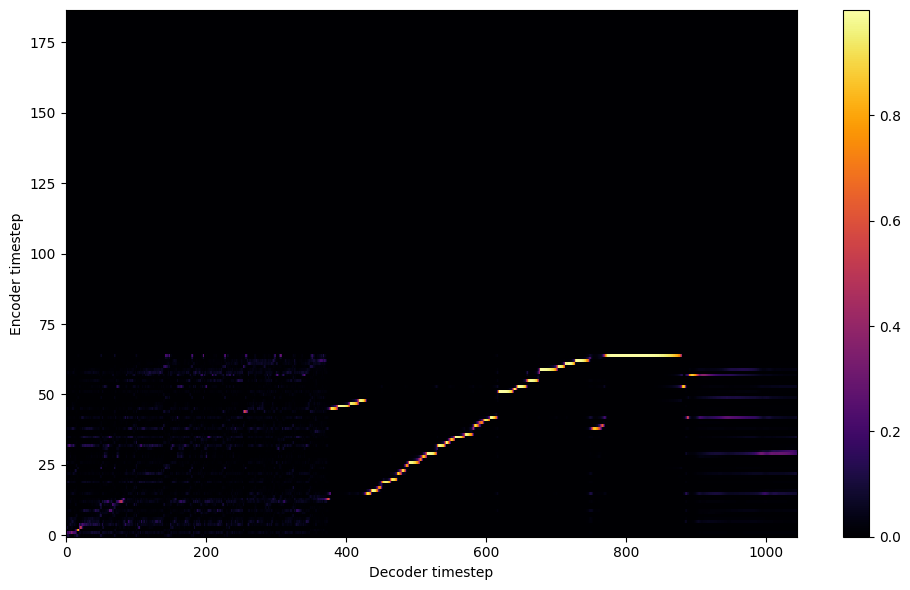


Starting Epoch: 1 Iteration: 4


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1 Validation loss 8:  0.456413  Time: 0.4m LR: 0.000300


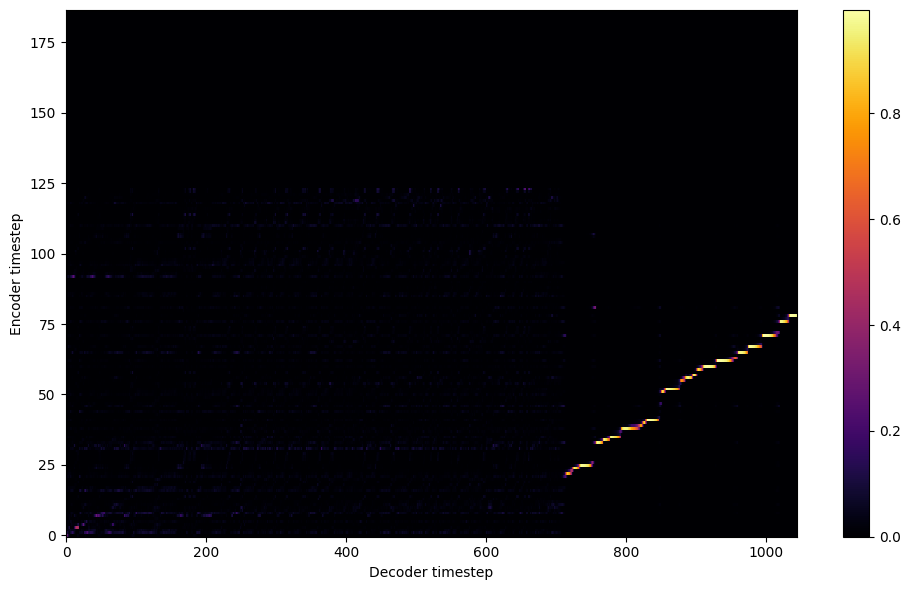


Starting Epoch: 2 Iteration: 8


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 2 Validation loss 12:  0.405007  Time: 0.4m LR: 0.000300


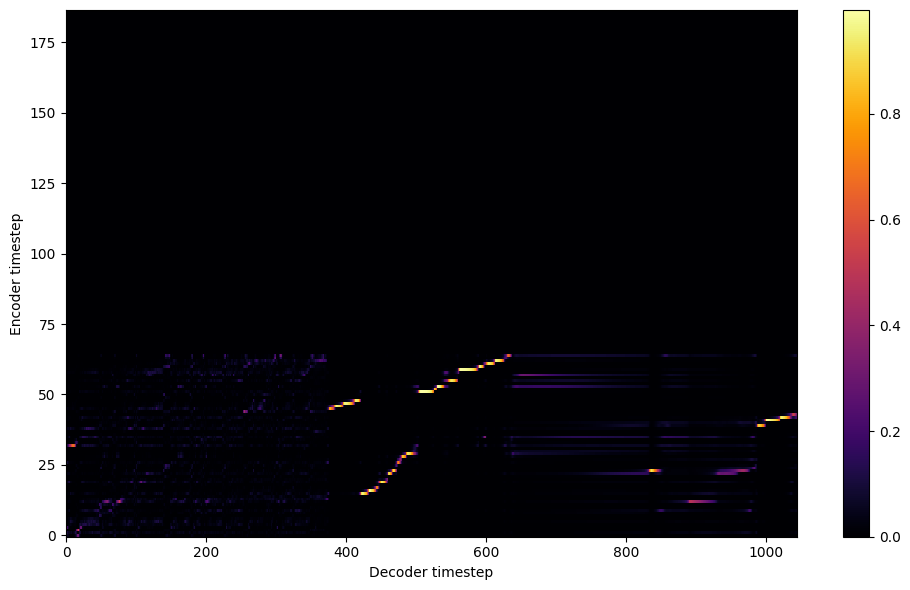


Starting Epoch: 3 Iteration: 12


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 3 Validation loss 16:  0.388989  Time: 0.4m LR: 0.000300


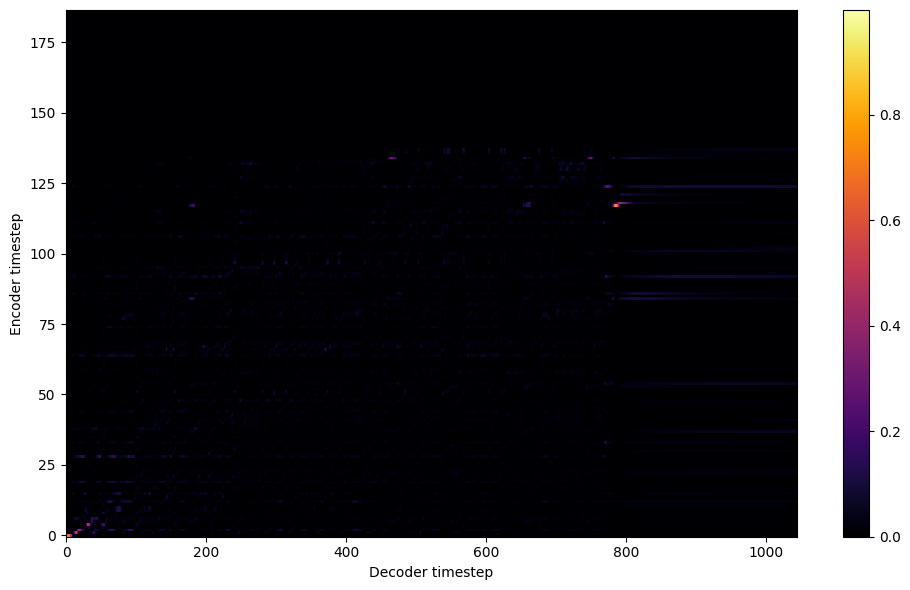


Starting Epoch: 4 Iteration: 16


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 4 Validation loss 20:  0.378856  Time: 0.4m LR: 0.000300


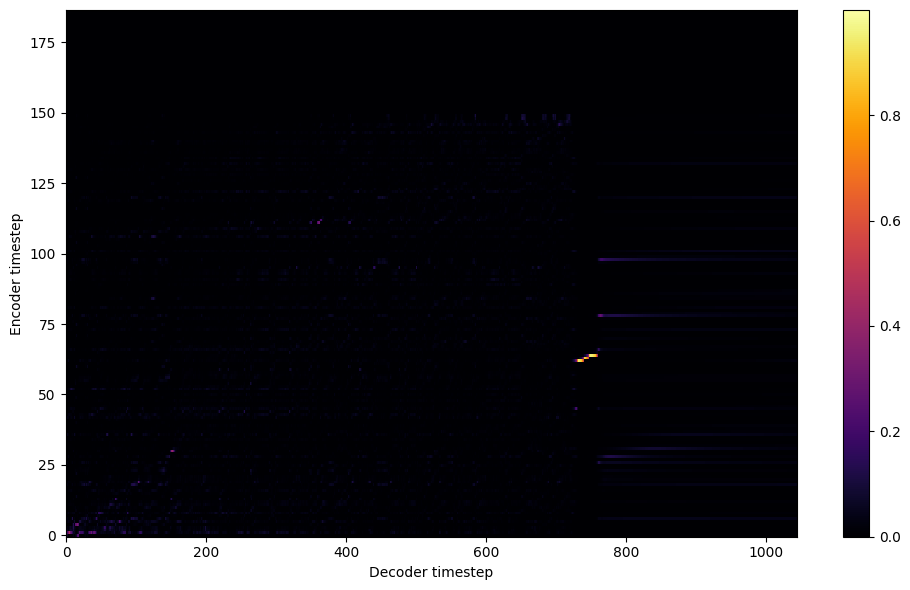


Starting Epoch: 5 Iteration: 20


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 5 Validation loss 24:  0.367720  Time: 0.4m LR: 0.000300


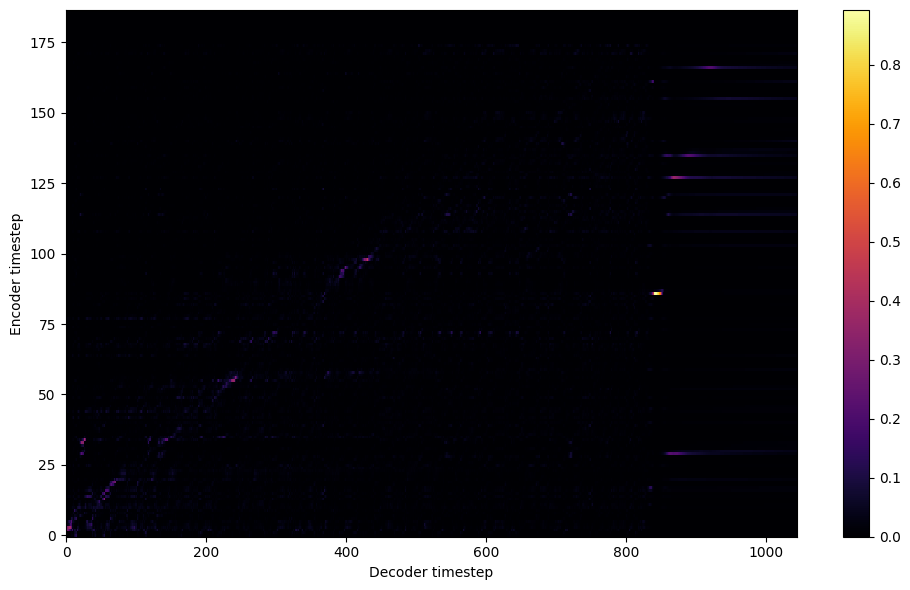


Starting Epoch: 6 Iteration: 24


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 6 Validation loss 28:  0.348503  Time: 0.4m LR: 0.000300


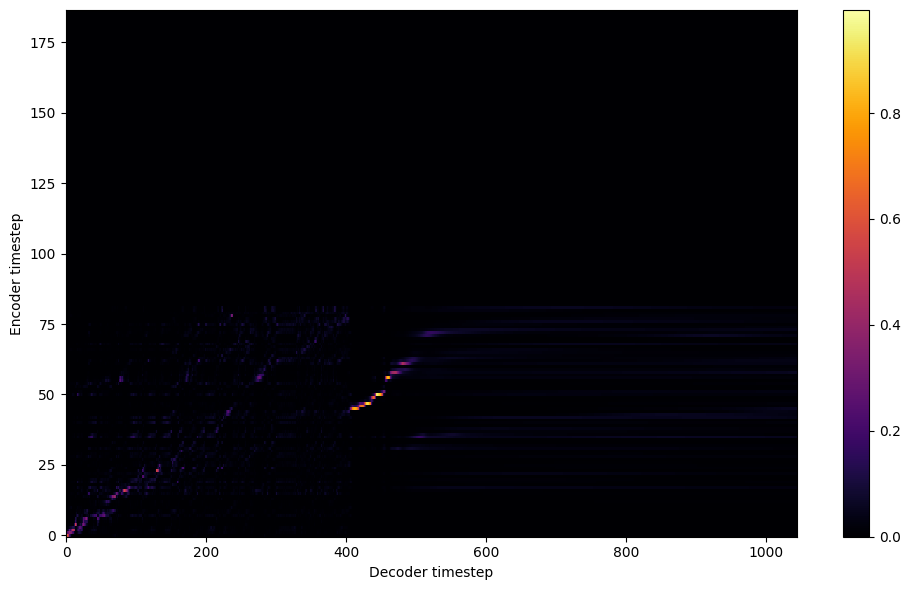


Starting Epoch: 7 Iteration: 28


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 7 Validation loss 32:  0.340587  Time: 0.4m LR: 0.000300


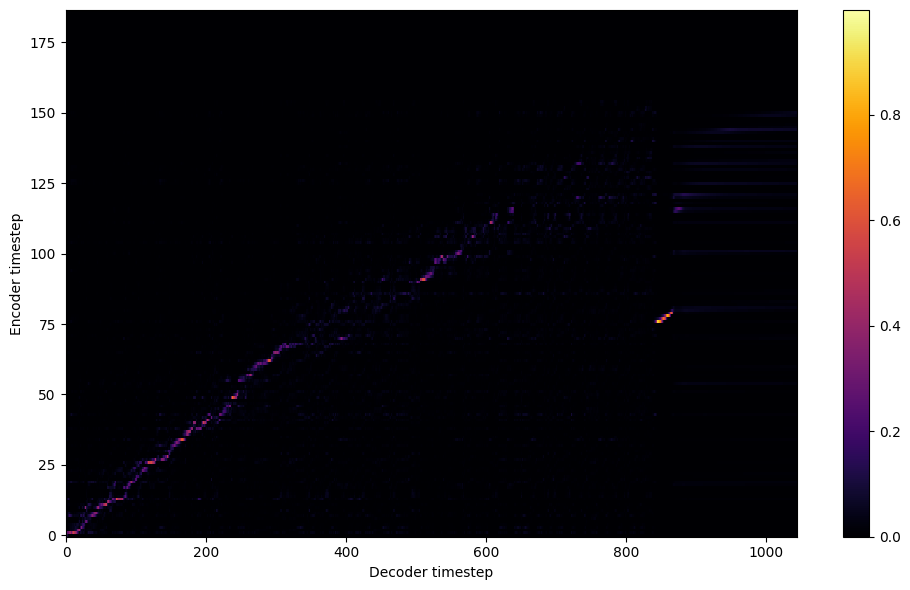


Starting Epoch: 8 Iteration: 32


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 8 Validation loss 36:  0.329231  Time: 0.4m LR: 0.000300


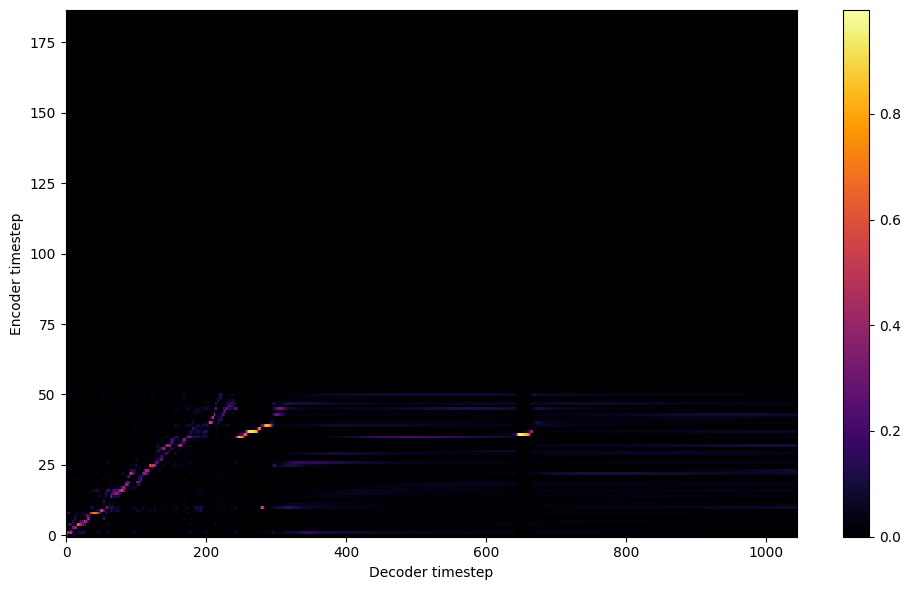


Starting Epoch: 9 Iteration: 36


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 9 Validation loss 40:  0.318755  Time: 0.4m LR: 0.000300


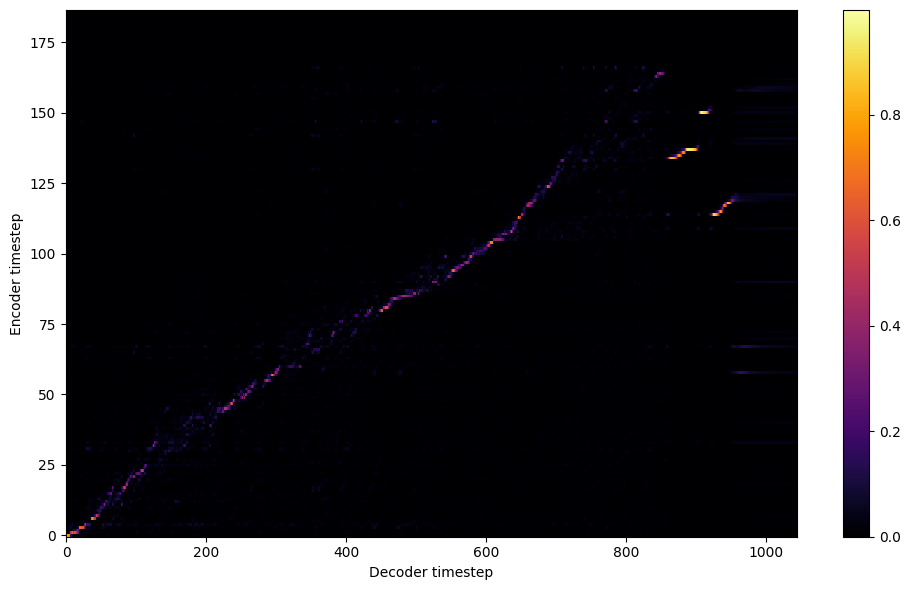

Saving model and optimizer state at iteration 40 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 10 Iteration: 40


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 10 Validation loss 44:  0.322464  Time: 0.4m LR: 0.000300


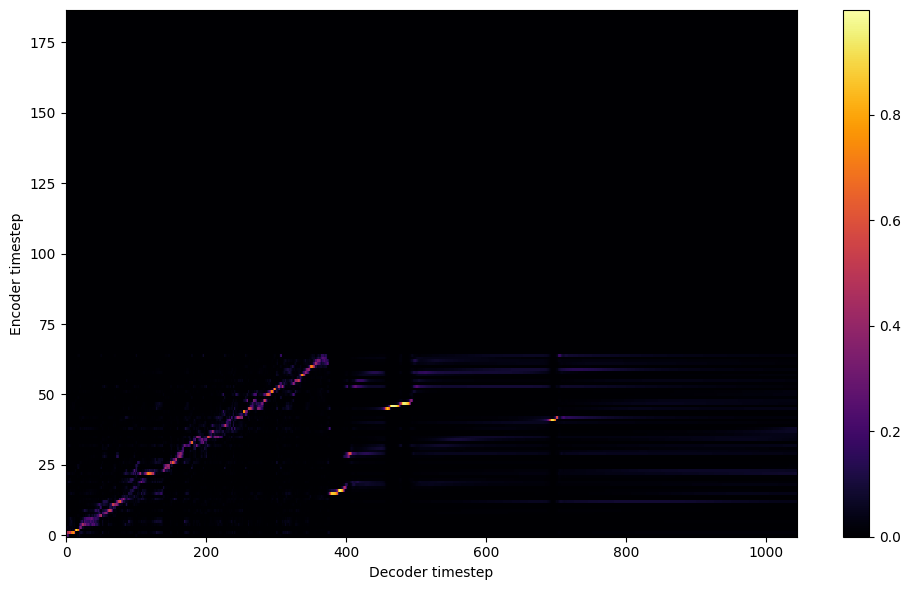


Starting Epoch: 11 Iteration: 44


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 11 Validation loss 48:  0.307571  Time: 0.4m LR: 0.000300


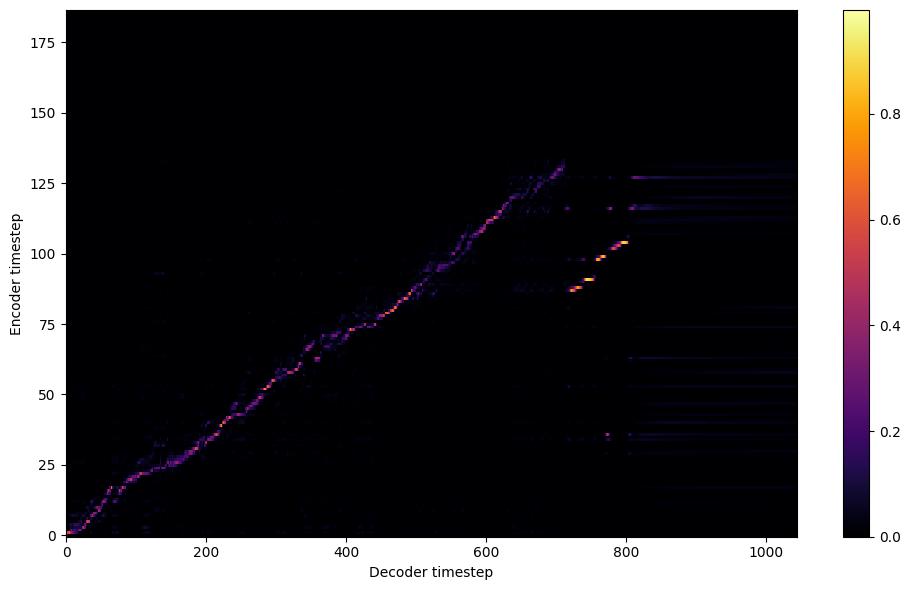


Starting Epoch: 12 Iteration: 48


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 12 Validation loss 52:  0.302337  Time: 0.4m LR: 0.000300


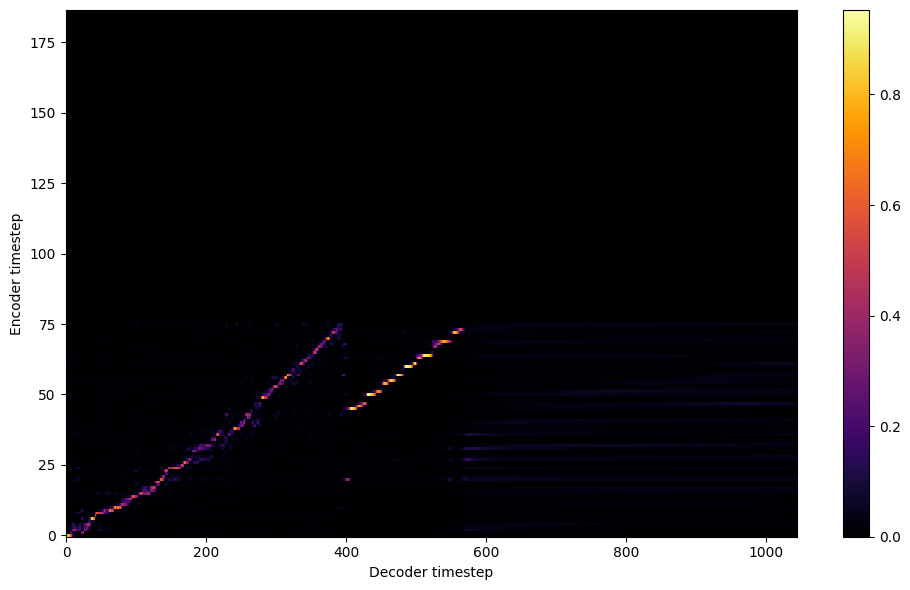


Starting Epoch: 13 Iteration: 52


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 13 Validation loss 56:  0.297137  Time: 0.4m LR: 0.000300


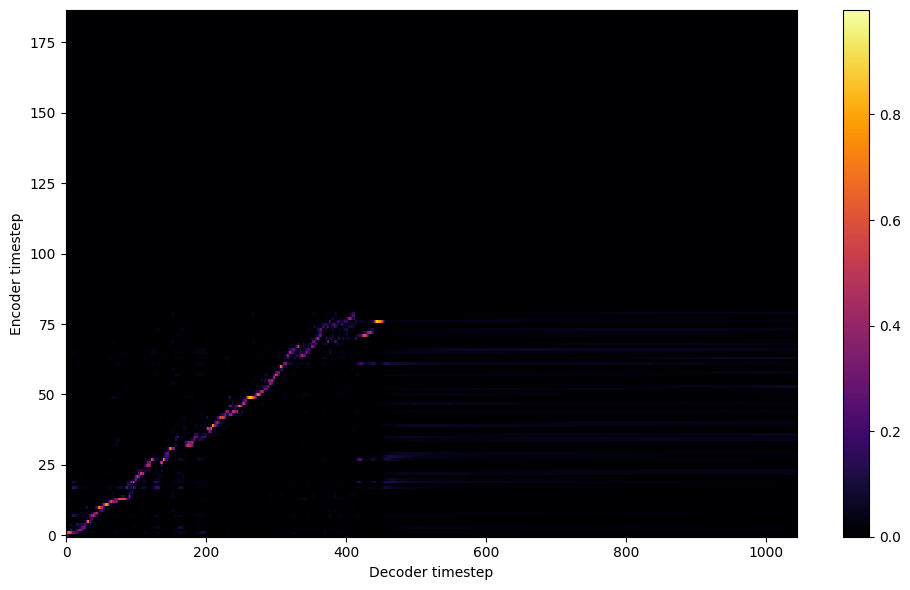


Starting Epoch: 14 Iteration: 56


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 14 Validation loss 60:  0.292570  Time: 0.4m LR: 0.000300


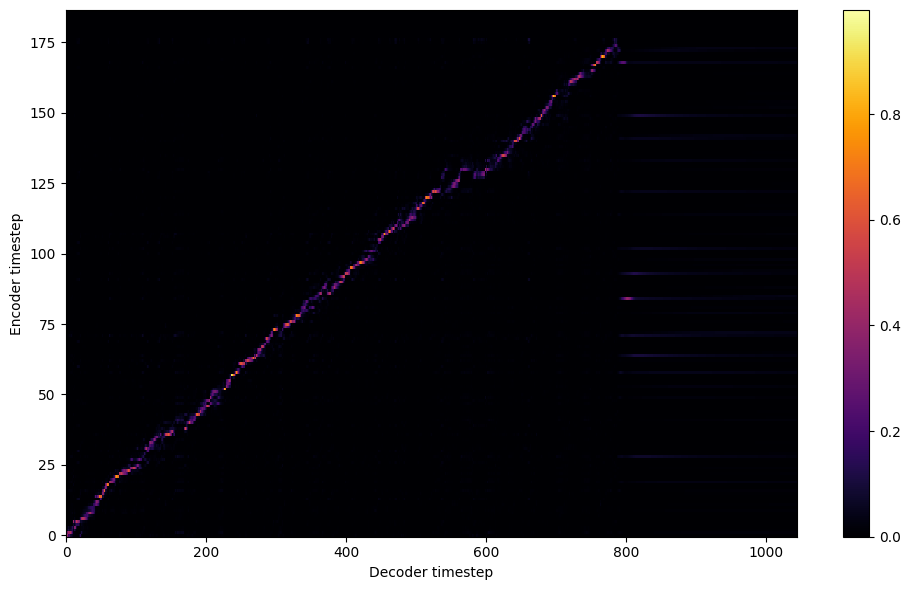


Starting Epoch: 15 Iteration: 60


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 15 Validation loss 64:  0.284372  Time: 0.4m LR: 0.000300


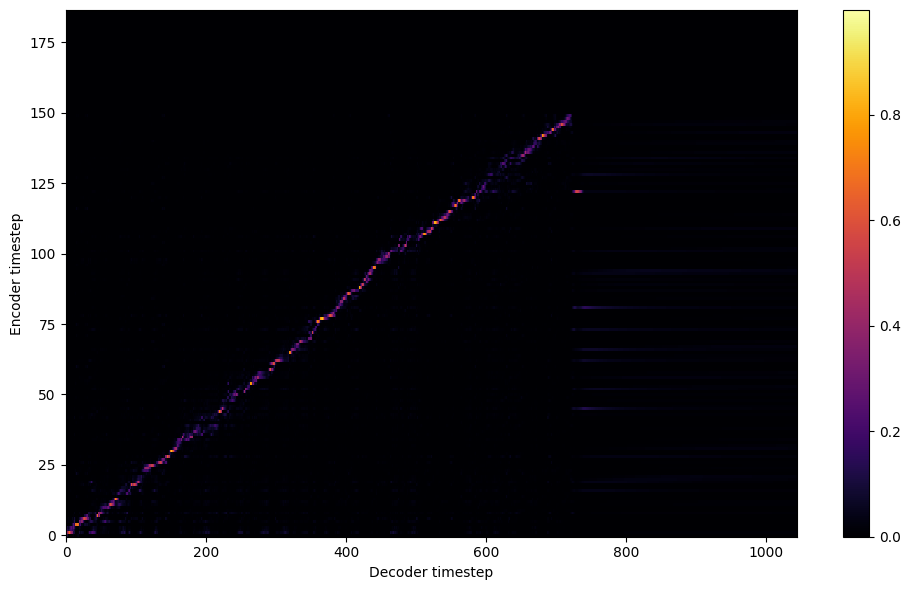


Starting Epoch: 16 Iteration: 64


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 16 Validation loss 68:  0.281298  Time: 0.4m LR: 0.000300


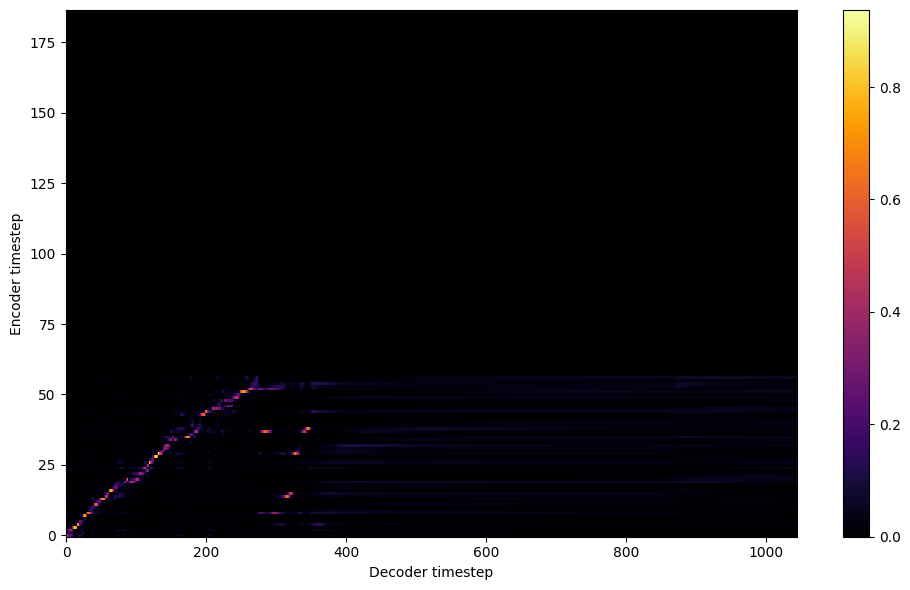


Starting Epoch: 17 Iteration: 68


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 17 Validation loss 72:  0.275873  Time: 0.4m LR: 0.000300


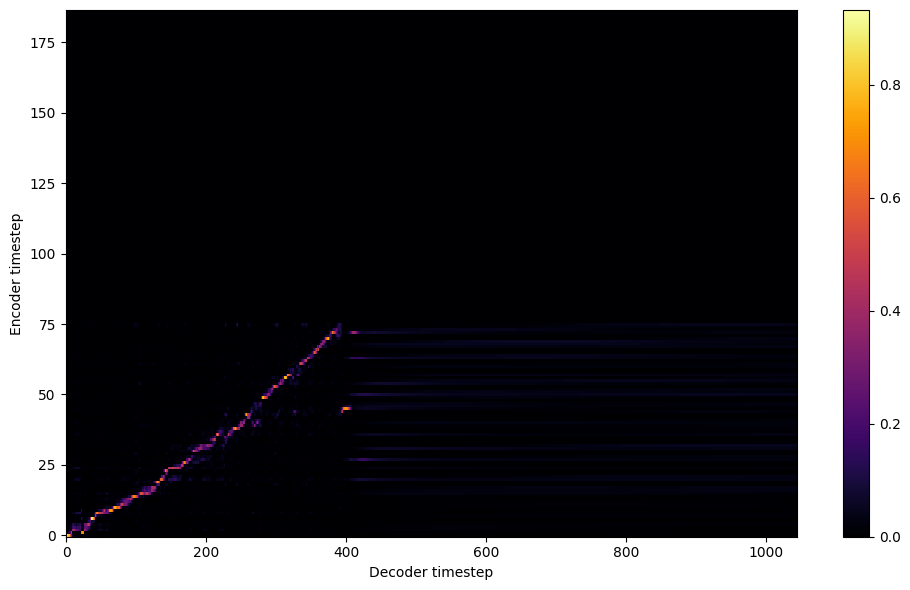


Starting Epoch: 18 Iteration: 72


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 18 Validation loss 76:  0.271644  Time: 0.4m LR: 0.000300


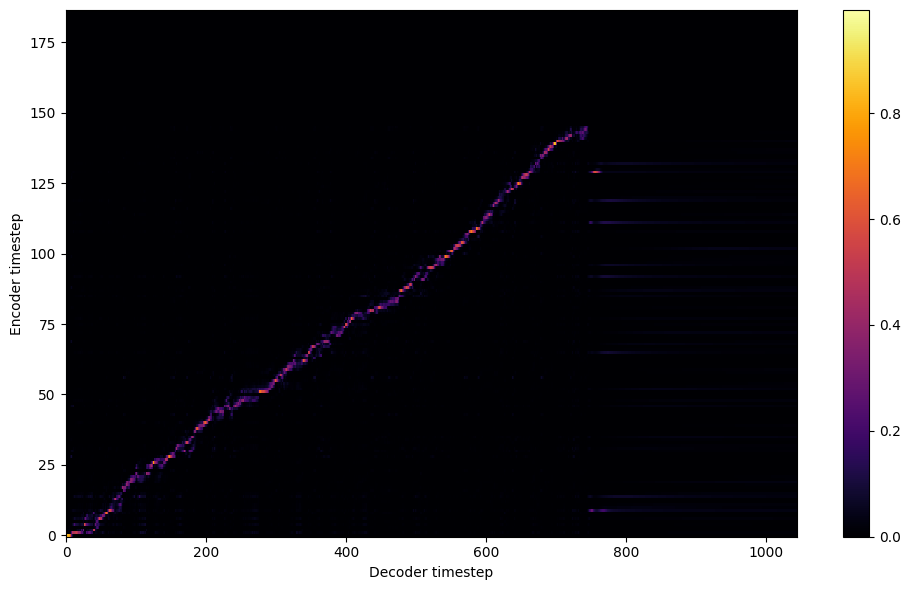


Starting Epoch: 19 Iteration: 76


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 19 Validation loss 80:  0.271262  Time: 0.4m LR: 0.000300


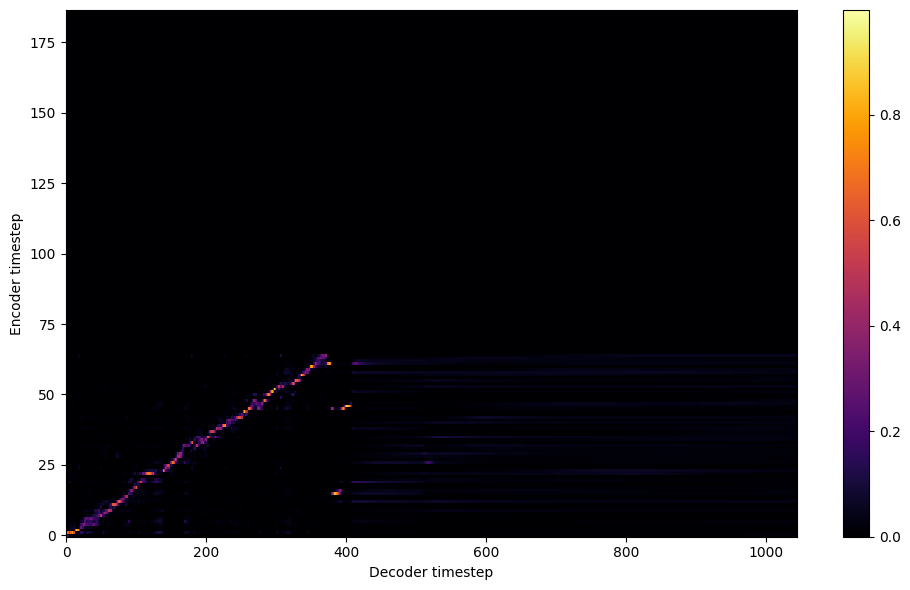

Saving model and optimizer state at iteration 80 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 20 Iteration: 80


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 20 Validation loss 84:  0.265456  Time: 0.4m LR: 0.000300


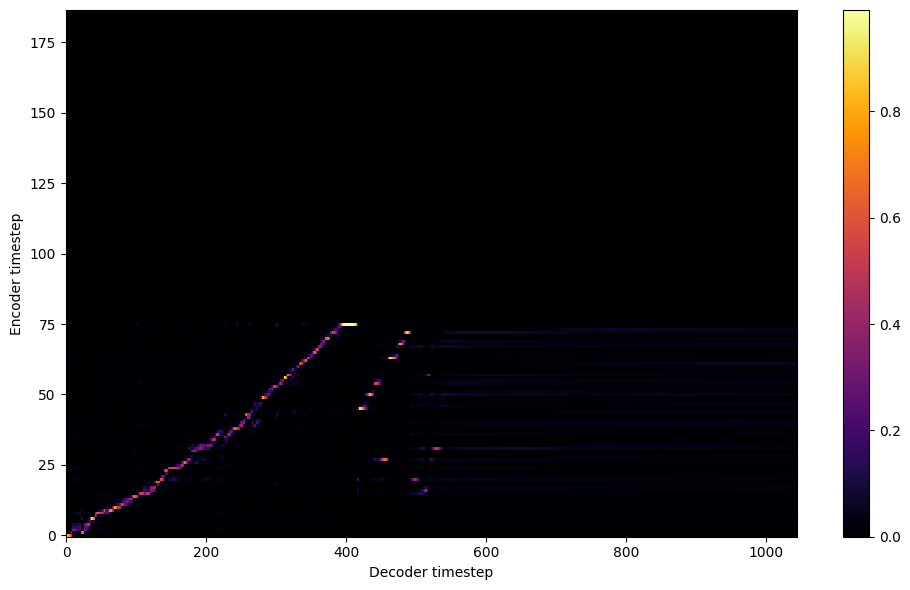


Starting Epoch: 21 Iteration: 84


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 21 Validation loss 88:  0.262229  Time: 0.4m LR: 0.000300


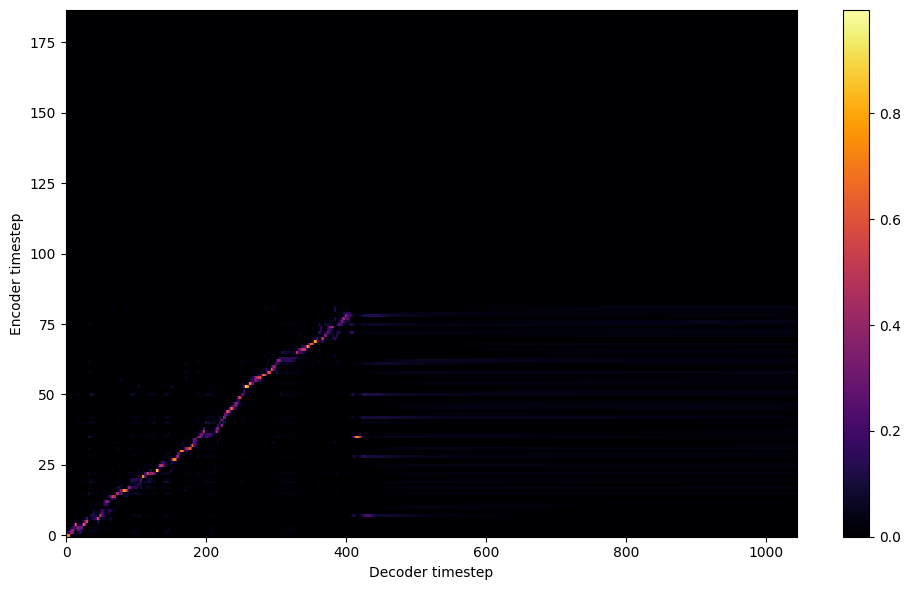


Starting Epoch: 22 Iteration: 88


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 22 Validation loss 92:  0.263777  Time: 0.4m LR: 0.000300


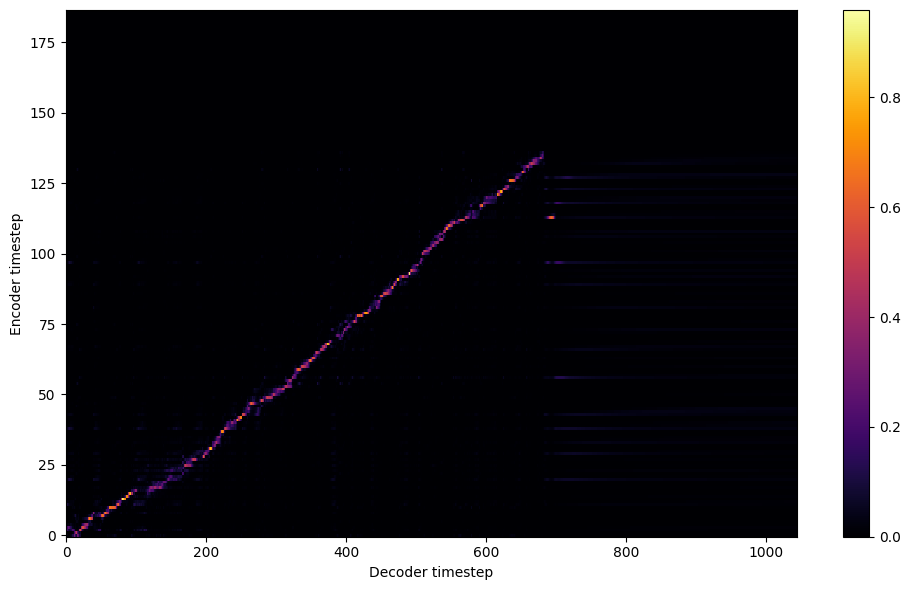


Starting Epoch: 23 Iteration: 92


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 23 Validation loss 96:  0.256933  Time: 0.4m LR: 0.000300


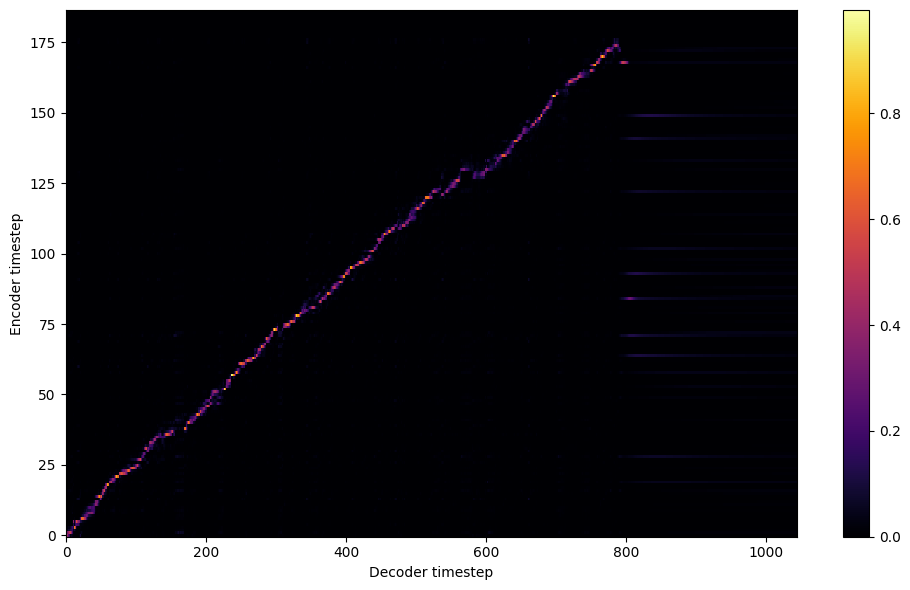


Starting Epoch: 24 Iteration: 96


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 24 Validation loss 100:  0.256106  Time: 0.4m LR: 0.000300


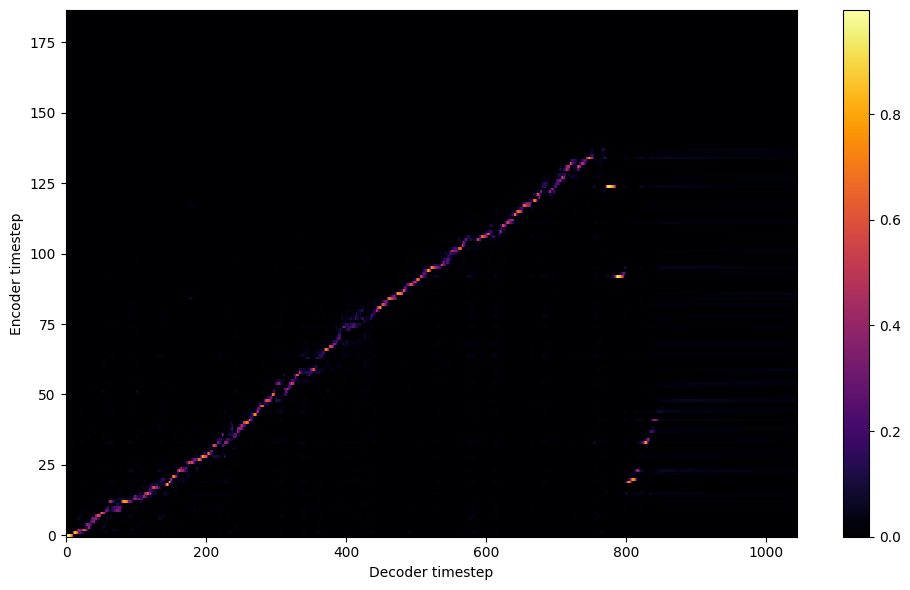


Starting Epoch: 25 Iteration: 100


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 25 Validation loss 104:  0.252888  Time: 0.4m LR: 0.000300


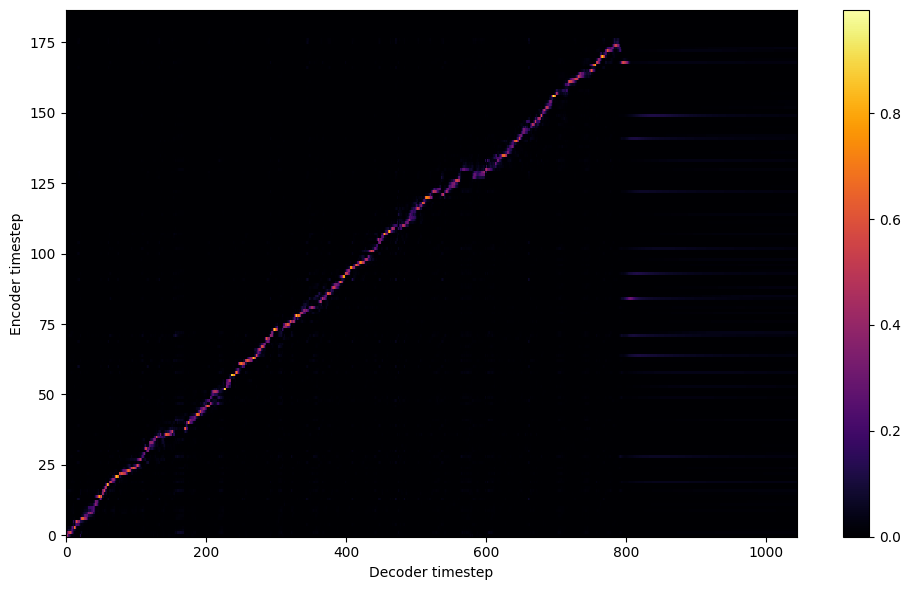


Starting Epoch: 26 Iteration: 104


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 26 Validation loss 108:  0.251655  Time: 0.4m LR: 0.000300


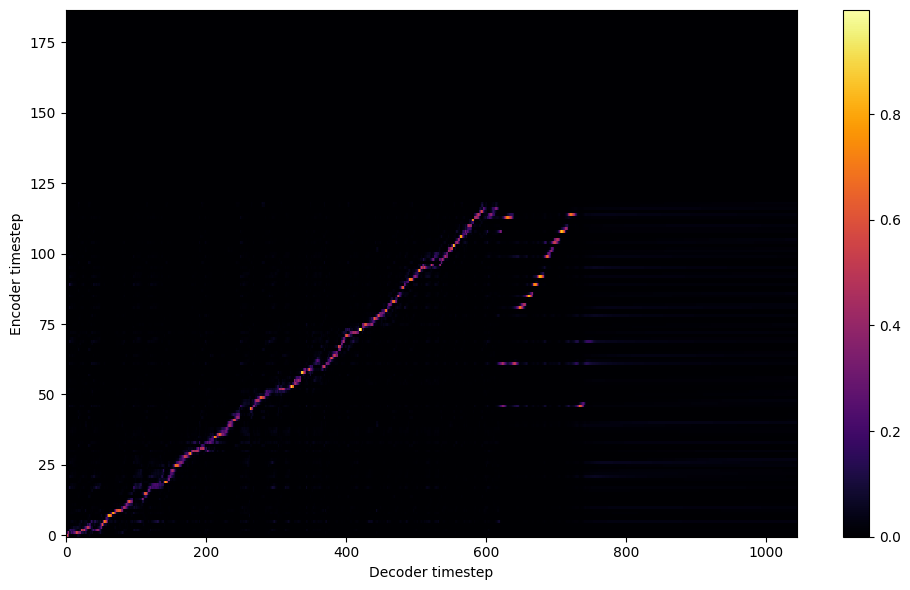


Starting Epoch: 27 Iteration: 108


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 27 Validation loss 112:  0.247440  Time: 0.4m LR: 0.000300


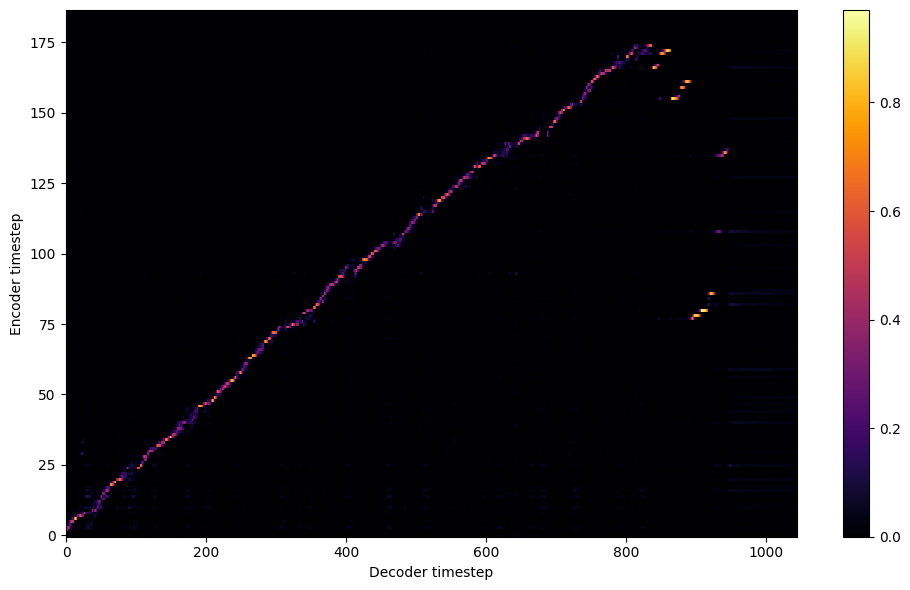


Starting Epoch: 28 Iteration: 112


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 28 Validation loss 116:  0.262034  Time: 0.4m LR: 0.000300


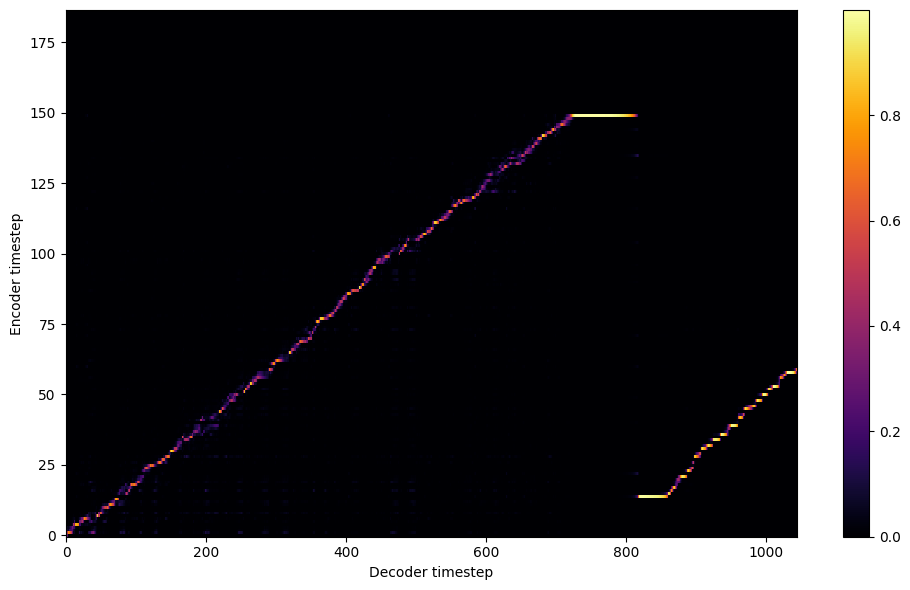


Starting Epoch: 29 Iteration: 116


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 29 Validation loss 120:  0.249456  Time: 0.4m LR: 0.000300


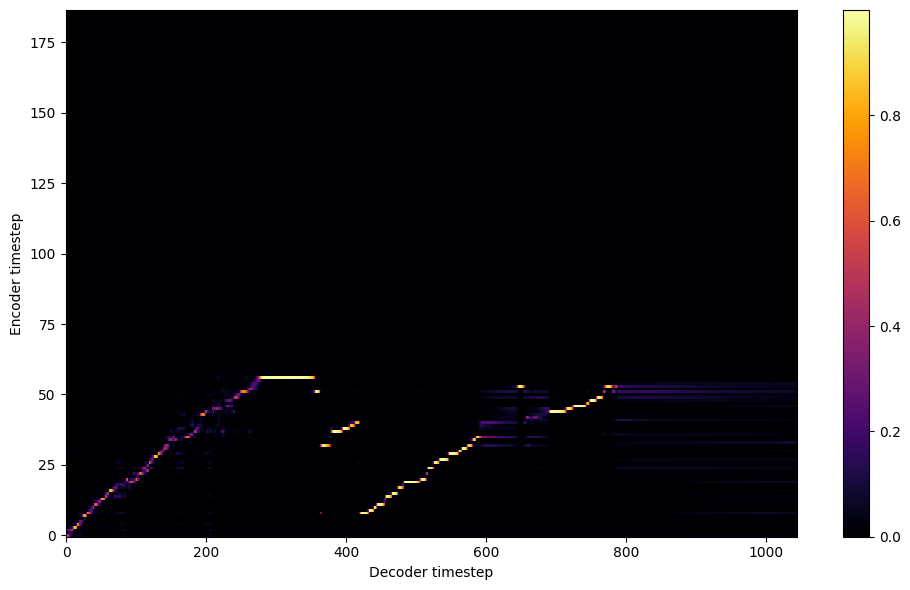

Saving model and optimizer state at iteration 120 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 30 Iteration: 120


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 30 Validation loss 124:  0.246988  Time: 0.4m LR: 0.000300


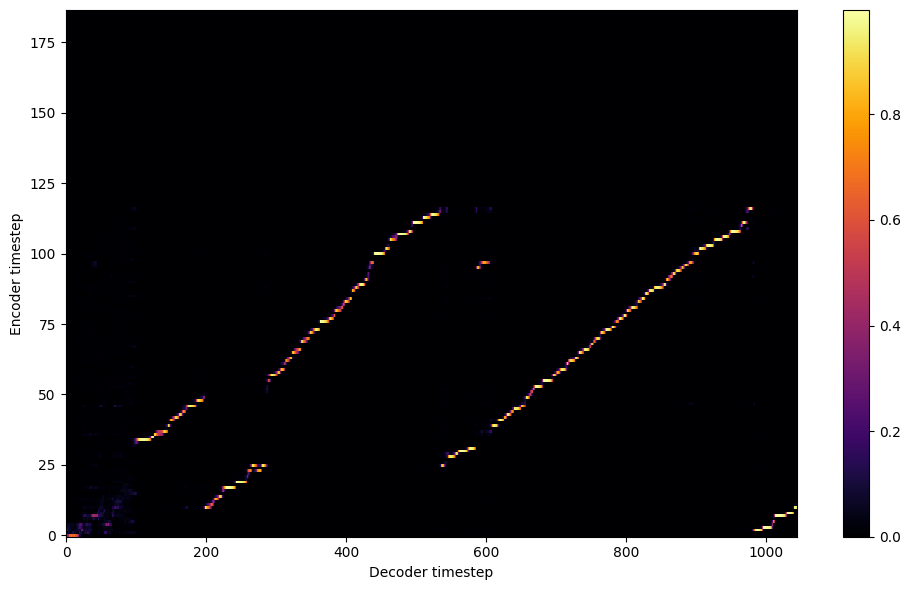


Starting Epoch: 31 Iteration: 124


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 31 Validation loss 128:  0.246658  Time: 0.4m LR: 0.000300


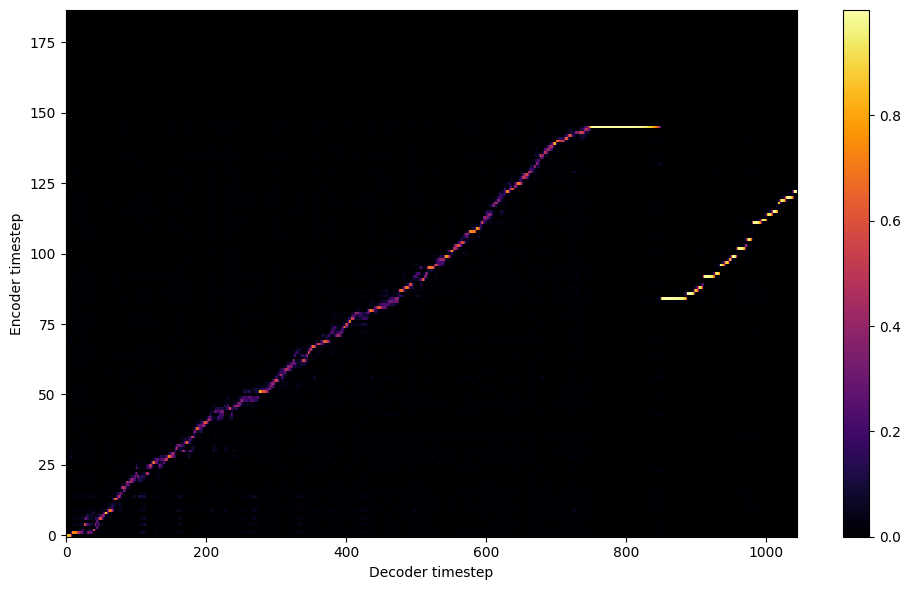


Starting Epoch: 32 Iteration: 128


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 32 Validation loss 132:  0.245153  Time: 0.4m LR: 0.000300


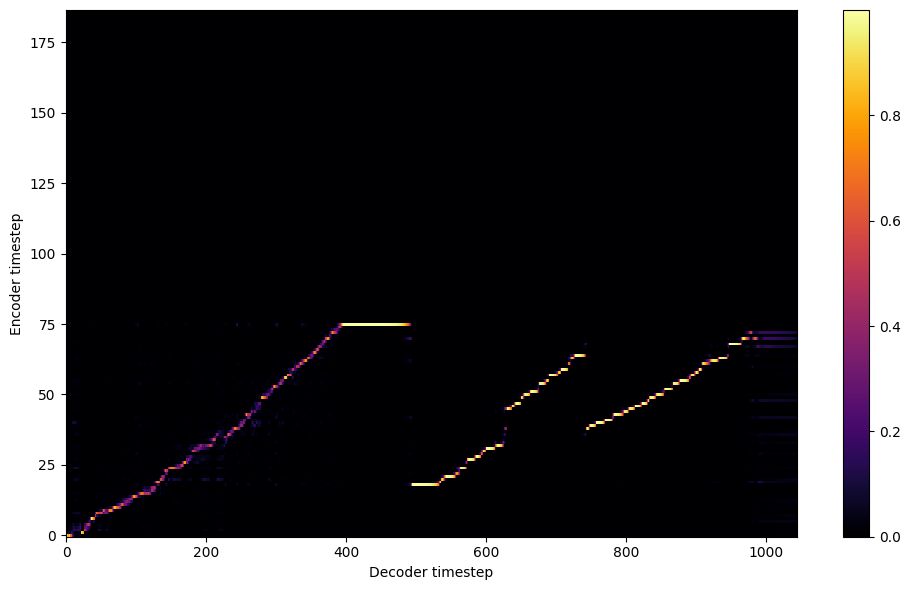


Starting Epoch: 33 Iteration: 132


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 33 Validation loss 136:  0.243156  Time: 0.4m LR: 0.000300


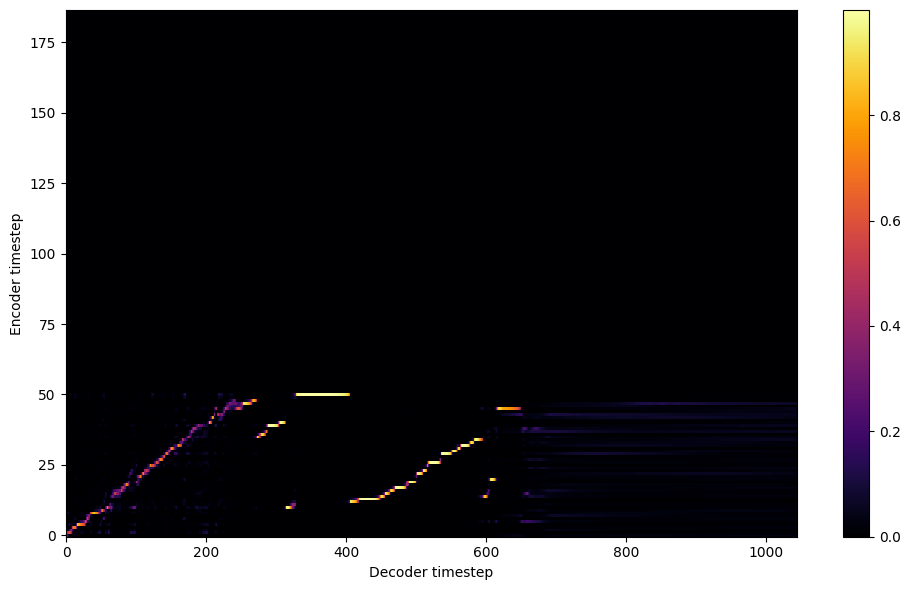


Starting Epoch: 34 Iteration: 136


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 34 Validation loss 140:  0.236612  Time: 0.4m LR: 0.000300


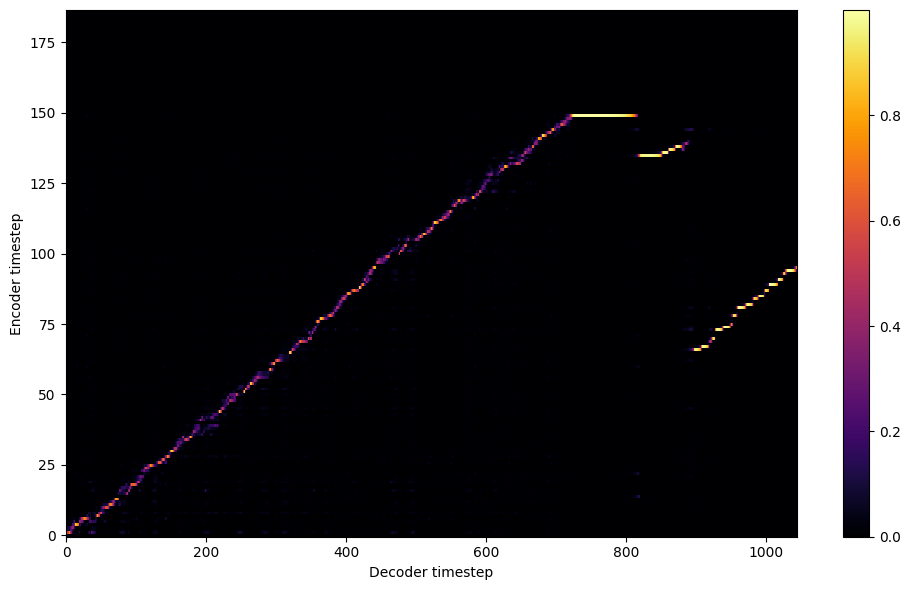


Starting Epoch: 35 Iteration: 140


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 35 Validation loss 144:  0.235582  Time: 0.4m LR: 0.000300


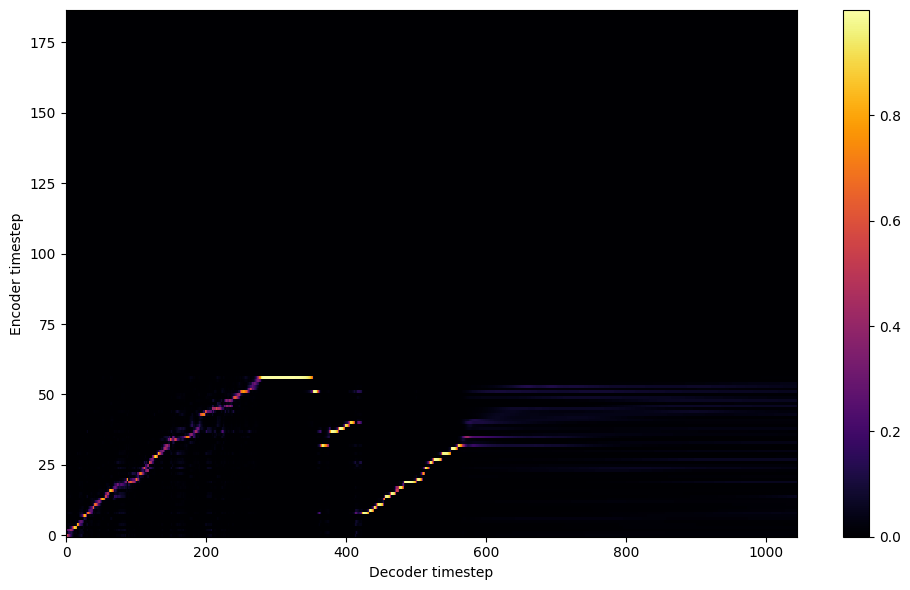


Starting Epoch: 36 Iteration: 144


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 36 Validation loss 148:  0.235233  Time: 0.4m LR: 0.000300


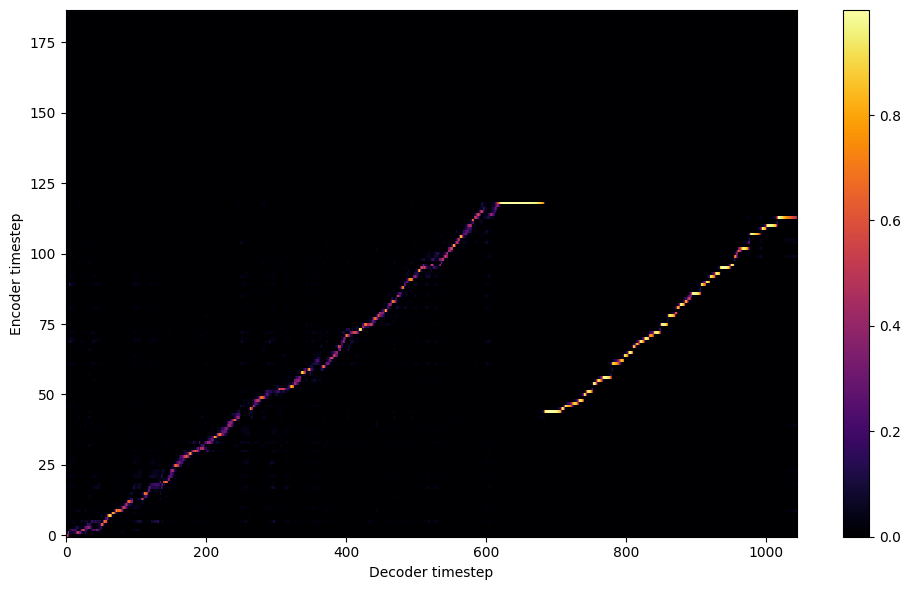


Starting Epoch: 37 Iteration: 148


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 37 Validation loss 152:  0.235244  Time: 0.4m LR: 0.000300


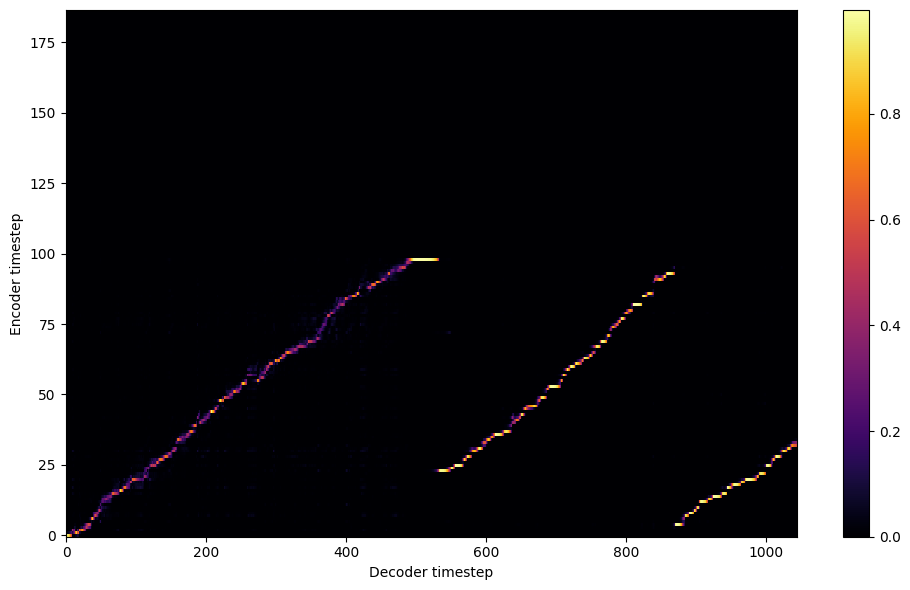


Starting Epoch: 38 Iteration: 152


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 38 Validation loss 156:  0.232519  Time: 0.4m LR: 0.000300


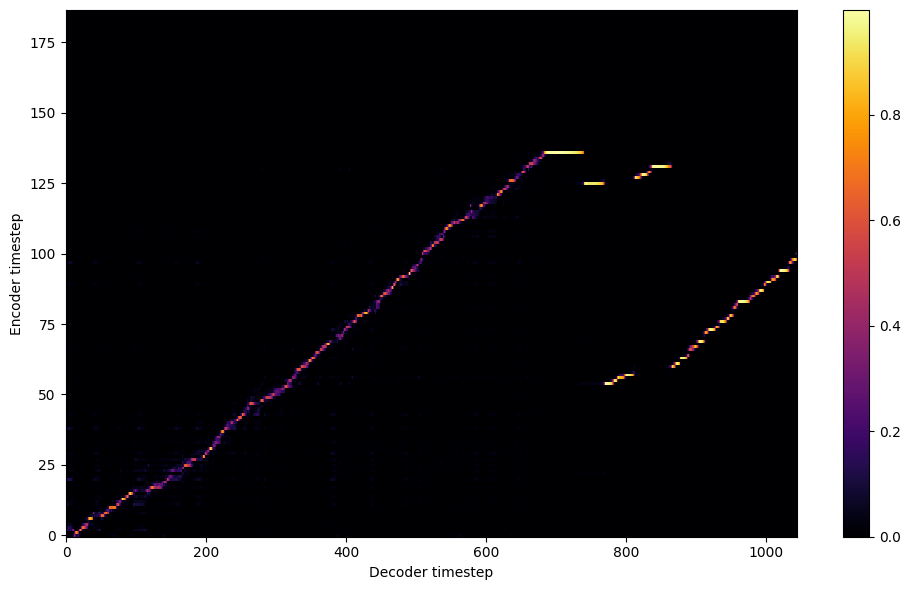


Starting Epoch: 39 Iteration: 156


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 39 Validation loss 160:  0.229902  Time: 0.4m LR: 0.000300


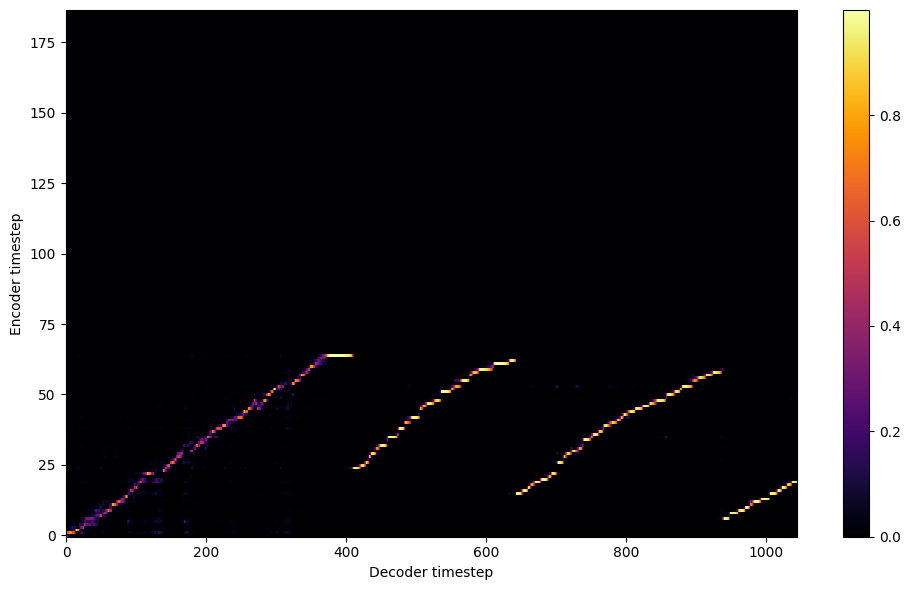

Saving model and optimizer state at iteration 160 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 40 Iteration: 160


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 40 Validation loss 164:  0.232932  Time: 0.4m LR: 0.000300


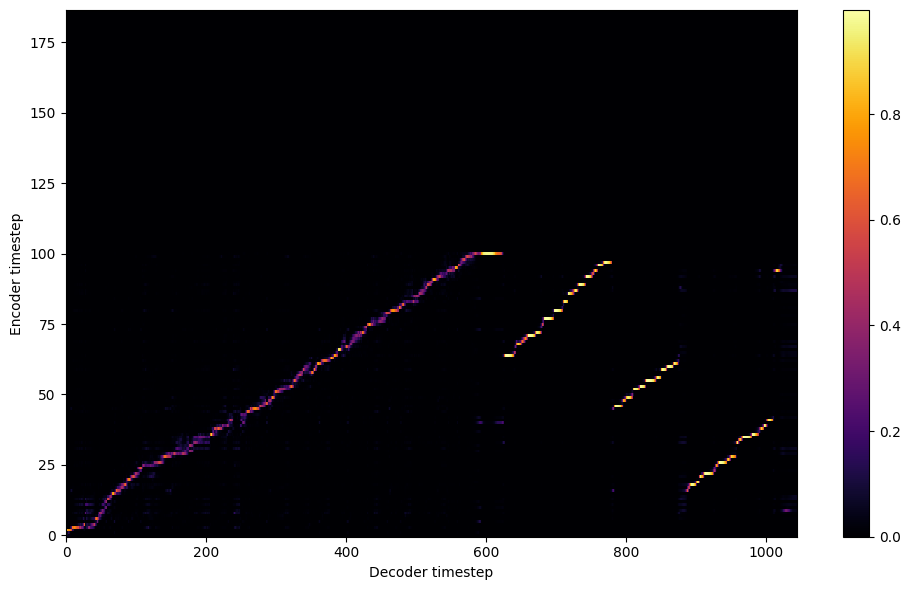


Starting Epoch: 41 Iteration: 164


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 41 Validation loss 168:  0.231694  Time: 0.4m LR: 0.000300


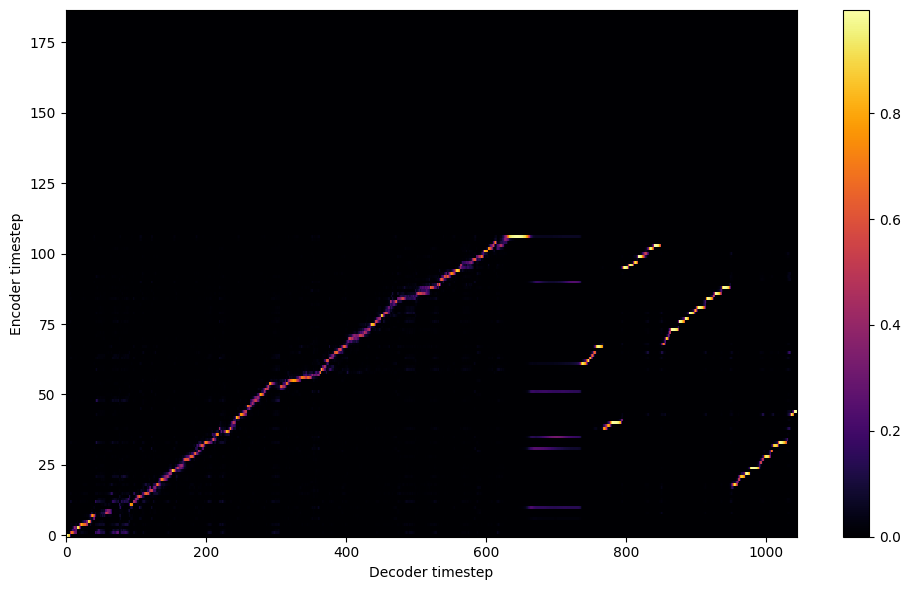


Starting Epoch: 42 Iteration: 168


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 42 Validation loss 172:  0.233900  Time: 0.4m LR: 0.000300


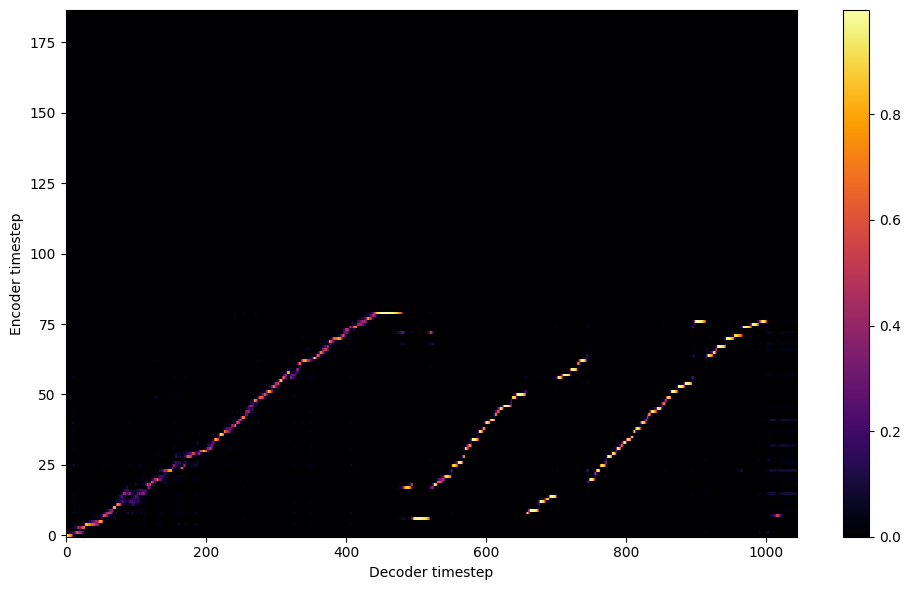


Starting Epoch: 43 Iteration: 172


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 43 Validation loss 176:  0.227017  Time: 0.4m LR: 0.000300


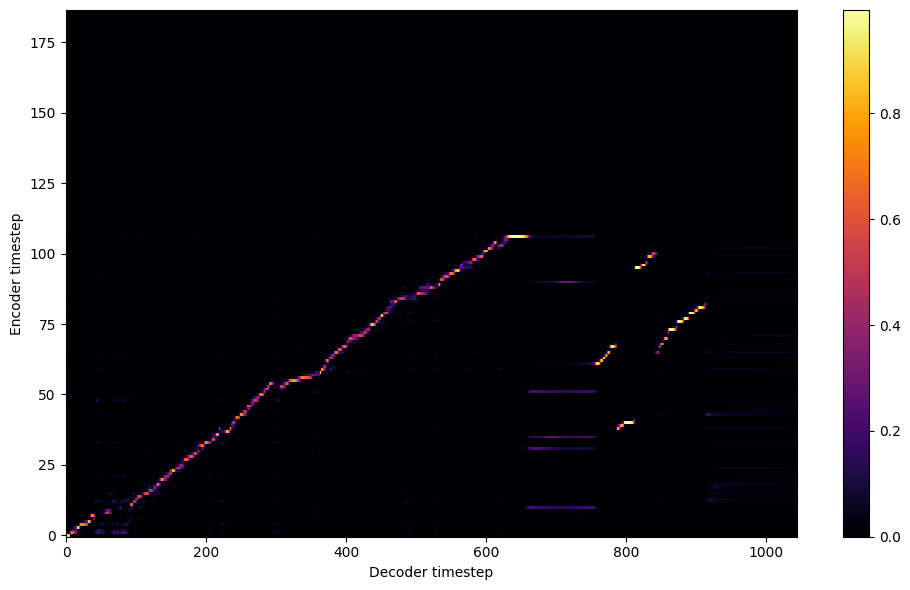


Starting Epoch: 44 Iteration: 176


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 44 Validation loss 180:  0.224533  Time: 0.4m LR: 0.000300


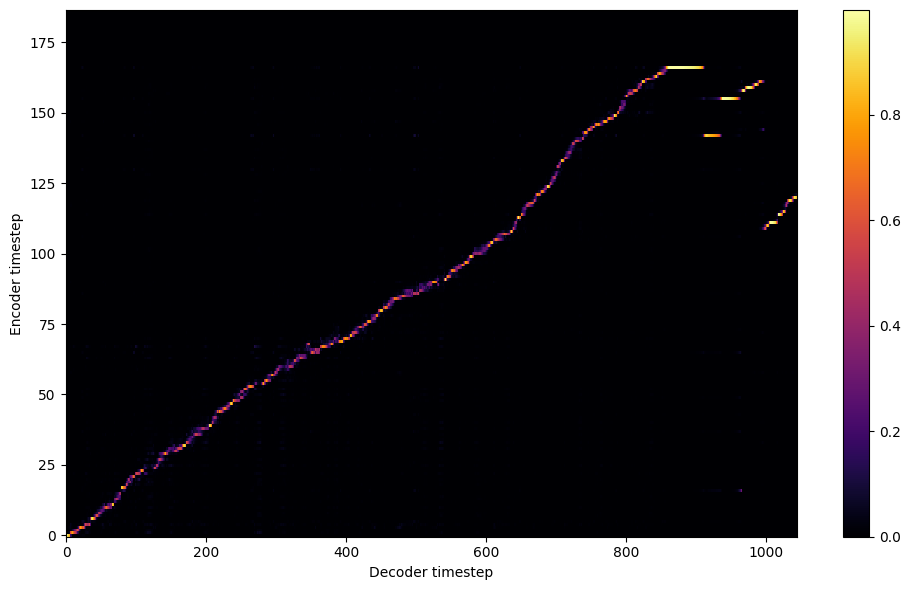


Starting Epoch: 45 Iteration: 180


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 45 Validation loss 184:  0.226664  Time: 0.4m LR: 0.000300


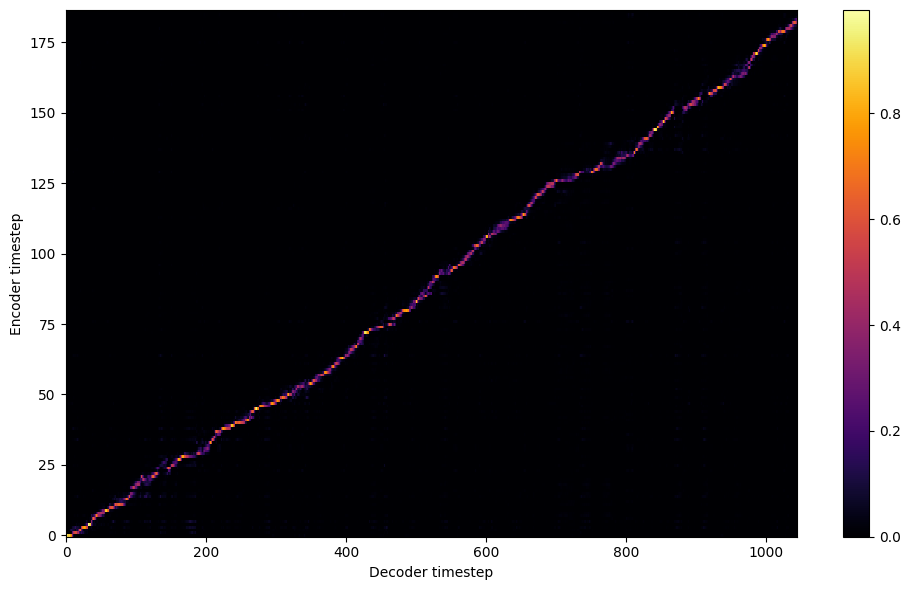


Starting Epoch: 46 Iteration: 184


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 46 Validation loss 188:  0.227834  Time: 0.4m LR: 0.000300


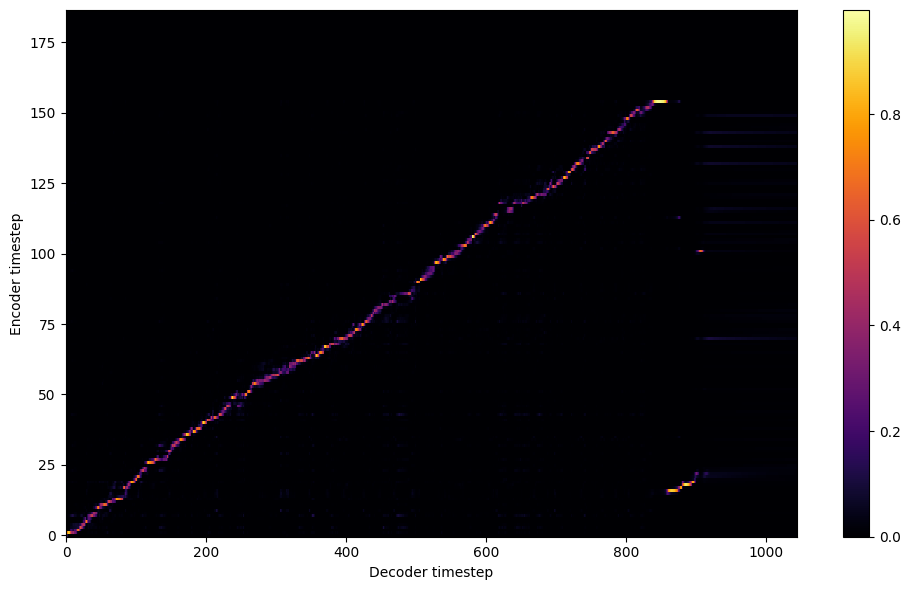


Starting Epoch: 47 Iteration: 188


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 47 Validation loss 192:  0.227940  Time: 0.4m LR: 0.000300


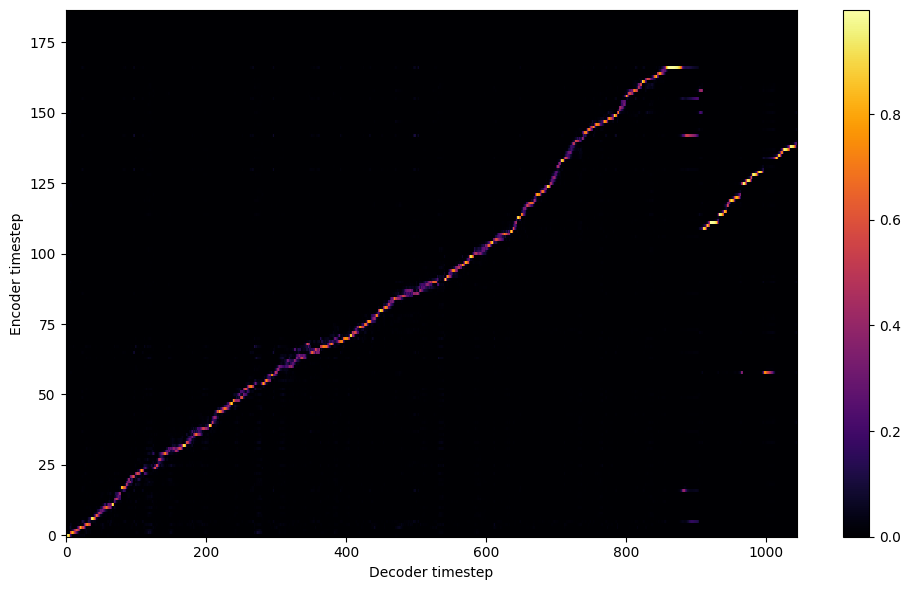


Starting Epoch: 48 Iteration: 192


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 48 Validation loss 196:  0.226906  Time: 0.4m LR: 0.000300


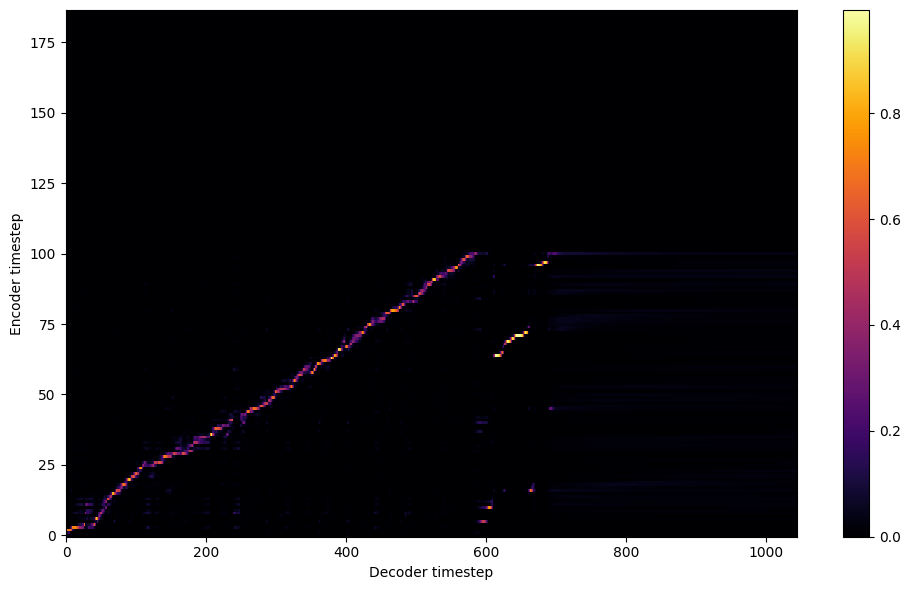


Starting Epoch: 49 Iteration: 196


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 49 Validation loss 200:  0.223709  Time: 0.4m LR: 0.000300


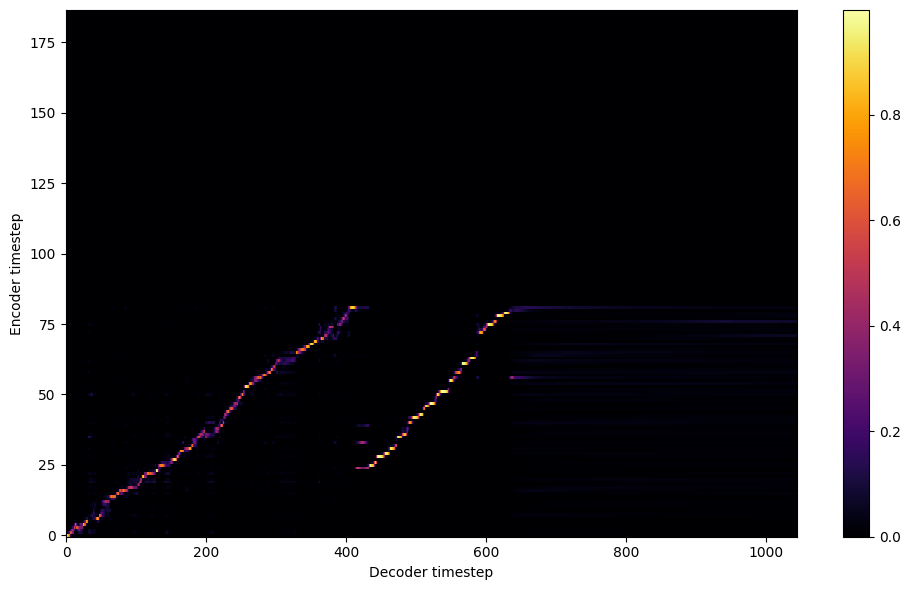

Saving model and optimizer state at iteration 200 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 50 Iteration: 200


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 50 Validation loss 204:  0.217036  Time: 0.4m LR: 0.000300


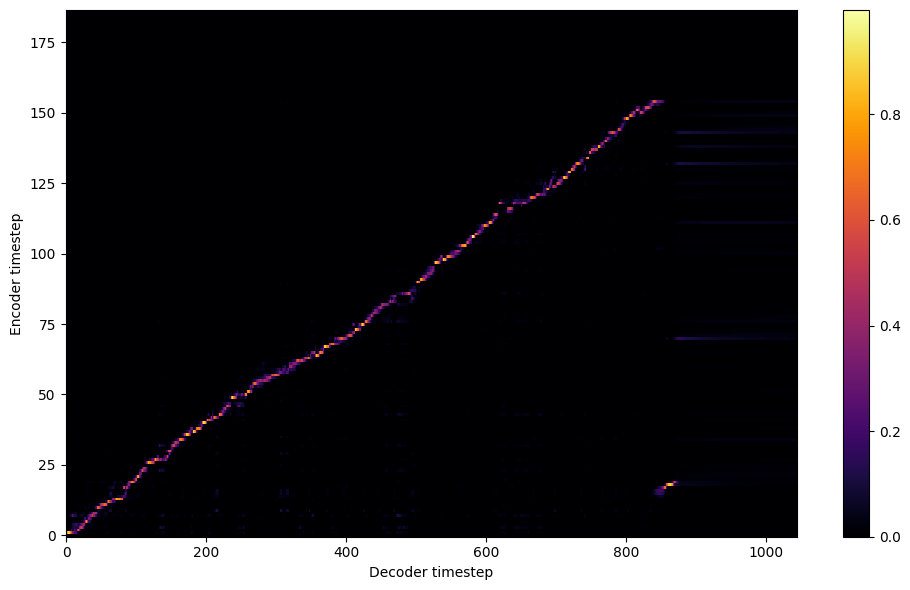


Starting Epoch: 51 Iteration: 204


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 51 Validation loss 208:  0.216543  Time: 0.4m LR: 0.000300


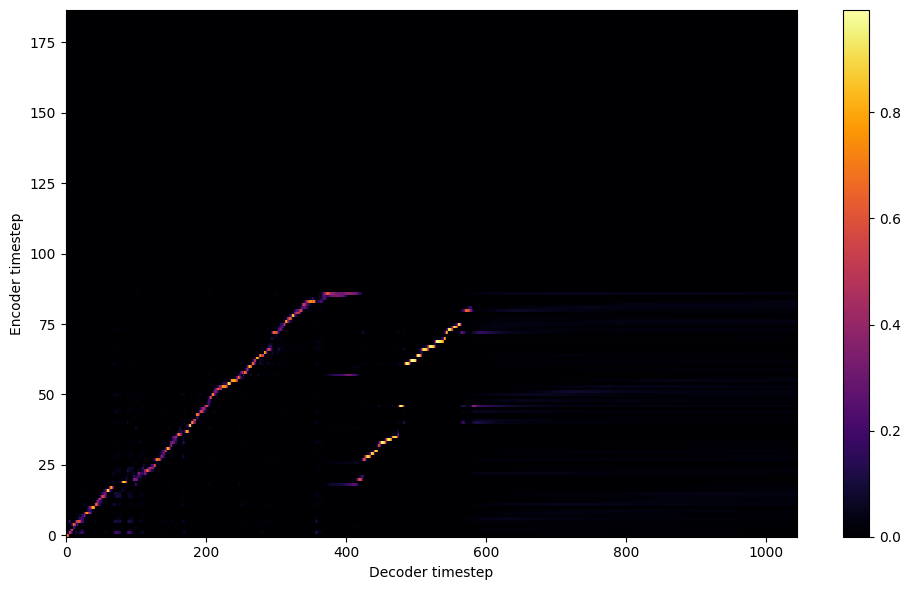


Starting Epoch: 52 Iteration: 208


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 52 Validation loss 212:  0.218274  Time: 0.4m LR: 0.000300


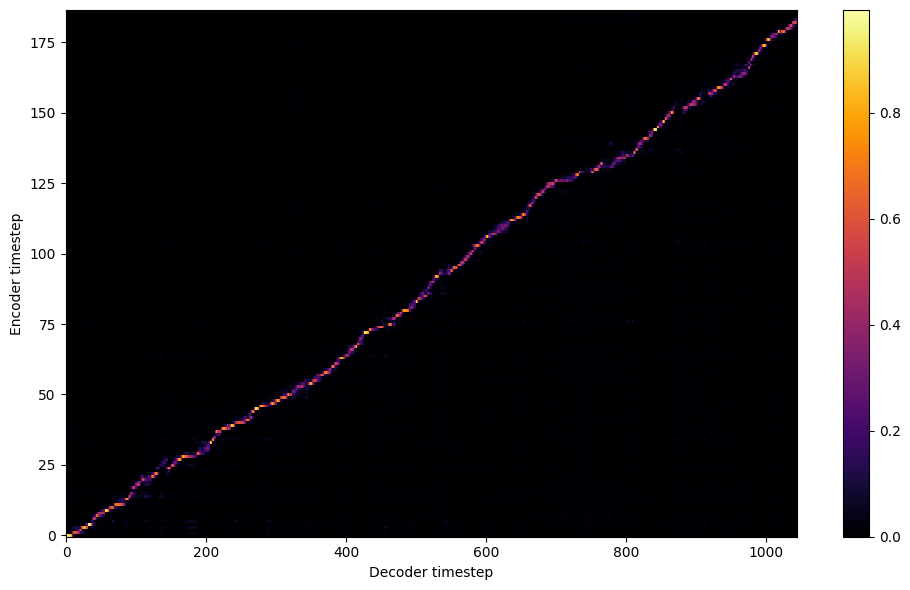


Starting Epoch: 53 Iteration: 212


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 53 Validation loss 216:  0.216531  Time: 0.4m LR: 0.000300


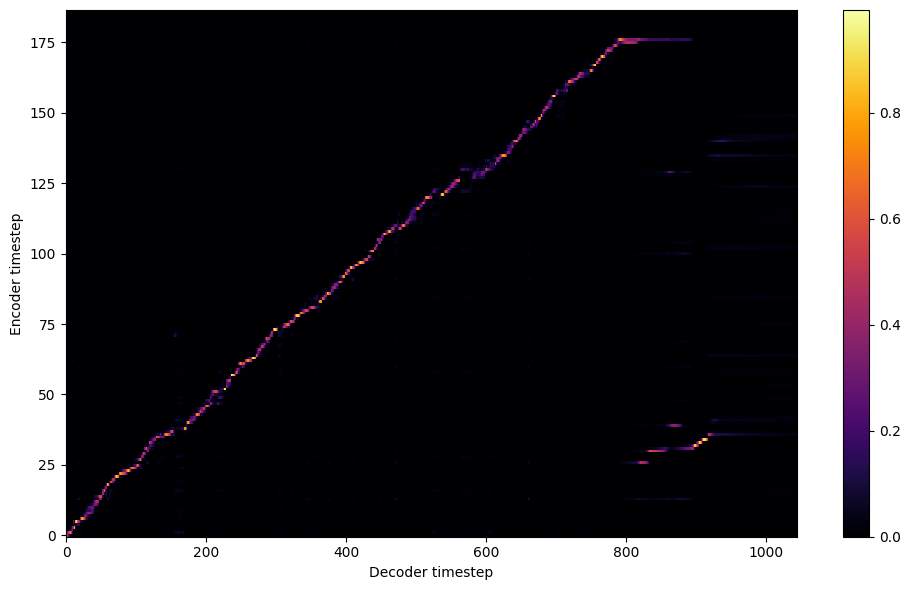


Starting Epoch: 54 Iteration: 216


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 54 Validation loss 220:  0.210345  Time: 0.4m LR: 0.000300


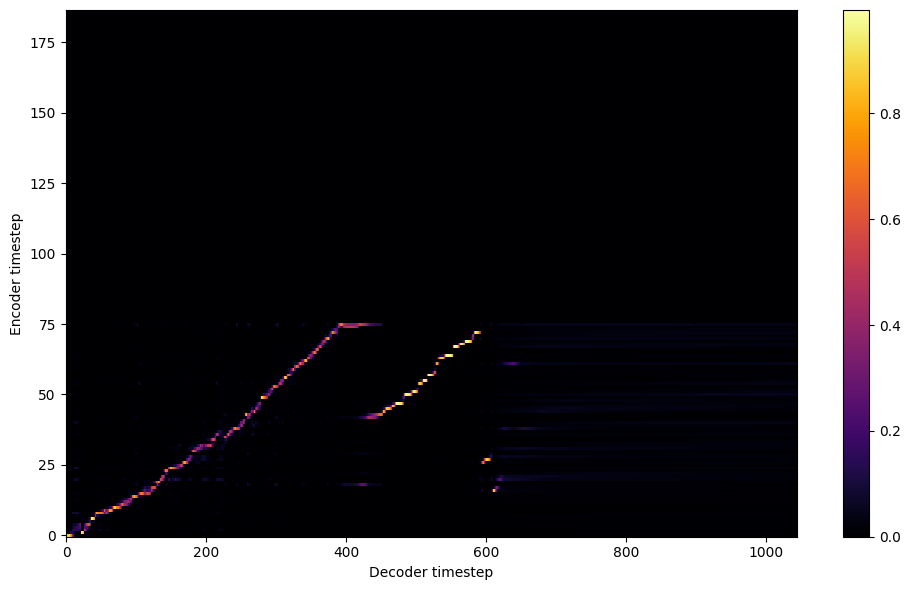


Starting Epoch: 55 Iteration: 220


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 55 Validation loss 224:  0.221727  Time: 0.4m LR: 0.000300


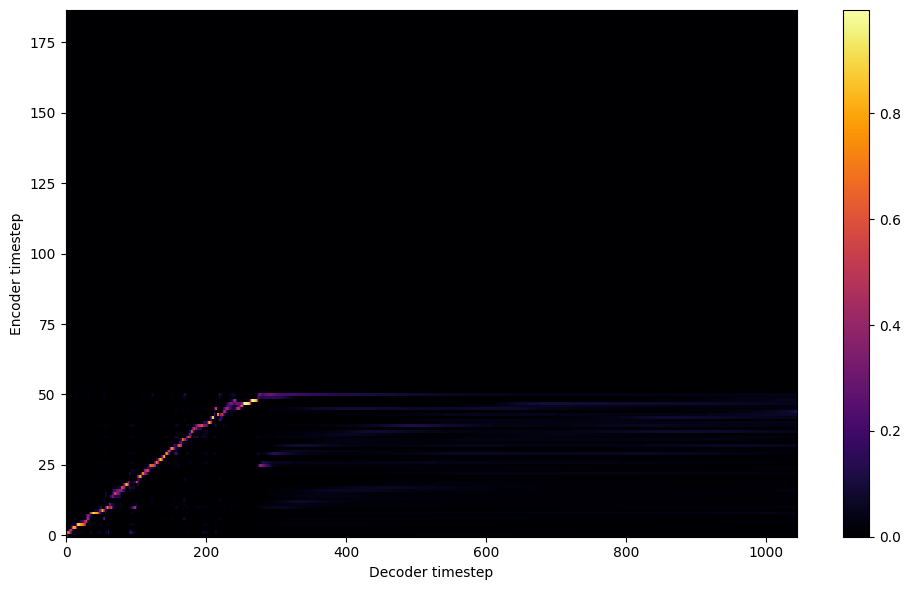


Starting Epoch: 56 Iteration: 224


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 56 Validation loss 228:  0.231086  Time: 0.4m LR: 0.000300


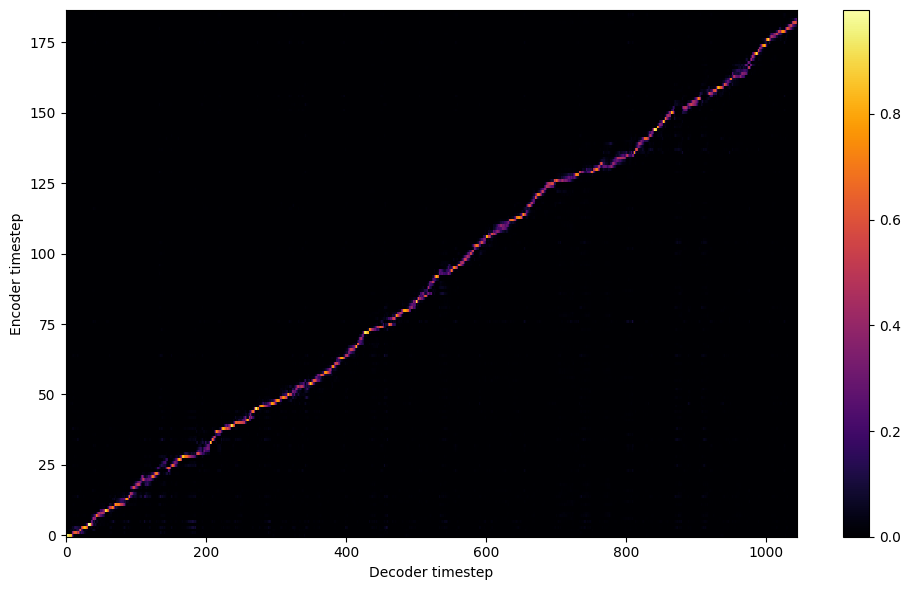


Starting Epoch: 57 Iteration: 228


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 57 Validation loss 232:  0.221615  Time: 0.4m LR: 0.000300


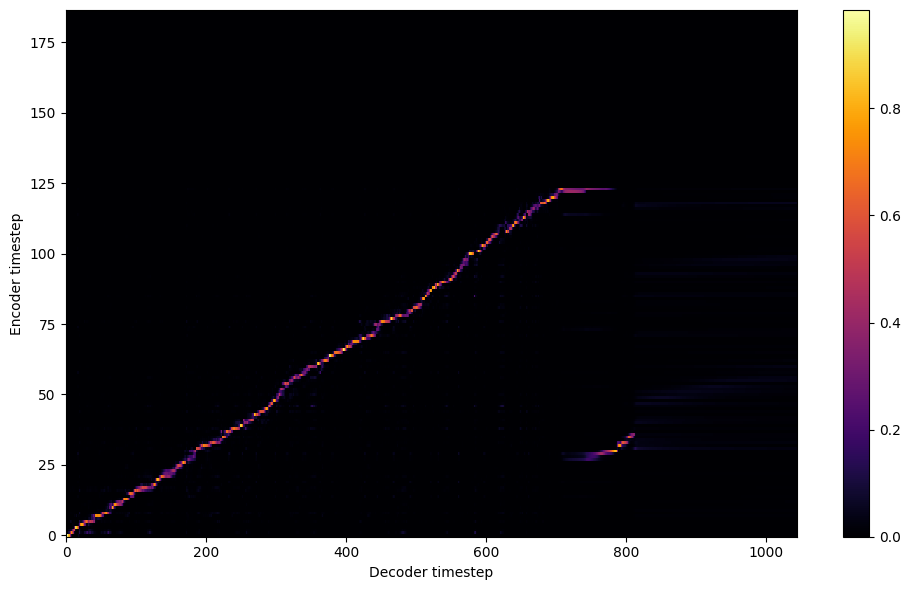


Starting Epoch: 58 Iteration: 232


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 58 Validation loss 236:  0.215389  Time: 0.4m LR: 0.000300


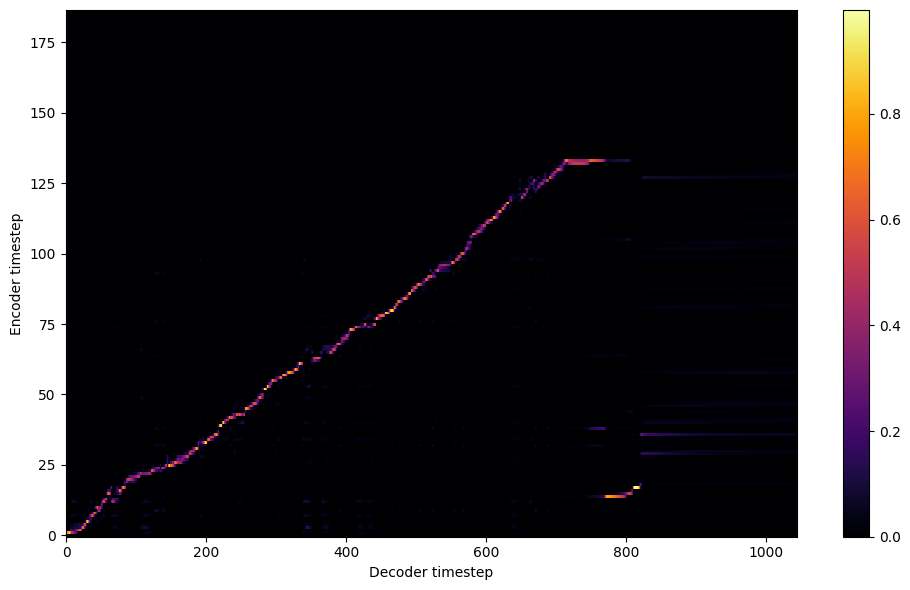


Starting Epoch: 59 Iteration: 236


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 59 Validation loss 240:  0.207595  Time: 0.4m LR: 0.000300


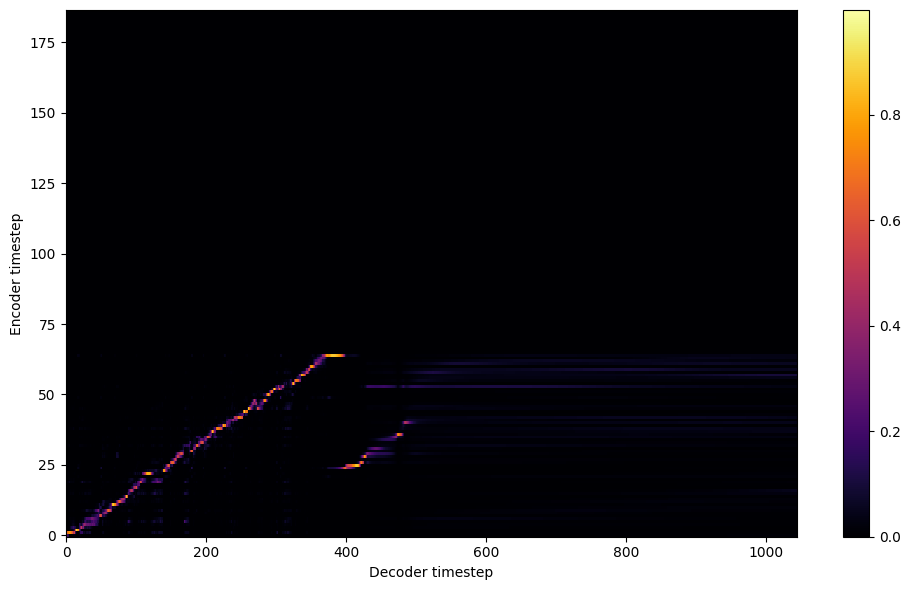

Saving model and optimizer state at iteration 240 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 60 Iteration: 240


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 60 Validation loss 244:  0.203866  Time: 0.4m LR: 0.000300


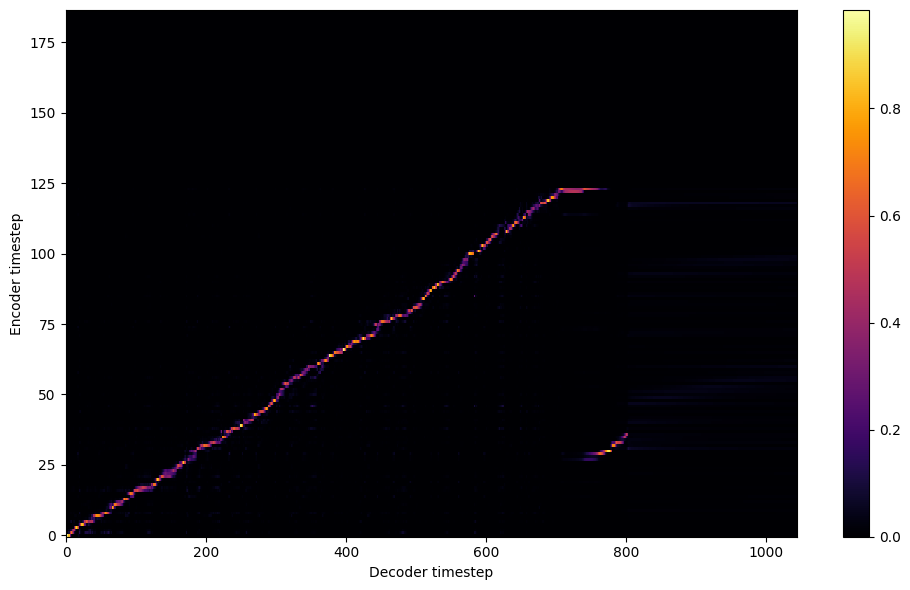


Starting Epoch: 61 Iteration: 244


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 61 Validation loss 248:  0.203506  Time: 0.4m LR: 0.000300


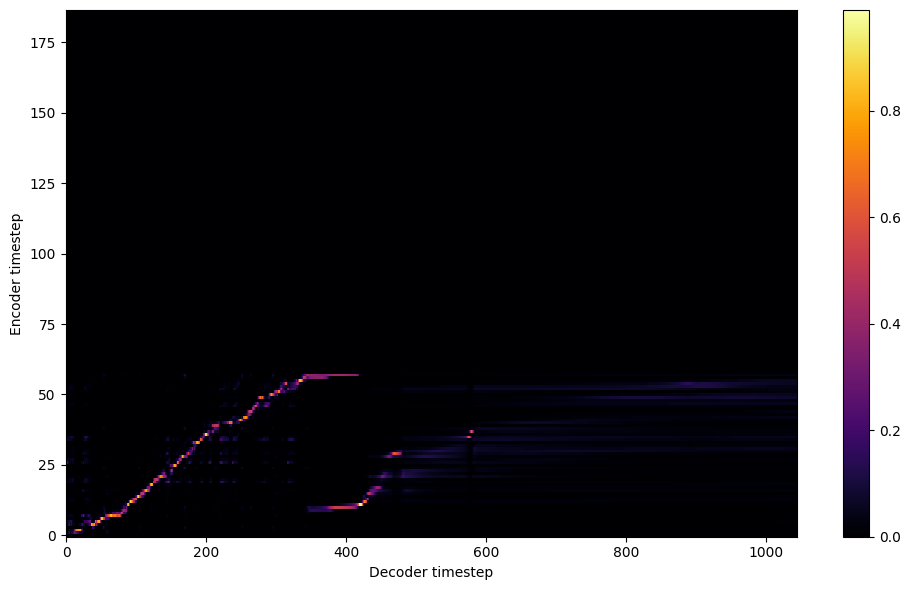


Starting Epoch: 62 Iteration: 248


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 62 Validation loss 252:  0.201481  Time: 0.4m LR: 0.000300


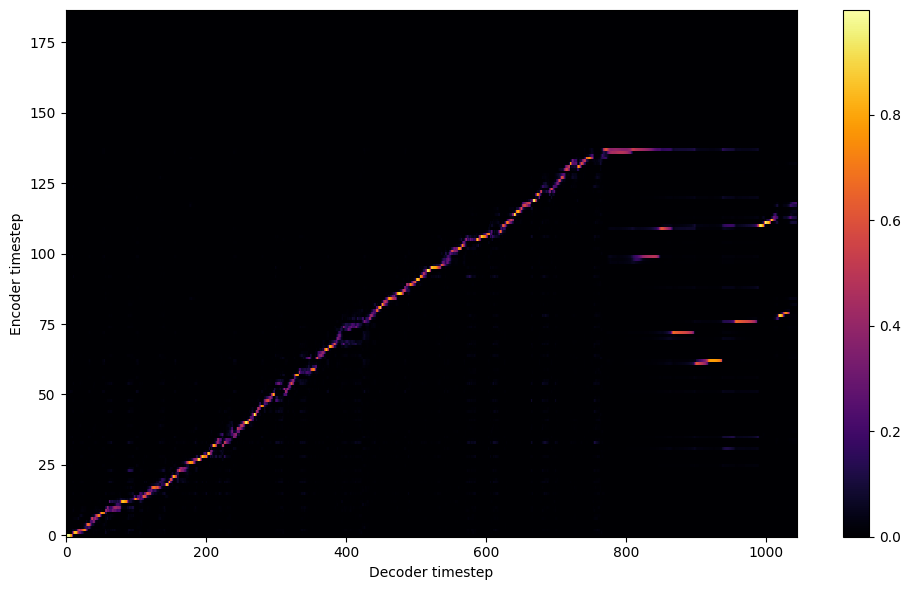


Starting Epoch: 63 Iteration: 252


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 63 Validation loss 256:  0.203753  Time: 0.4m LR: 0.000300


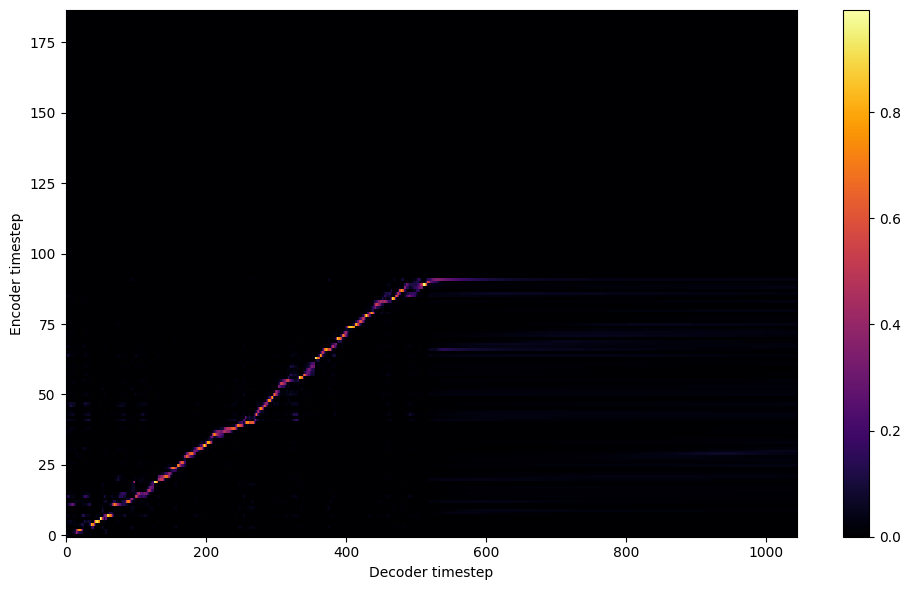


Starting Epoch: 64 Iteration: 256


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 64 Validation loss 260:  0.201591  Time: 0.4m LR: 0.000300


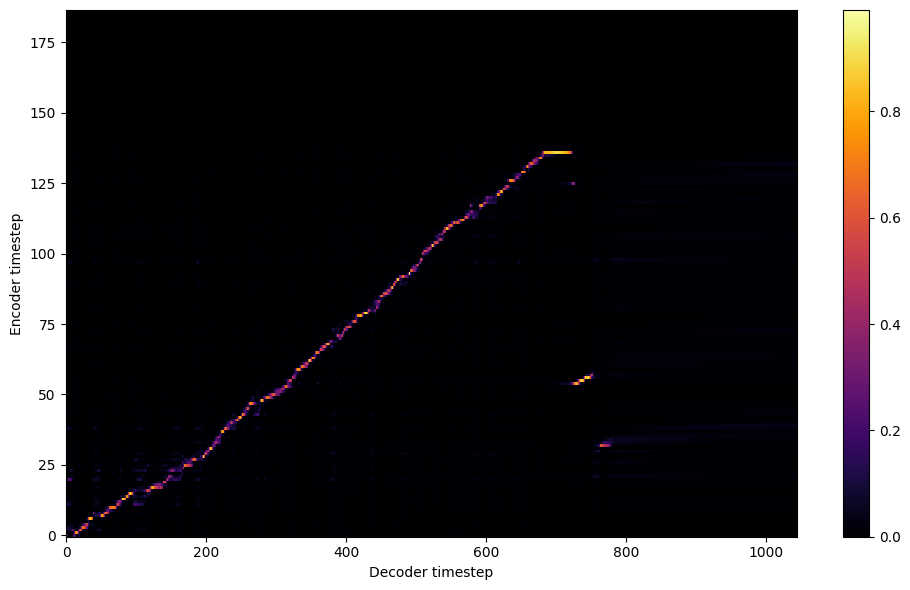


Starting Epoch: 65 Iteration: 260


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 65 Validation loss 264:  0.208429  Time: 0.4m LR: 0.000300


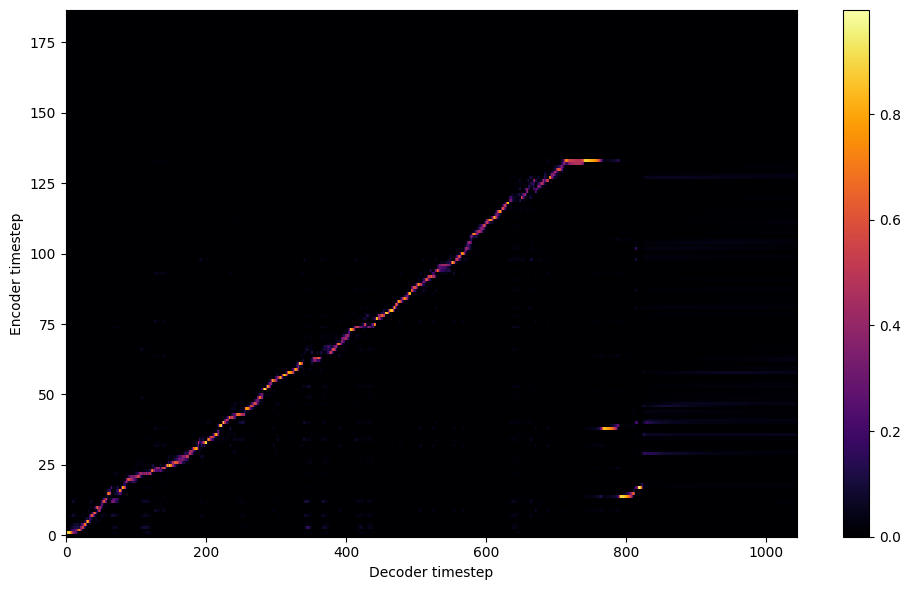


Starting Epoch: 66 Iteration: 264


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 66 Validation loss 268:  0.197714  Time: 0.4m LR: 0.000300


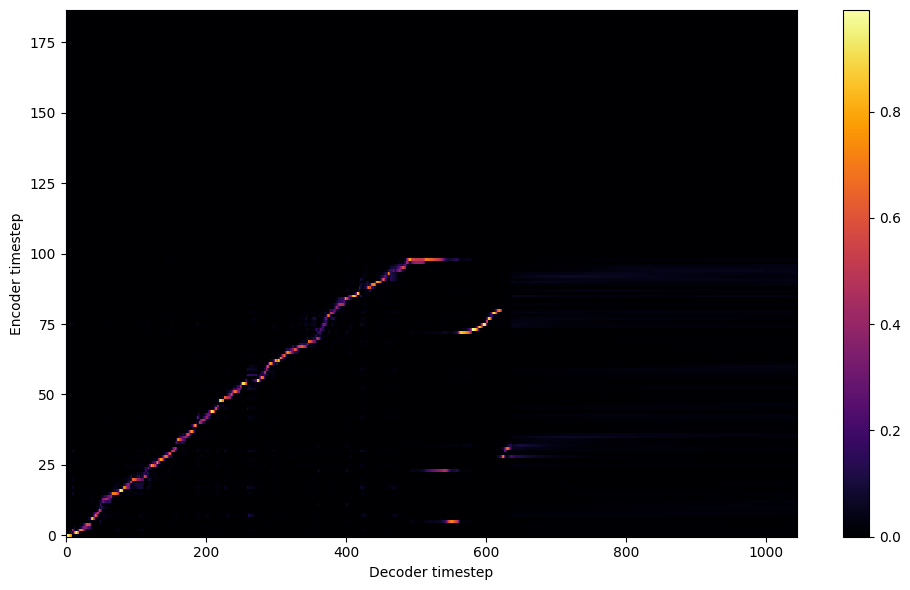


Starting Epoch: 67 Iteration: 268


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 67 Validation loss 272:  0.196971  Time: 0.4m LR: 0.000300


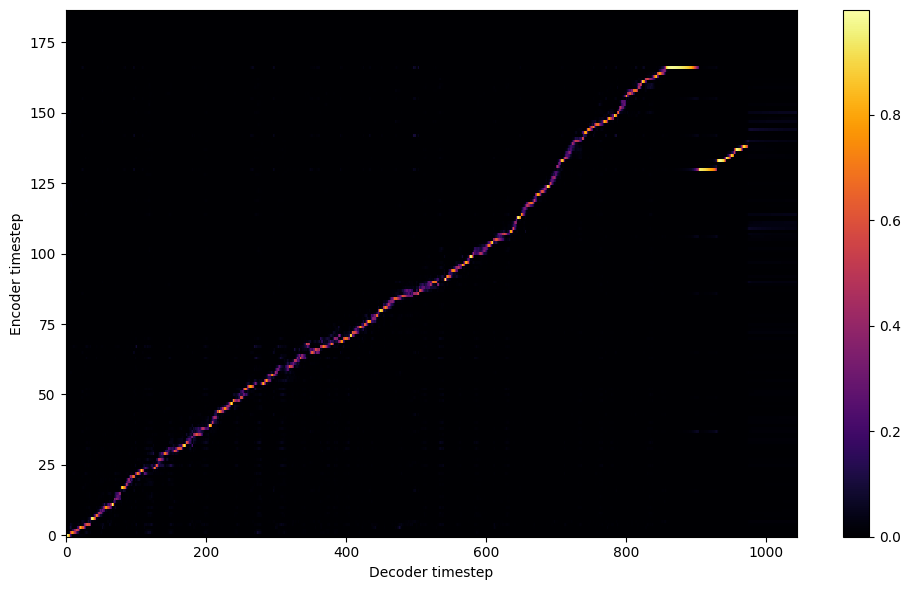


Starting Epoch: 68 Iteration: 272


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 68 Validation loss 276:  0.196037  Time: 0.4m LR: 0.000300


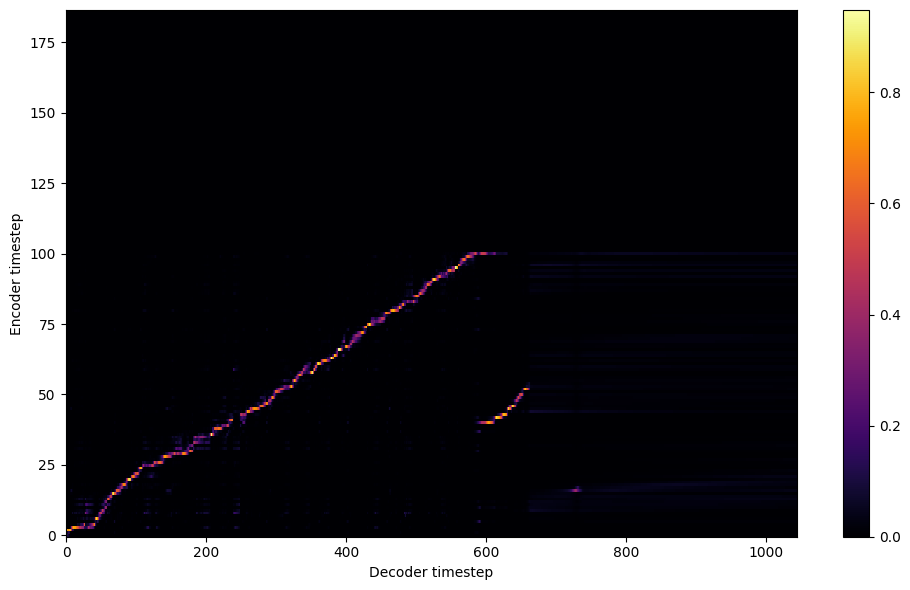


Starting Epoch: 69 Iteration: 276


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 69 Validation loss 280:  0.193743  Time: 0.4m LR: 0.000300


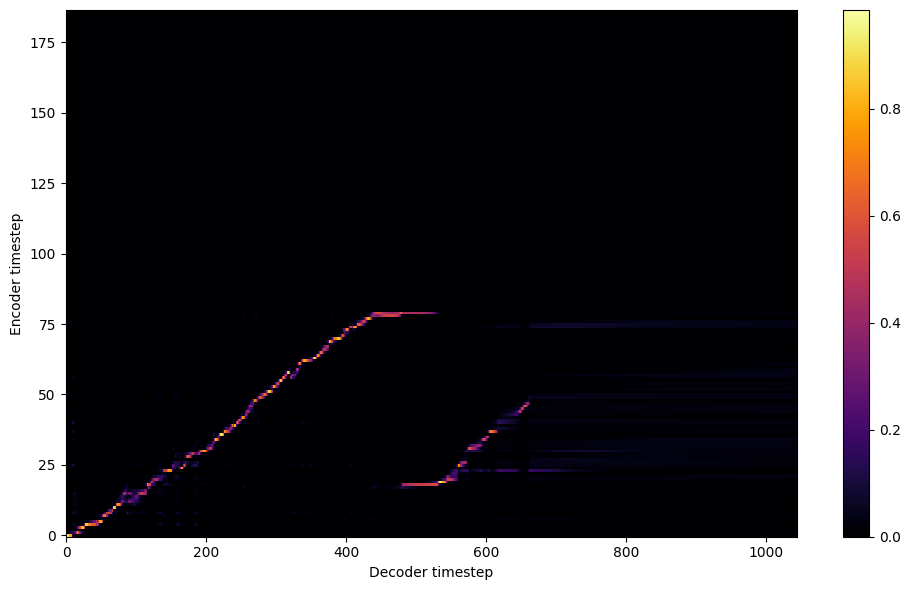

Saving model and optimizer state at iteration 280 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 70 Iteration: 280


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 70 Validation loss 284:  0.195742  Time: 0.4m LR: 0.000300


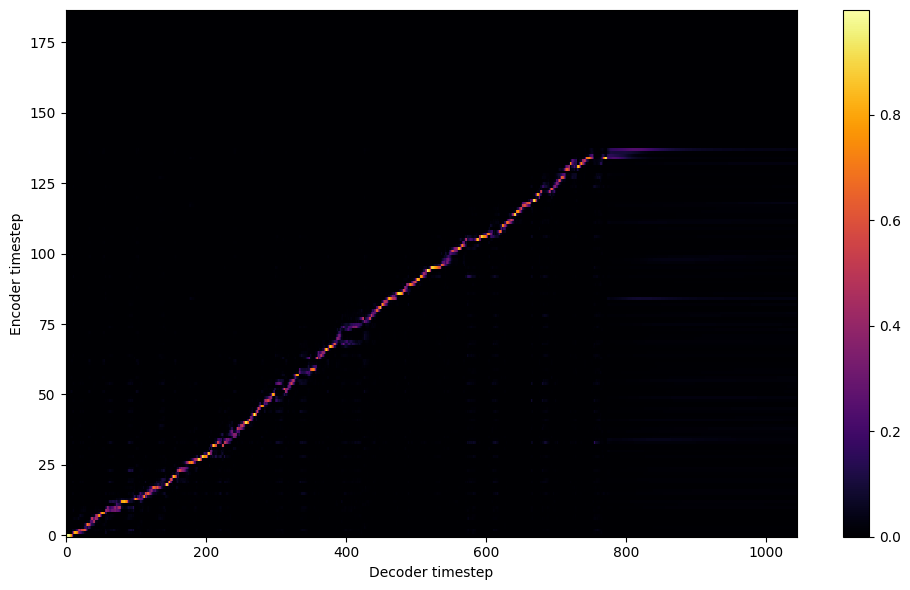


Starting Epoch: 71 Iteration: 284


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 71 Validation loss 288:  0.192012  Time: 0.4m LR: 0.000300


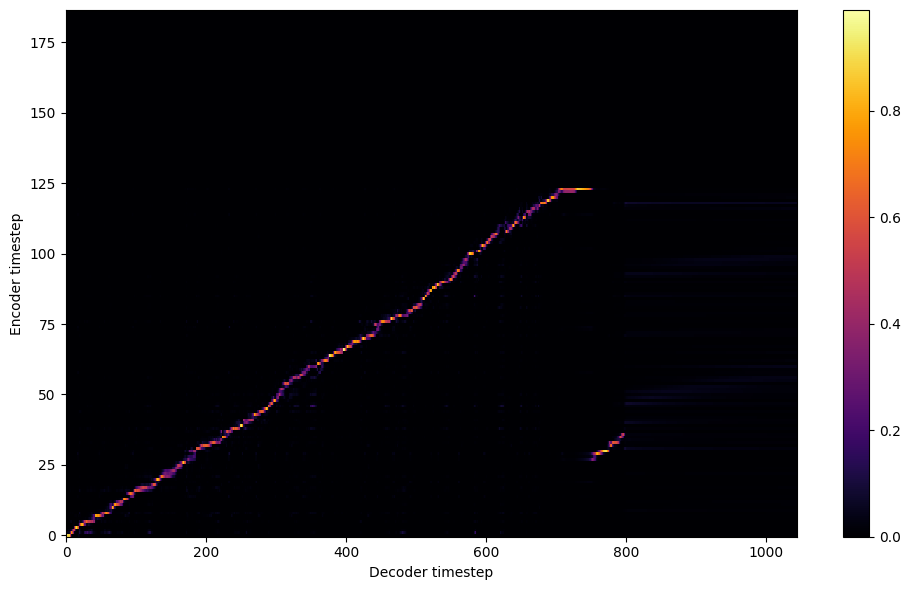


Starting Epoch: 72 Iteration: 288


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 72 Validation loss 292:  0.191801  Time: 0.4m LR: 0.000300


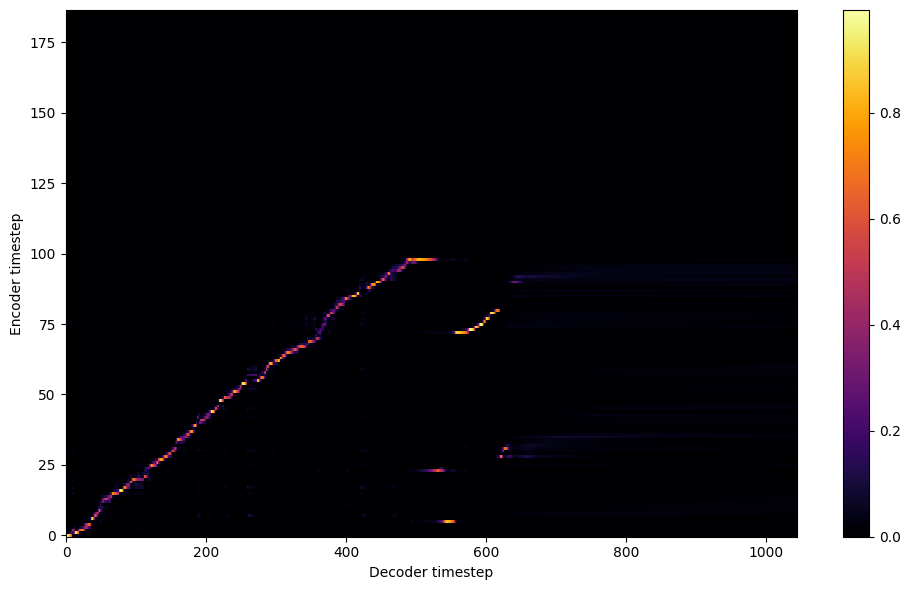


Starting Epoch: 73 Iteration: 292


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 73 Validation loss 296:  0.190612  Time: 0.4m LR: 0.000300


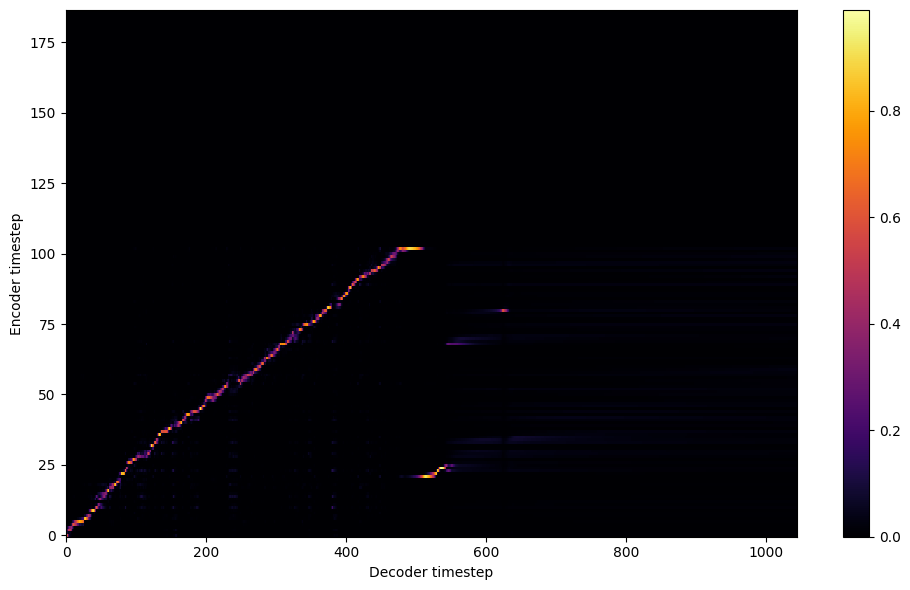


Starting Epoch: 74 Iteration: 296


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 74 Validation loss 300:  0.195133  Time: 0.4m LR: 0.000300


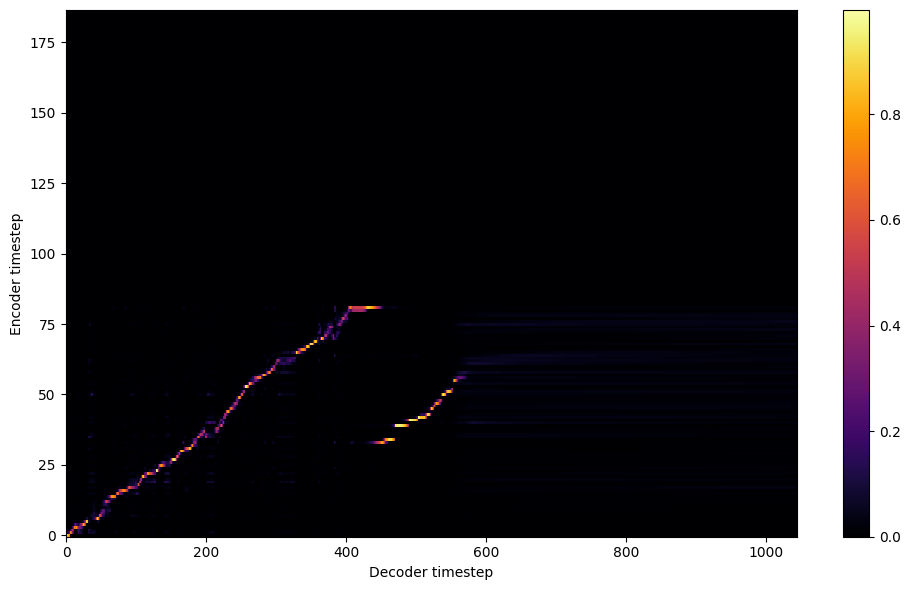


Starting Epoch: 75 Iteration: 300


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 75 Validation loss 304:  0.188924  Time: 0.4m LR: 0.000300


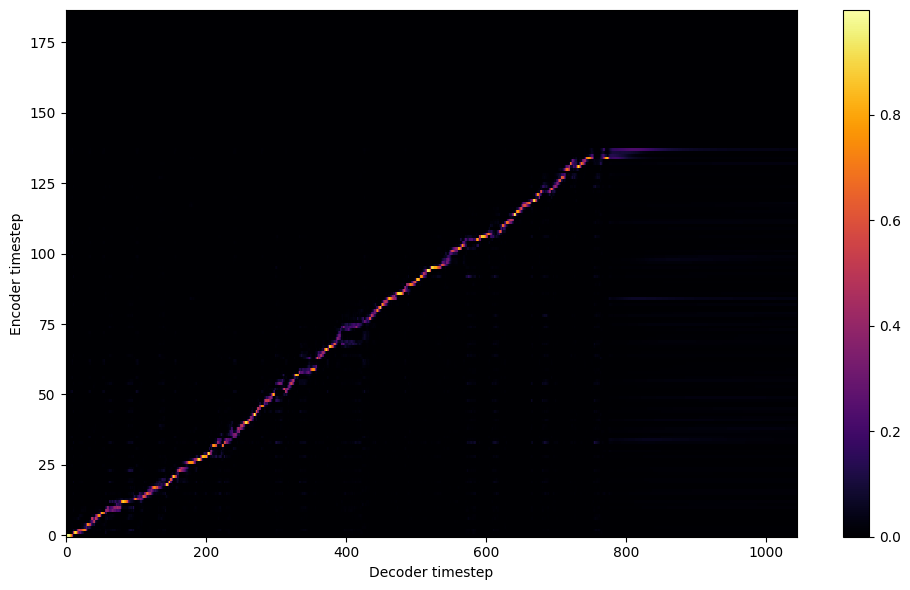


Starting Epoch: 76 Iteration: 304


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 76 Validation loss 308:  0.189484  Time: 0.4m LR: 0.000300


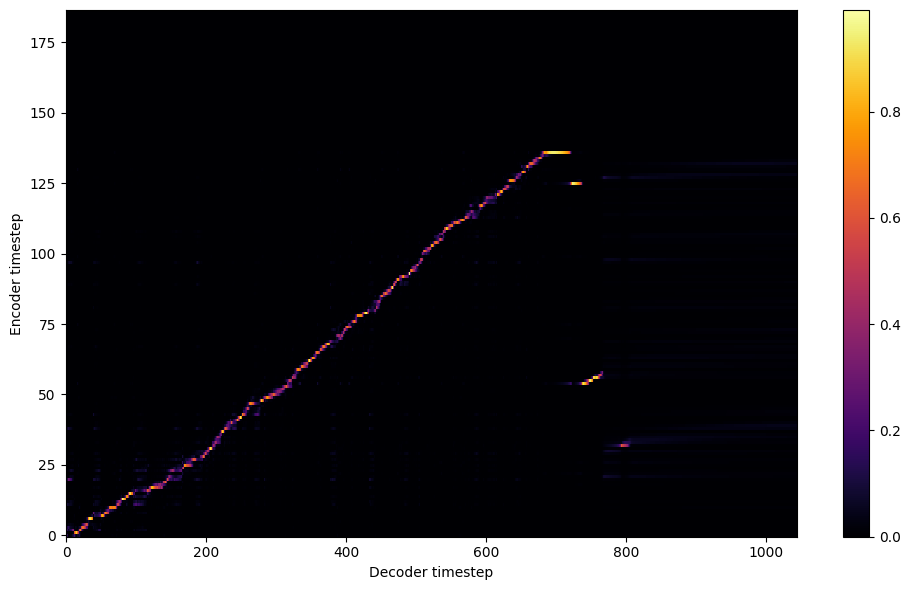


Starting Epoch: 77 Iteration: 308


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 77 Validation loss 312:  0.189412  Time: 0.4m LR: 0.000300


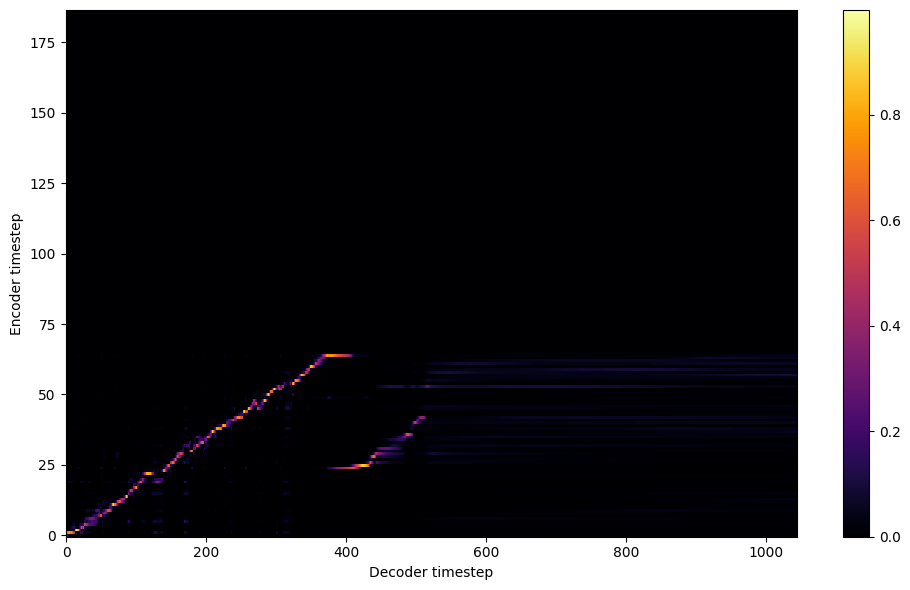


Starting Epoch: 78 Iteration: 312


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 78 Validation loss 316:  0.189325  Time: 0.4m LR: 0.000300


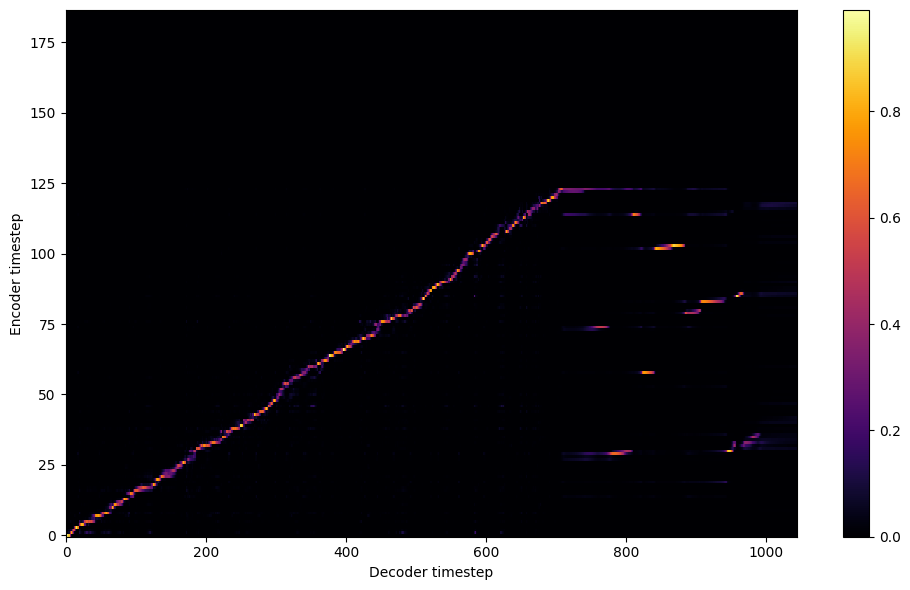


Starting Epoch: 79 Iteration: 316


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 79 Validation loss 320:  0.188814  Time: 0.4m LR: 0.000300


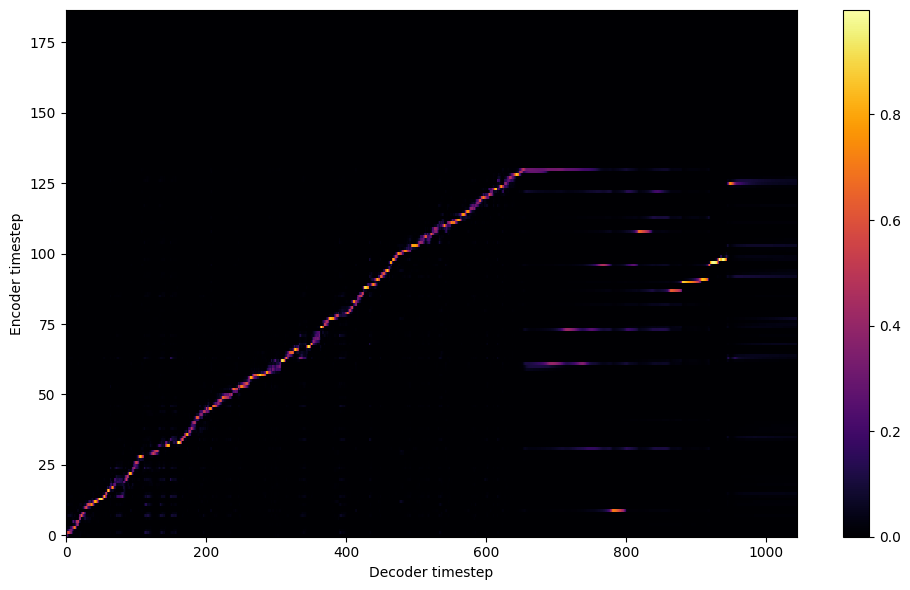

Saving model and optimizer state at iteration 320 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 80 Iteration: 320


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 80 Validation loss 324:  0.190573  Time: 0.4m LR: 0.000300


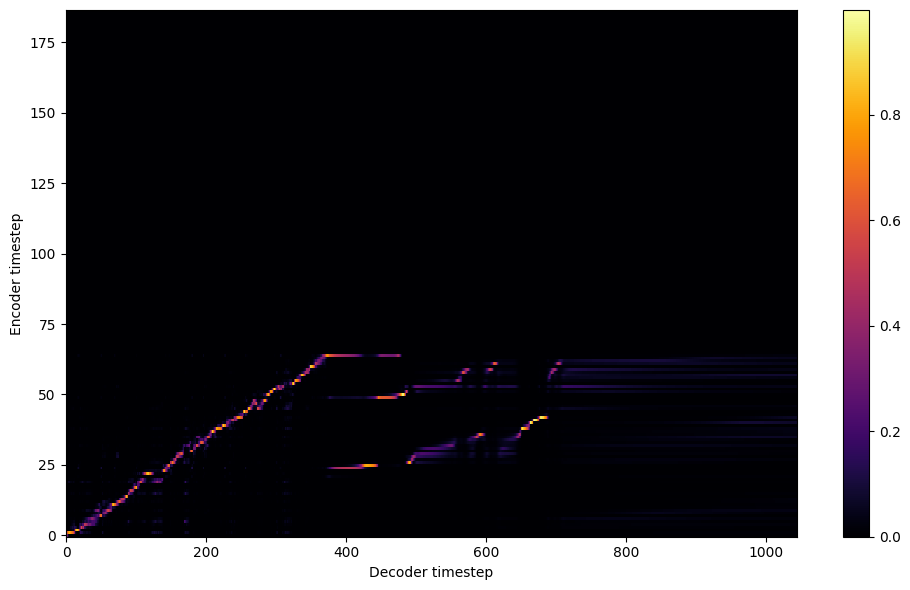


Starting Epoch: 81 Iteration: 324


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 81 Validation loss 328:  0.189167  Time: 0.4m LR: 0.000300


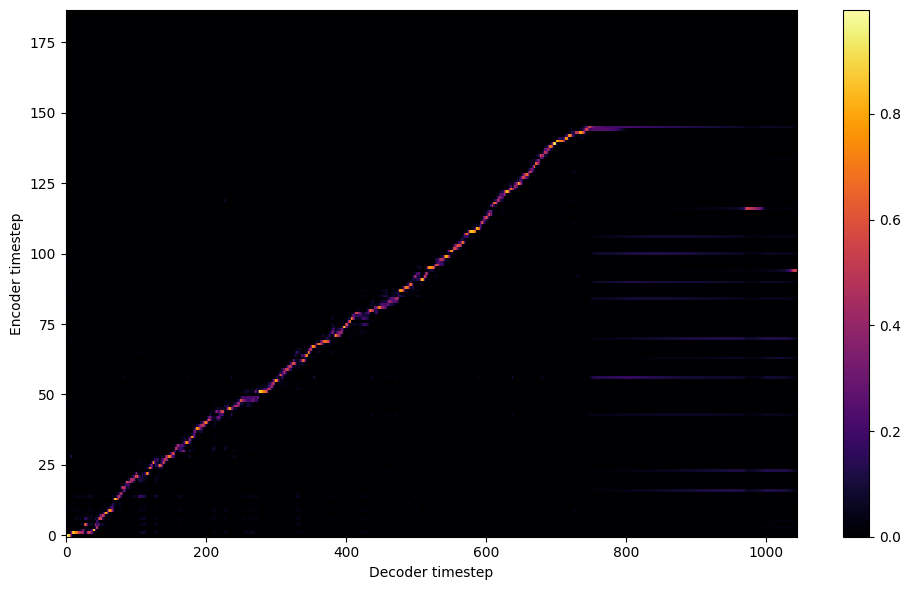


Starting Epoch: 82 Iteration: 328


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 82 Validation loss 332:  0.189996  Time: 0.4m LR: 0.000300


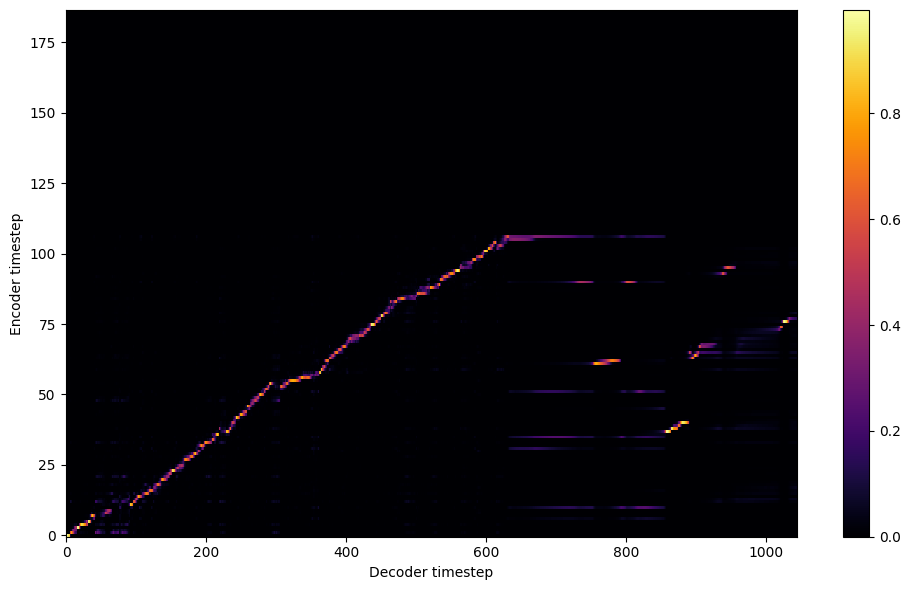


Starting Epoch: 83 Iteration: 332


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 83 Validation loss 336:  0.185244  Time: 0.4m LR: 0.000300


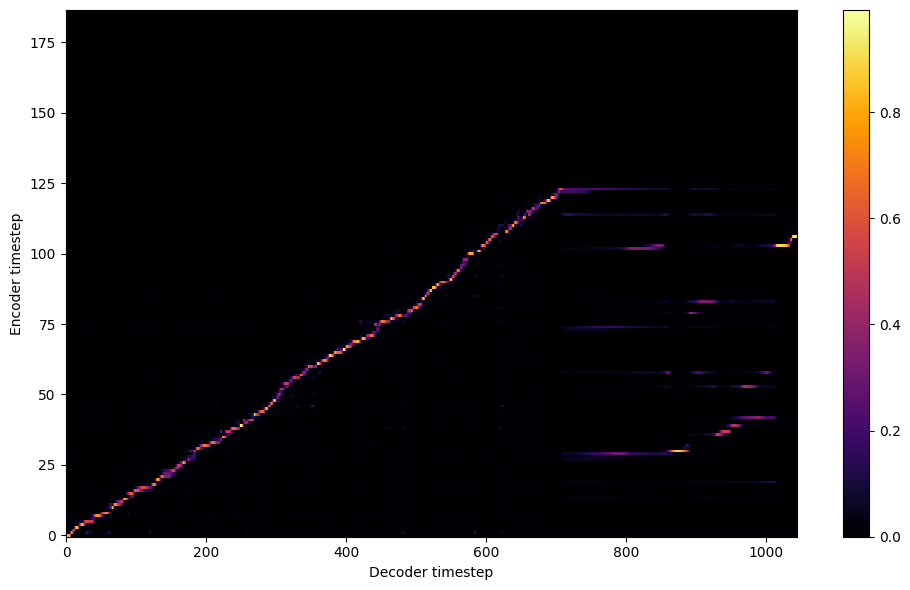


Starting Epoch: 84 Iteration: 336


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 84 Validation loss 340:  0.184583  Time: 0.4m LR: 0.000300


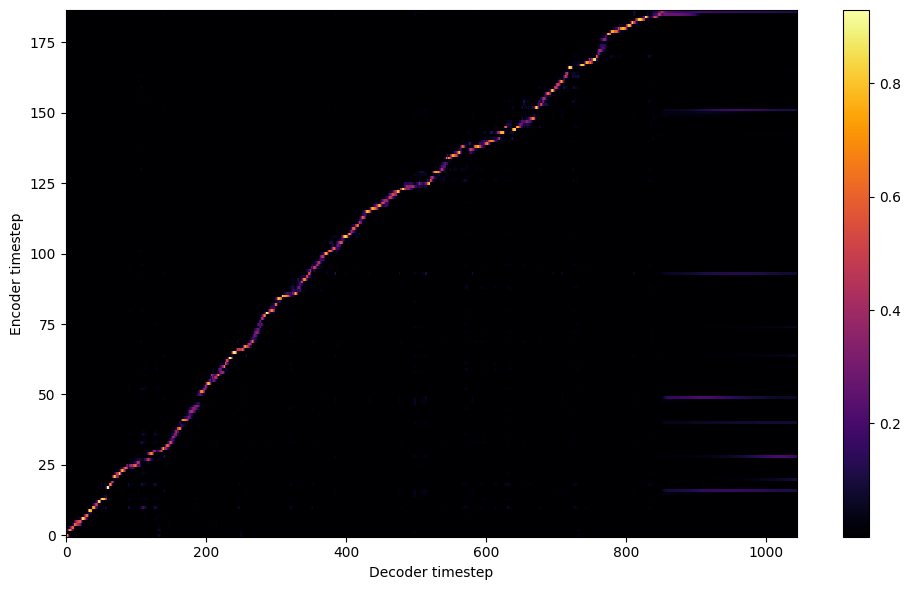


Starting Epoch: 85 Iteration: 340


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 85 Validation loss 344:  0.184559  Time: 0.4m LR: 0.000300


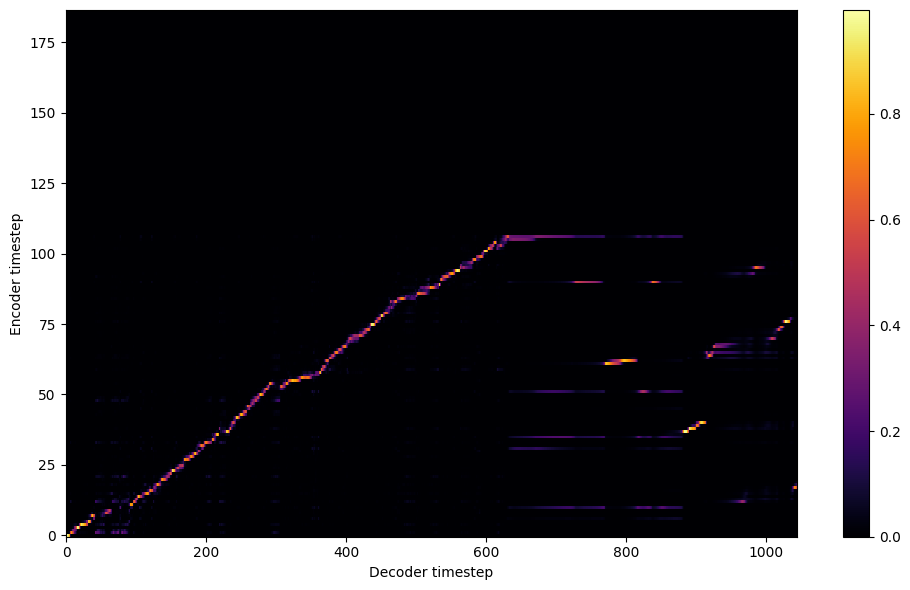


Starting Epoch: 86 Iteration: 344


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 86 Validation loss 348:  0.182070  Time: 0.4m LR: 0.000300


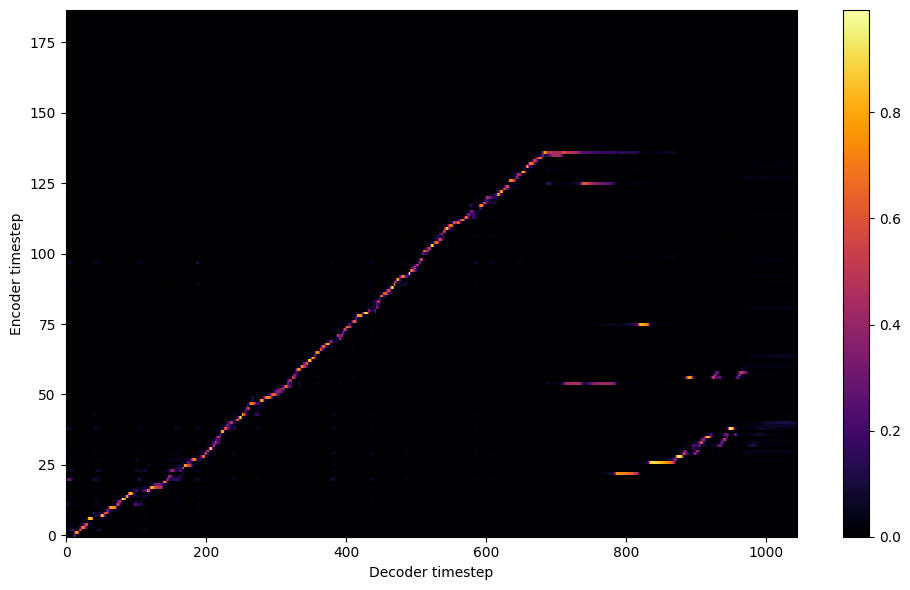


Starting Epoch: 87 Iteration: 348


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 87 Validation loss 352:  0.184153  Time: 0.4m LR: 0.000300


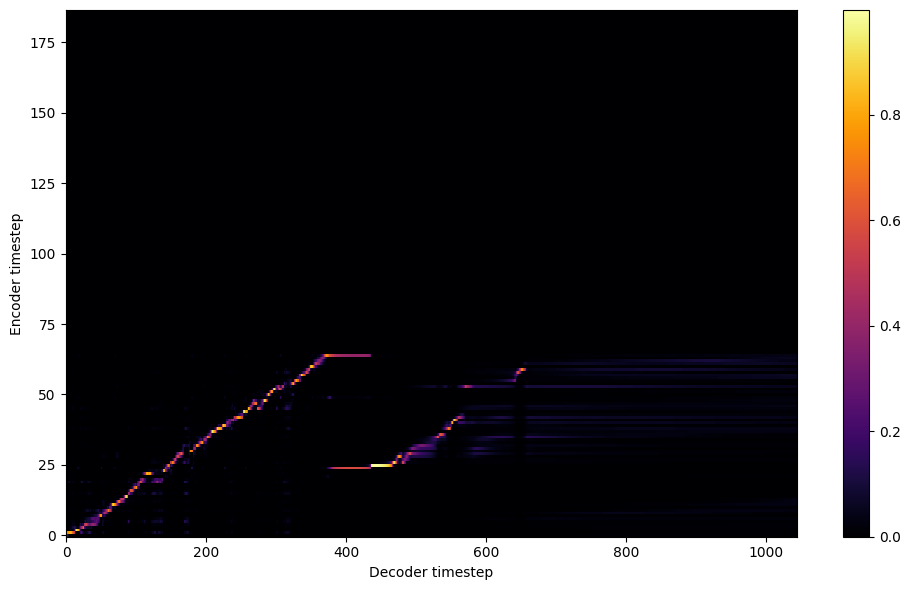


Starting Epoch: 88 Iteration: 352


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 88 Validation loss 356:  0.187573  Time: 0.4m LR: 0.000300


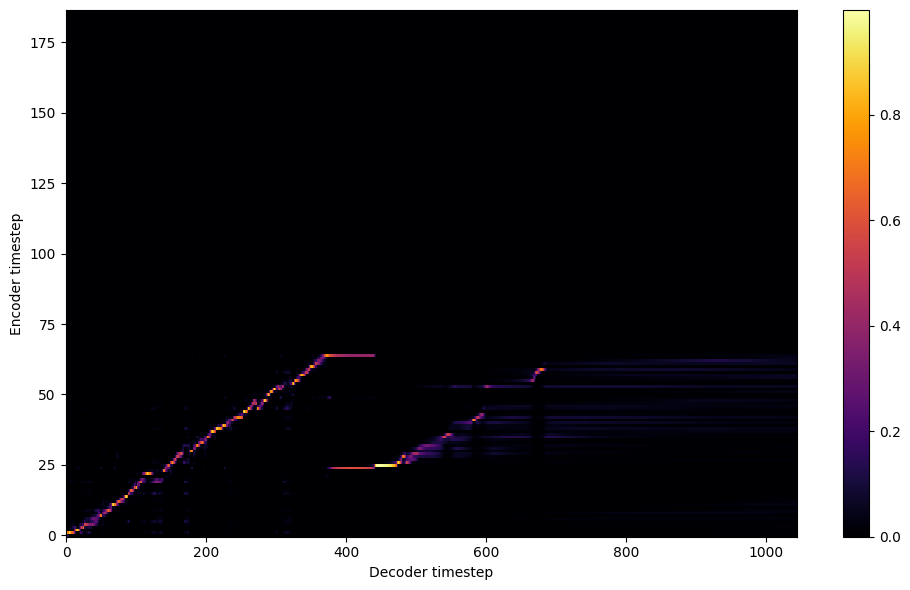


Starting Epoch: 89 Iteration: 356


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 89 Validation loss 360:  0.181311  Time: 0.4m LR: 0.000300


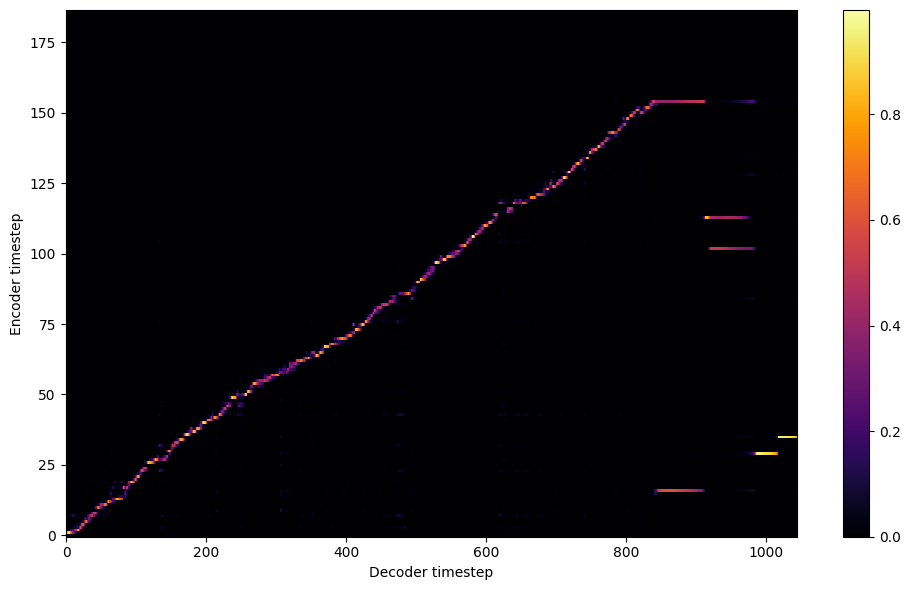

Saving model and optimizer state at iteration 360 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 90 Iteration: 360


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 90 Validation loss 364:  0.178987  Time: 0.4m LR: 0.000300


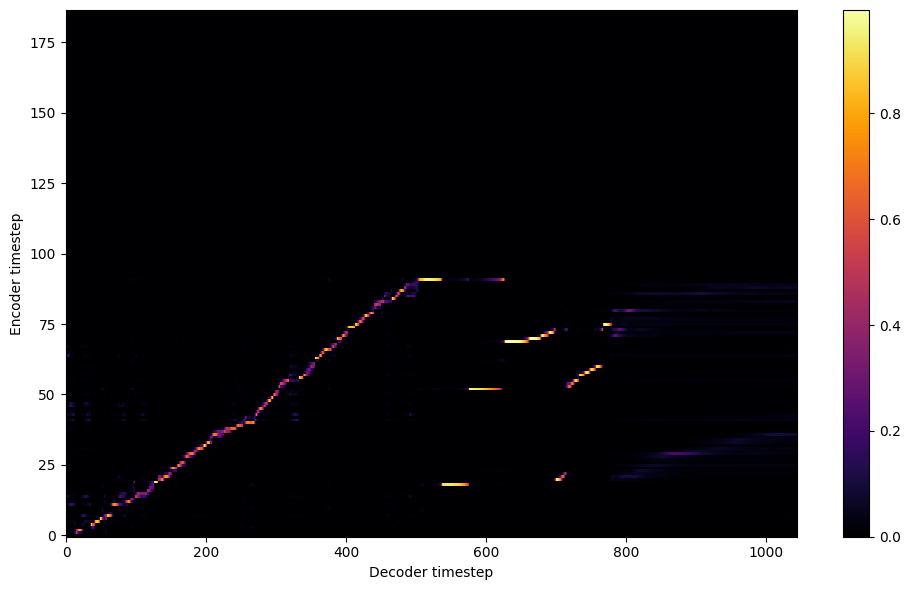


Starting Epoch: 91 Iteration: 364


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 91 Validation loss 368:  0.182929  Time: 0.4m LR: 0.000300


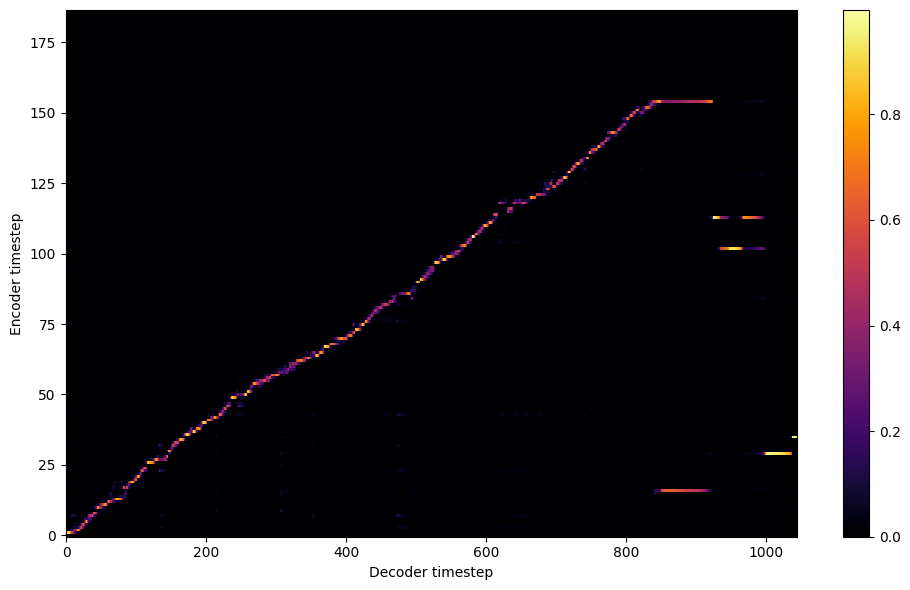


Starting Epoch: 92 Iteration: 368


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 92 Validation loss 372:  0.177741  Time: 0.4m LR: 0.000300


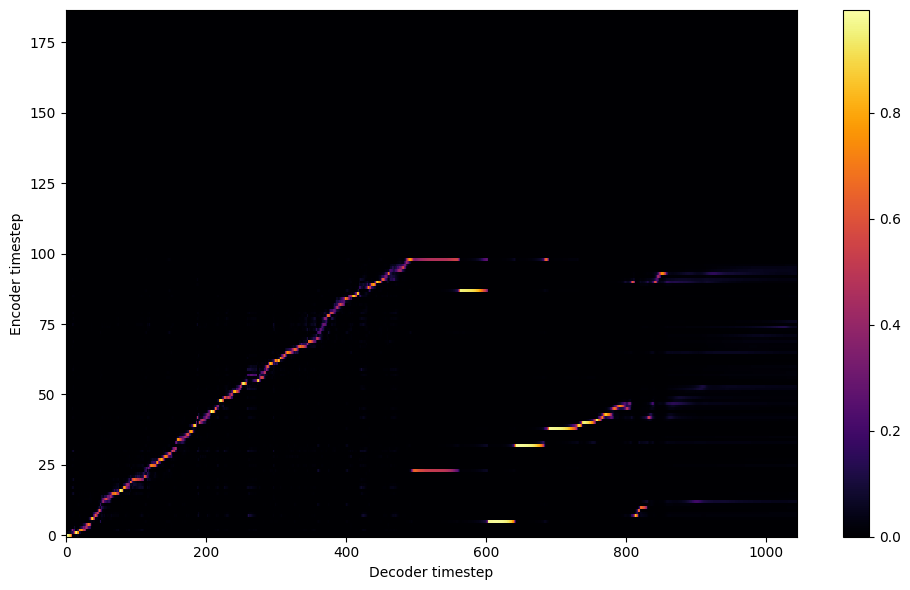


Starting Epoch: 93 Iteration: 372


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 93 Validation loss 376:  0.177180  Time: 0.4m LR: 0.000300


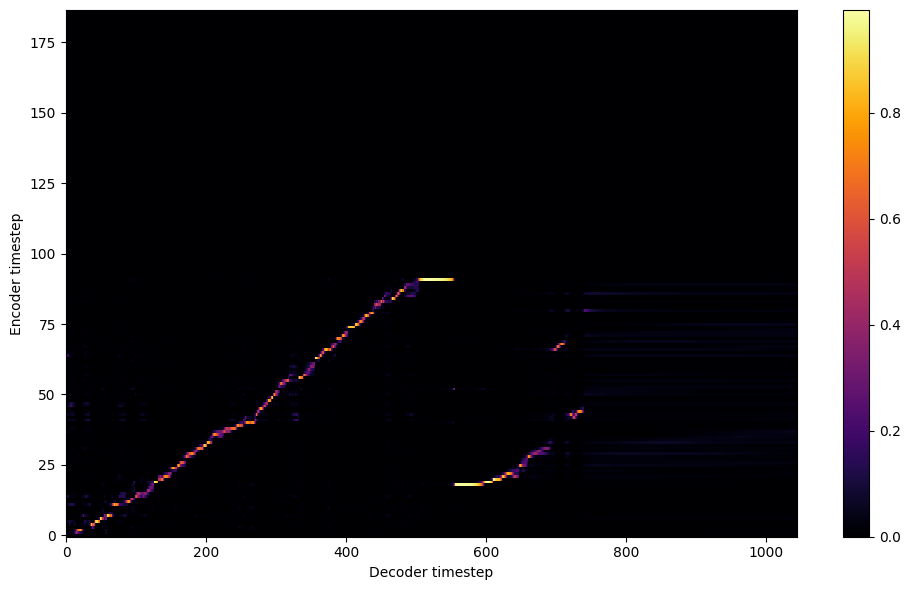


Starting Epoch: 94 Iteration: 376


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 94 Validation loss 380:  0.192996  Time: 0.4m LR: 0.000300


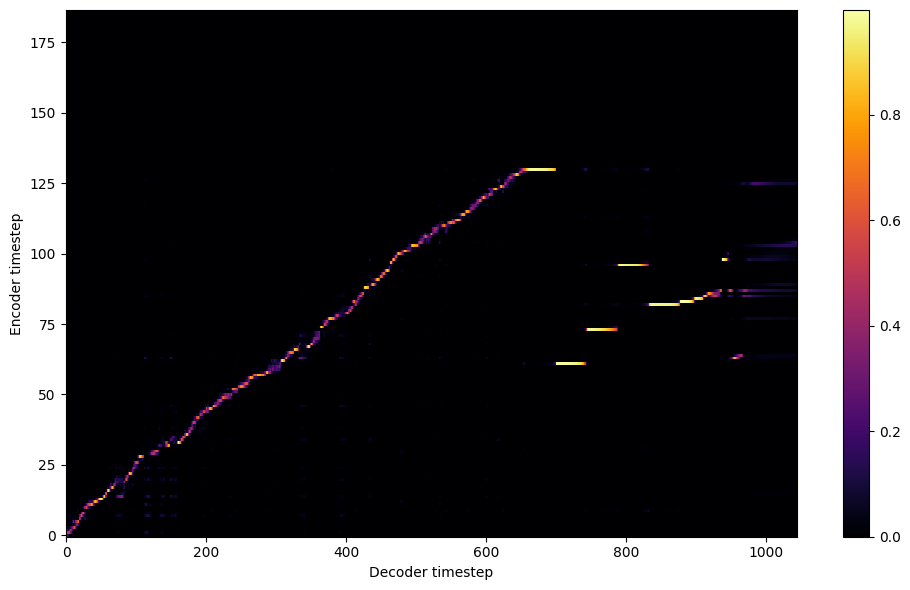


Starting Epoch: 95 Iteration: 380


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 95 Validation loss 384:  0.186612  Time: 0.4m LR: 0.000300


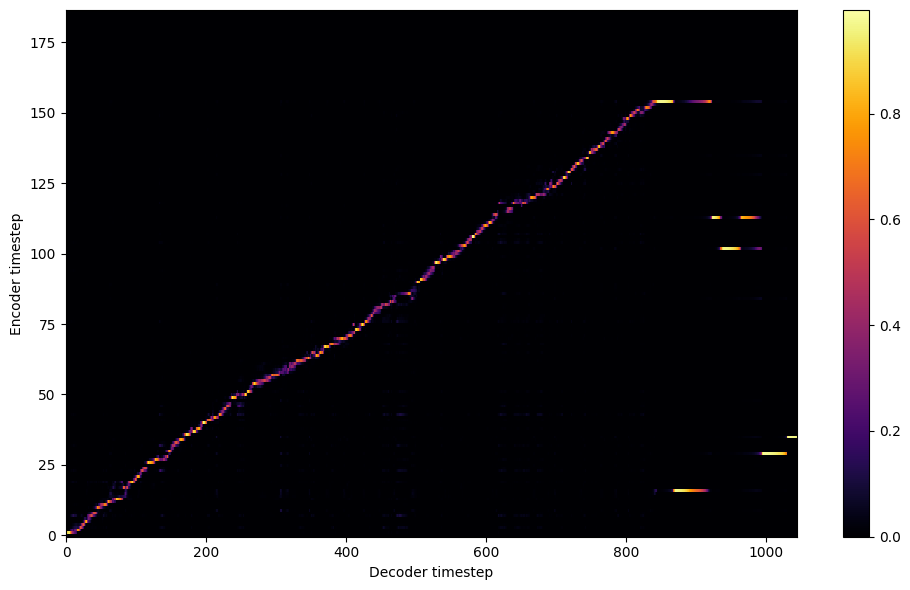


Starting Epoch: 96 Iteration: 384


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 96 Validation loss 388:  0.184941  Time: 0.4m LR: 0.000300


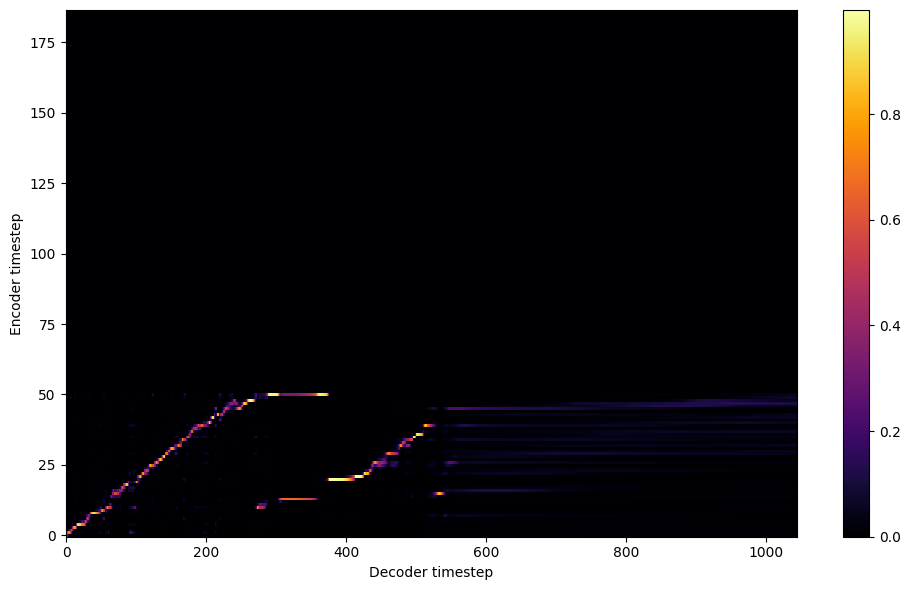


Starting Epoch: 97 Iteration: 388


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 97 Validation loss 392:  0.182699  Time: 0.4m LR: 0.000300


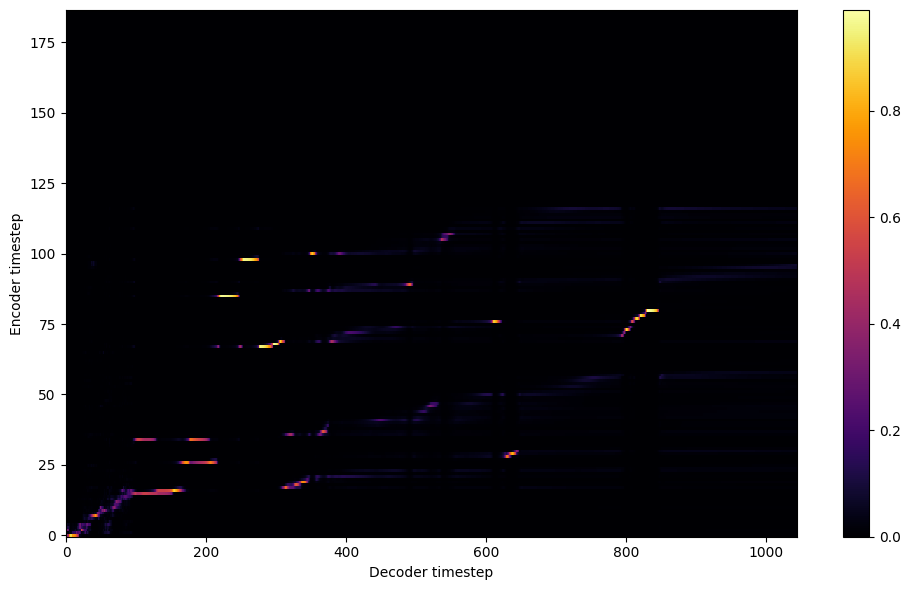


Starting Epoch: 98 Iteration: 392


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 98 Validation loss 396:  0.183713  Time: 0.4m LR: 0.000300


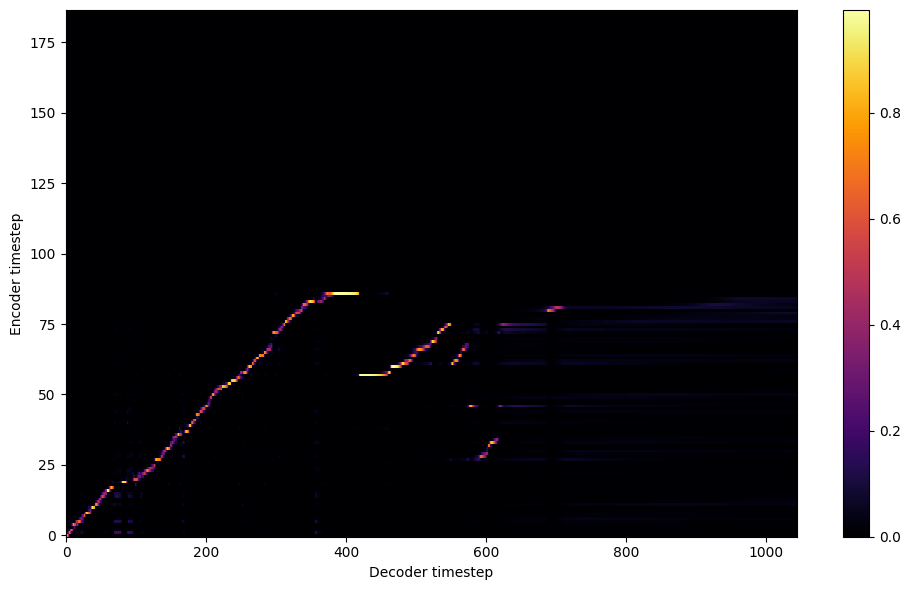


Starting Epoch: 99 Iteration: 396


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 99 Validation loss 400:  0.183173  Time: 0.4m LR: 0.000300


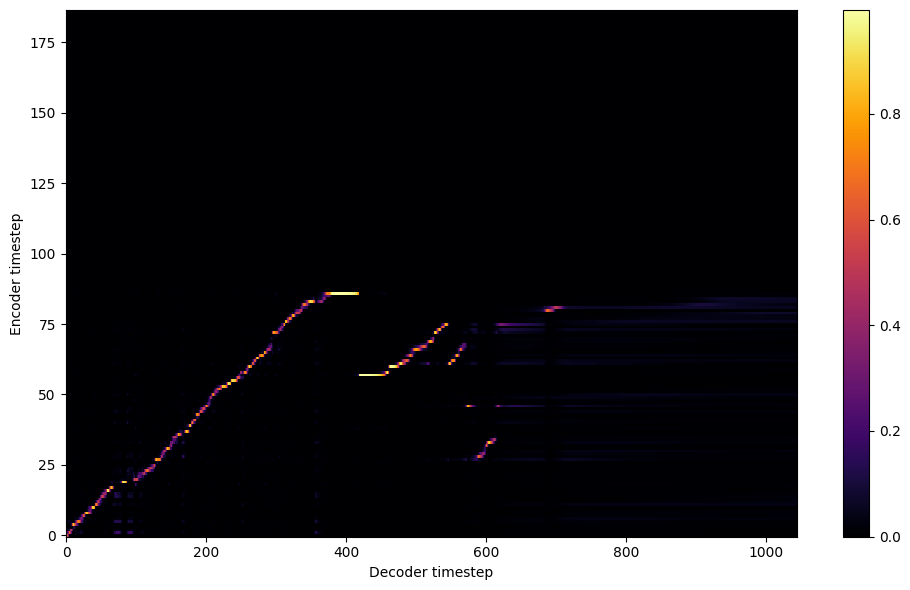

Saving model and optimizer state at iteration 400 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 100 Iteration: 400


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 100 Validation loss 404:  0.177270  Time: 0.4m LR: 0.000300


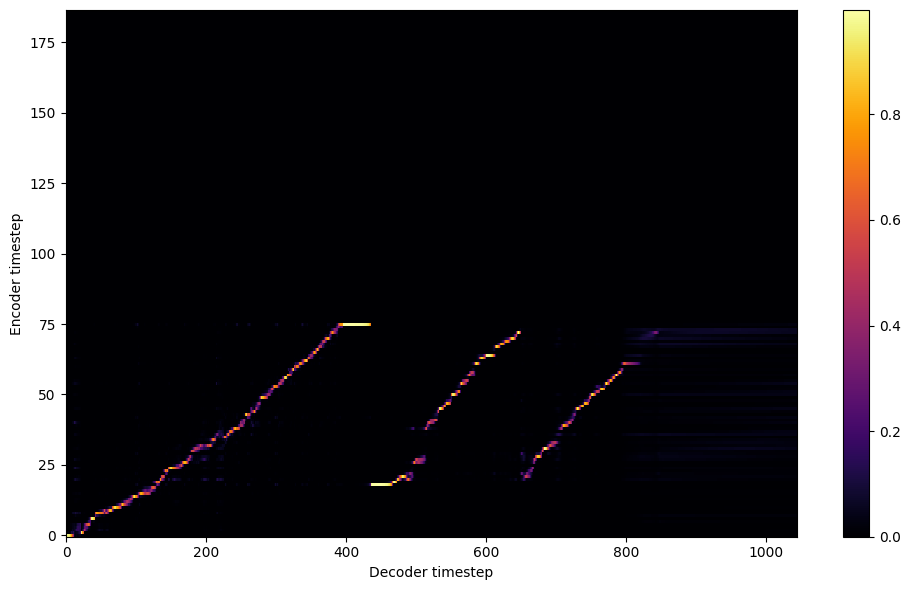


Starting Epoch: 101 Iteration: 404


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 101 Validation loss 408:  0.177586  Time: 0.4m LR: 0.000300


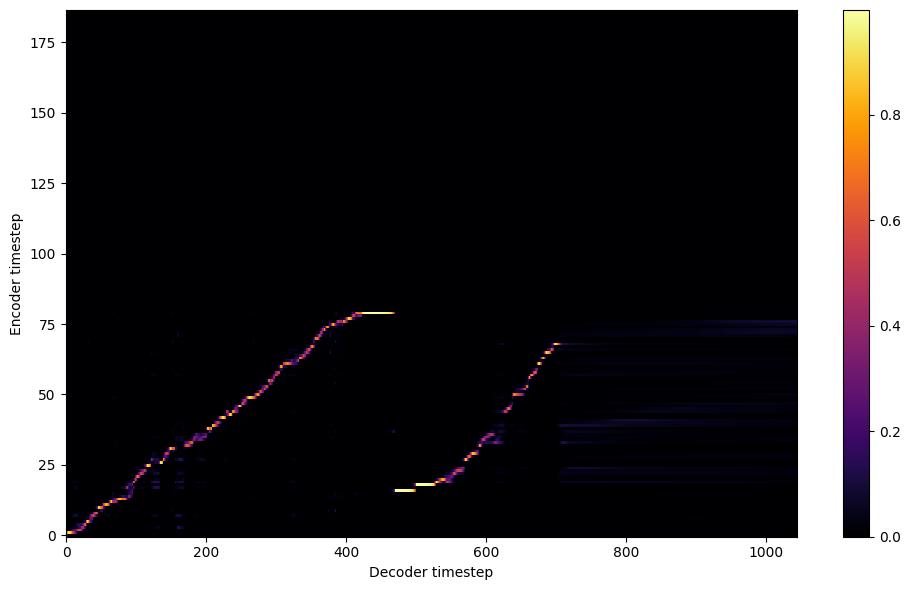


Starting Epoch: 102 Iteration: 408


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 102 Validation loss 412:  0.173407  Time: 0.4m LR: 0.000300


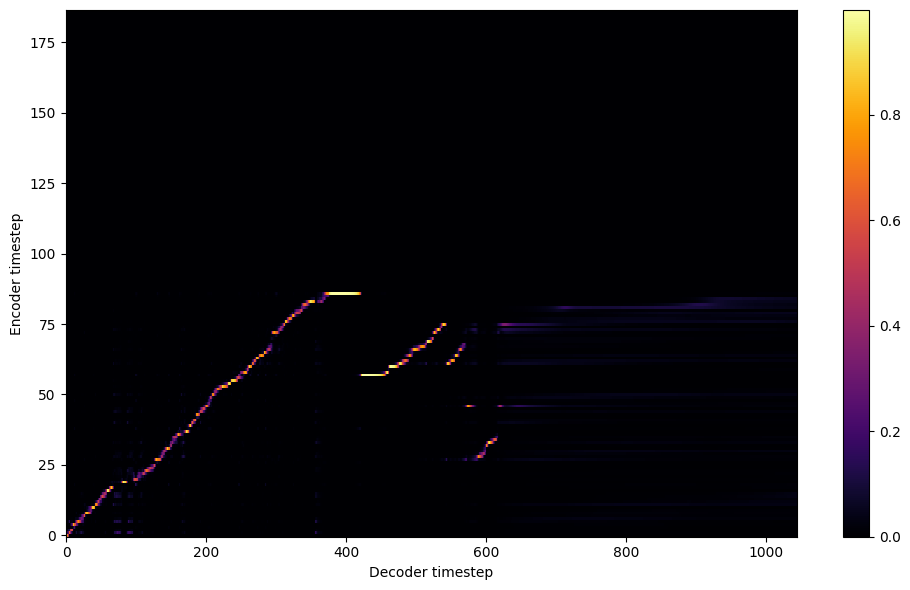


Starting Epoch: 103 Iteration: 412


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 103 Validation loss 416:  0.171707  Time: 0.4m LR: 0.000300


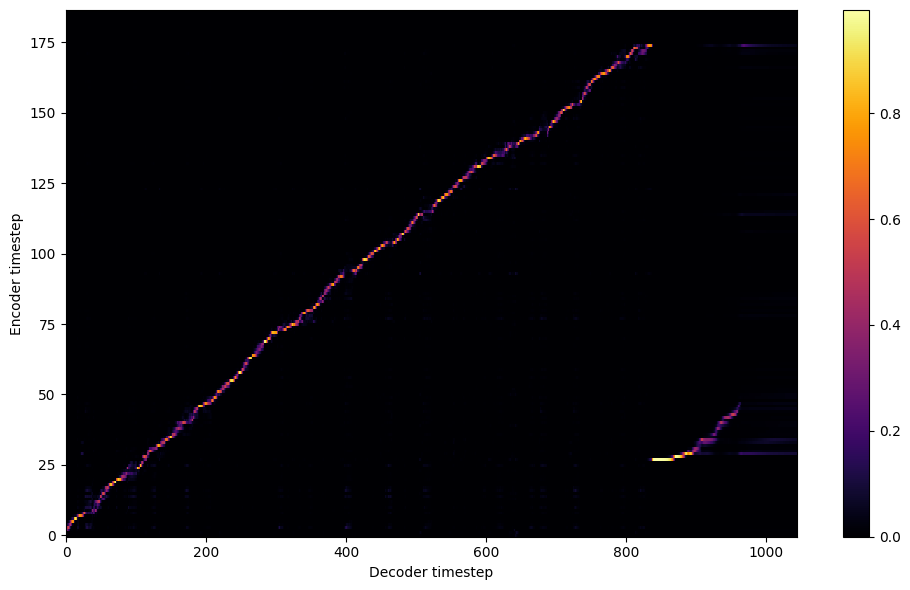


Starting Epoch: 104 Iteration: 416


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 104 Validation loss 420:  0.180231  Time: 0.4m LR: 0.000300


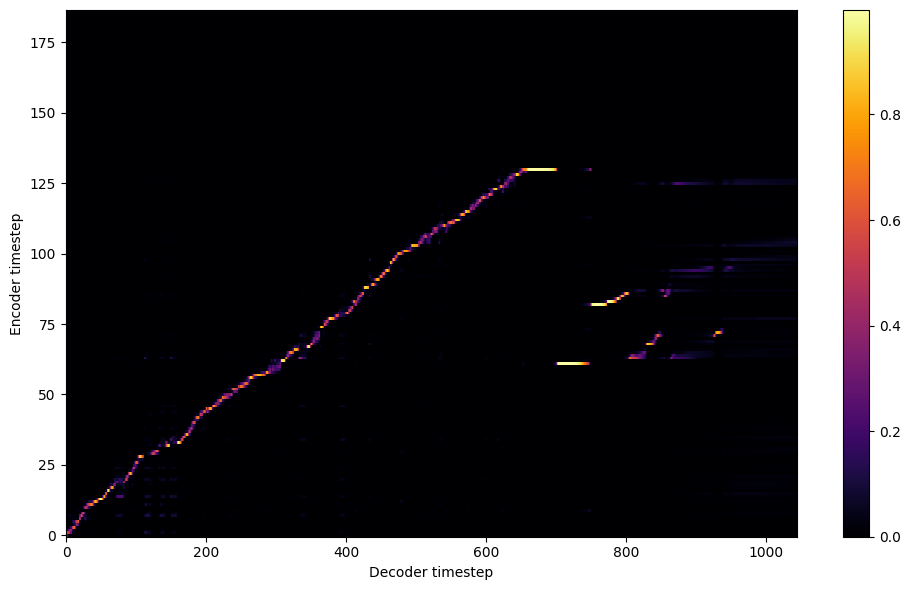


Starting Epoch: 105 Iteration: 420


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 105 Validation loss 424:  0.171937  Time: 0.4m LR: 0.000300


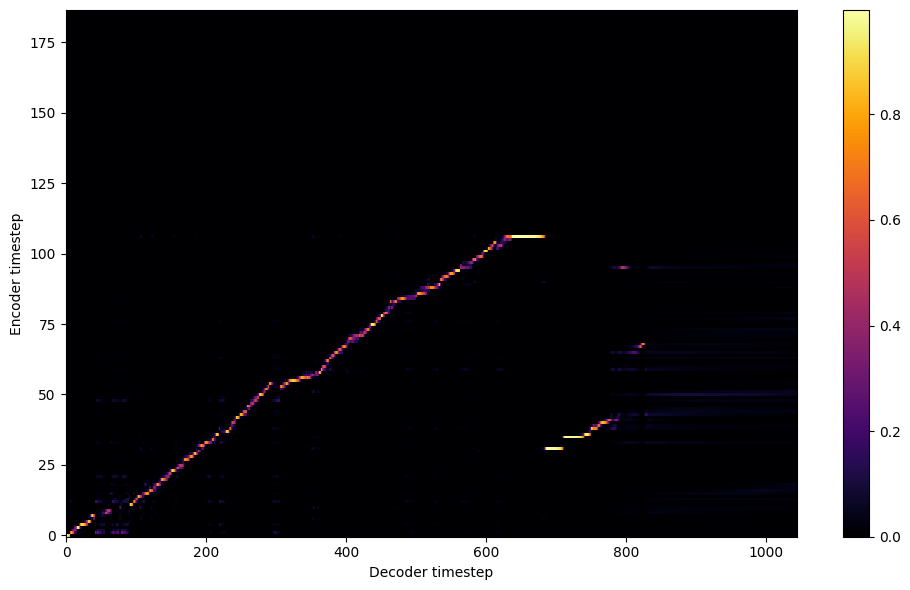


Starting Epoch: 106 Iteration: 424


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 106 Validation loss 428:  0.170501  Time: 0.4m LR: 0.000300


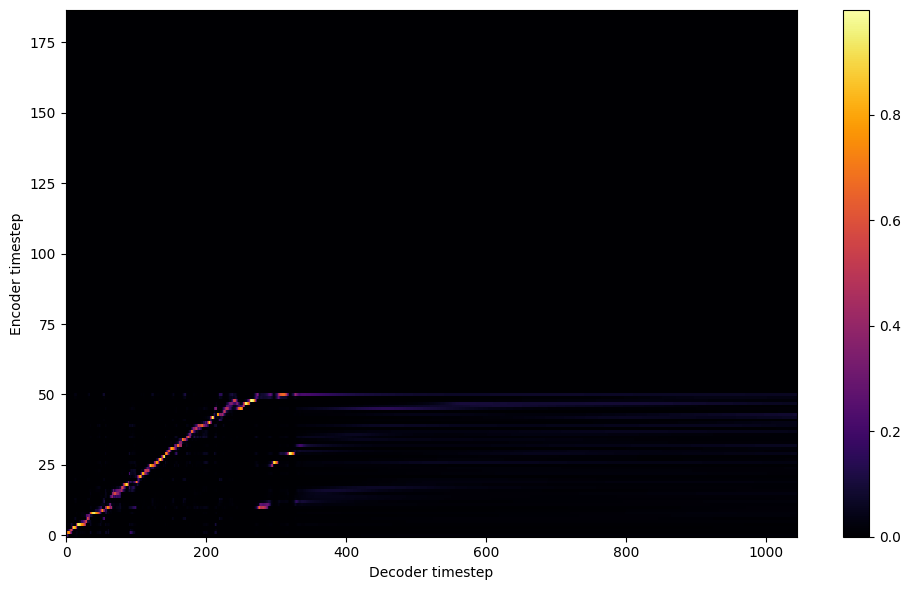


Starting Epoch: 107 Iteration: 428


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 107 Validation loss 432:  0.170388  Time: 0.4m LR: 0.000300


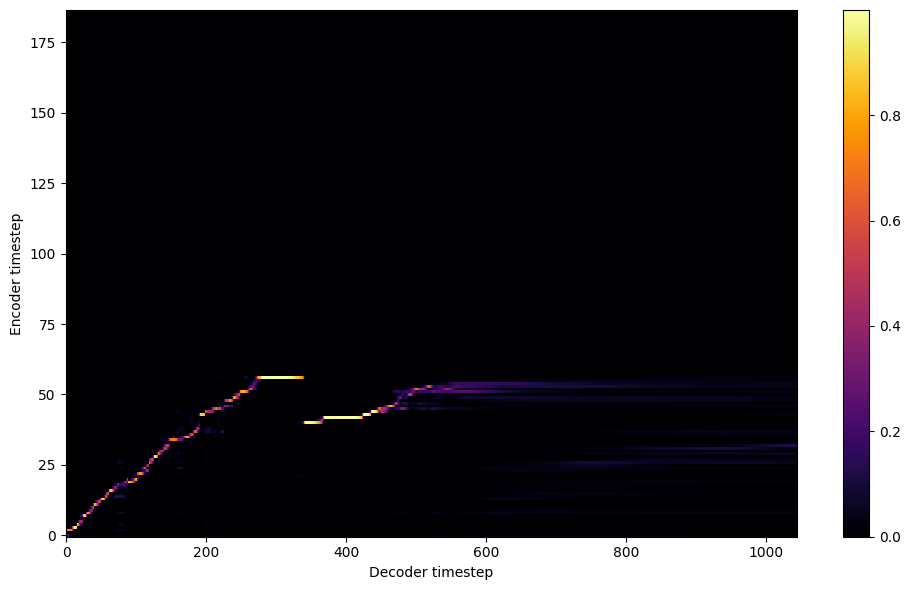


Starting Epoch: 108 Iteration: 432


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 108 Validation loss 436:  0.169193  Time: 0.4m LR: 0.000300


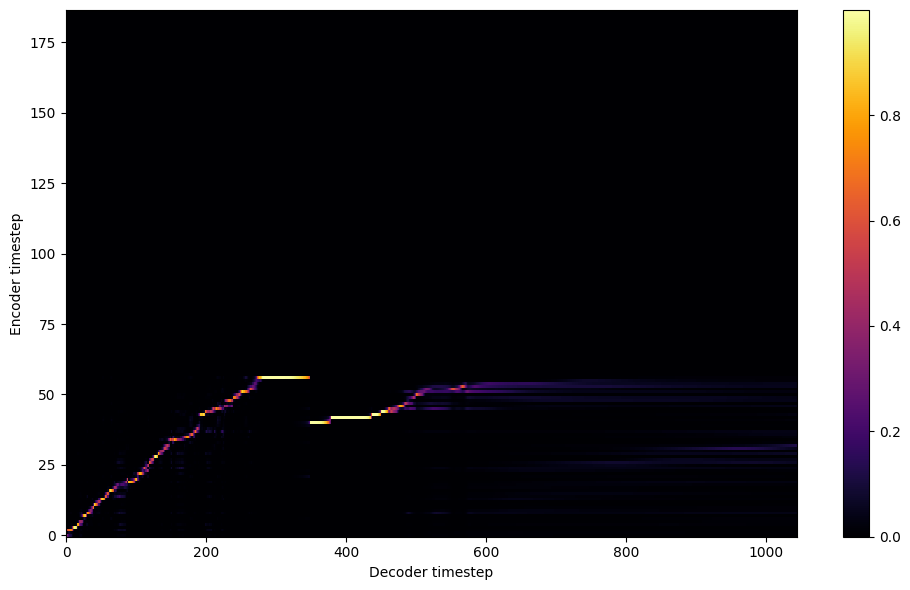


Starting Epoch: 109 Iteration: 436


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 109 Validation loss 440:  0.168893  Time: 0.4m LR: 0.000300


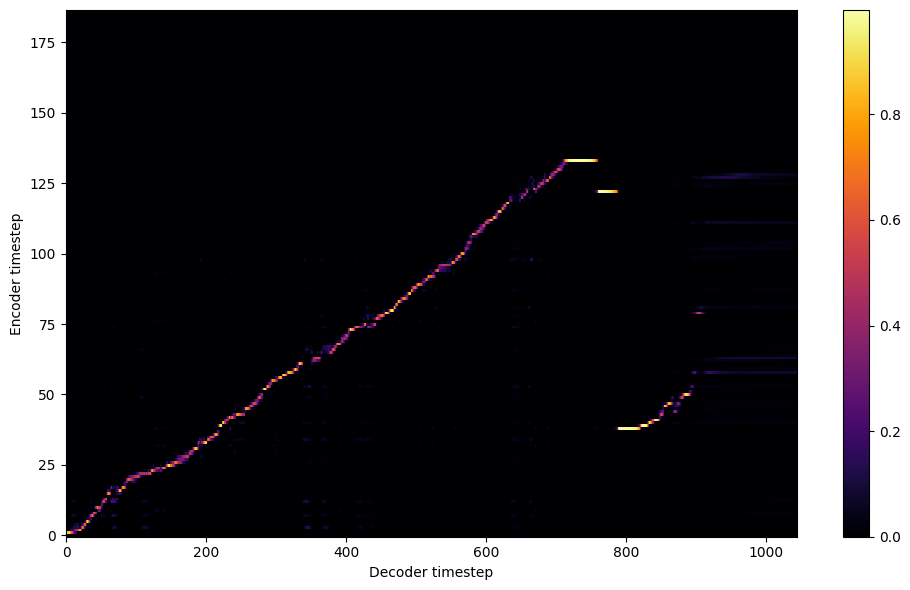

Saving model and optimizer state at iteration 440 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 110 Iteration: 440


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 110 Validation loss 444:  0.166232  Time: 0.4m LR: 0.000300


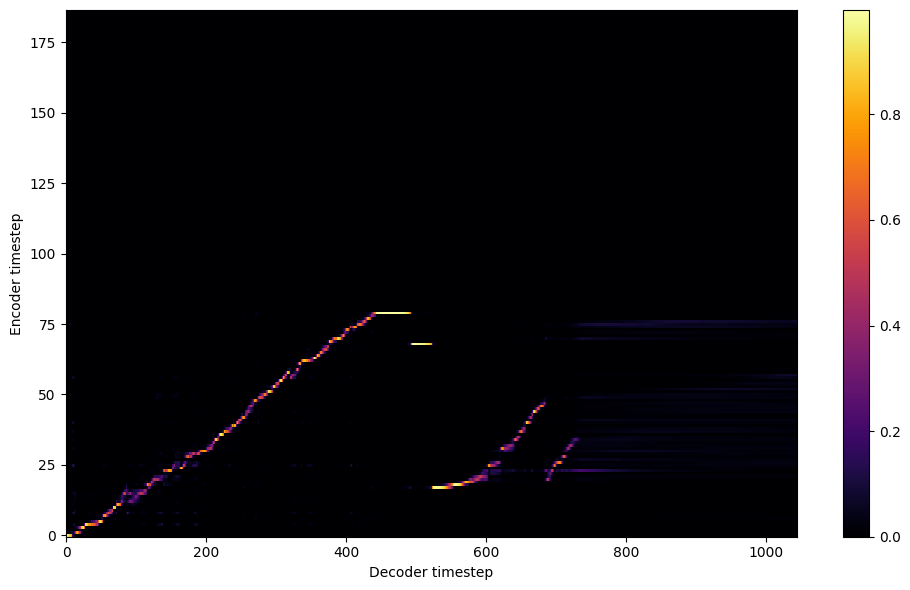


Starting Epoch: 111 Iteration: 444


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 111 Validation loss 448:  0.164938  Time: 0.4m LR: 0.000300


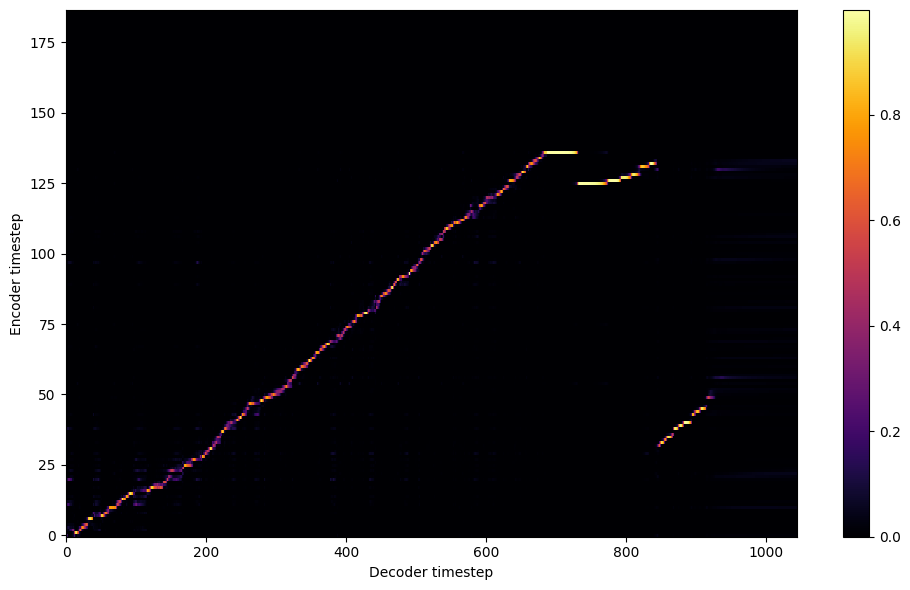


Starting Epoch: 112 Iteration: 448


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 112 Validation loss 452:  0.164145  Time: 0.4m LR: 0.000300


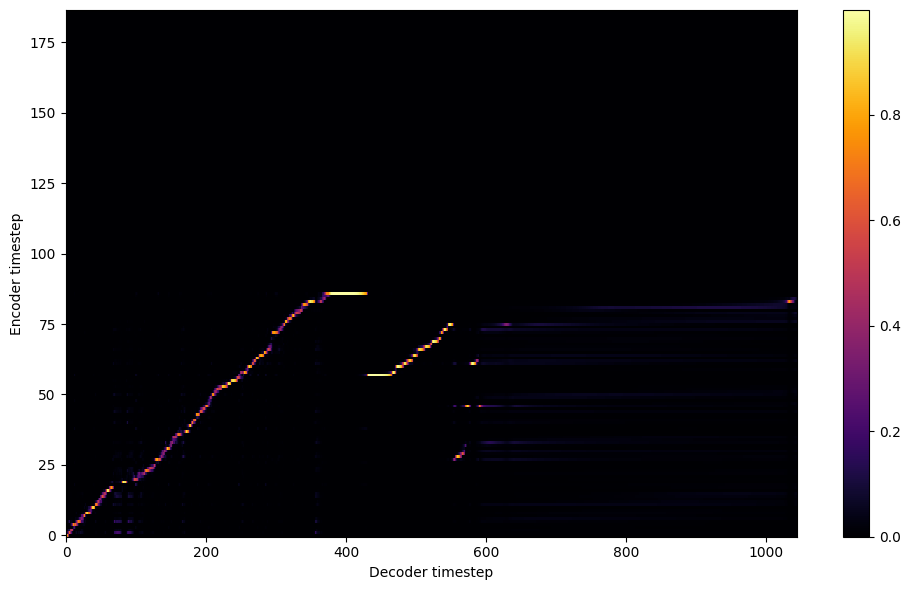


Starting Epoch: 113 Iteration: 452


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 113 Validation loss 456:  0.163879  Time: 0.4m LR: 0.000300


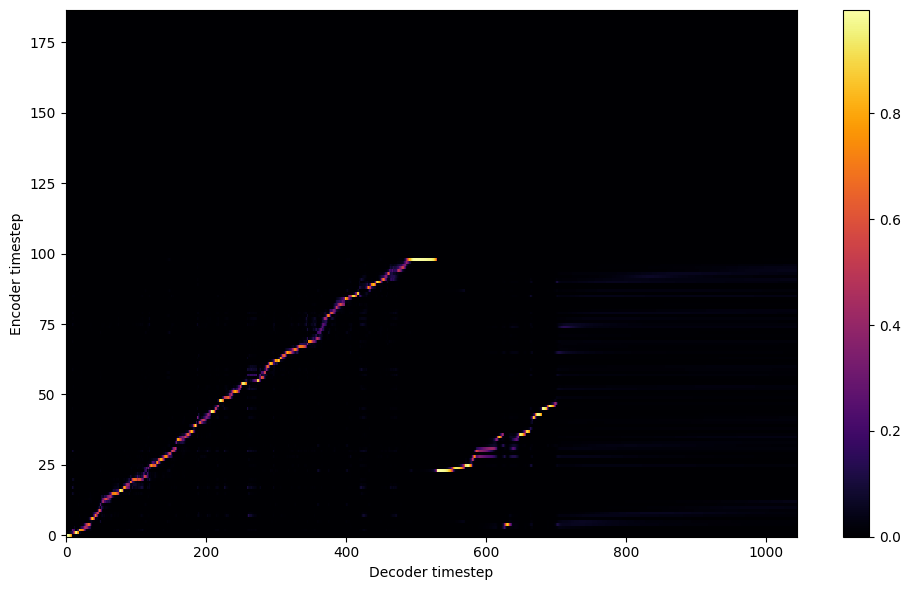


Starting Epoch: 114 Iteration: 456


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 114 Validation loss 460:  0.163560  Time: 0.4m LR: 0.000300


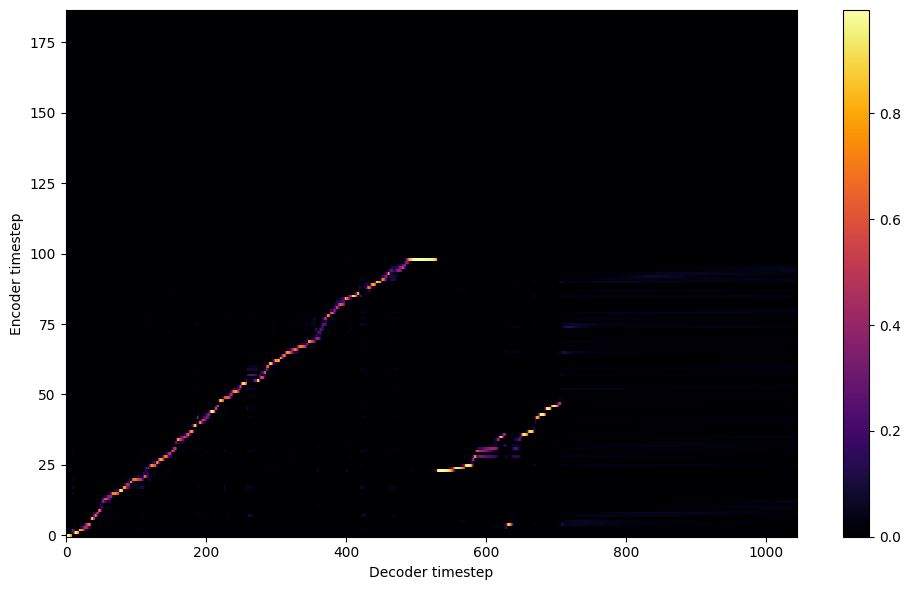


Starting Epoch: 115 Iteration: 460


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 115 Validation loss 464:  0.162211  Time: 0.4m LR: 0.000300


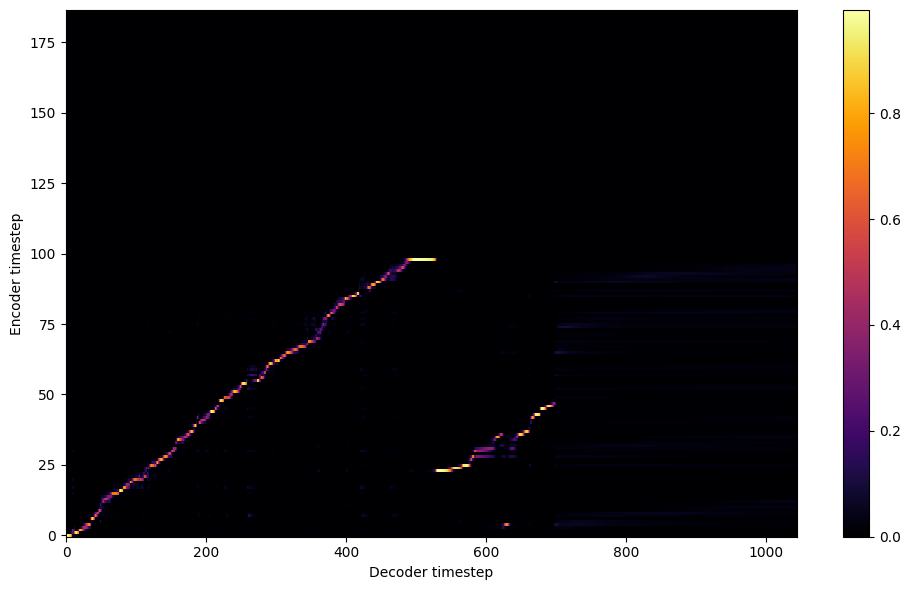


Starting Epoch: 116 Iteration: 464


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 116 Validation loss 468:  0.161693  Time: 0.4m LR: 0.000300


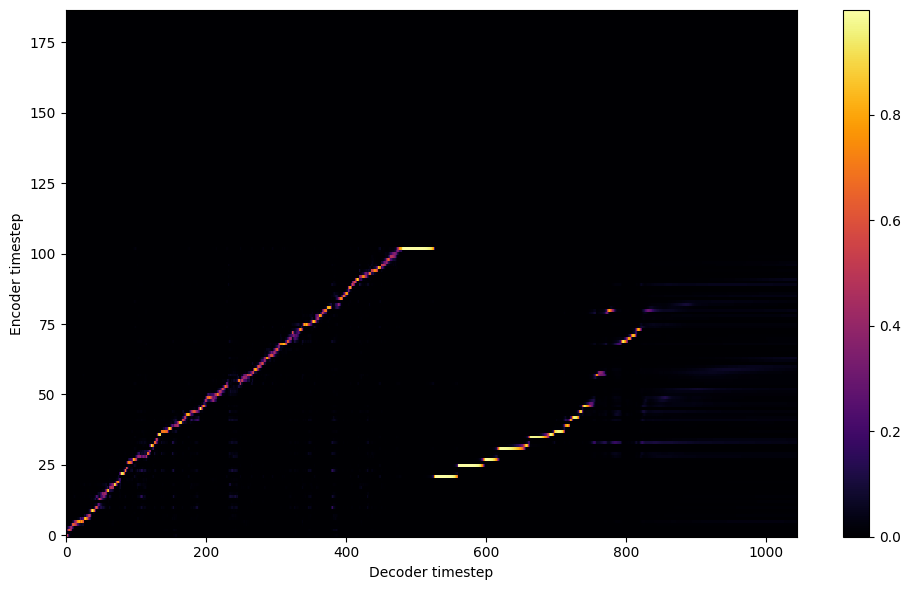


Starting Epoch: 117 Iteration: 468


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 117 Validation loss 472:  0.164798  Time: 0.4m LR: 0.000300


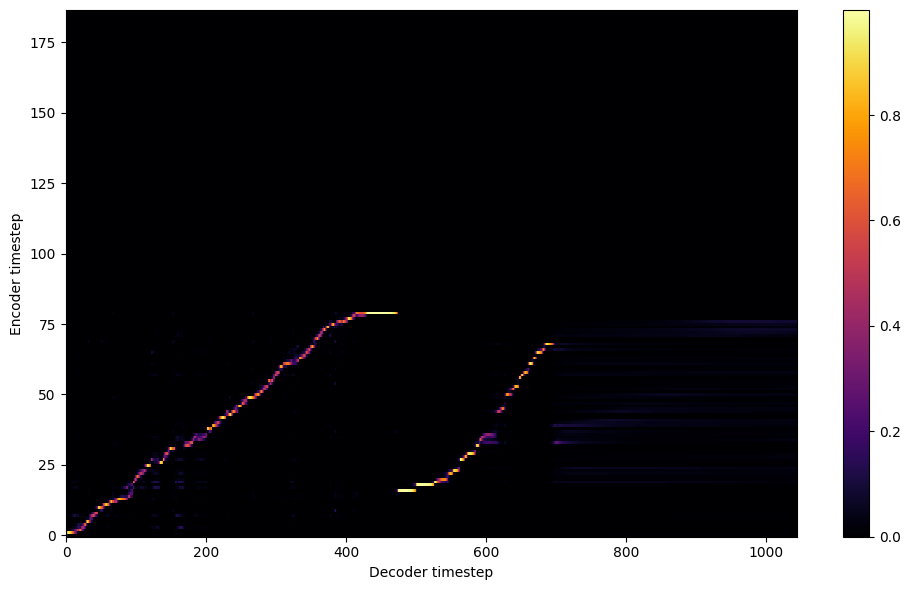


Starting Epoch: 118 Iteration: 472


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 118 Validation loss 476:  0.160062  Time: 0.4m LR: 0.000300


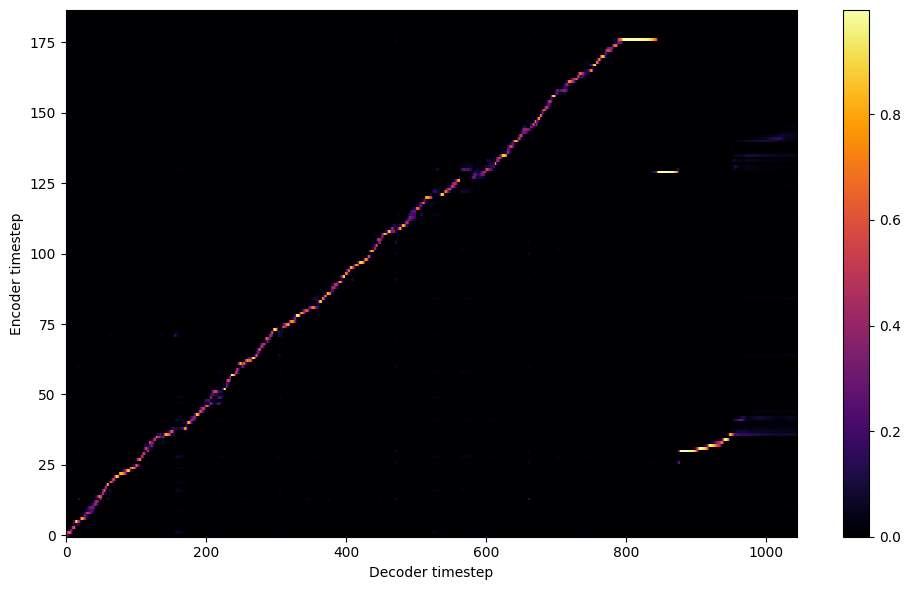


Starting Epoch: 119 Iteration: 476


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 119 Validation loss 480:  0.160492  Time: 0.4m LR: 0.000300


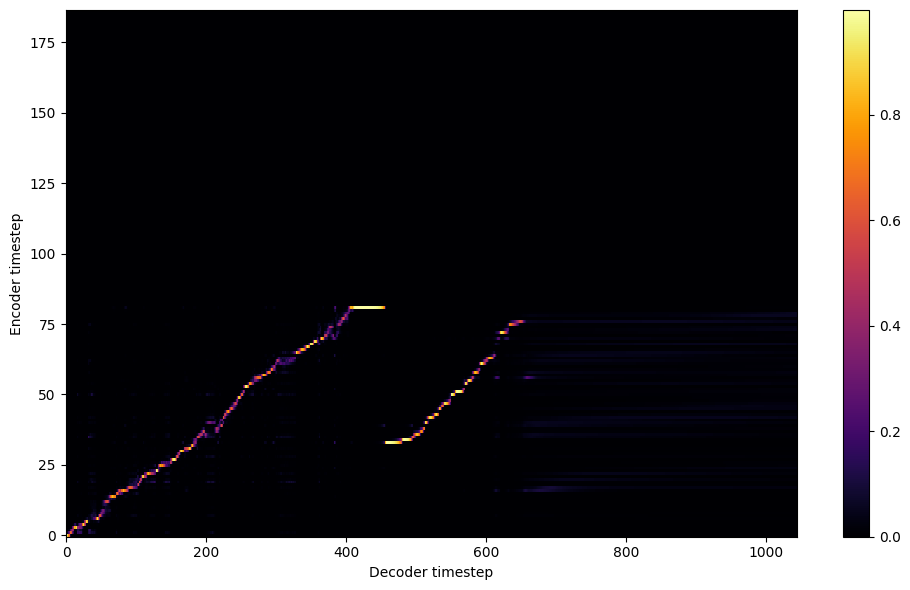

Saving model and optimizer state at iteration 480 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 120 Iteration: 480


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 120 Validation loss 484:  0.159718  Time: 0.4m LR: 0.000300


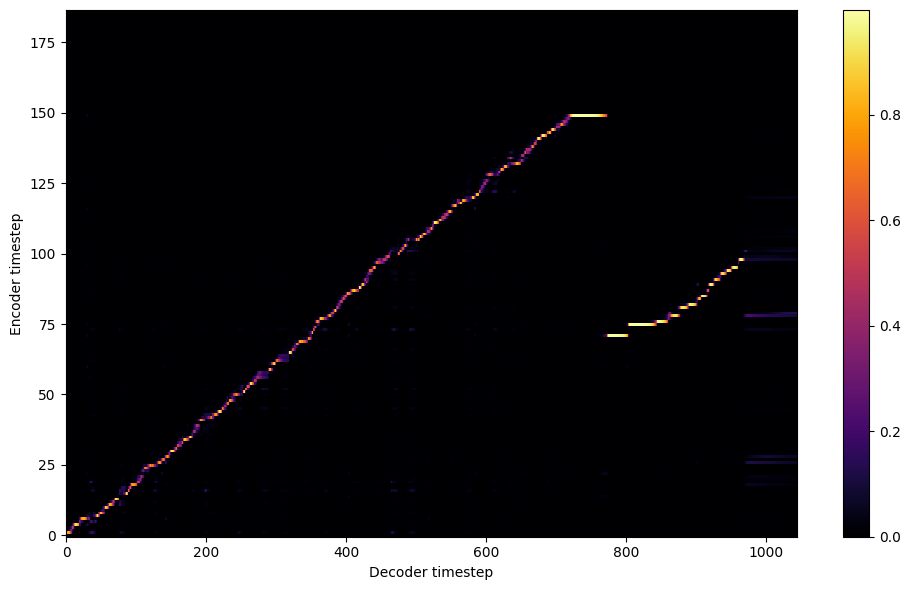


Starting Epoch: 121 Iteration: 484


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 121 Validation loss 488:  0.161117  Time: 0.4m LR: 0.000300


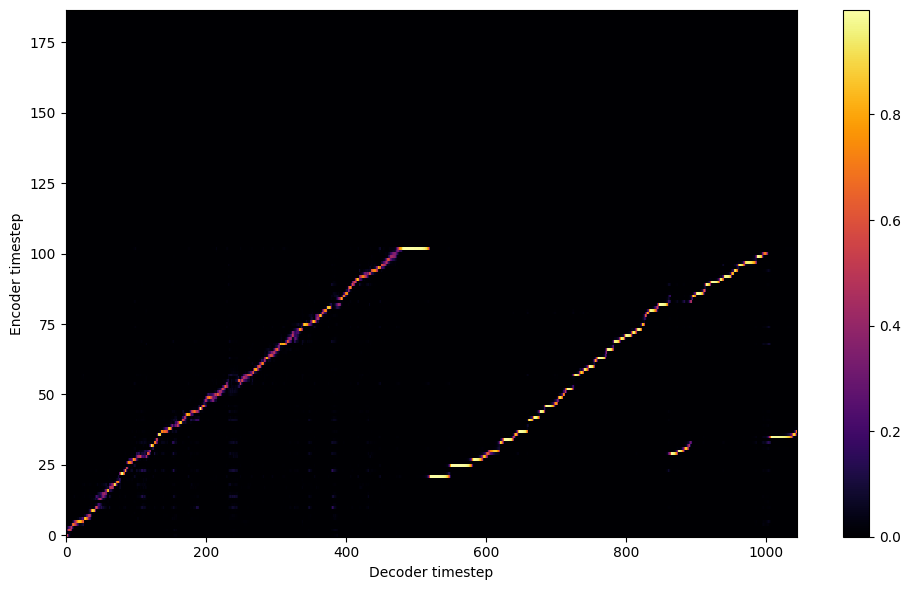


Starting Epoch: 122 Iteration: 488


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 122 Validation loss 492:  0.159816  Time: 0.4m LR: 0.000300


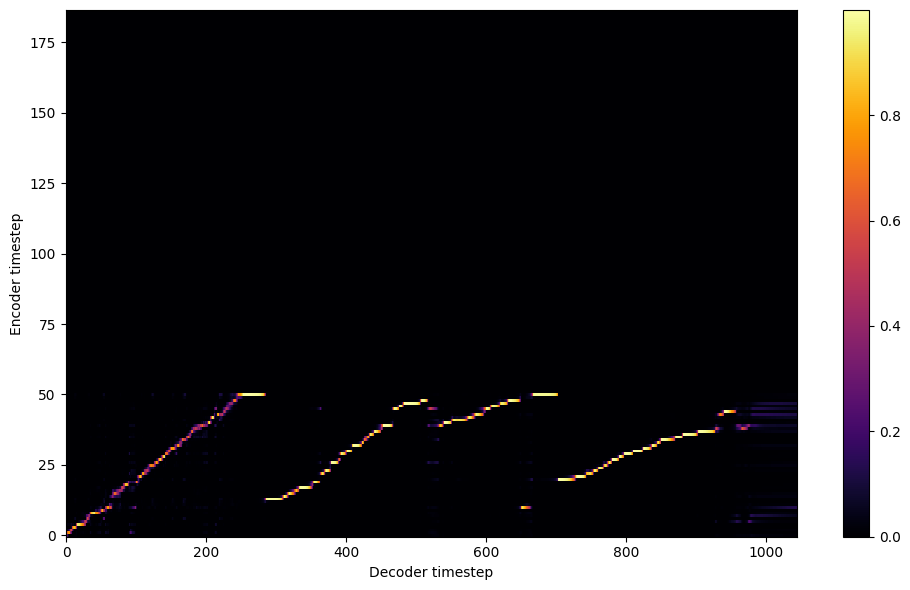


Starting Epoch: 123 Iteration: 492


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 123 Validation loss 496:  0.161249  Time: 0.4m LR: 0.000300


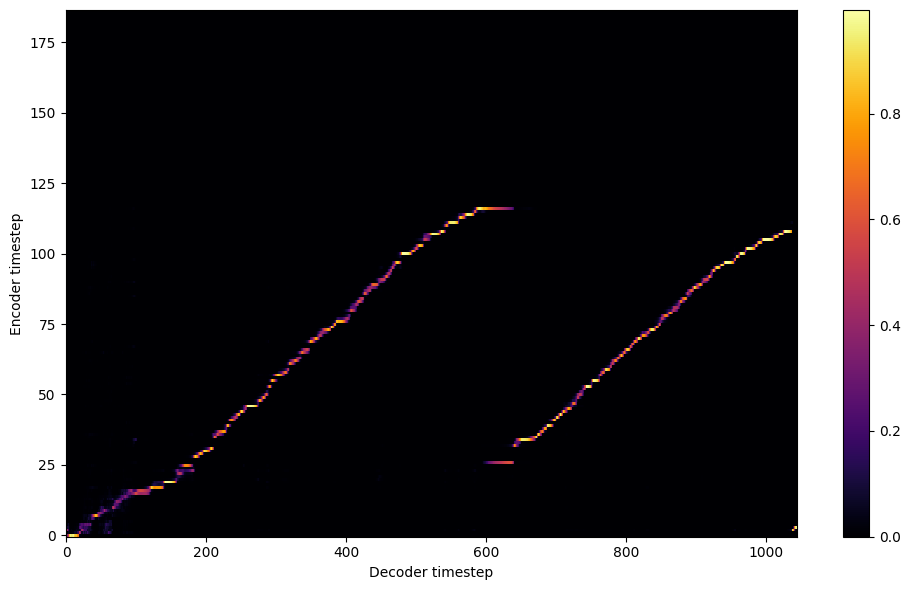


Starting Epoch: 124 Iteration: 496


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 124 Validation loss 500:  0.158754  Time: 0.4m LR: 0.000300


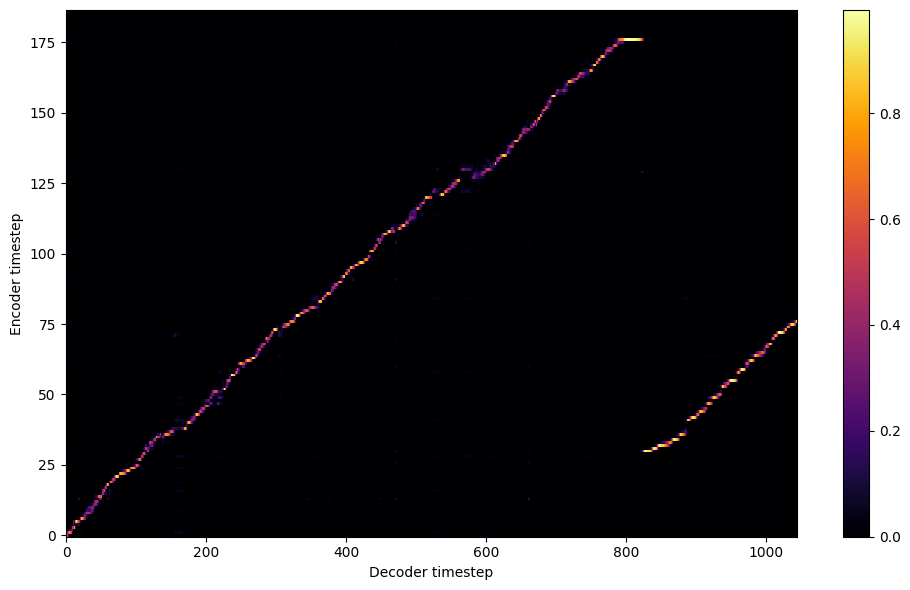


Starting Epoch: 125 Iteration: 500


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 125 Validation loss 504:  0.157457  Time: 0.4m LR: 0.000300


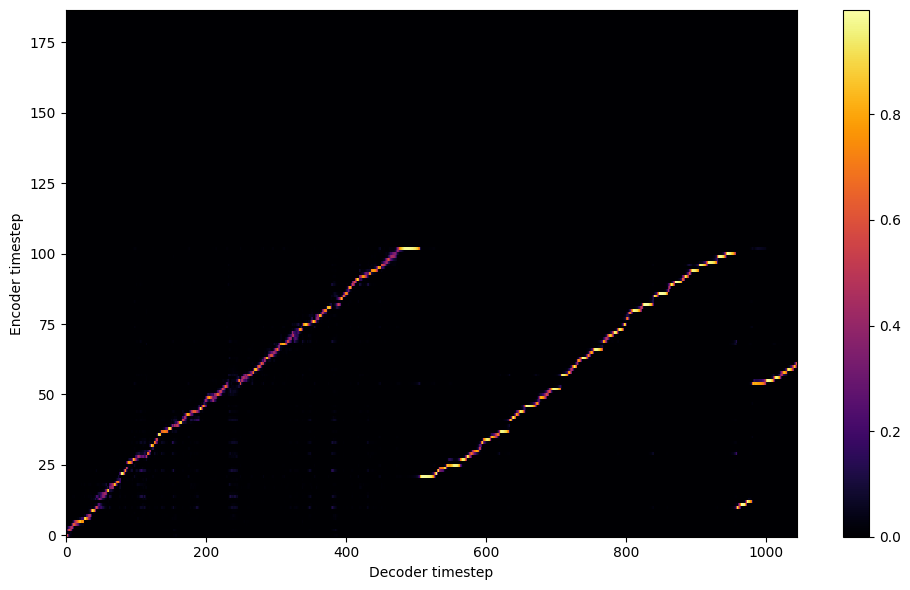


Starting Epoch: 126 Iteration: 504


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 126 Validation loss 508:  0.159680  Time: 0.4m LR: 0.000300


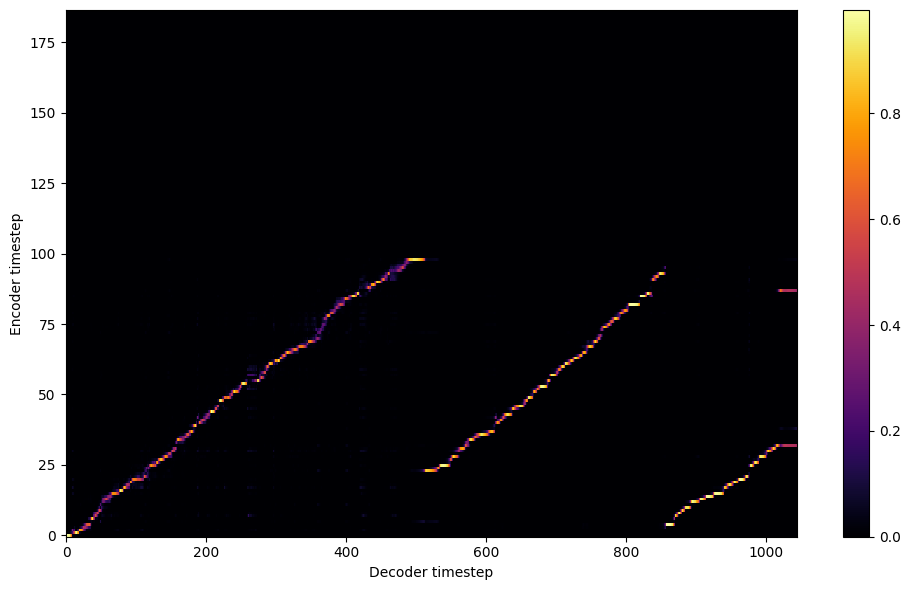


Starting Epoch: 127 Iteration: 508


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 127 Validation loss 512:  0.160907  Time: 0.4m LR: 0.000300


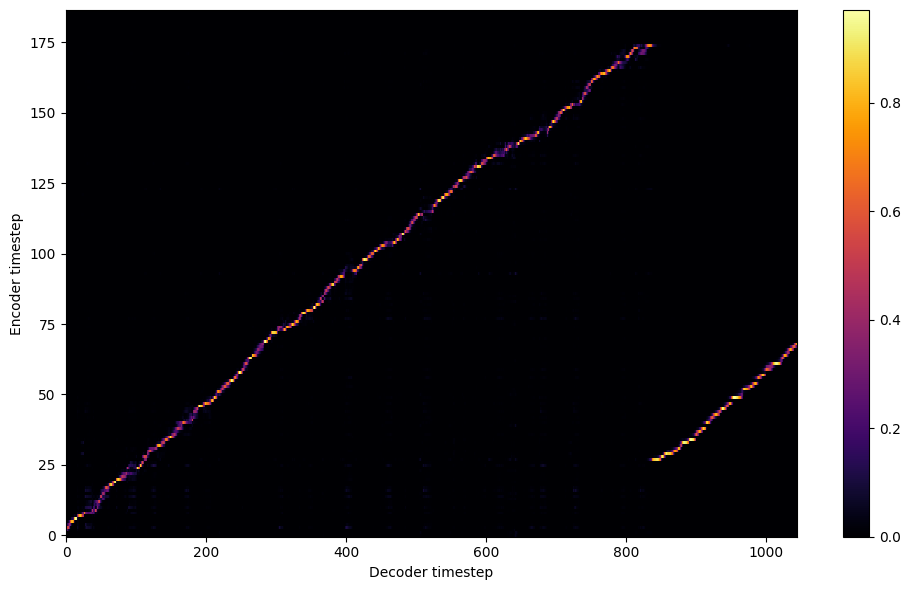


Starting Epoch: 128 Iteration: 512


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 128 Validation loss 516:  0.176635  Time: 0.4m LR: 0.000300


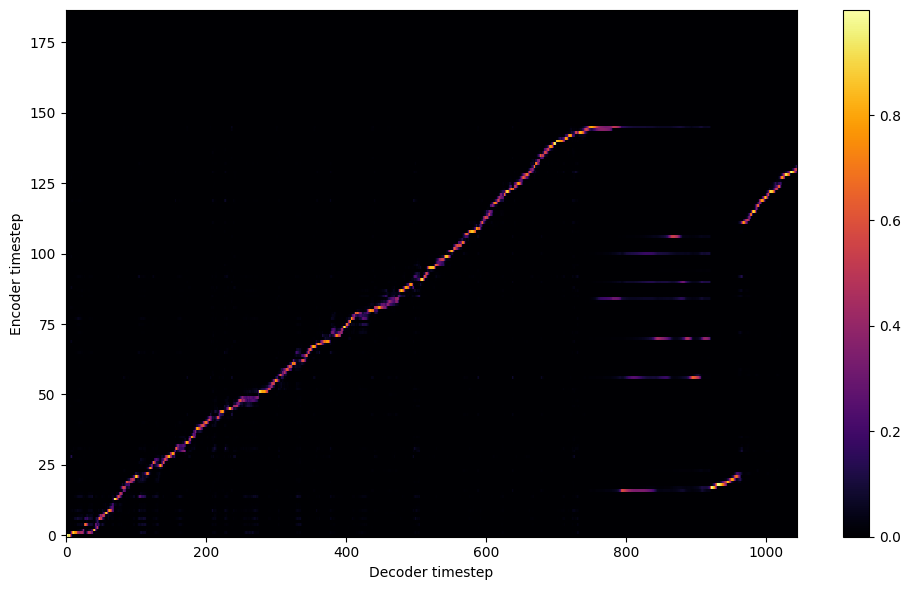


Starting Epoch: 129 Iteration: 516


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 129 Validation loss 520:  0.195016  Time: 0.4m LR: 0.000300


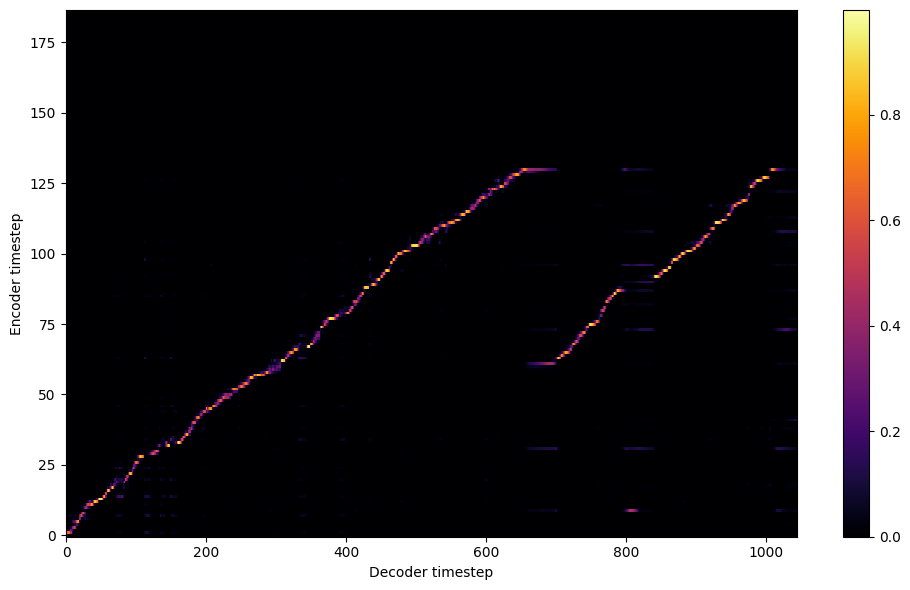

Saving model and optimizer state at iteration 520 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 130 Iteration: 520


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 130 Validation loss 524:  0.231219  Time: 0.4m LR: 0.000300


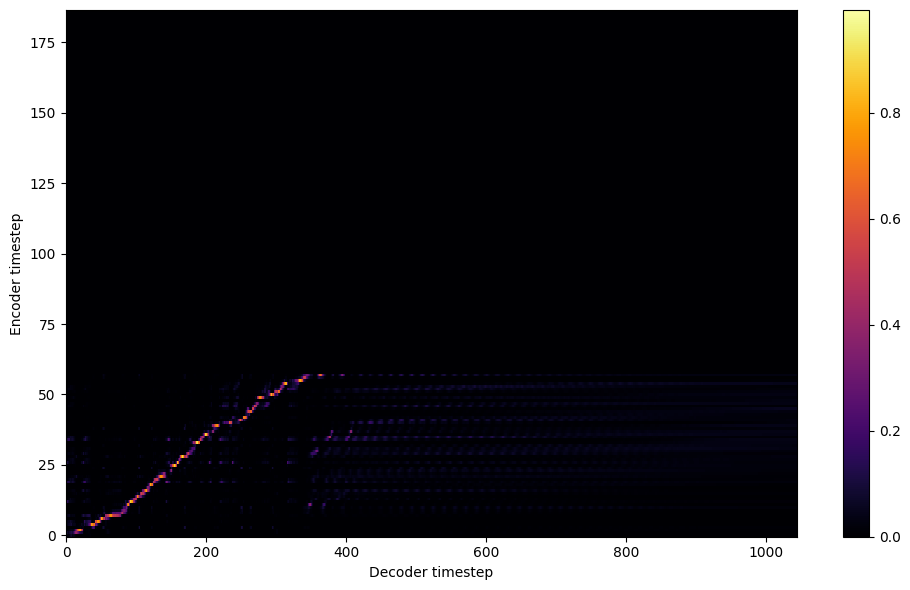


Starting Epoch: 131 Iteration: 524


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 131 Validation loss 528:  0.204936  Time: 0.4m LR: 0.000300


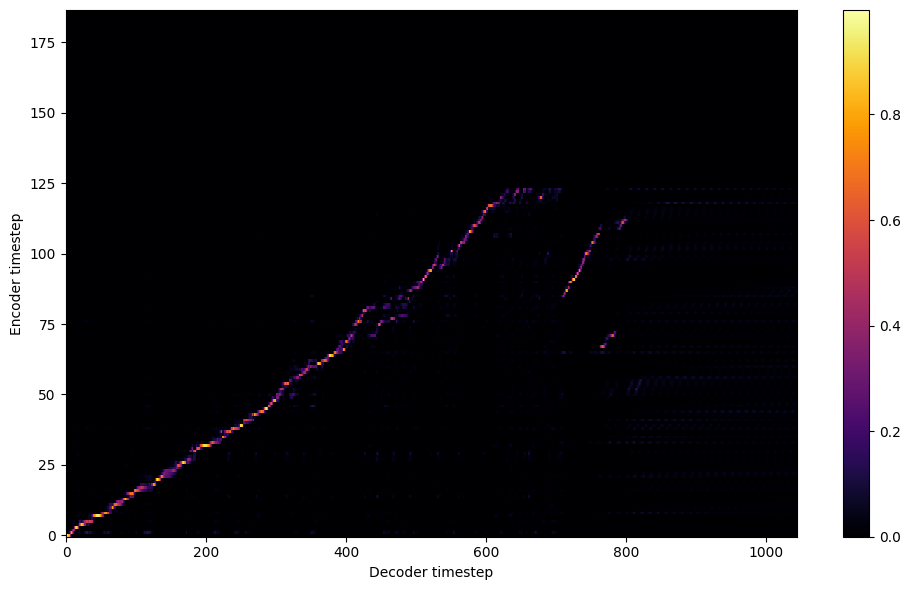


Starting Epoch: 132 Iteration: 528


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 132 Validation loss 532:  0.214634  Time: 0.4m LR: 0.000300


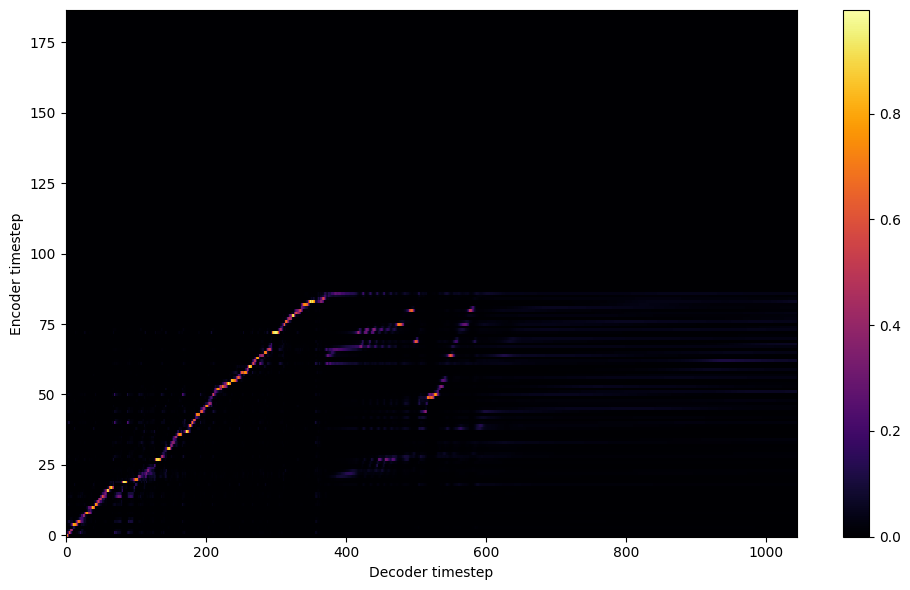


Starting Epoch: 133 Iteration: 532


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 133 Validation loss 536:  0.208414  Time: 0.4m LR: 0.000300


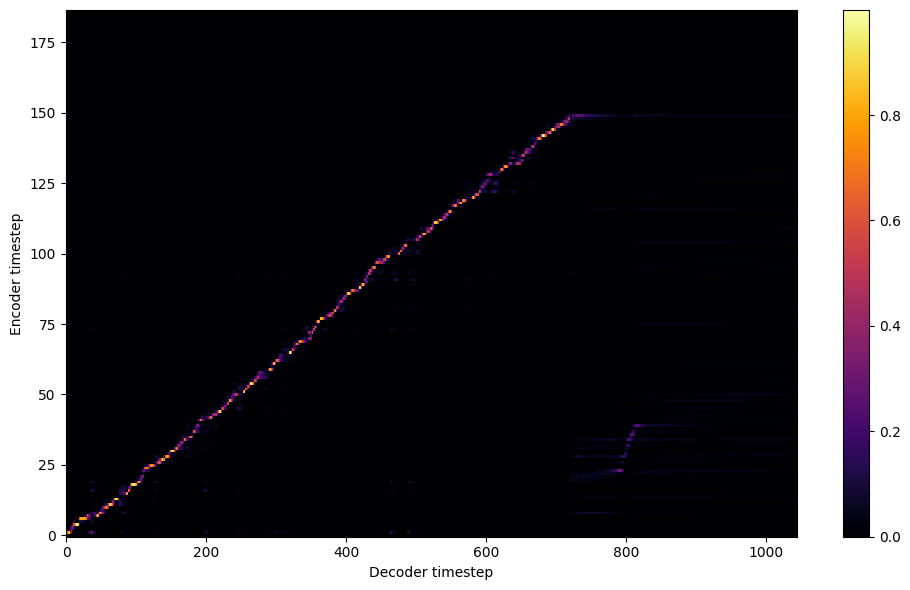


Starting Epoch: 134 Iteration: 536


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 134 Validation loss 540:  0.194367  Time: 0.4m LR: 0.000300


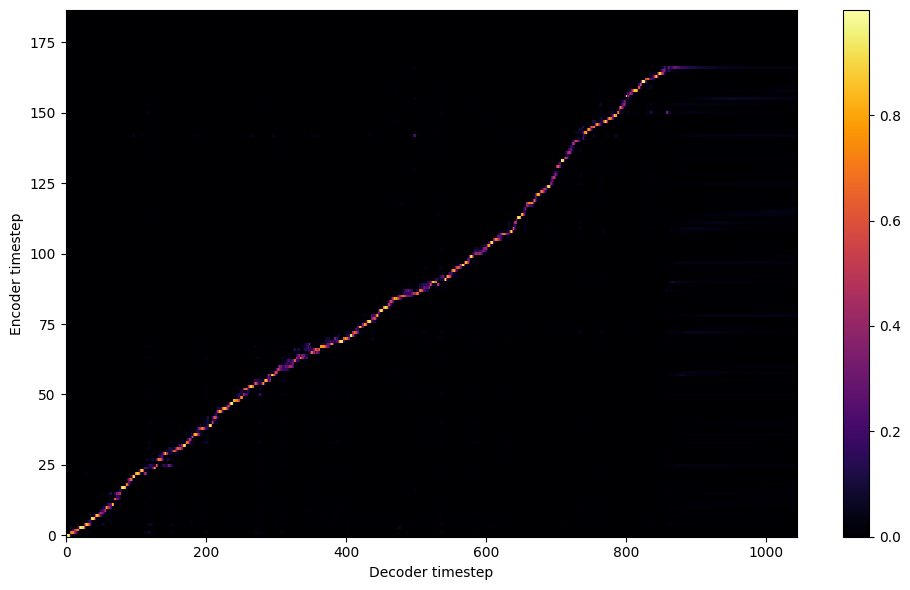


Starting Epoch: 135 Iteration: 540


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 135 Validation loss 544:  0.190807  Time: 0.4m LR: 0.000300


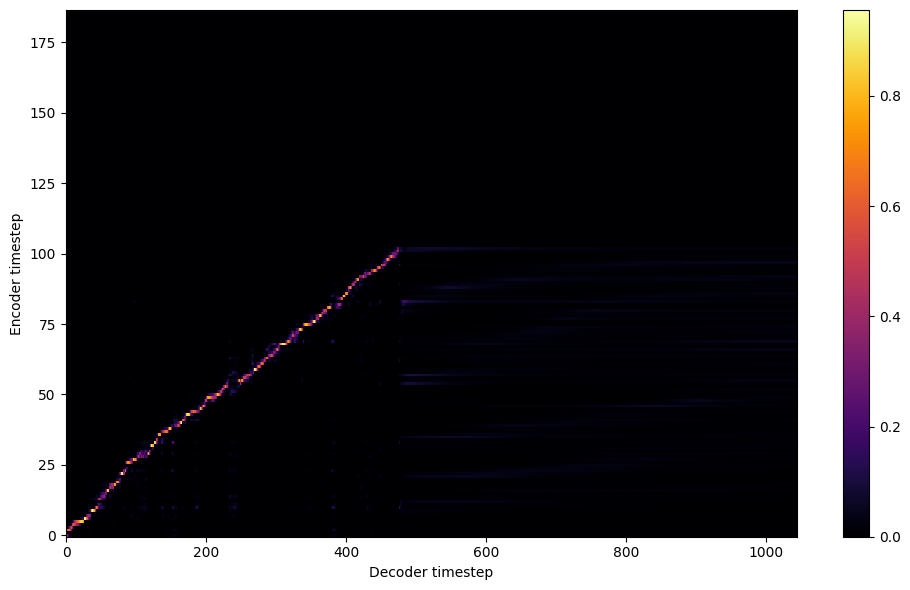


Starting Epoch: 136 Iteration: 544


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 136 Validation loss 548:  0.184536  Time: 0.4m LR: 0.000300


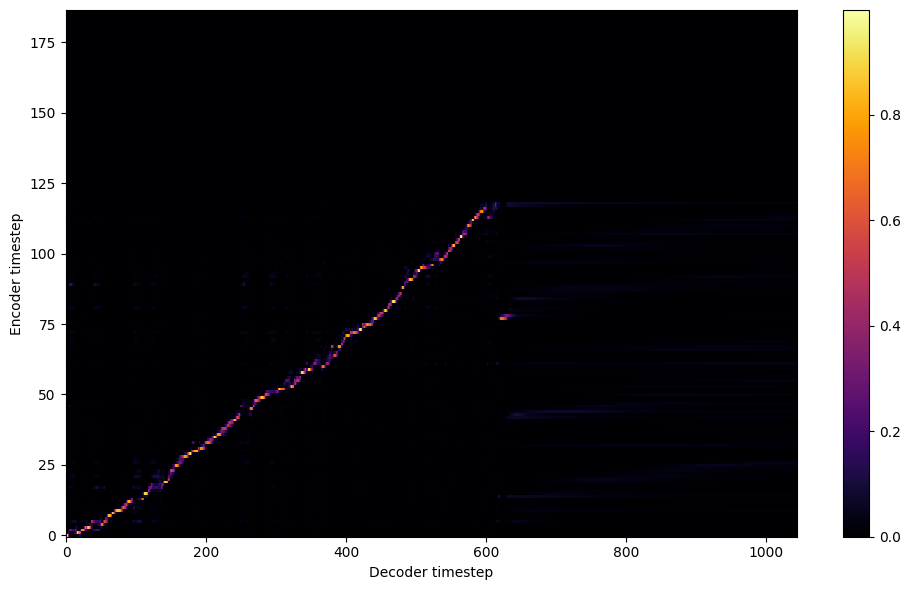


Starting Epoch: 137 Iteration: 548


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 137 Validation loss 552:  0.184104  Time: 0.4m LR: 0.000300


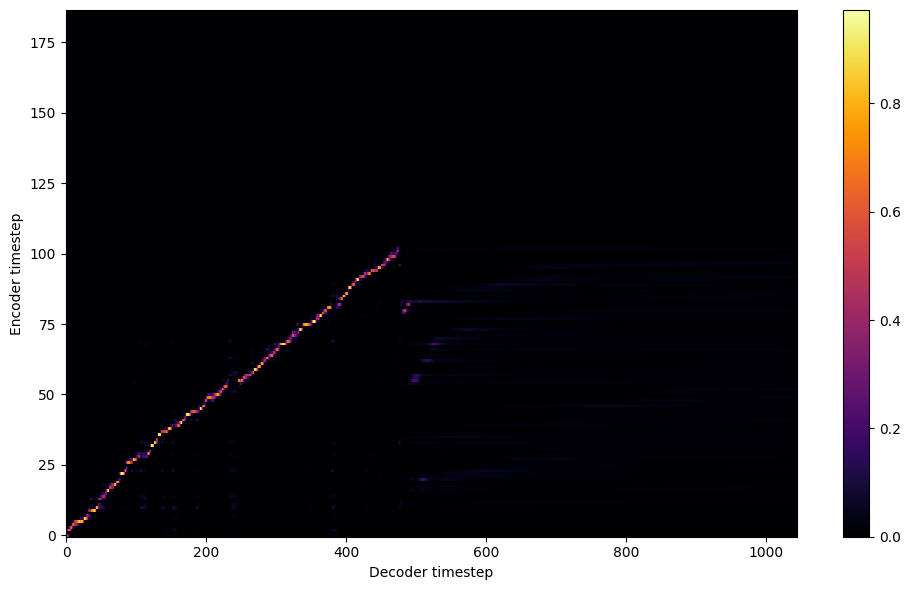


Starting Epoch: 138 Iteration: 552


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 138 Validation loss 556:  0.185407  Time: 0.4m LR: 0.000300


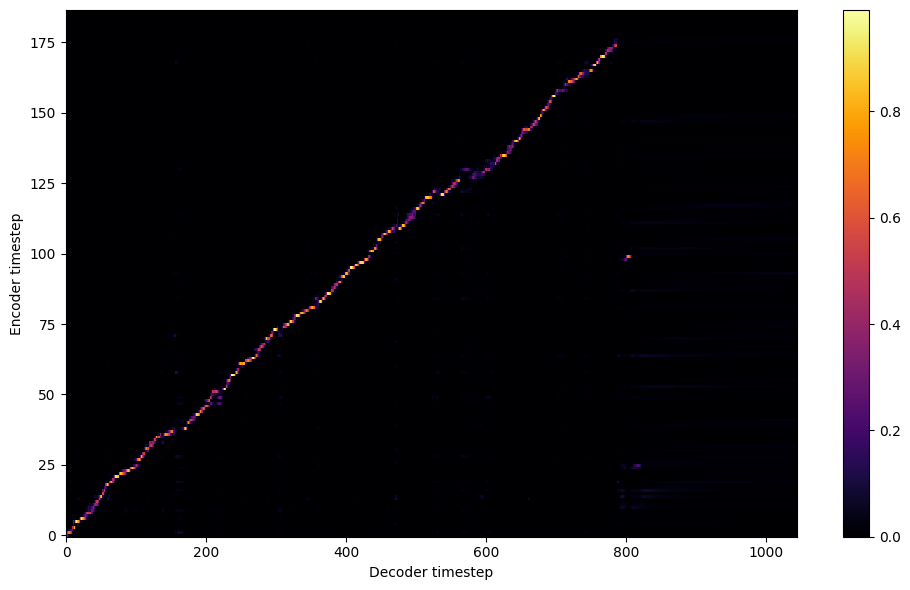


Starting Epoch: 139 Iteration: 556


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 139 Validation loss 560:  0.183759  Time: 0.4m LR: 0.000300


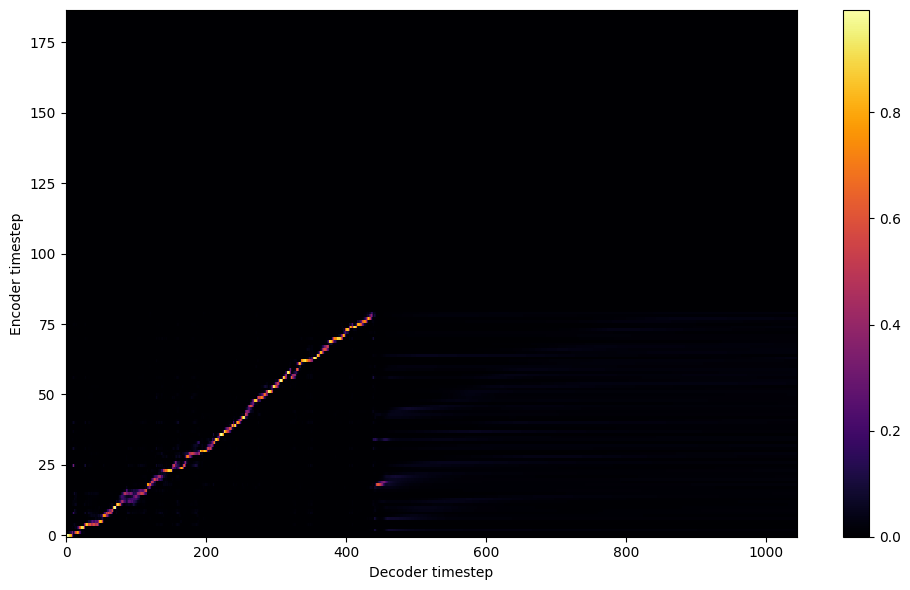

Saving model and optimizer state at iteration 560 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 140 Iteration: 560


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 140 Validation loss 564:  0.179230  Time: 0.4m LR: 0.000300


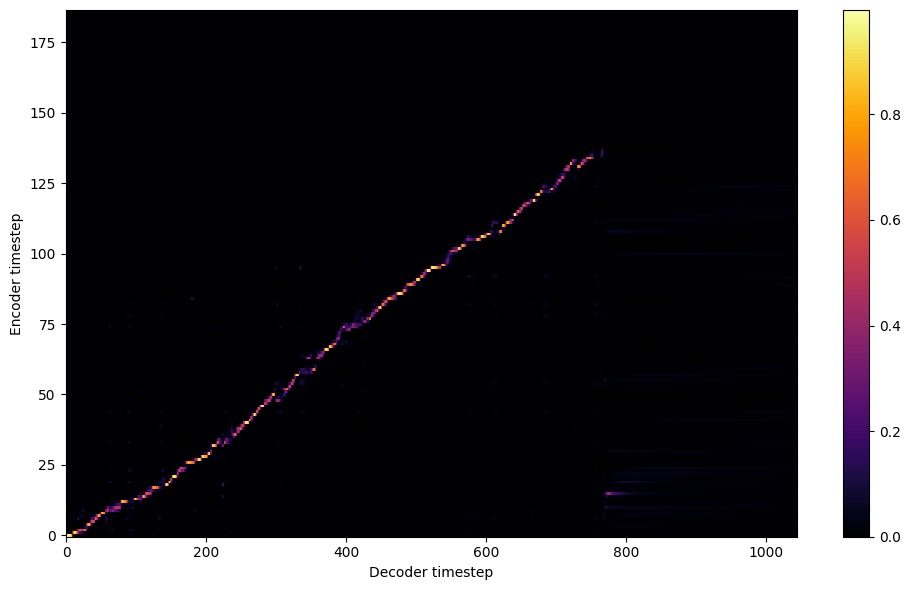


Starting Epoch: 141 Iteration: 564


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 141 Validation loss 568:  0.172217  Time: 0.4m LR: 0.000300


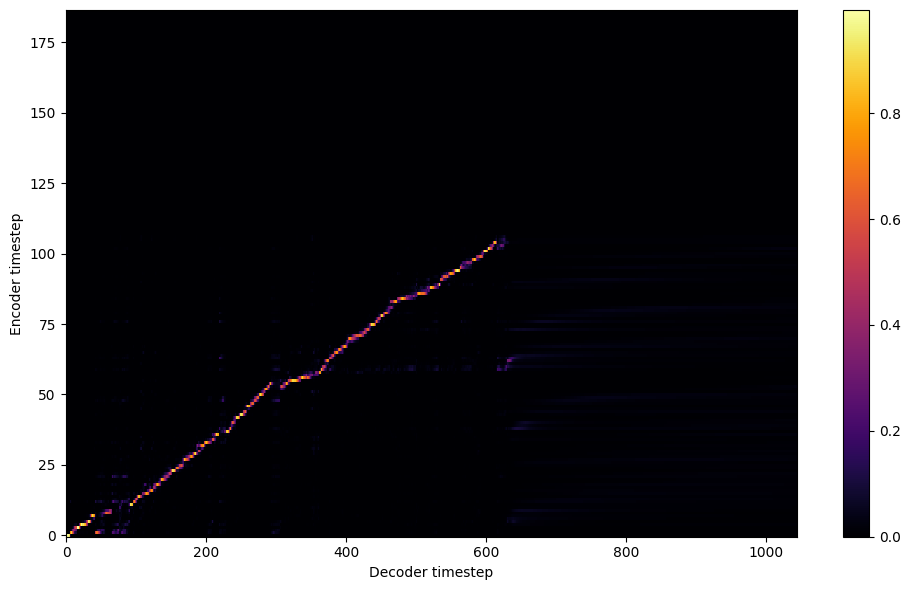


Starting Epoch: 142 Iteration: 568


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 142 Validation loss 572:  0.166108  Time: 0.4m LR: 0.000300


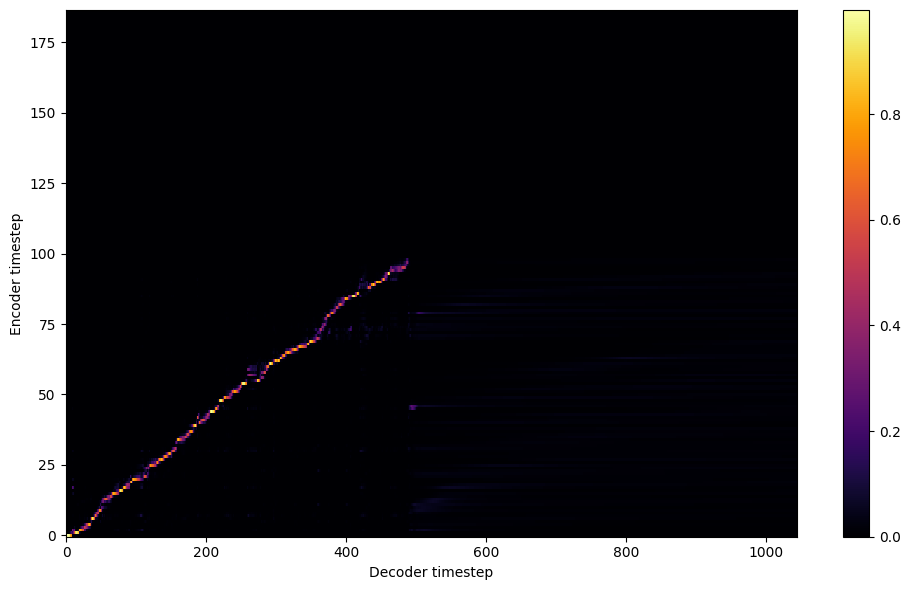


Starting Epoch: 143 Iteration: 572


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 143 Validation loss 576:  0.163994  Time: 0.4m LR: 0.000300


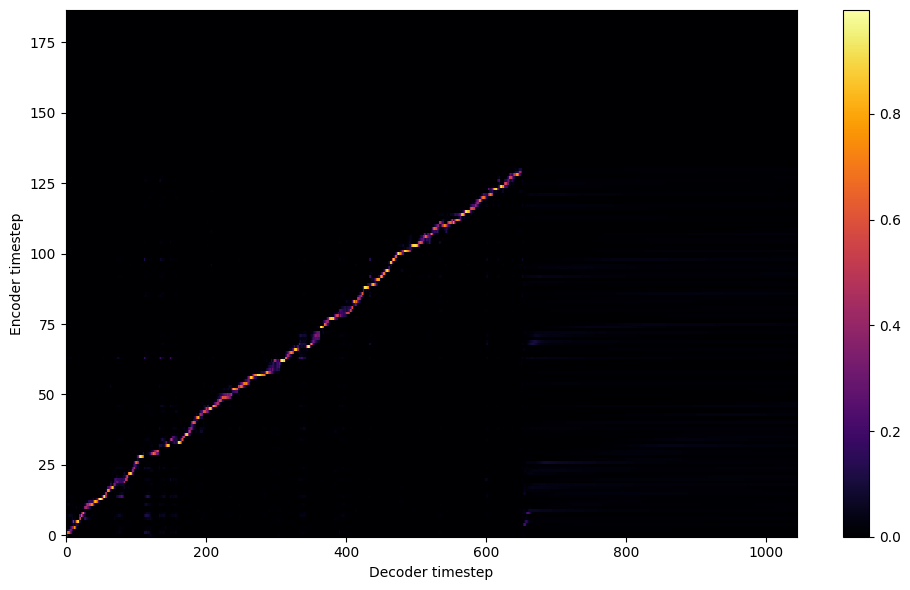


Starting Epoch: 144 Iteration: 576


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 144 Validation loss 580:  0.161245  Time: 0.4m LR: 0.000300


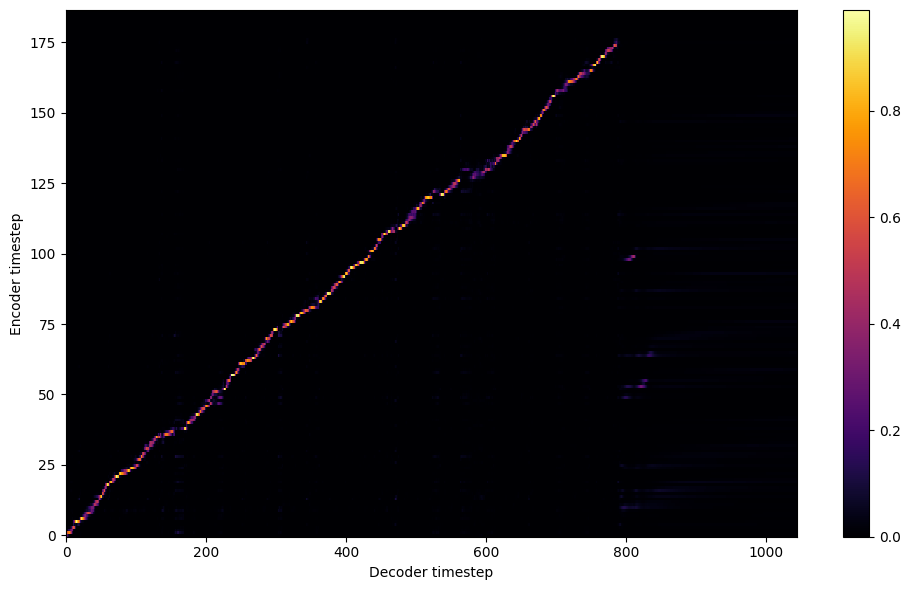


Starting Epoch: 145 Iteration: 580


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 145 Validation loss 584:  0.159583  Time: 0.4m LR: 0.000300


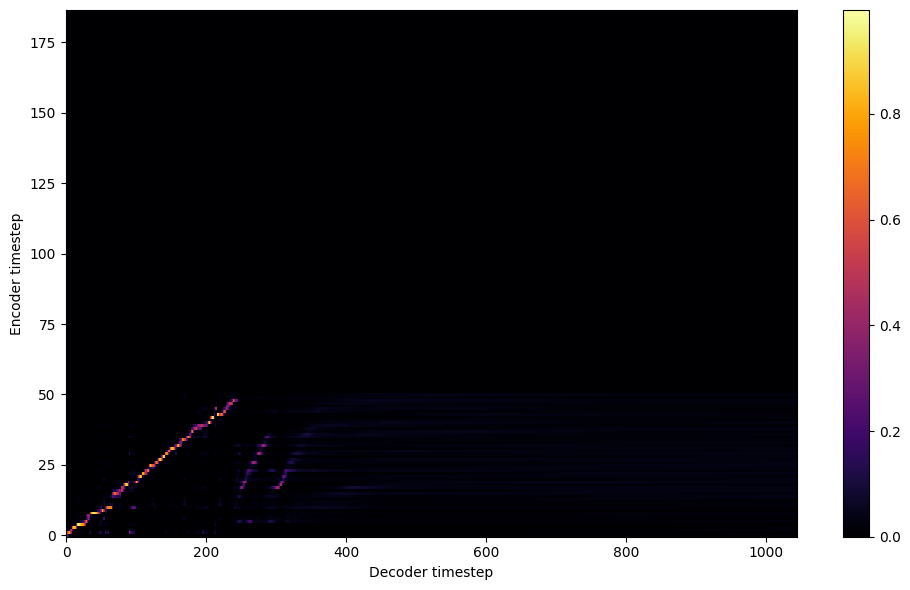


Starting Epoch: 146 Iteration: 584


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 146 Validation loss 588:  0.162340  Time: 0.4m LR: 0.000300


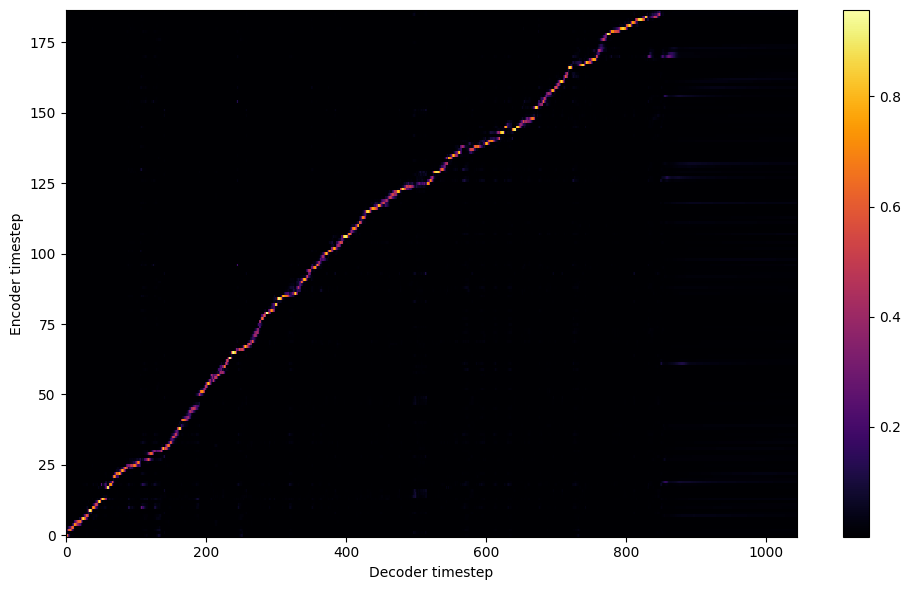


Starting Epoch: 147 Iteration: 588


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 147 Validation loss 592:  0.171812  Time: 0.4m LR: 0.000300


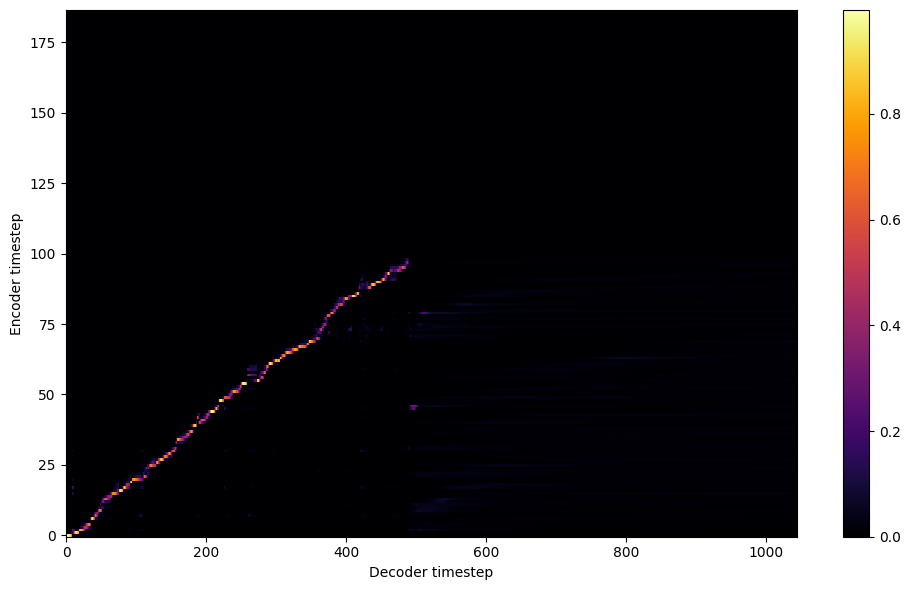


Starting Epoch: 148 Iteration: 592


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 148 Validation loss 596:  0.163228  Time: 0.4m LR: 0.000300


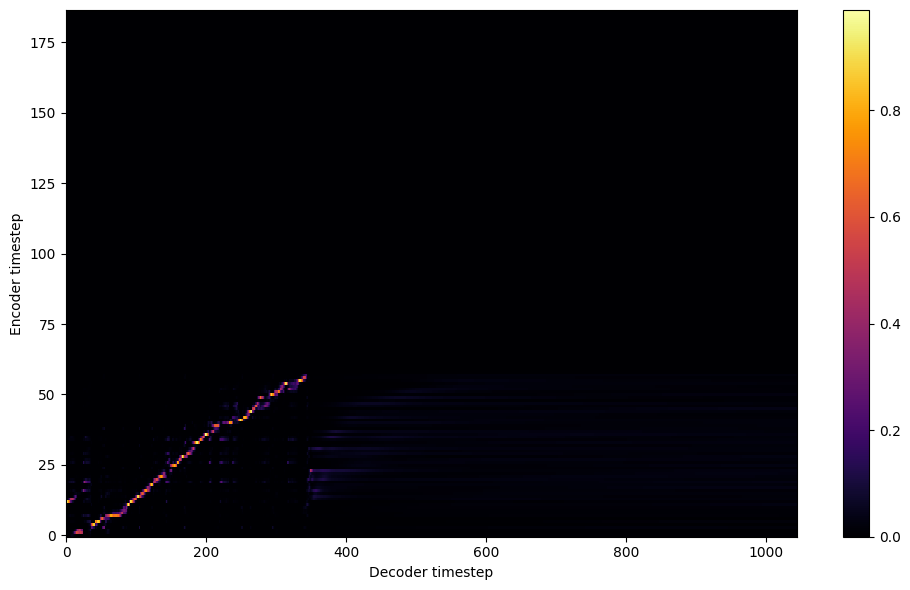


Starting Epoch: 149 Iteration: 596


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 149 Validation loss 600:  0.162578  Time: 0.4m LR: 0.000300


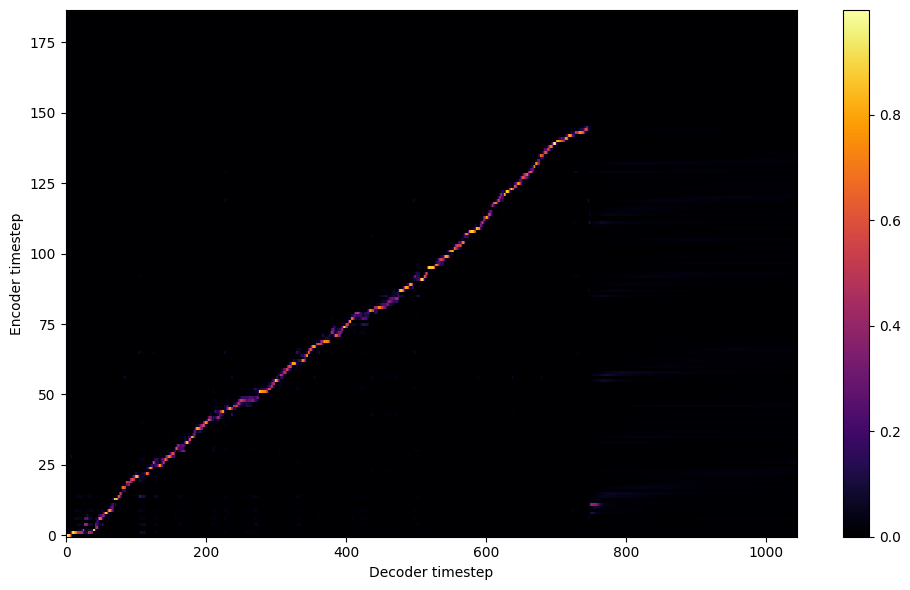

Saving model and optimizer state at iteration 600 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 150 Iteration: 600


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 150 Validation loss 604:  0.157426  Time: 0.4m LR: 0.000300


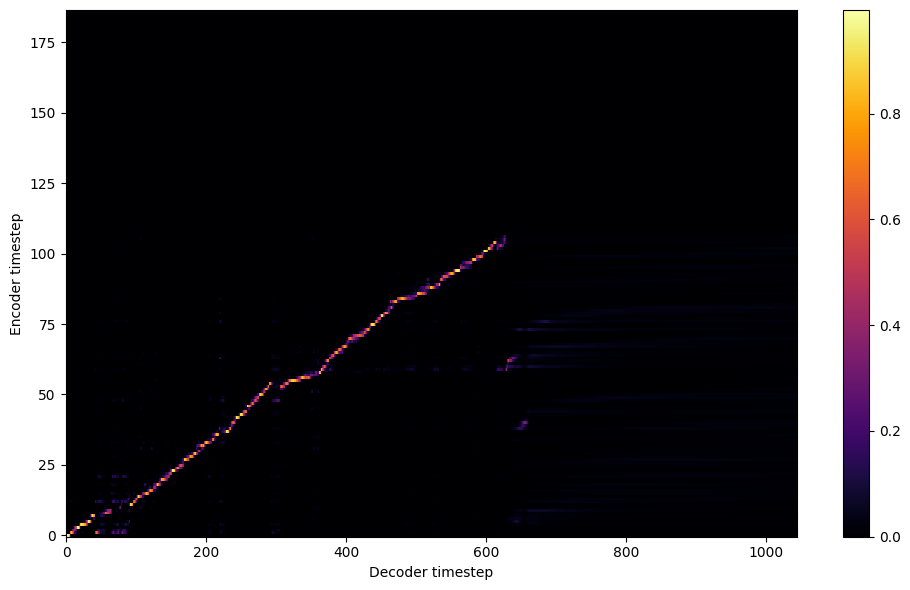


Starting Epoch: 151 Iteration: 604


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 151 Validation loss 608:  0.155583  Time: 0.4m LR: 0.000300


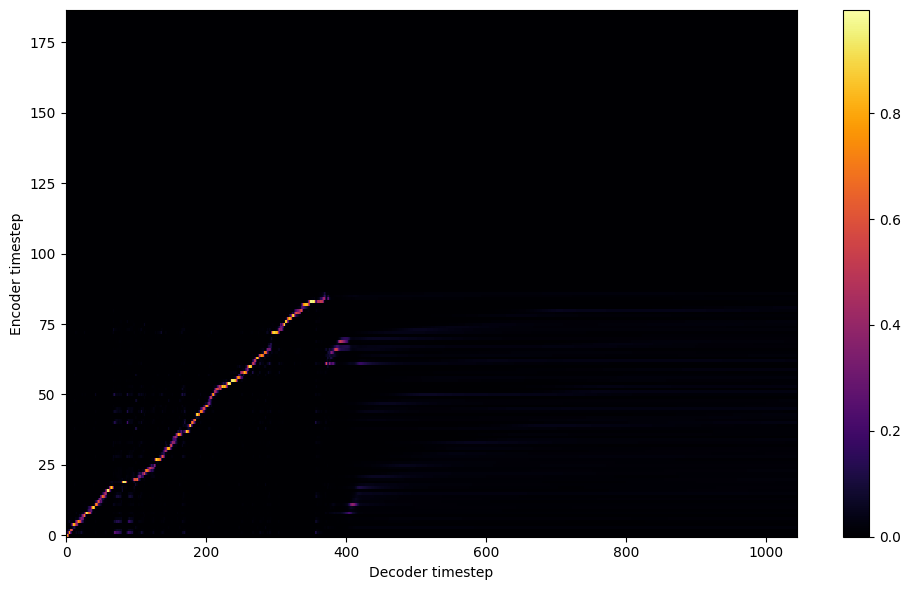


Starting Epoch: 152 Iteration: 608


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 152 Validation loss 612:  0.154989  Time: 0.4m LR: 0.000300


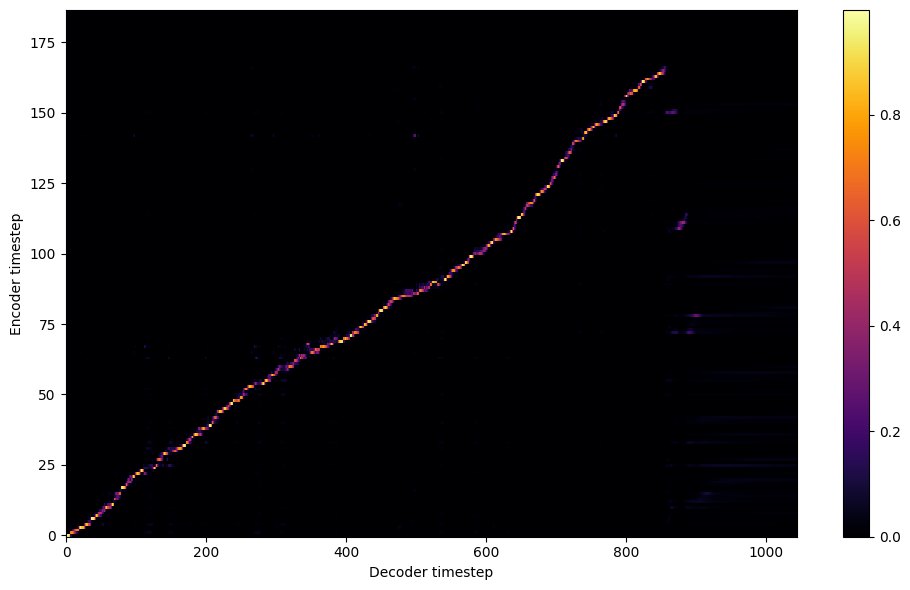


Starting Epoch: 153 Iteration: 612


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 153 Validation loss 616:  0.153550  Time: 0.4m LR: 0.000300


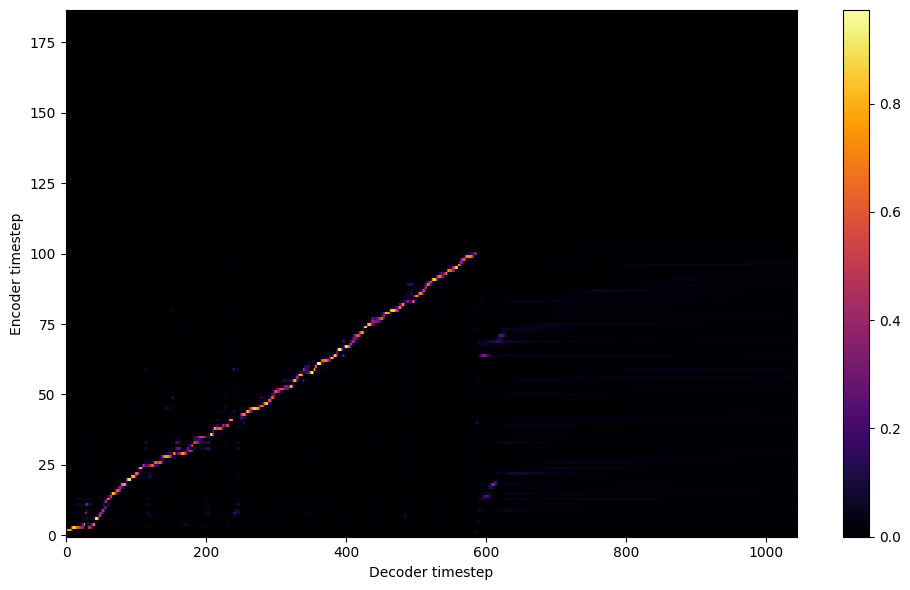


Starting Epoch: 154 Iteration: 616


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 154 Validation loss 620:  0.152419  Time: 0.4m LR: 0.000300


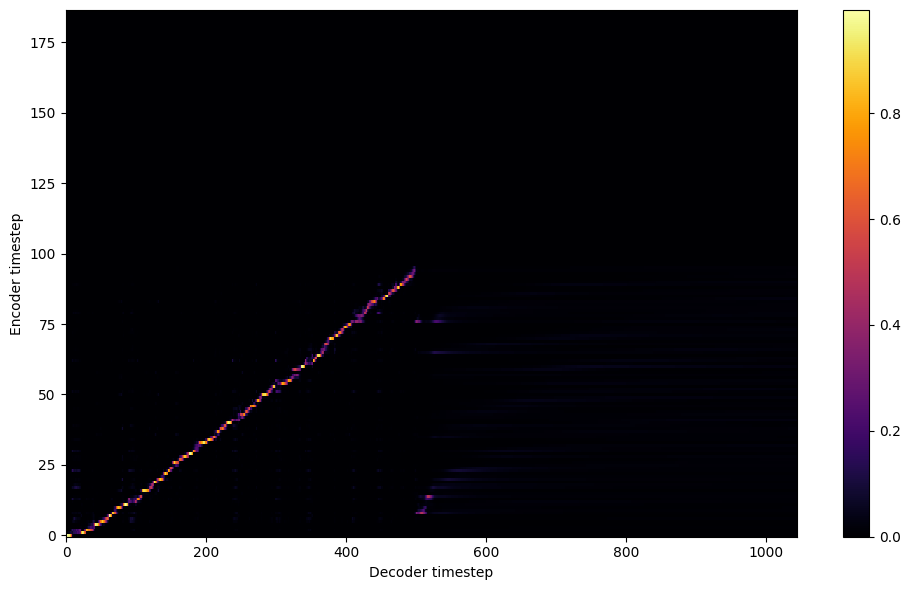


Starting Epoch: 155 Iteration: 620


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 155 Validation loss 624:  0.152034  Time: 0.4m LR: 0.000300


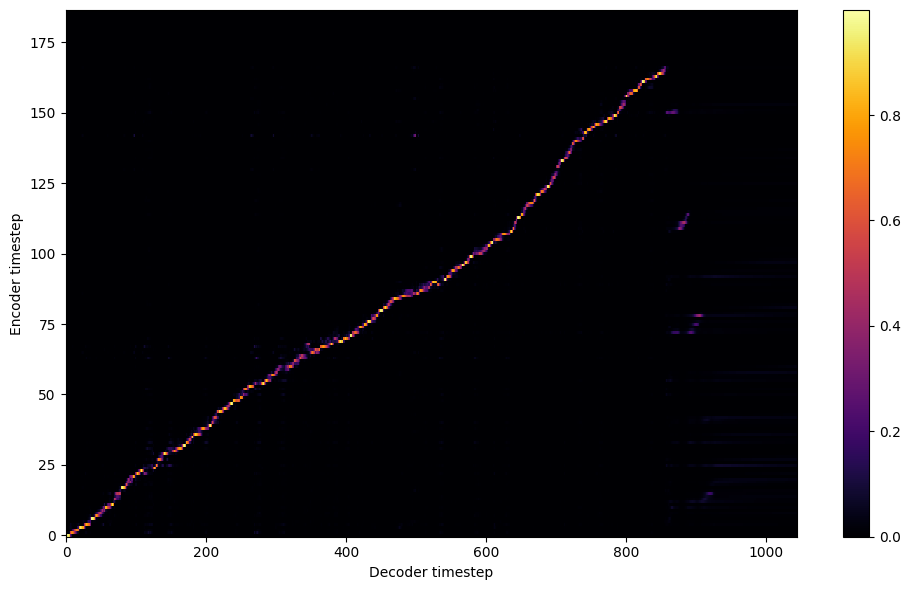


Starting Epoch: 156 Iteration: 624


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 156 Validation loss 628:  0.151533  Time: 0.4m LR: 0.000300


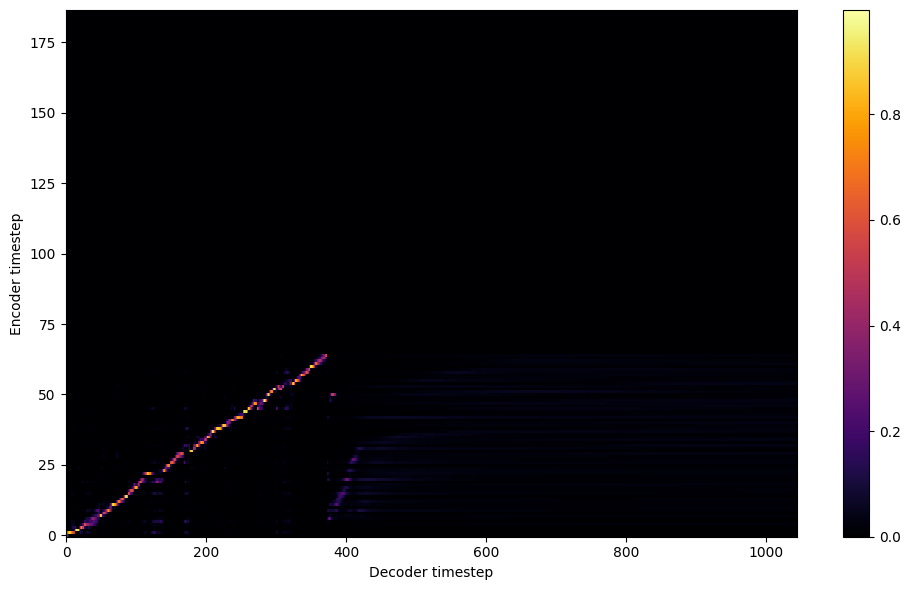


Starting Epoch: 157 Iteration: 628


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 157 Validation loss 632:  0.150233  Time: 0.4m LR: 0.000300


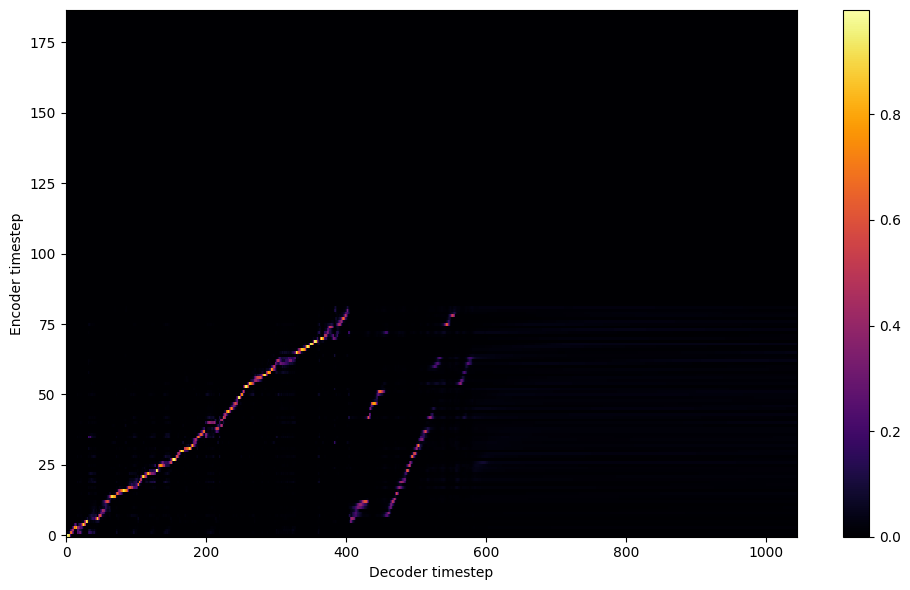


Starting Epoch: 158 Iteration: 632


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 158 Validation loss 636:  0.150256  Time: 0.4m LR: 0.000300


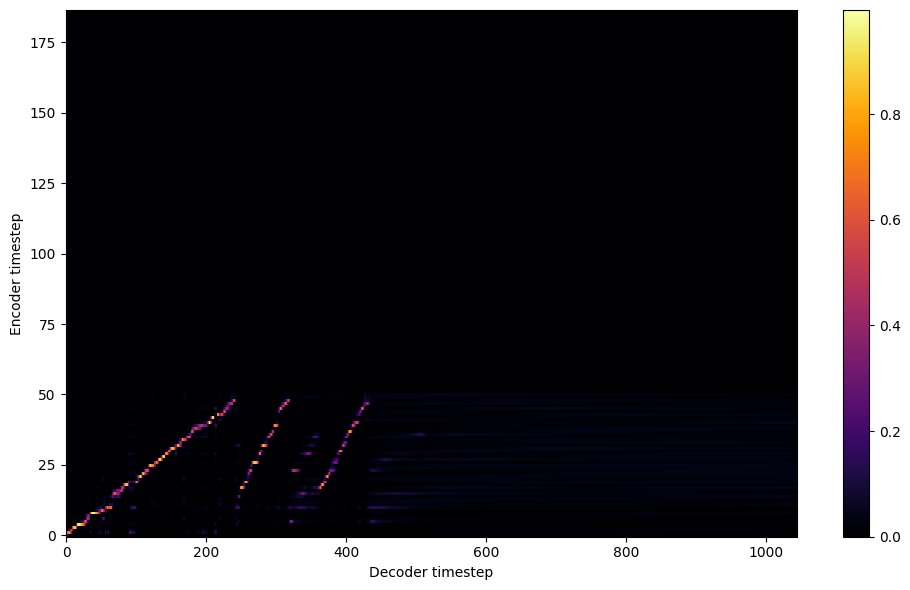


Starting Epoch: 159 Iteration: 636


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 159 Validation loss 640:  0.153298  Time: 0.4m LR: 0.000300


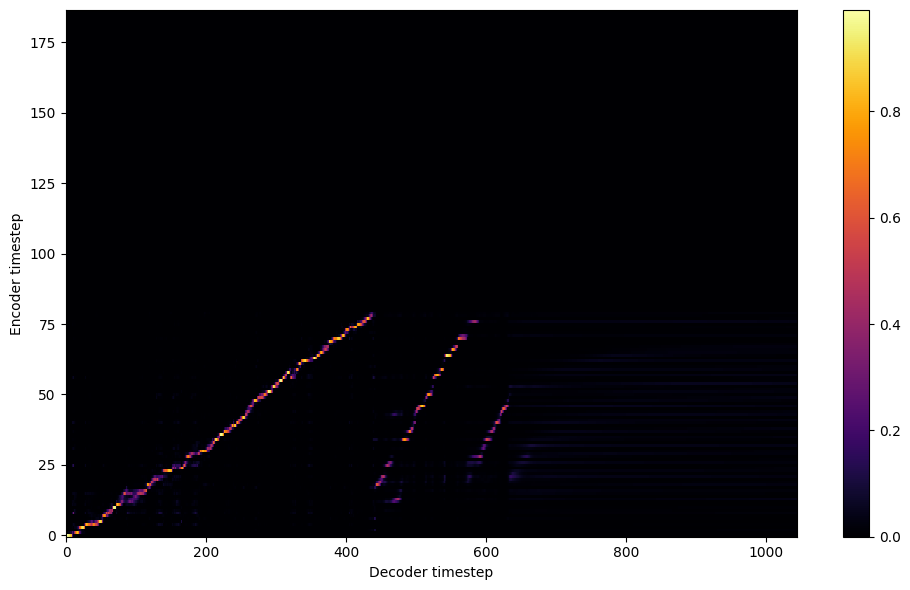

Saving model and optimizer state at iteration 640 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 160 Iteration: 640


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 160 Validation loss 644:  0.153672  Time: 0.4m LR: 0.000300


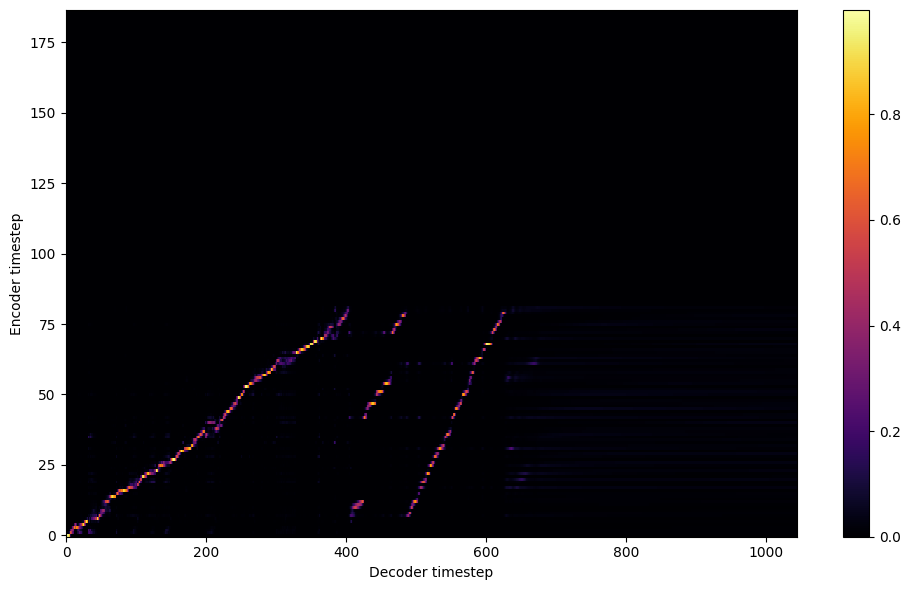


Starting Epoch: 161 Iteration: 644


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 161 Validation loss 648:  0.151759  Time: 0.4m LR: 0.000300


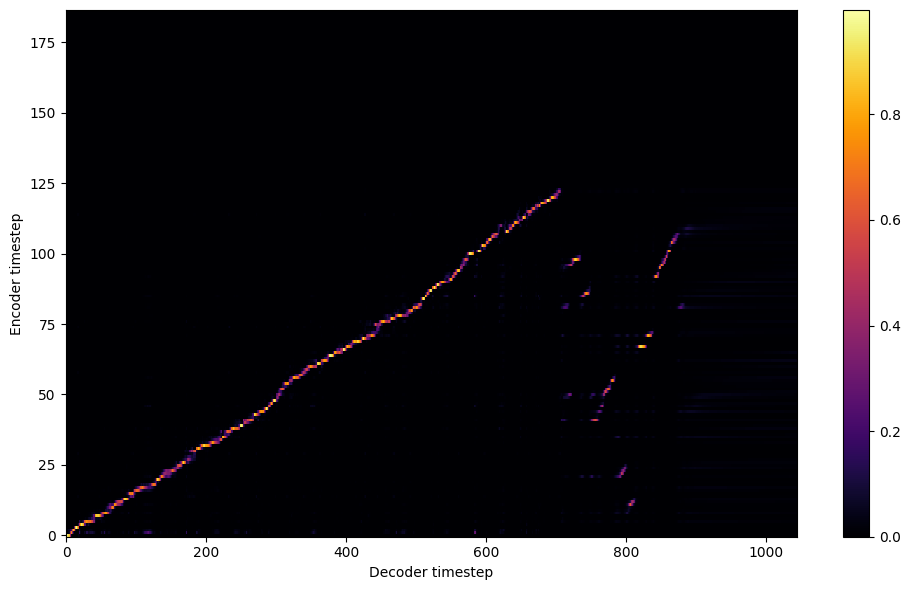


Starting Epoch: 162 Iteration: 648


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 162 Validation loss 652:  0.152974  Time: 0.4m LR: 0.000300


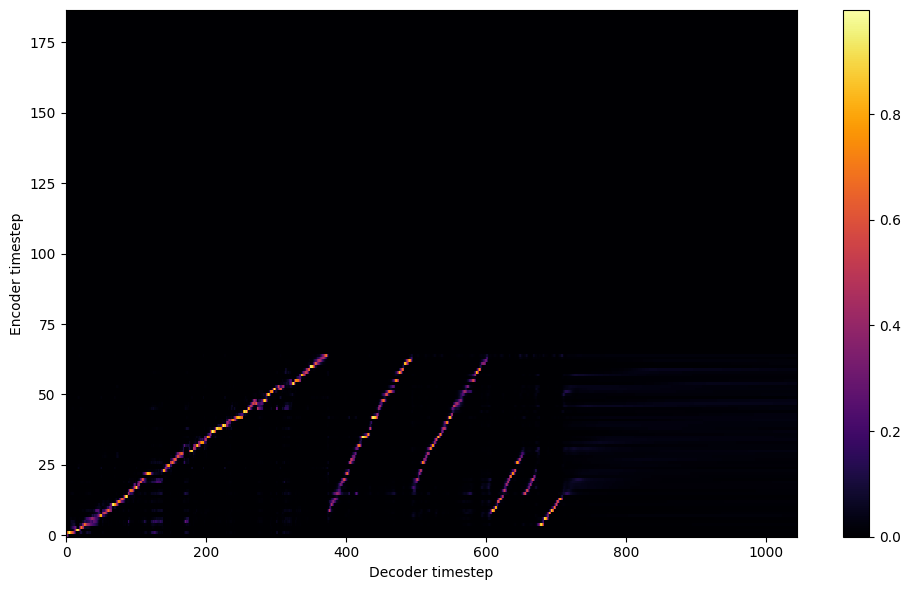


Starting Epoch: 163 Iteration: 652


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 163 Validation loss 656:  0.149813  Time: 0.4m LR: 0.000300


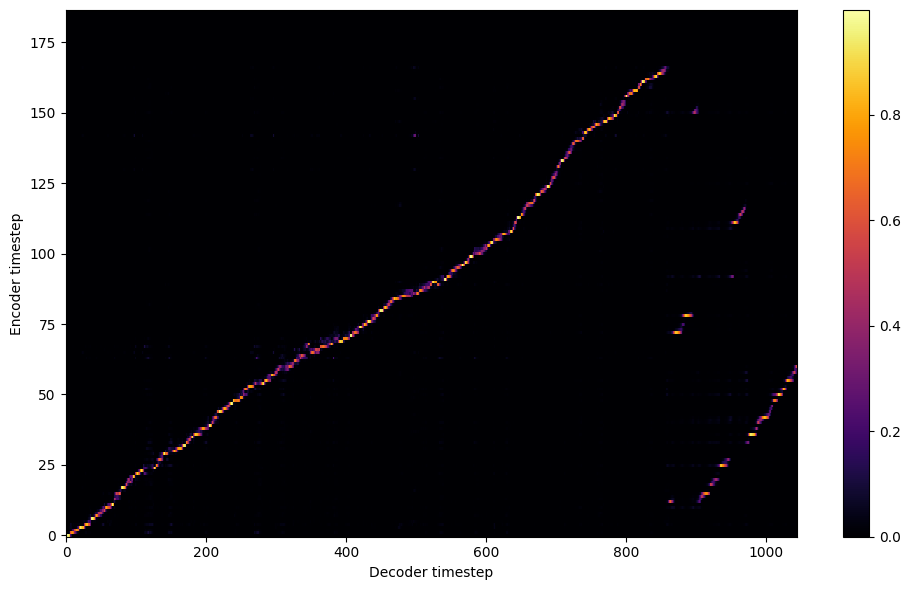


Starting Epoch: 164 Iteration: 656


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 164 Validation loss 660:  0.148533  Time: 0.4m LR: 0.000300


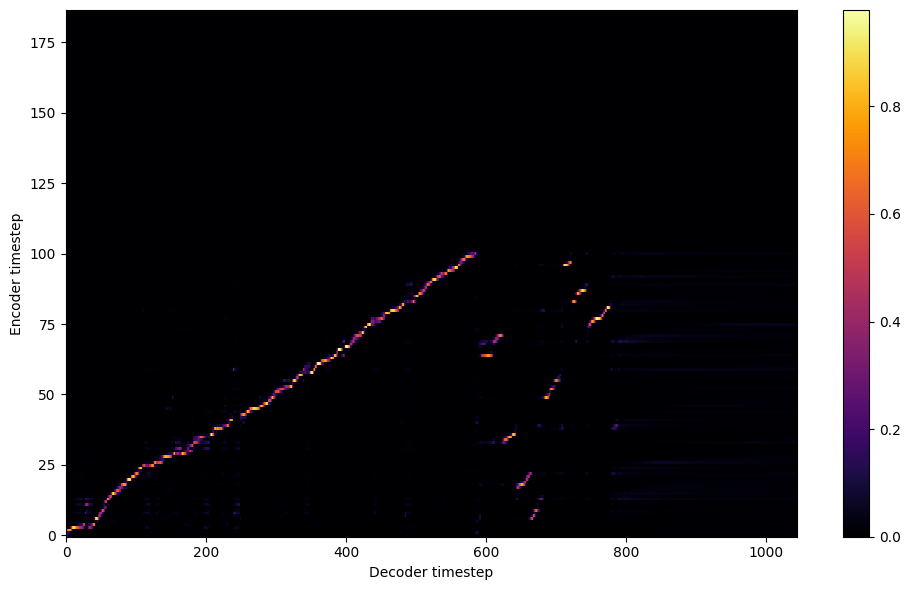


Starting Epoch: 165 Iteration: 660


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 165 Validation loss 664:  0.150727  Time: 0.4m LR: 0.000300


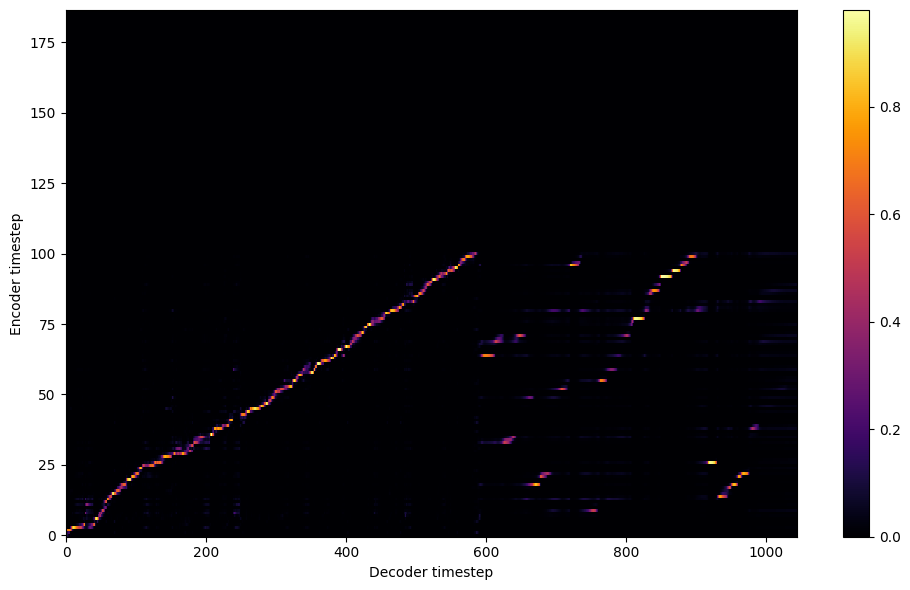


Starting Epoch: 166 Iteration: 664


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 166 Validation loss 668:  0.149647  Time: 0.4m LR: 0.000300


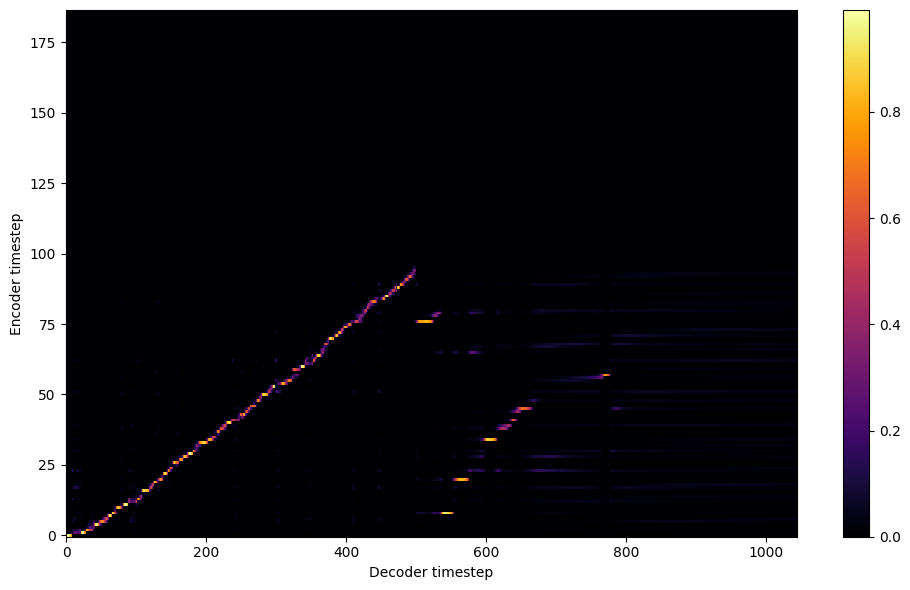


Starting Epoch: 167 Iteration: 668


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 167 Validation loss 672:  0.149325  Time: 0.4m LR: 0.000300


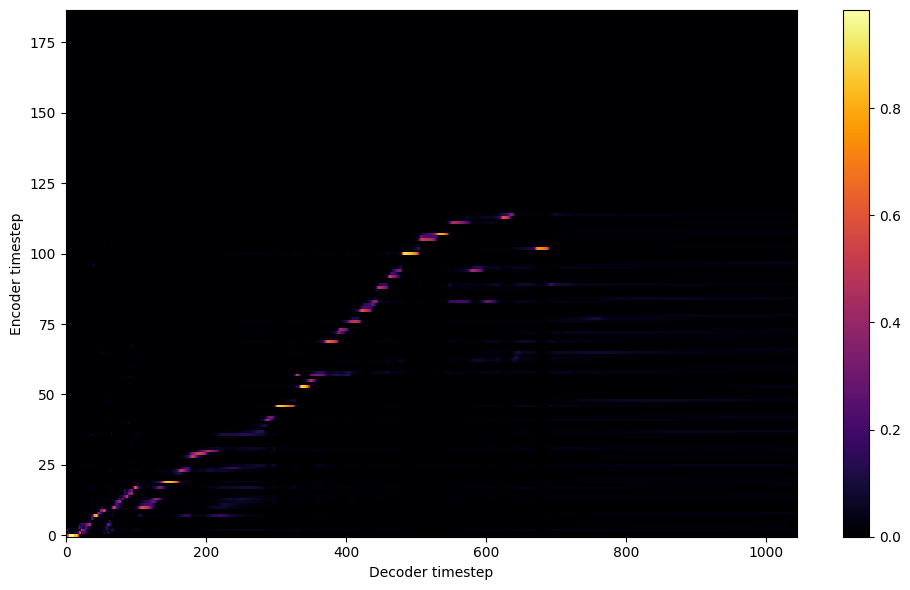


Starting Epoch: 168 Iteration: 672


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 168 Validation loss 676:  0.148755  Time: 0.4m LR: 0.000300


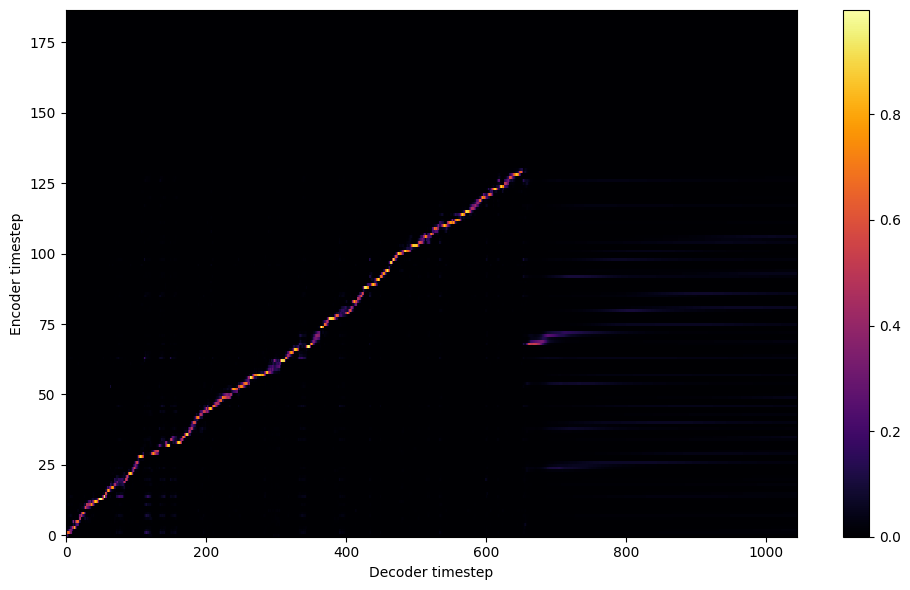


Starting Epoch: 169 Iteration: 676


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 169 Validation loss 680:  0.147155  Time: 0.4m LR: 0.000300


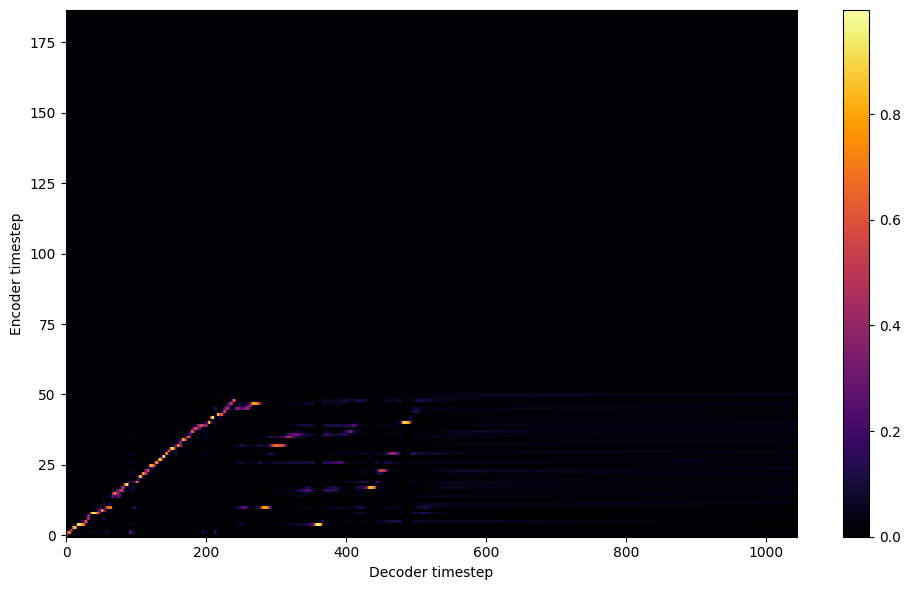

Saving model and optimizer state at iteration 680 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 170 Iteration: 680


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 170 Validation loss 684:  0.146647  Time: 0.4m LR: 0.000300


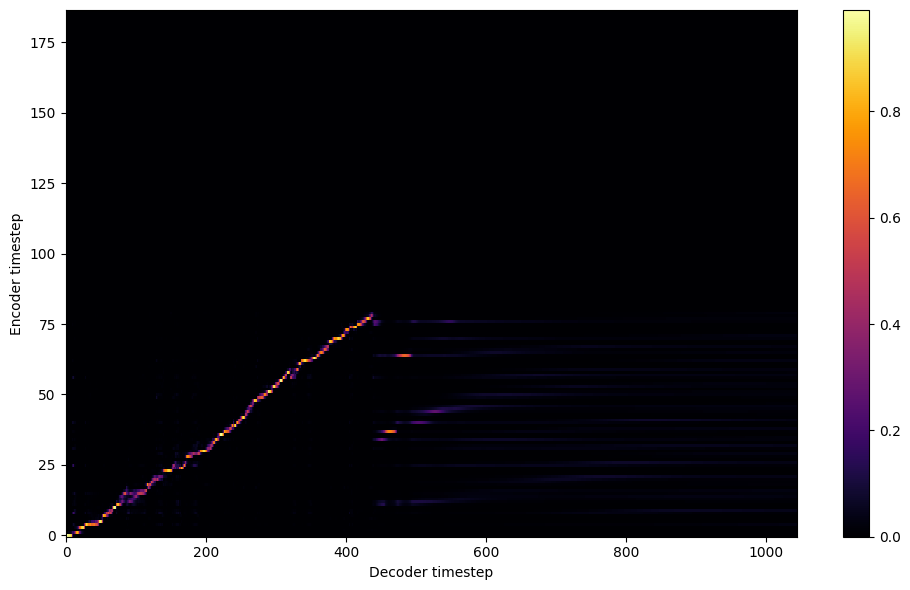


Starting Epoch: 171 Iteration: 684


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 171 Validation loss 688:  0.145504  Time: 0.4m LR: 0.000300


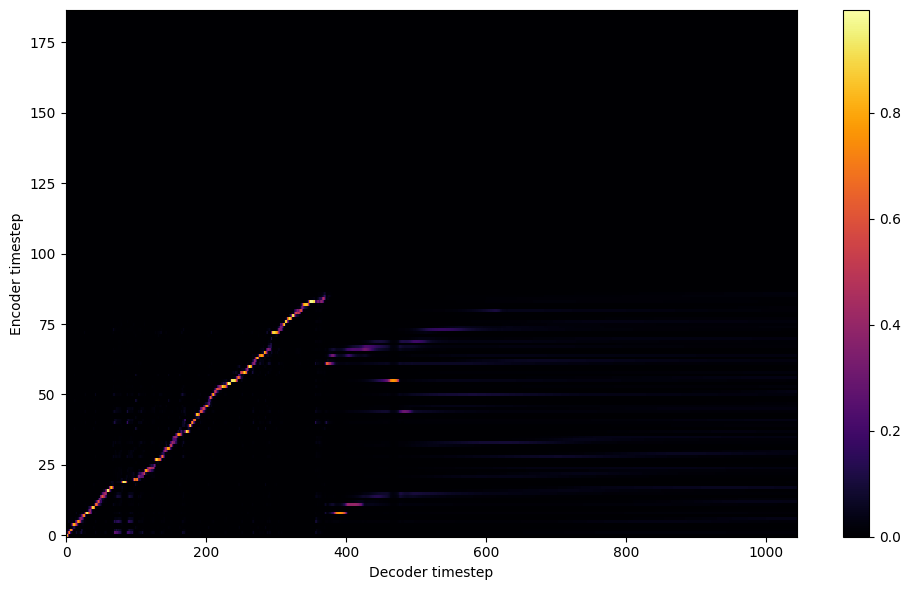


Starting Epoch: 172 Iteration: 688


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 172 Validation loss 692:  0.145153  Time: 0.4m LR: 0.000300


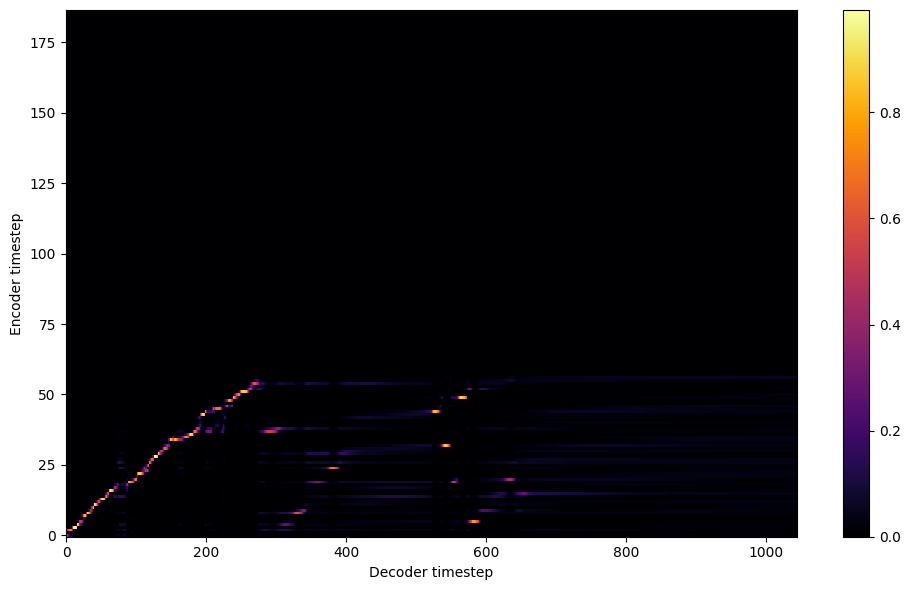


Starting Epoch: 173 Iteration: 692


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 173 Validation loss 696:  0.144737  Time: 0.4m LR: 0.000300


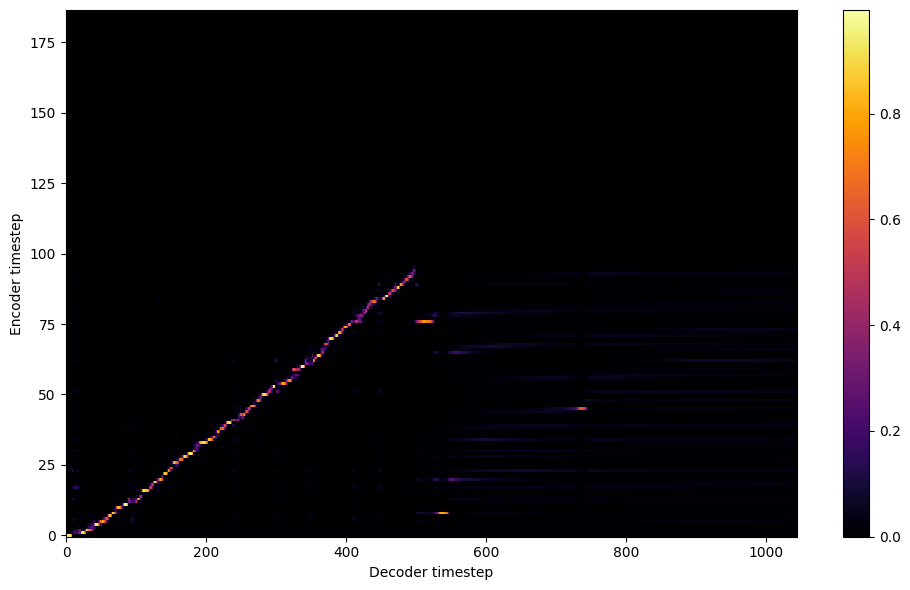


Starting Epoch: 174 Iteration: 696


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 174 Validation loss 700:  0.143822  Time: 0.4m LR: 0.000300


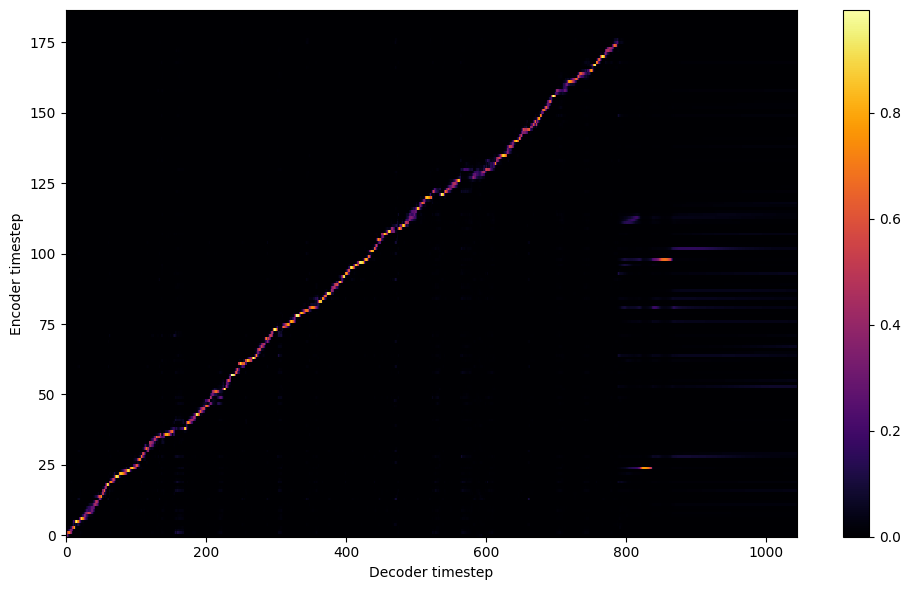


Starting Epoch: 175 Iteration: 700


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 175 Validation loss 704:  0.143404  Time: 0.4m LR: 0.000300


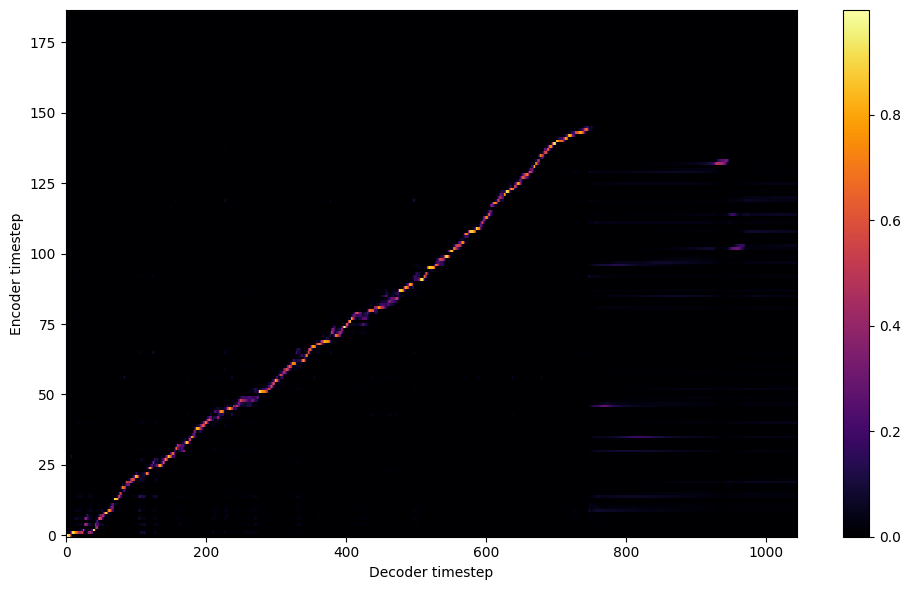


Starting Epoch: 176 Iteration: 704


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 176 Validation loss 708:  0.142611  Time: 0.4m LR: 0.000300


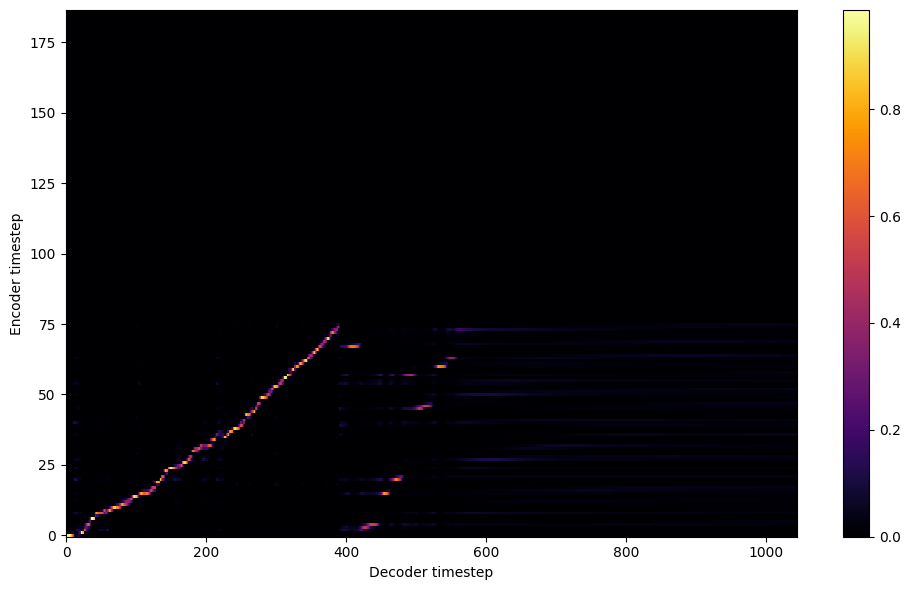


Starting Epoch: 177 Iteration: 708


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 177 Validation loss 712:  0.141967  Time: 0.4m LR: 0.000300


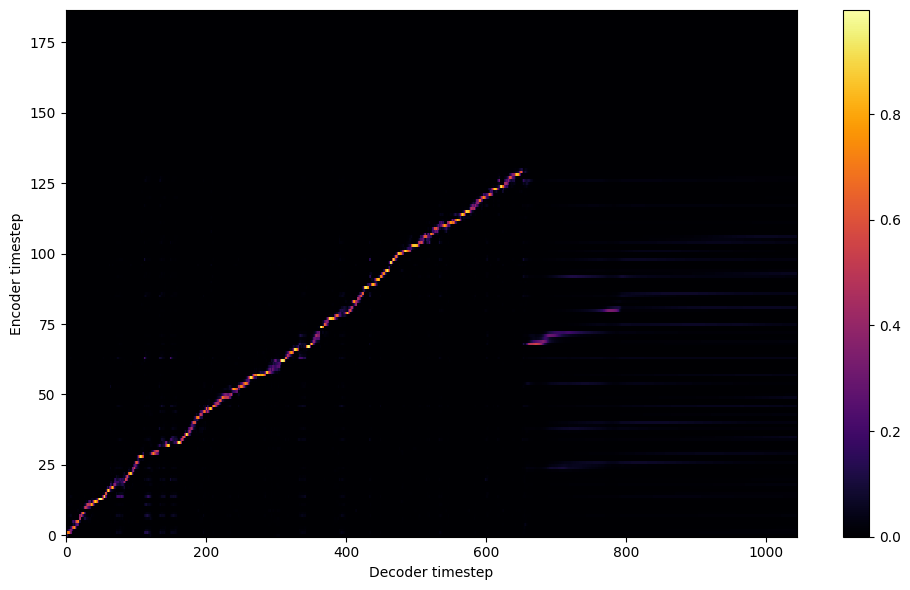


Starting Epoch: 178 Iteration: 712


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 178 Validation loss 716:  0.142251  Time: 0.4m LR: 0.000300


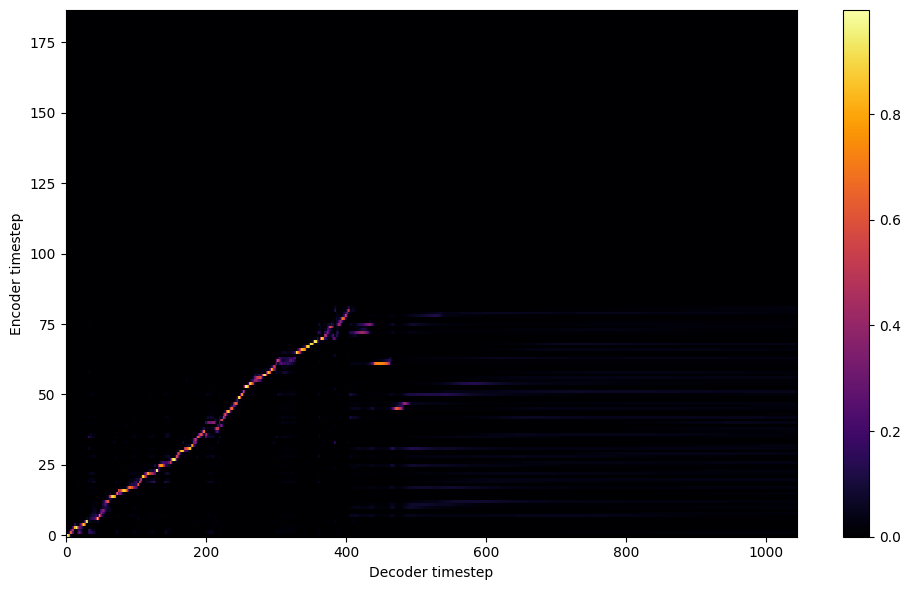


Starting Epoch: 179 Iteration: 716


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 179 Validation loss 720:  0.141933  Time: 0.4m LR: 0.000300


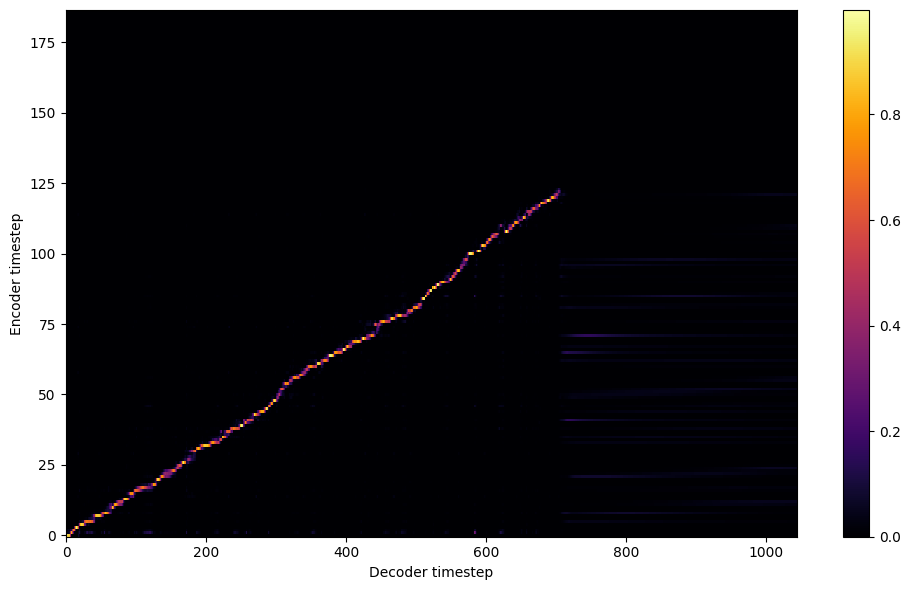

Saving model and optimizer state at iteration 720 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 180 Iteration: 720


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 180 Validation loss 724:  0.141228  Time: 0.4m LR: 0.000300


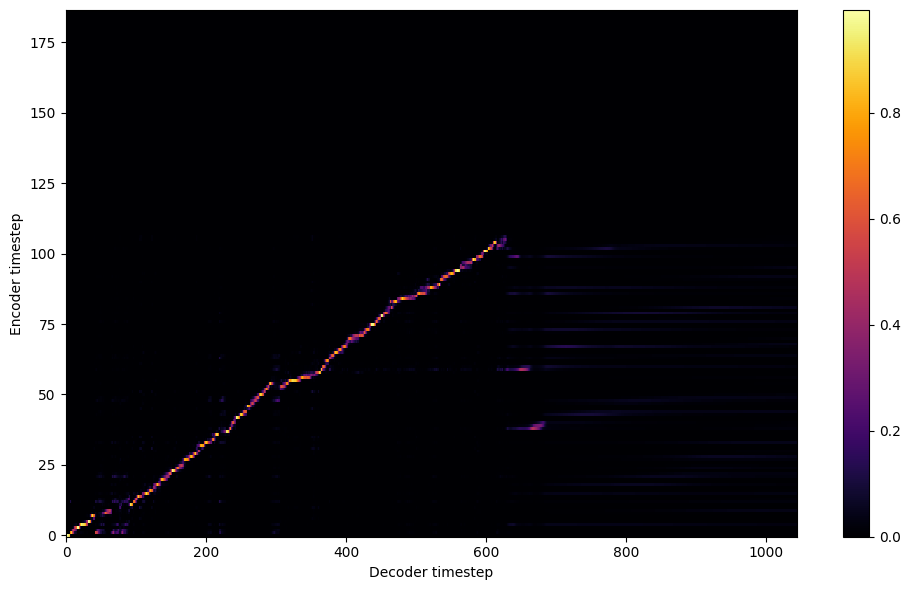


Starting Epoch: 181 Iteration: 724


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 181 Validation loss 728:  0.140125  Time: 0.4m LR: 0.000300


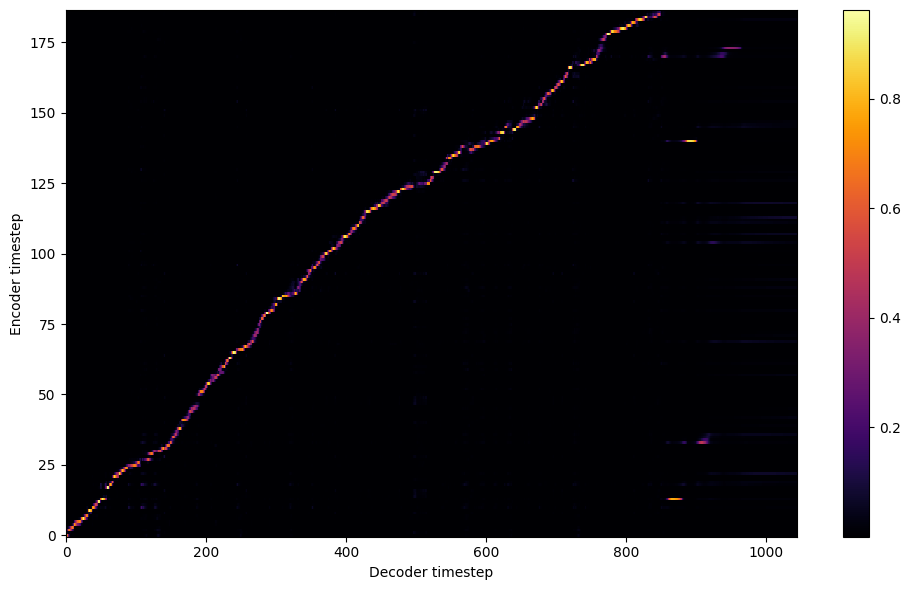


Starting Epoch: 182 Iteration: 728


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 182 Validation loss 732:  0.139791  Time: 0.4m LR: 0.000300


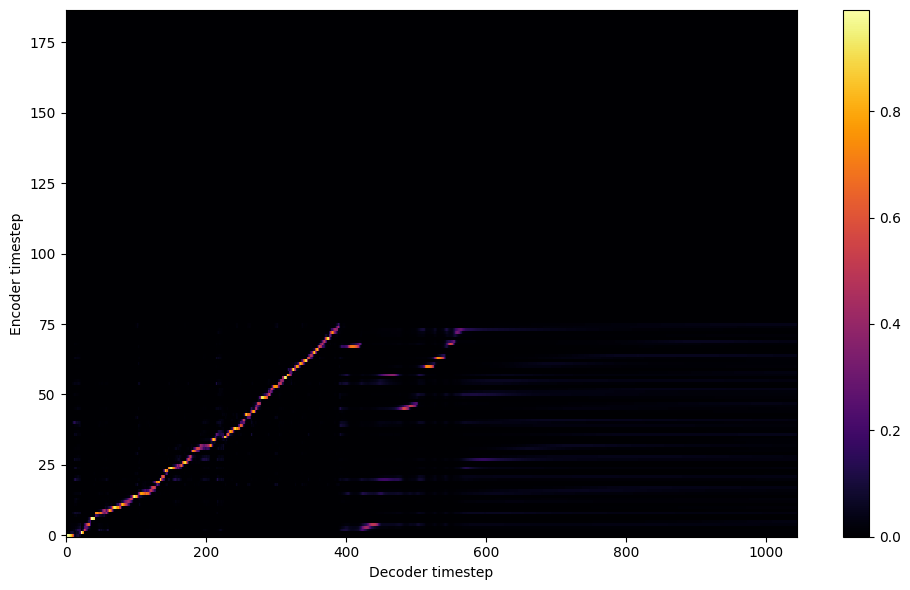


Starting Epoch: 183 Iteration: 732


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 183 Validation loss 736:  0.140148  Time: 0.4m LR: 0.000300


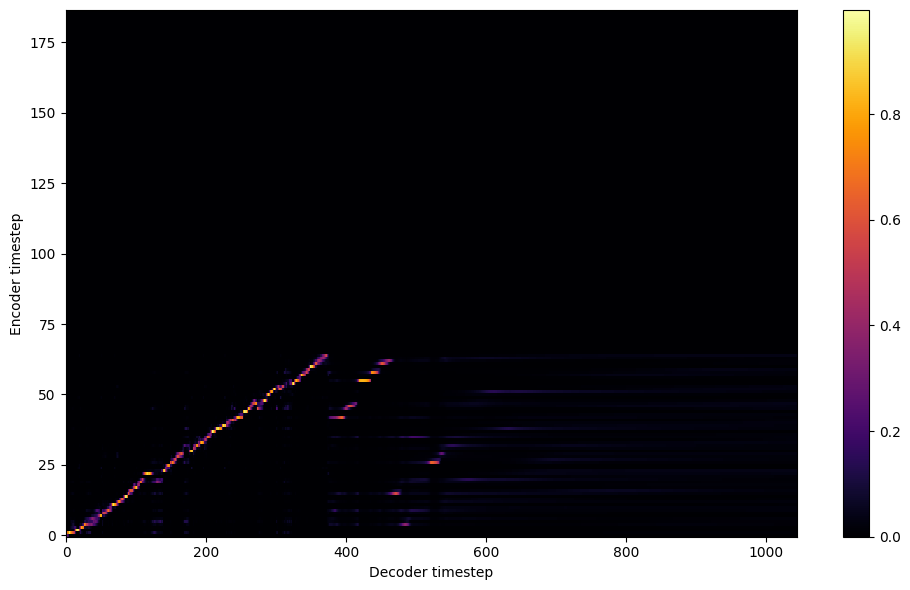


Starting Epoch: 184 Iteration: 736


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 184 Validation loss 740:  0.139184  Time: 0.4m LR: 0.000300


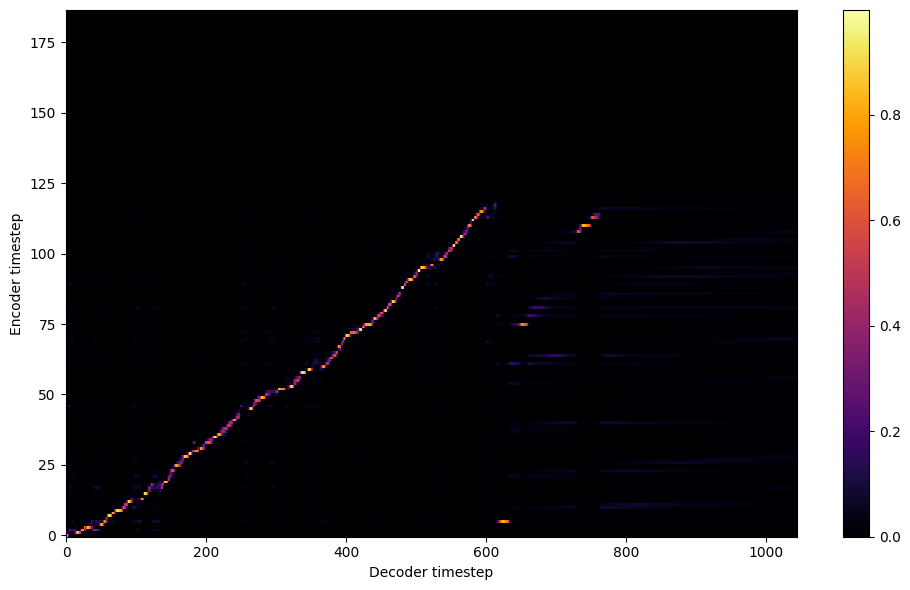


Starting Epoch: 185 Iteration: 740


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 185 Validation loss 744:  0.138725  Time: 0.4m LR: 0.000300


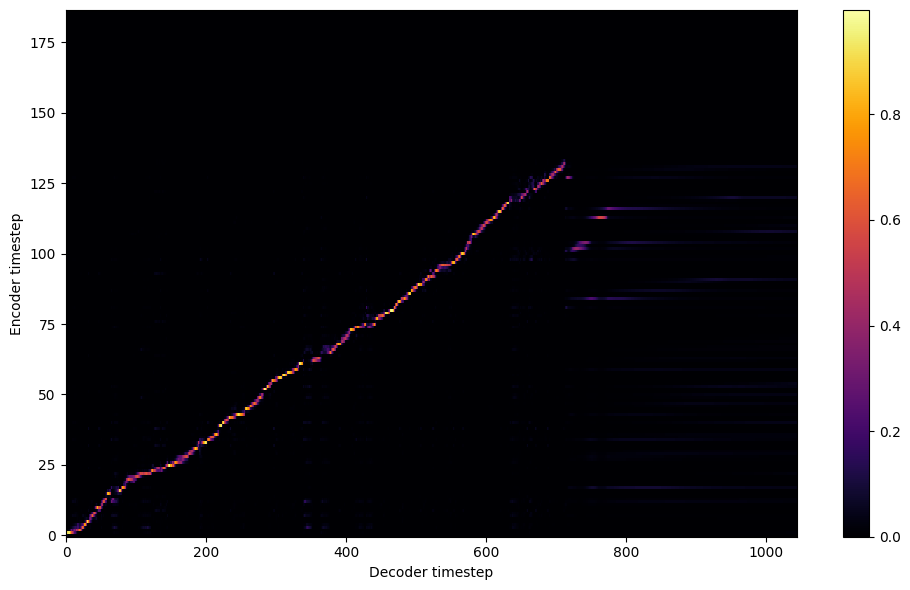


Starting Epoch: 186 Iteration: 744


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 186 Validation loss 748:  0.138414  Time: 0.4m LR: 0.000300


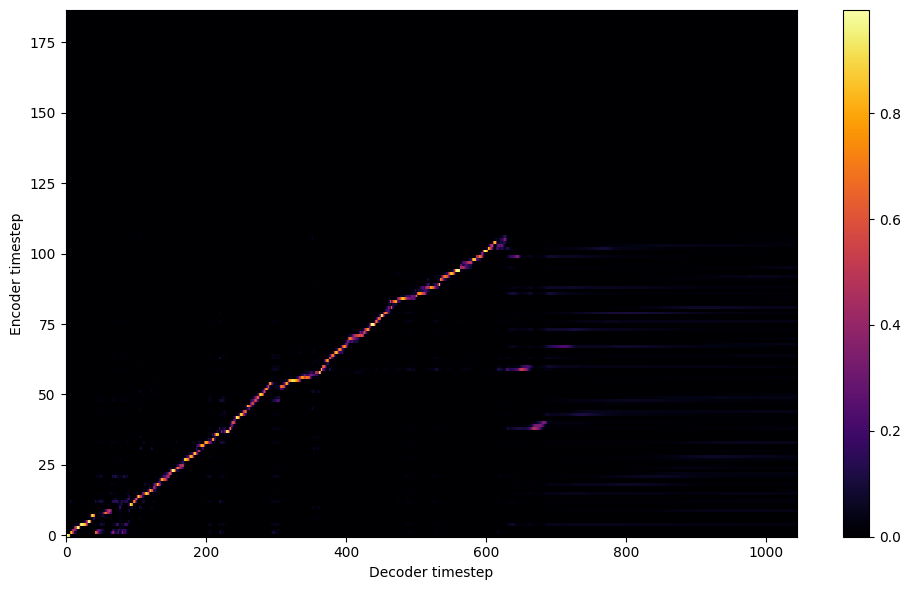


Starting Epoch: 187 Iteration: 748


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 187 Validation loss 752:  0.137801  Time: 0.4m LR: 0.000300


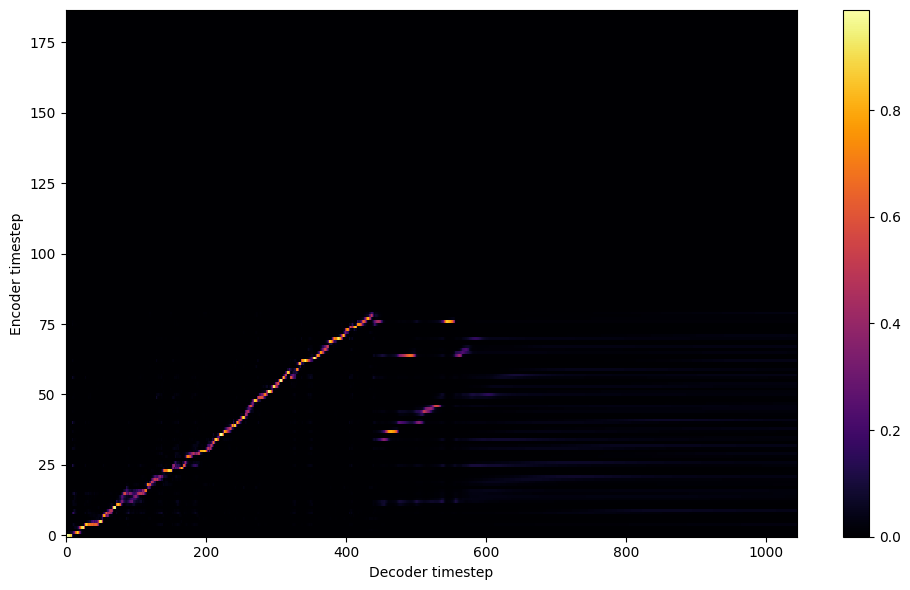


Starting Epoch: 188 Iteration: 752


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 188 Validation loss 756:  0.137739  Time: 0.4m LR: 0.000300


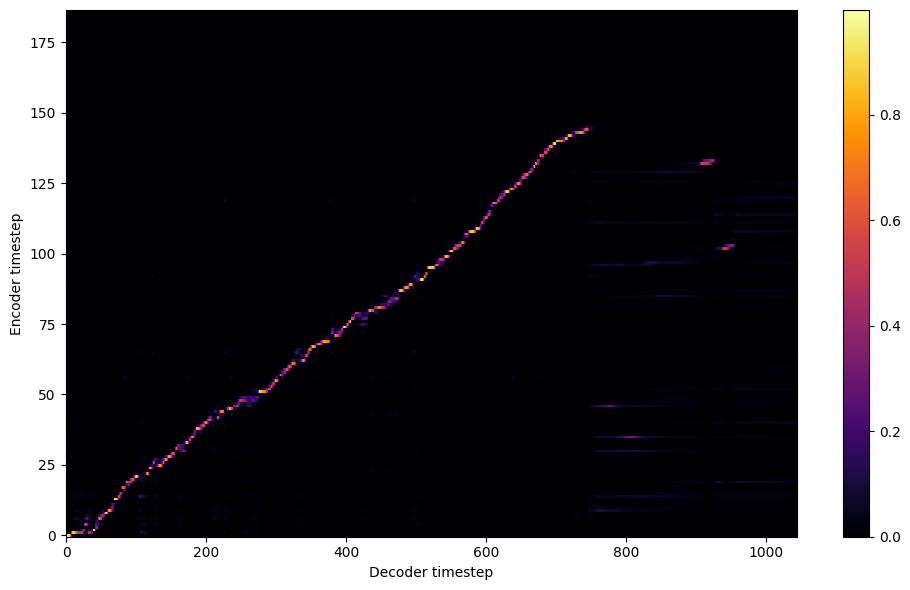


Starting Epoch: 189 Iteration: 756


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 189 Validation loss 760:  0.137385  Time: 0.4m LR: 0.000300


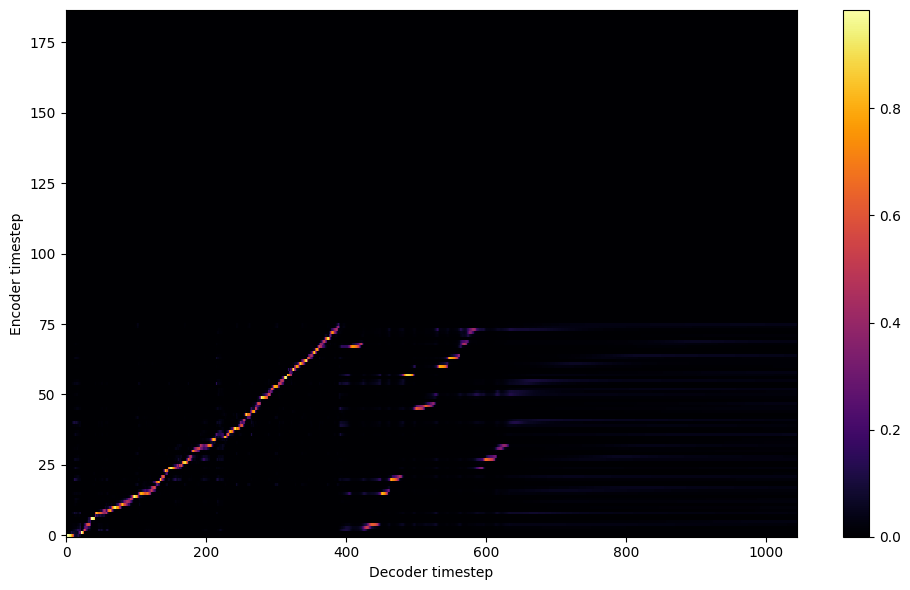

Saving model and optimizer state at iteration 760 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 190 Iteration: 760


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 190 Validation loss 764:  0.136769  Time: 0.4m LR: 0.000300


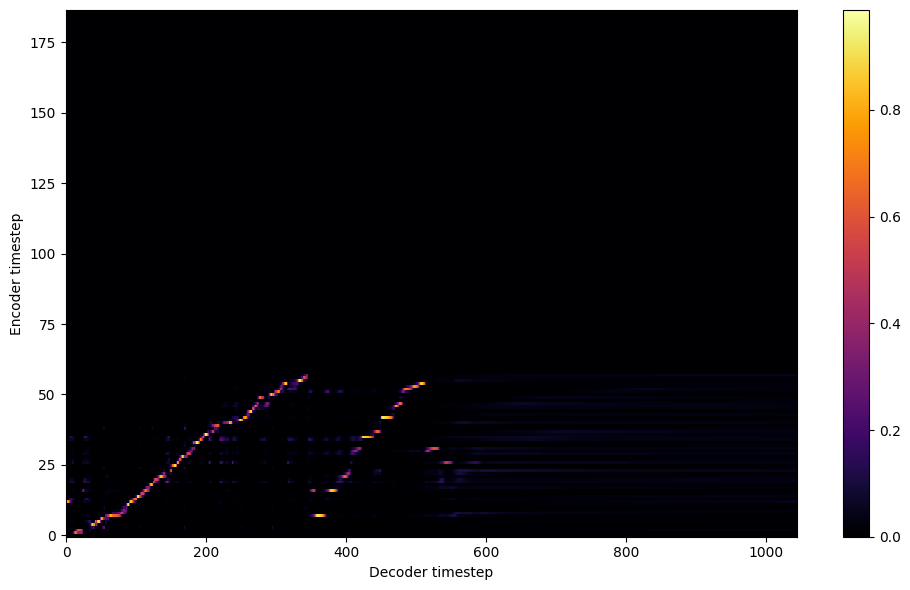


Starting Epoch: 191 Iteration: 764


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 191 Validation loss 768:  0.136698  Time: 0.4m LR: 0.000300


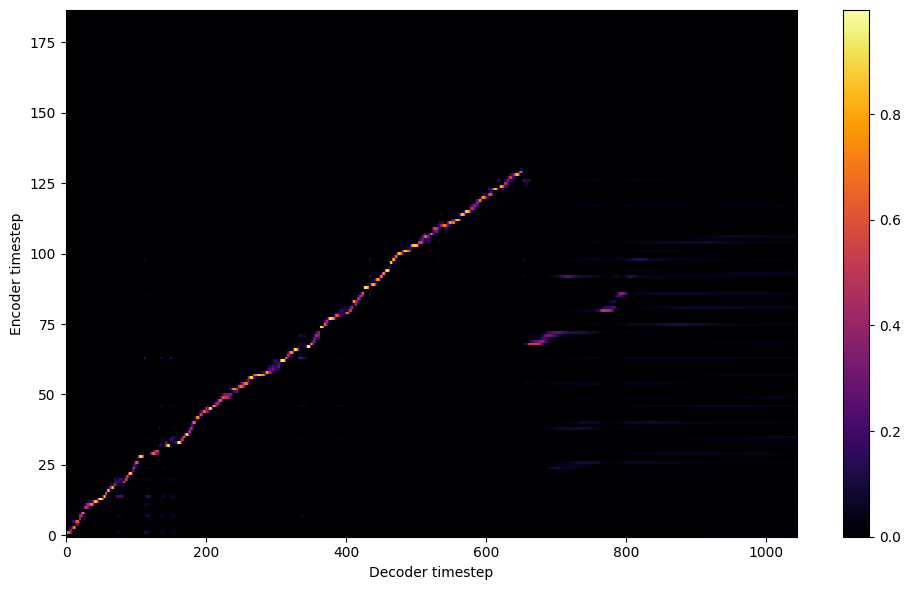


Starting Epoch: 192 Iteration: 768


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 192 Validation loss 772:  0.136174  Time: 0.5m LR: 0.000300


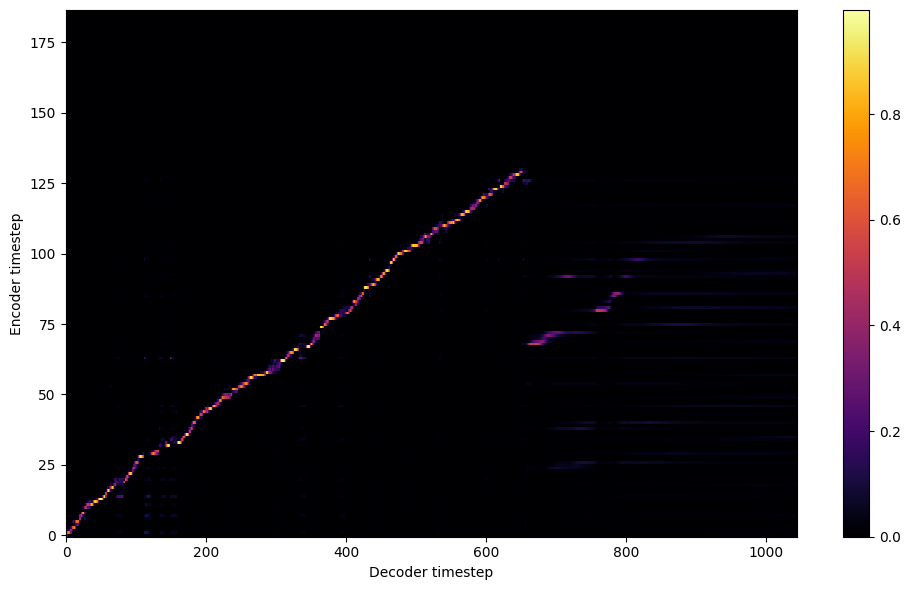


Starting Epoch: 193 Iteration: 772


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 193 Validation loss 776:  0.136016  Time: 0.4m LR: 0.000300


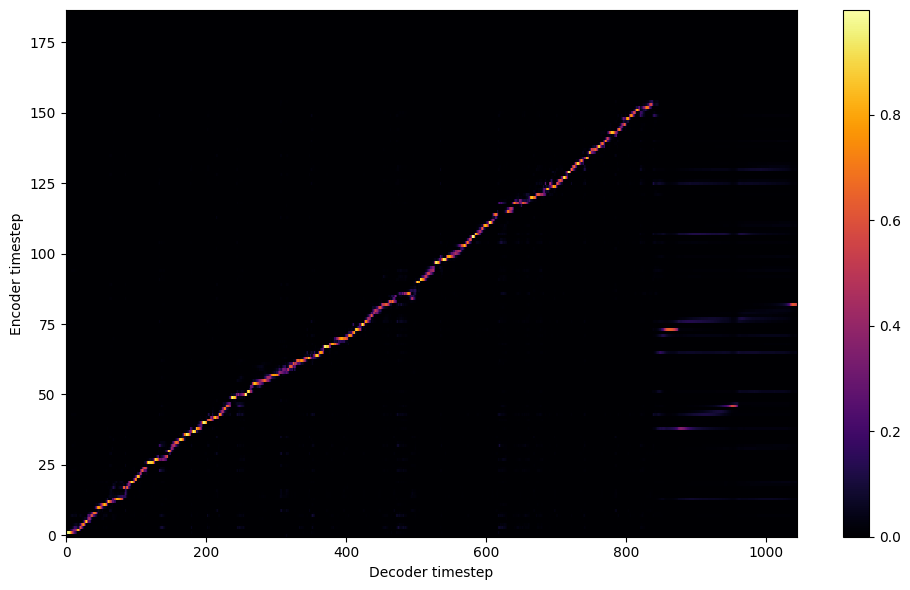


Starting Epoch: 194 Iteration: 776


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 194 Validation loss 780:  0.135875  Time: 0.4m LR: 0.000300


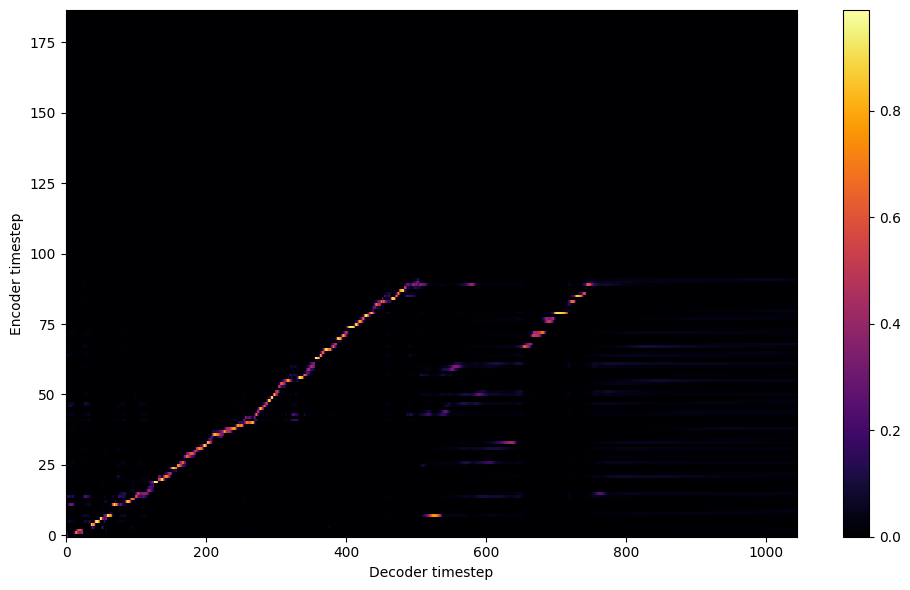


Starting Epoch: 195 Iteration: 780


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 195 Validation loss 784:  0.135363  Time: 0.4m LR: 0.000300


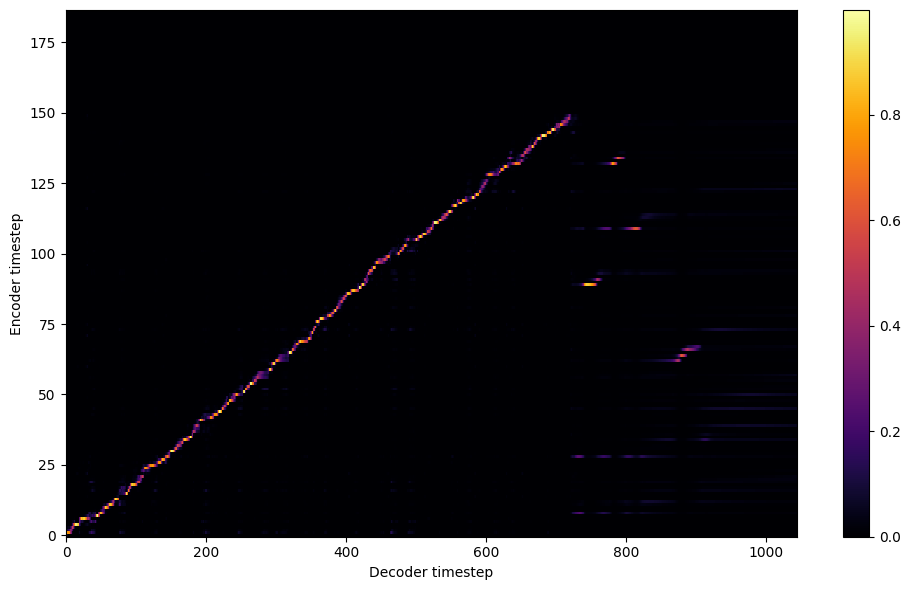


Starting Epoch: 196 Iteration: 784


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 196 Validation loss 788:  0.135181  Time: 0.4m LR: 0.000300


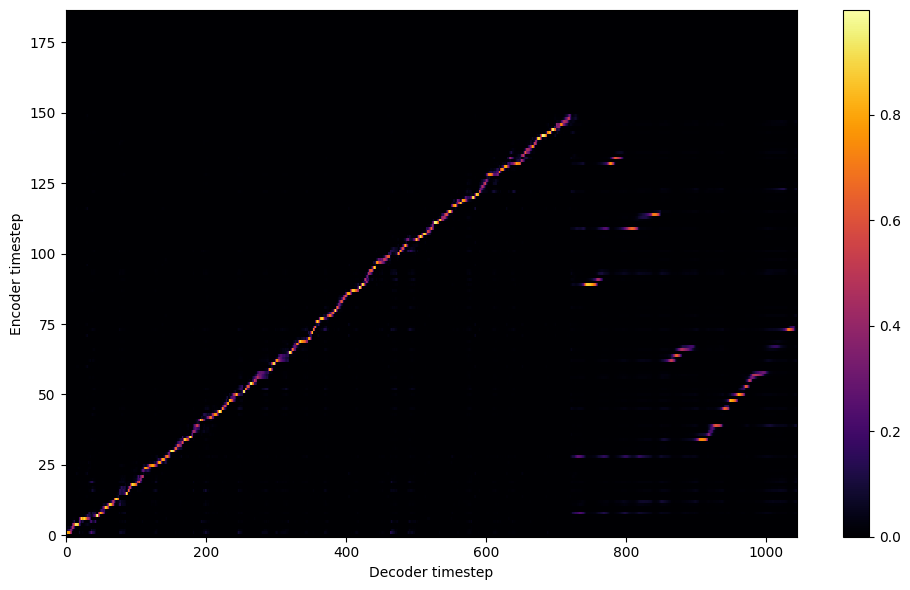


Starting Epoch: 197 Iteration: 788


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 197 Validation loss 792:  0.134929  Time: 0.4m LR: 0.000300


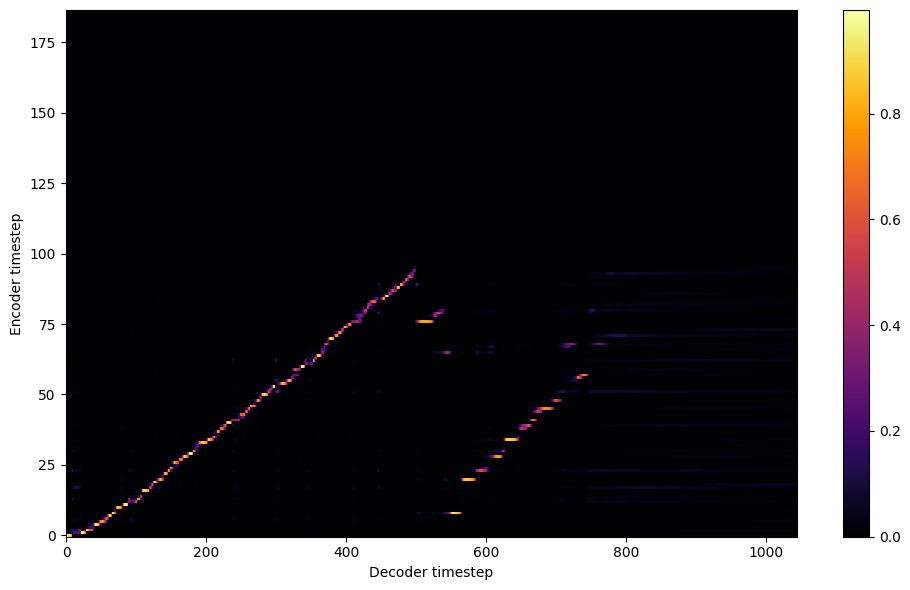


Starting Epoch: 198 Iteration: 792


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 198 Validation loss 796:  0.134363  Time: 0.4m LR: 0.000300


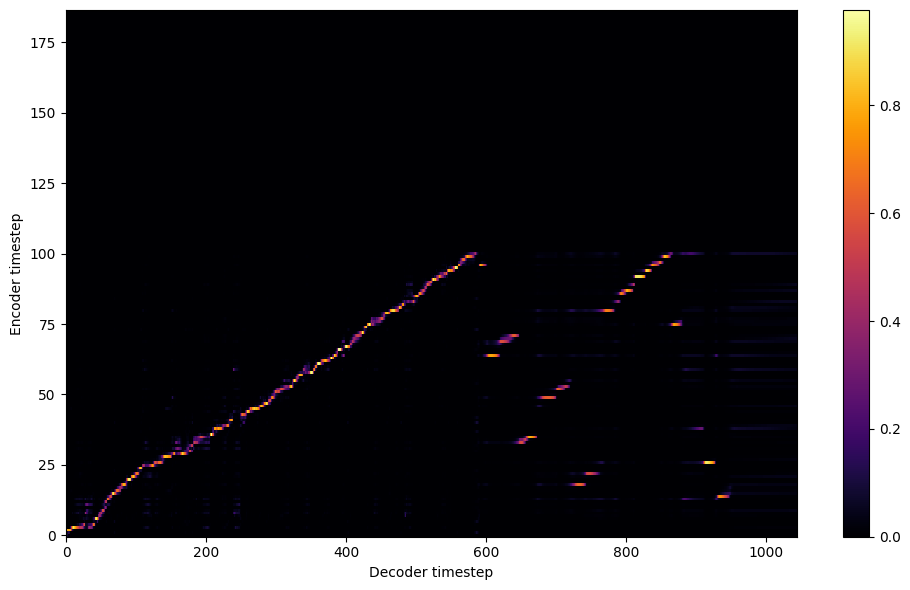


Starting Epoch: 199 Iteration: 796


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 199 Validation loss 800:  0.135910  Time: 0.4m LR: 0.000300


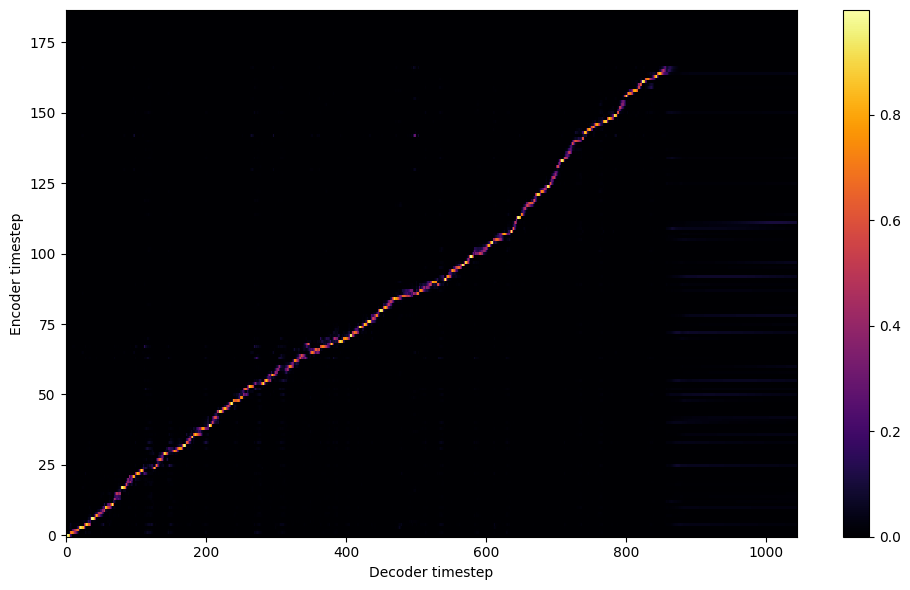

Saving model and optimizer state at iteration 800 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 200 Iteration: 800


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 200 Validation loss 804:  0.135514  Time: 0.4m LR: 0.000300


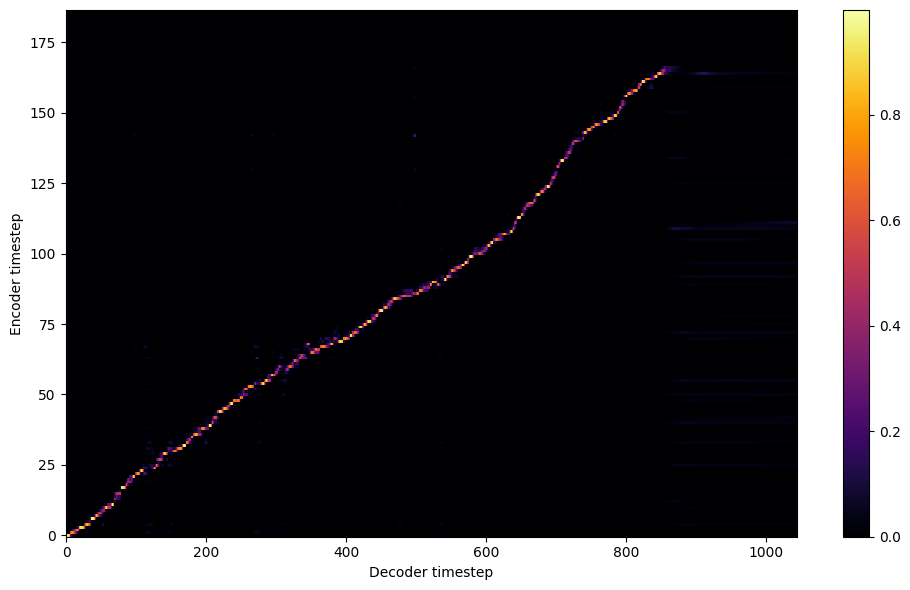


Starting Epoch: 201 Iteration: 804


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 201 Validation loss 808:  0.135380  Time: 0.4m LR: 0.000300


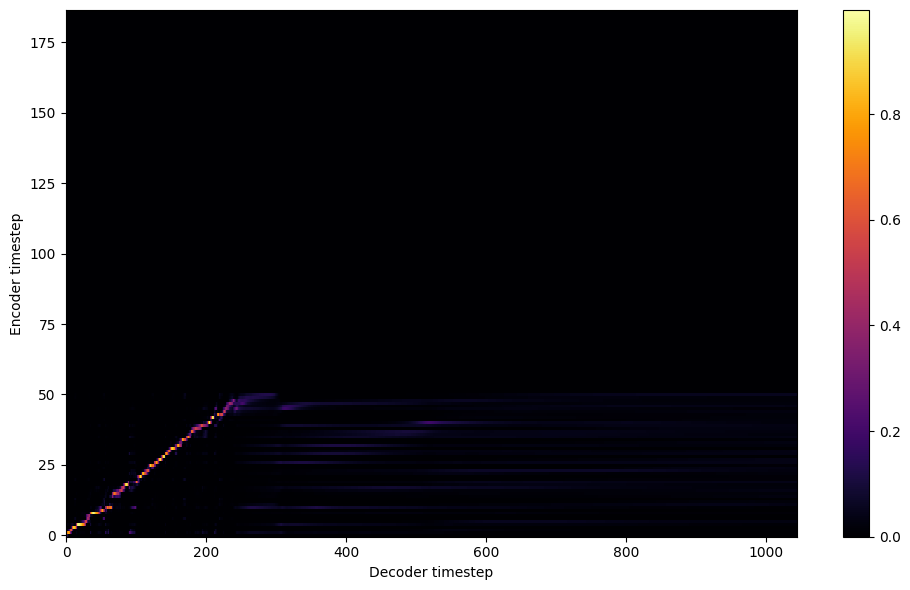


Starting Epoch: 202 Iteration: 808


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 202 Validation loss 812:  0.134837  Time: 0.4m LR: 0.000300


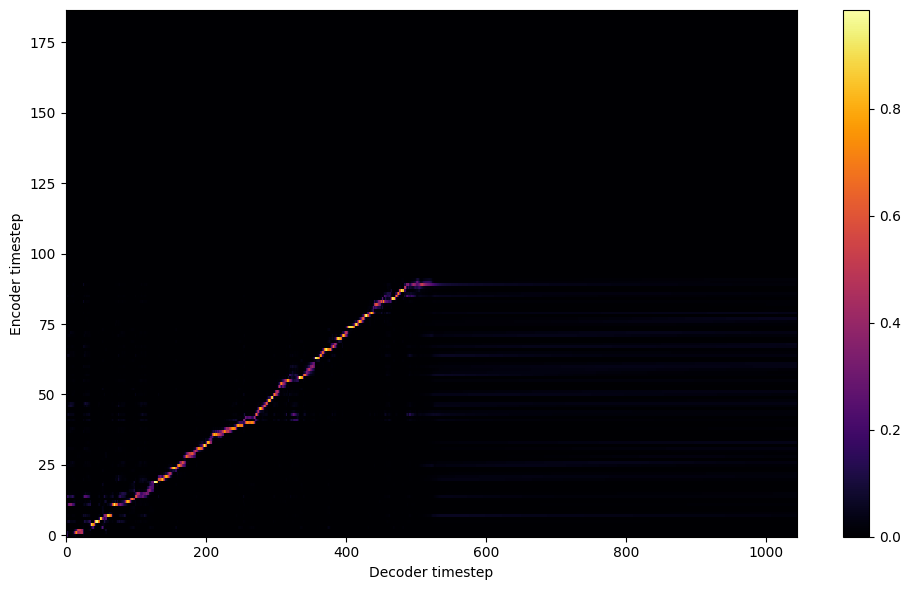


Starting Epoch: 203 Iteration: 812


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 203 Validation loss 816:  0.133975  Time: 0.4m LR: 0.000300


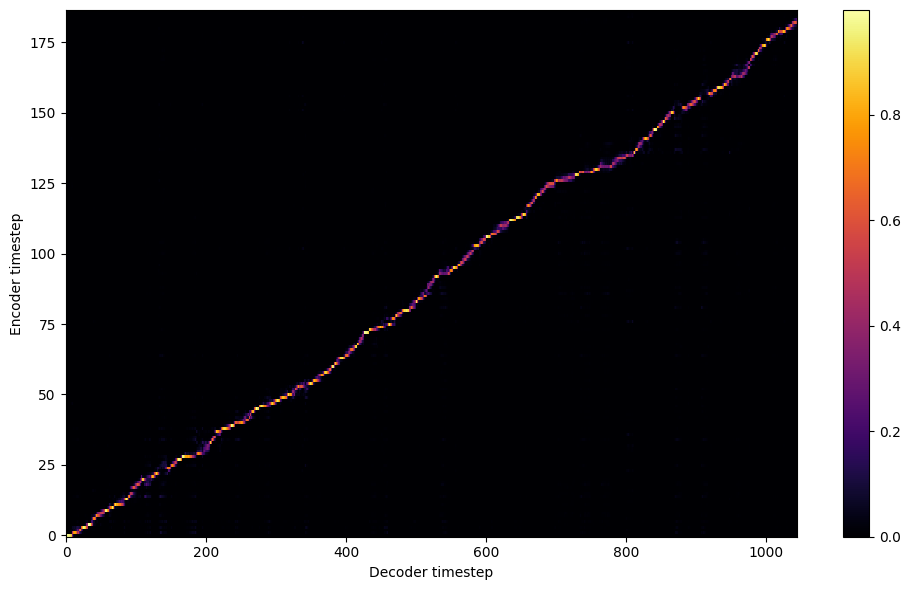


Starting Epoch: 204 Iteration: 816


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 204 Validation loss 820:  0.133516  Time: 0.4m LR: 0.000300


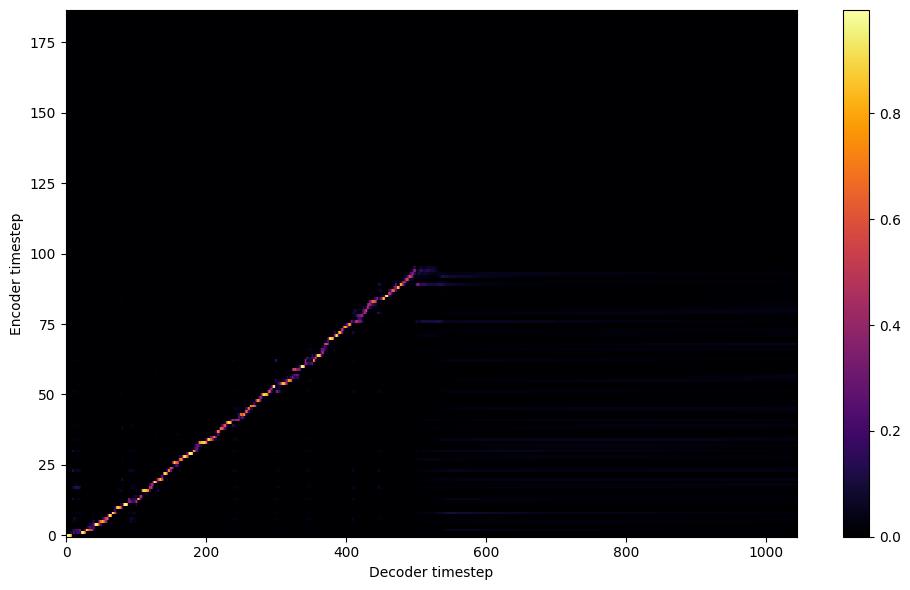


Starting Epoch: 205 Iteration: 820


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 205 Validation loss 824:  0.132972  Time: 0.4m LR: 0.000300


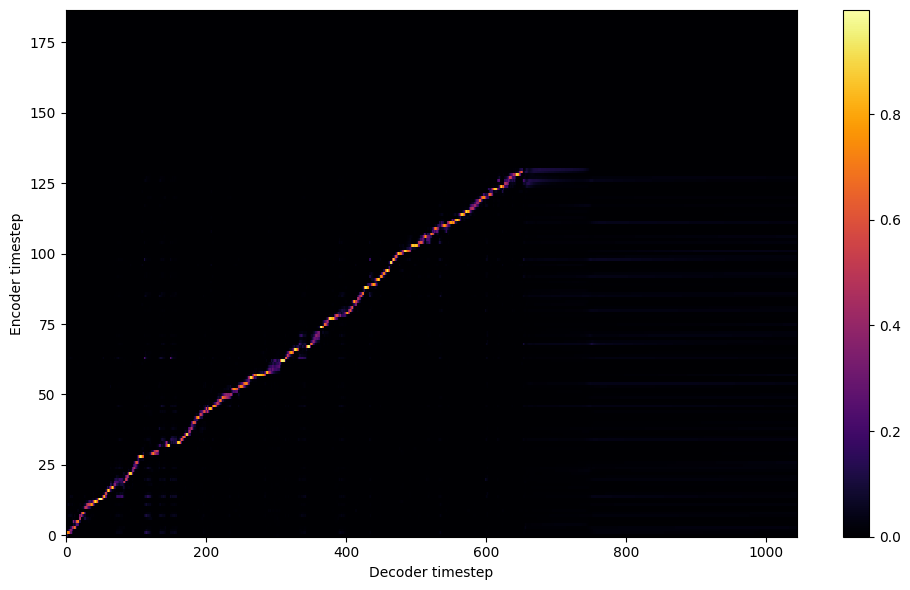


Starting Epoch: 206 Iteration: 824


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 206 Validation loss 828:  0.132799  Time: 0.4m LR: 0.000300


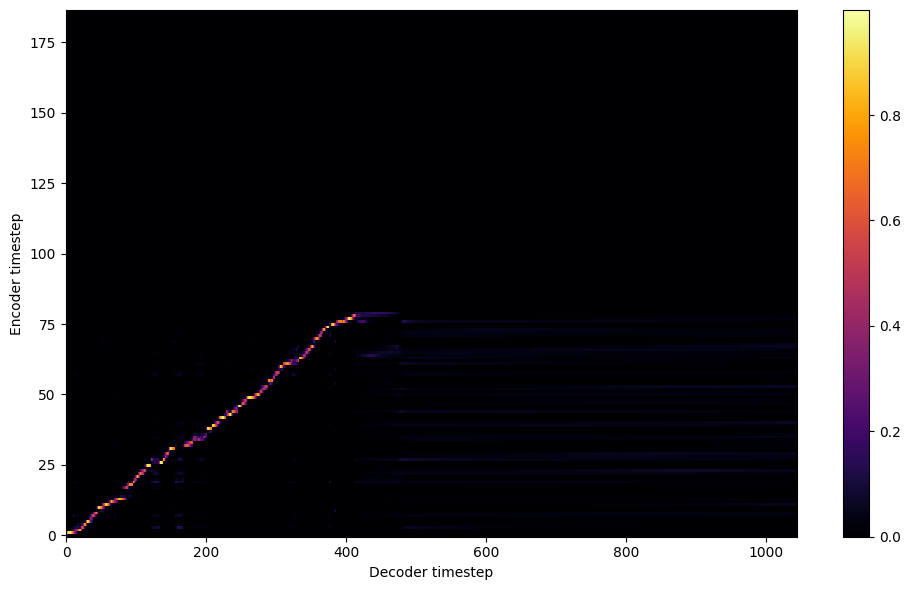


Starting Epoch: 207 Iteration: 828


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 207 Validation loss 832:  0.133377  Time: 0.4m LR: 0.000300


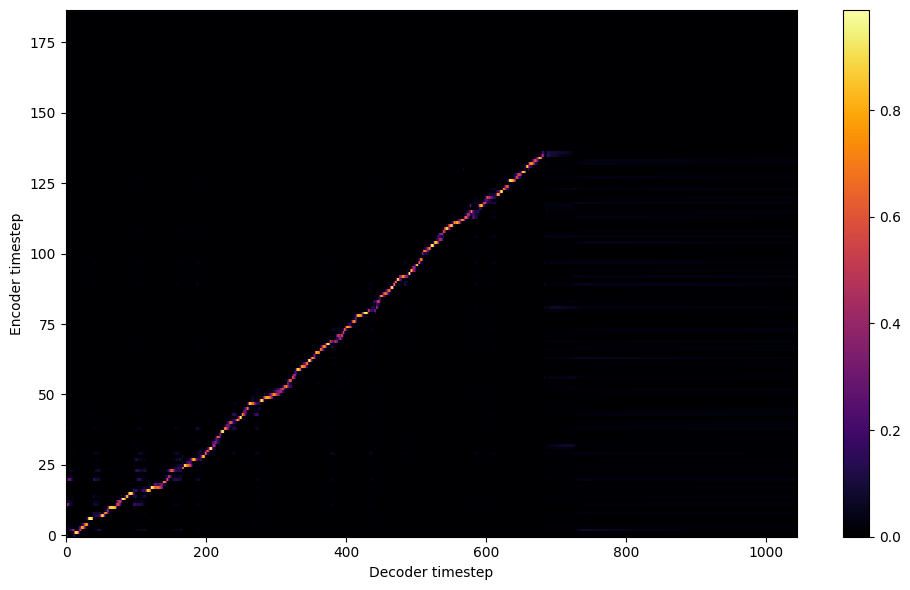


Starting Epoch: 208 Iteration: 832


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 208 Validation loss 836:  0.132208  Time: 0.4m LR: 0.000300


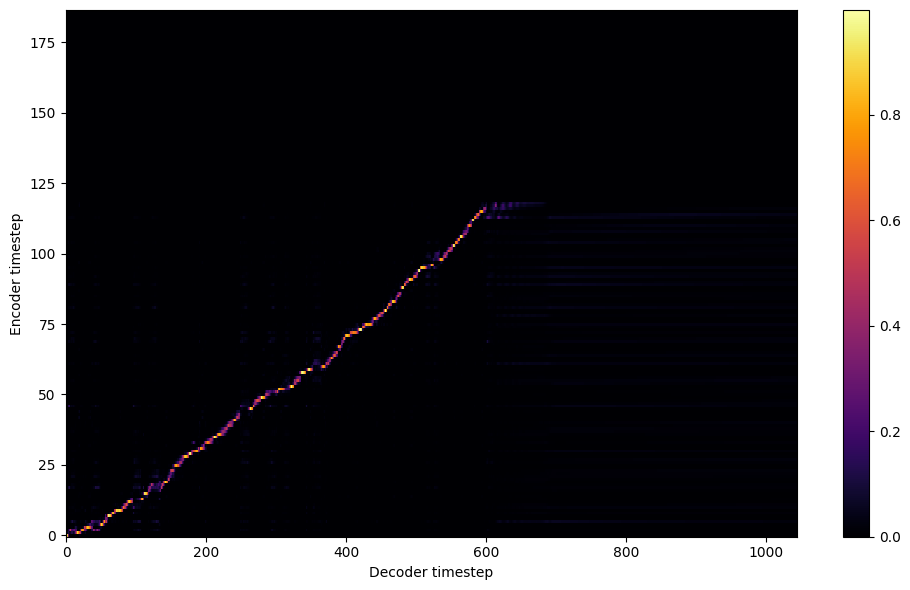


Starting Epoch: 209 Iteration: 836


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 209 Validation loss 840:  0.131557  Time: 0.4m LR: 0.000300


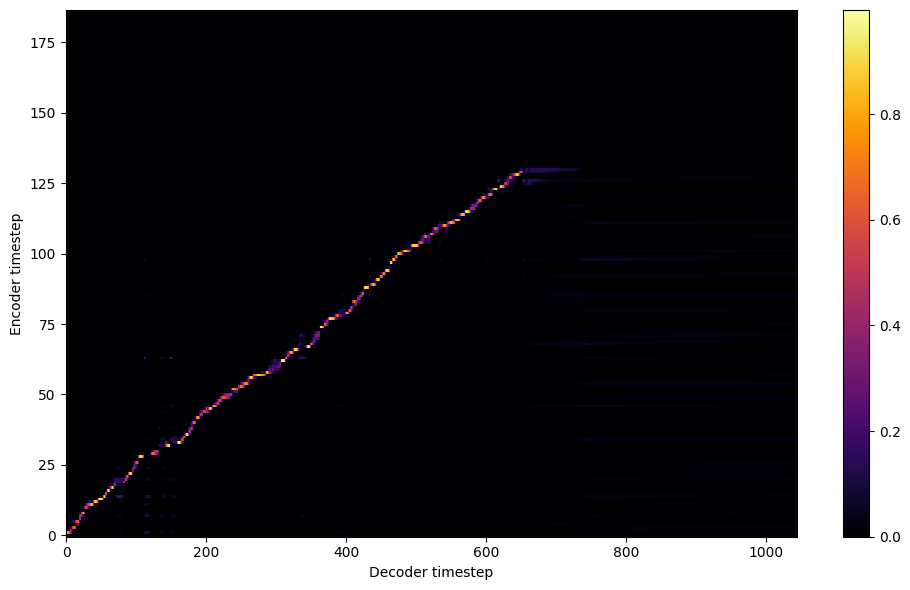

Saving model and optimizer state at iteration 840 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 210 Iteration: 840


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 210 Validation loss 844:  0.131019  Time: 0.4m LR: 0.000300


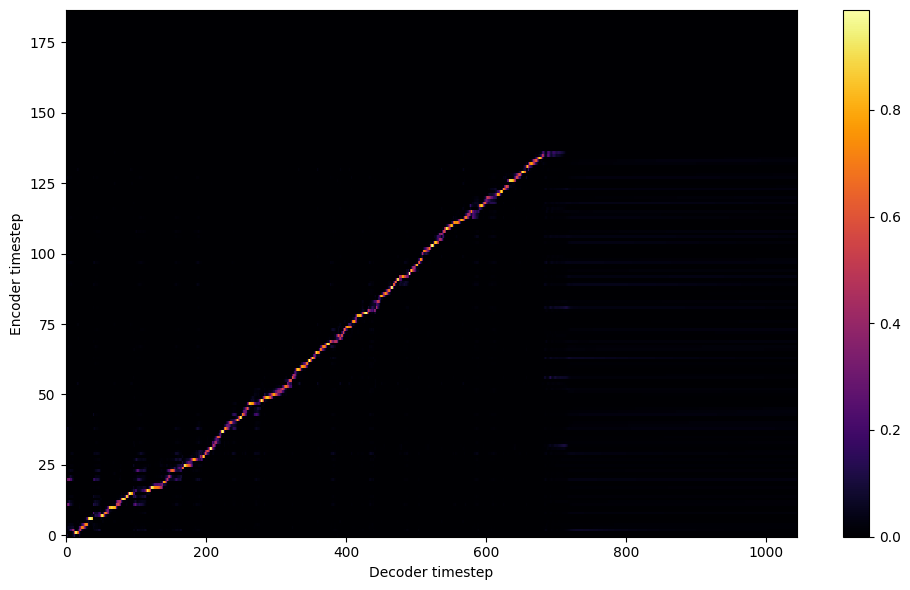


Starting Epoch: 211 Iteration: 844


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 211 Validation loss 848:  0.131007  Time: 0.4m LR: 0.000300


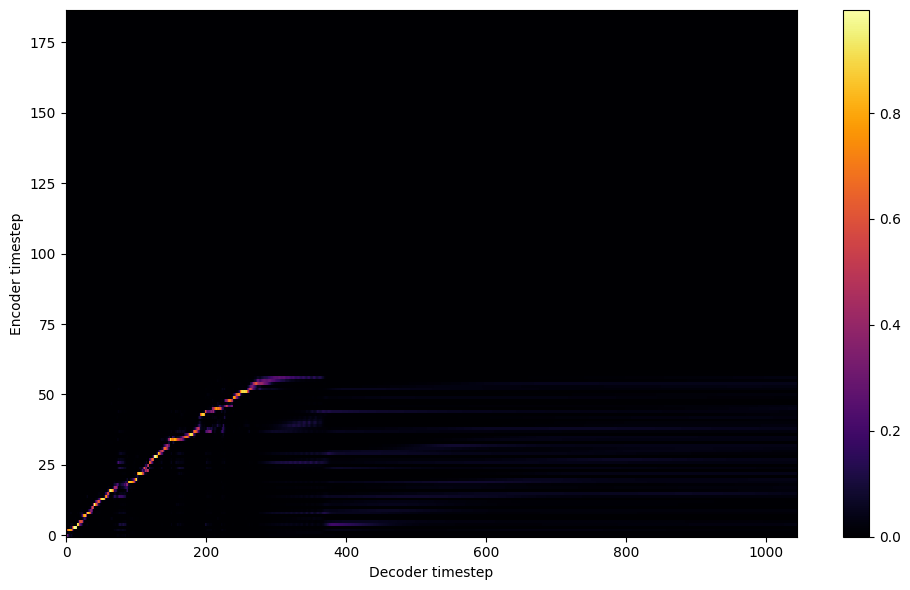


Starting Epoch: 212 Iteration: 848


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 212 Validation loss 852:  0.130332  Time: 0.4m LR: 0.000300


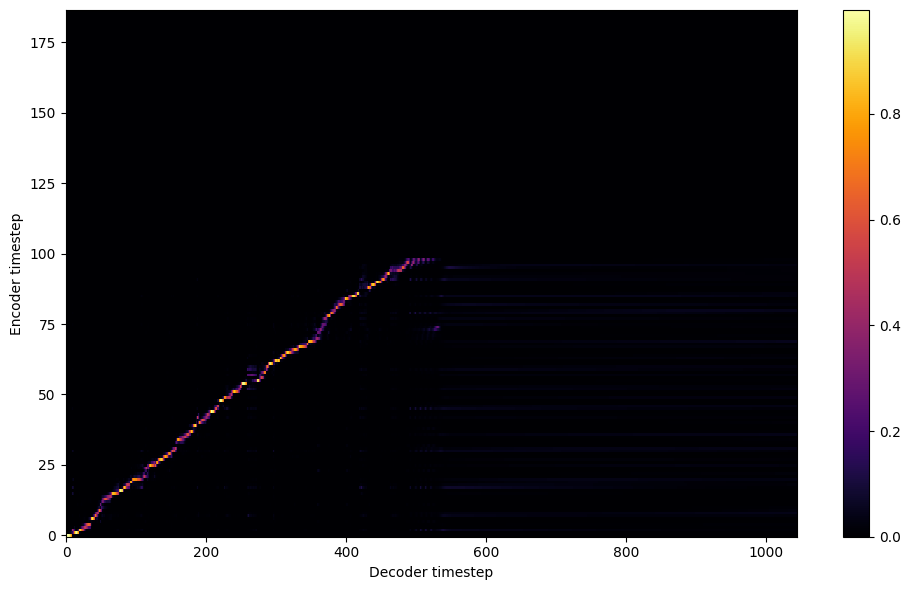


Starting Epoch: 213 Iteration: 852


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 213 Validation loss 856:  0.130043  Time: 0.4m LR: 0.000300


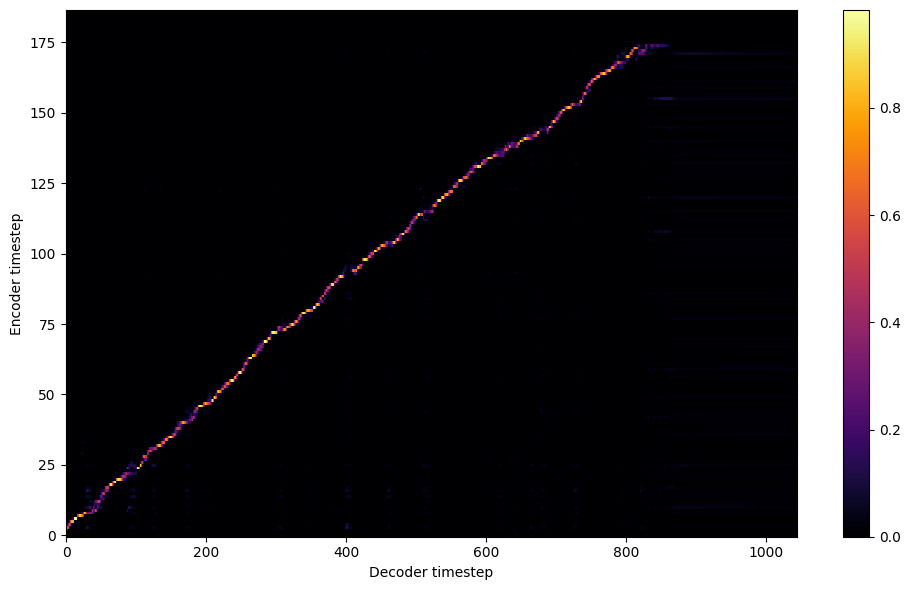


Starting Epoch: 214 Iteration: 856


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 214 Validation loss 860:  0.130139  Time: 0.5m LR: 0.000300


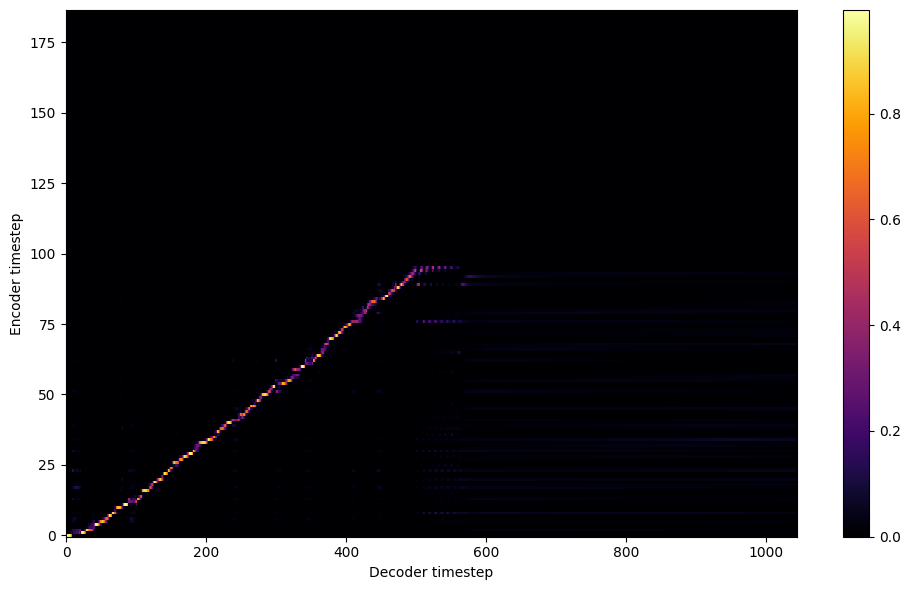


Starting Epoch: 215 Iteration: 860


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 215 Validation loss 864:  0.130298  Time: 0.4m LR: 0.000300


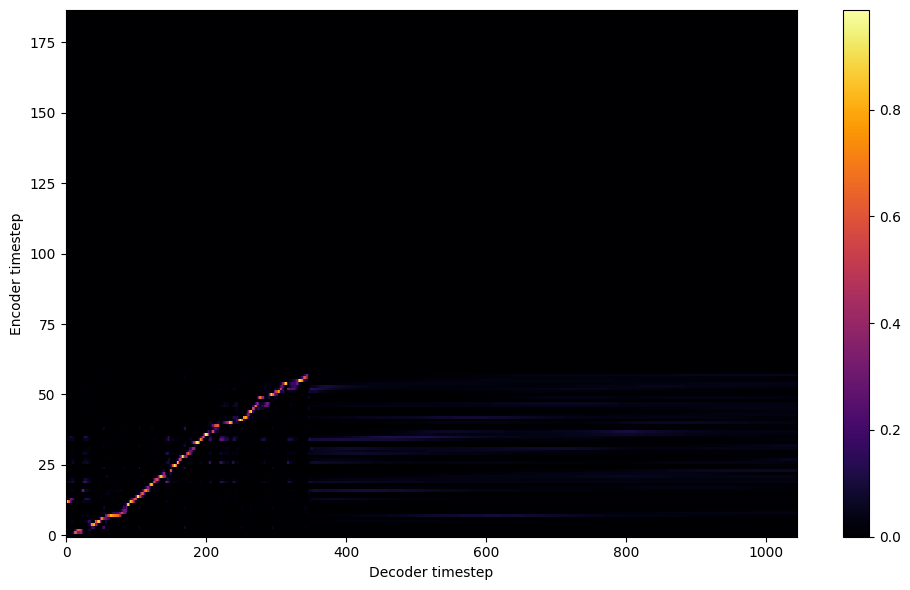


Starting Epoch: 216 Iteration: 864


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 216 Validation loss 868:  0.129480  Time: 0.4m LR: 0.000300


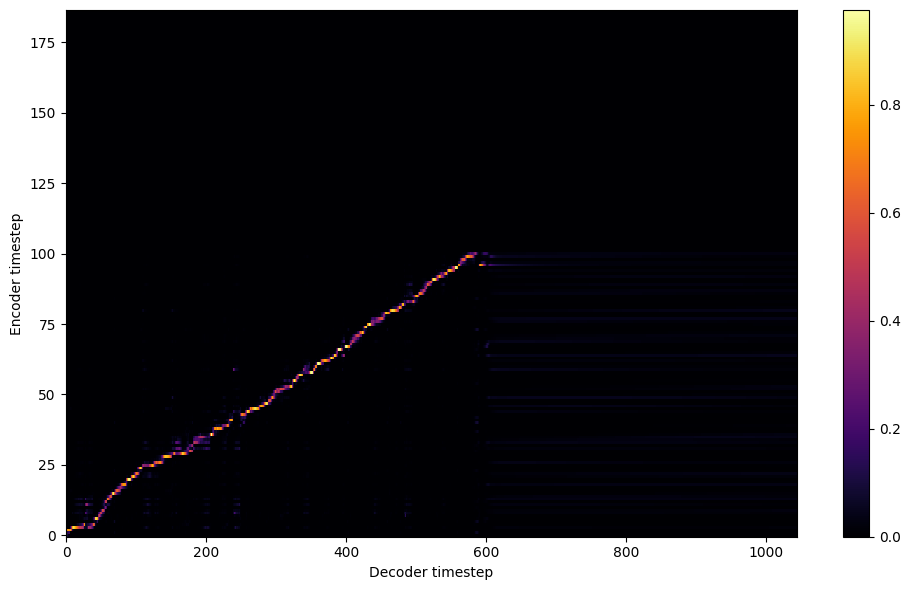


Starting Epoch: 217 Iteration: 868


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 217 Validation loss 872:  0.129747  Time: 0.4m LR: 0.000300


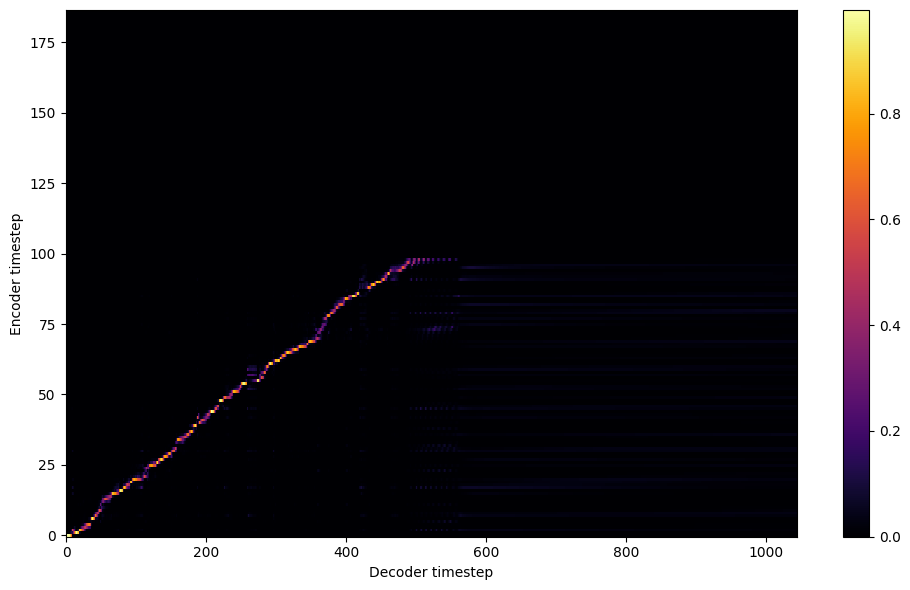


Starting Epoch: 218 Iteration: 872


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 218 Validation loss 876:  0.129061  Time: 0.4m LR: 0.000300


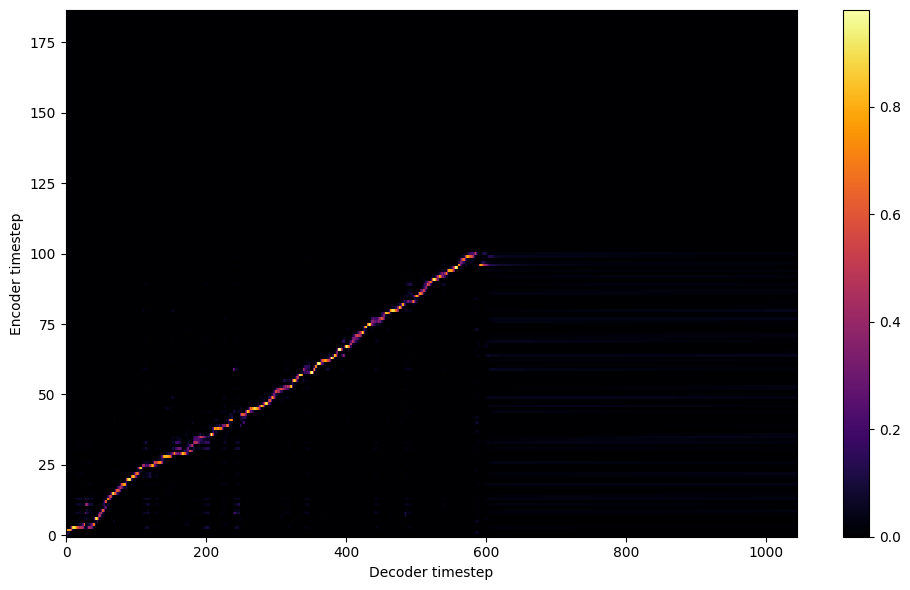


Starting Epoch: 219 Iteration: 876


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 219 Validation loss 880:  0.128731  Time: 0.4m LR: 0.000300


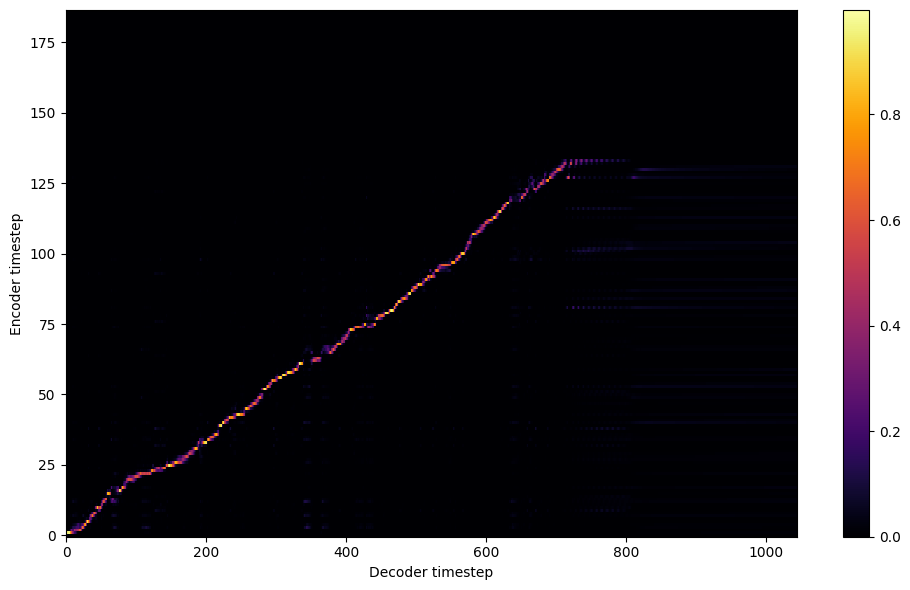

Saving model and optimizer state at iteration 880 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 220 Iteration: 880


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 220 Validation loss 884:  0.128610  Time: 0.4m LR: 0.000300


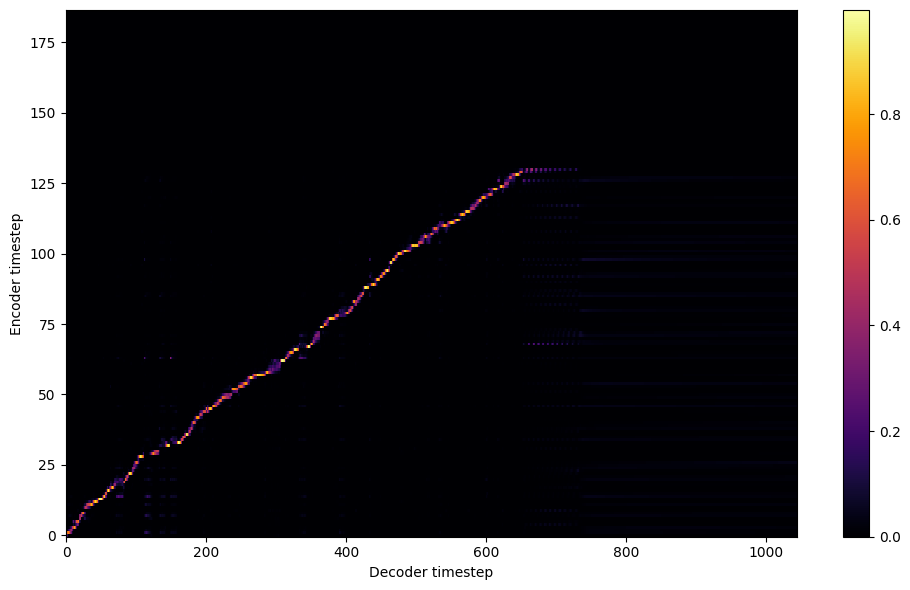


Starting Epoch: 221 Iteration: 884


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 221 Validation loss 888:  0.128174  Time: 0.4m LR: 0.000300


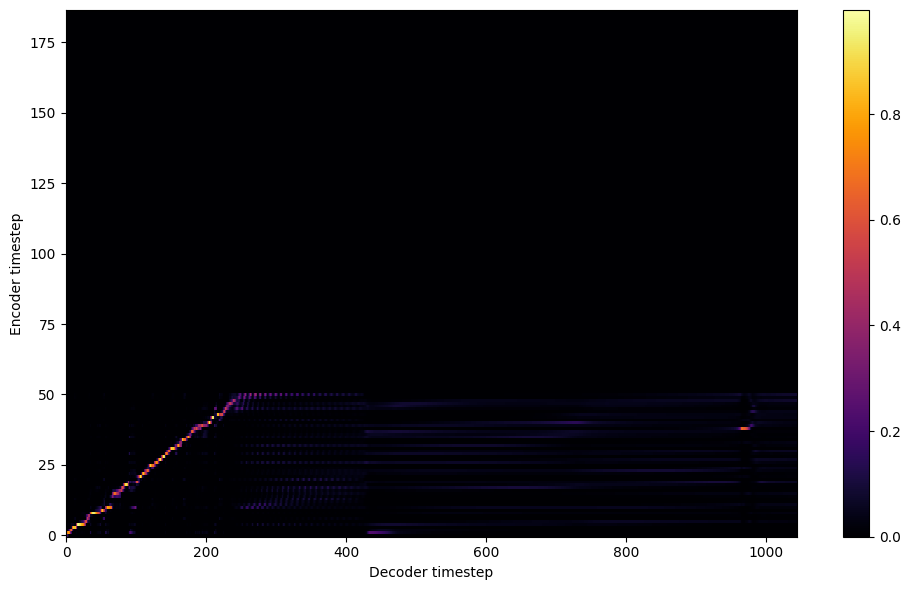


Starting Epoch: 222 Iteration: 888


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 222 Validation loss 892:  0.127678  Time: 0.4m LR: 0.000300


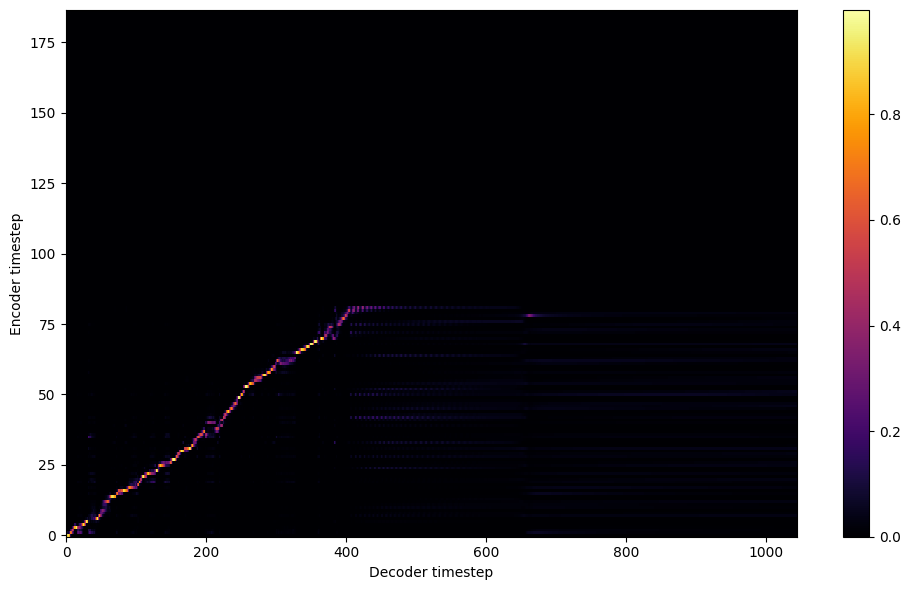


Starting Epoch: 223 Iteration: 892


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 223 Validation loss 896:  0.127338  Time: 0.4m LR: 0.000300


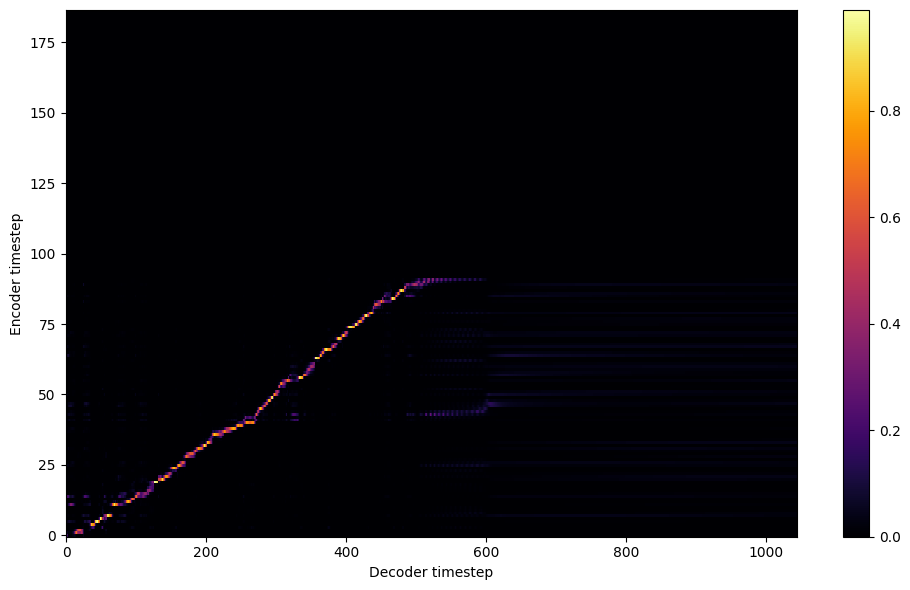


Starting Epoch: 224 Iteration: 896


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 224 Validation loss 900:  0.127366  Time: 0.4m LR: 0.000300


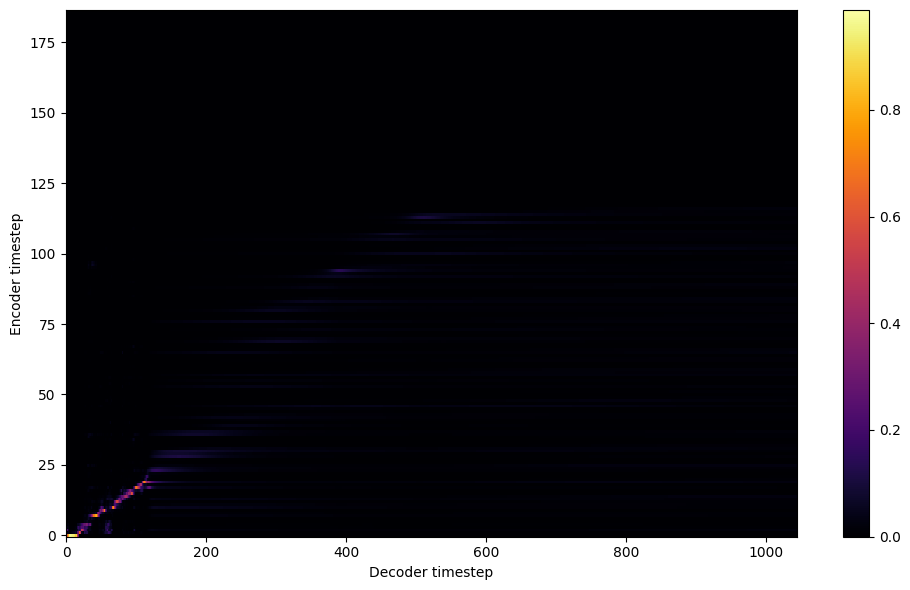


Starting Epoch: 225 Iteration: 900


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 225 Validation loss 904:  0.126812  Time: 0.4m LR: 0.000300


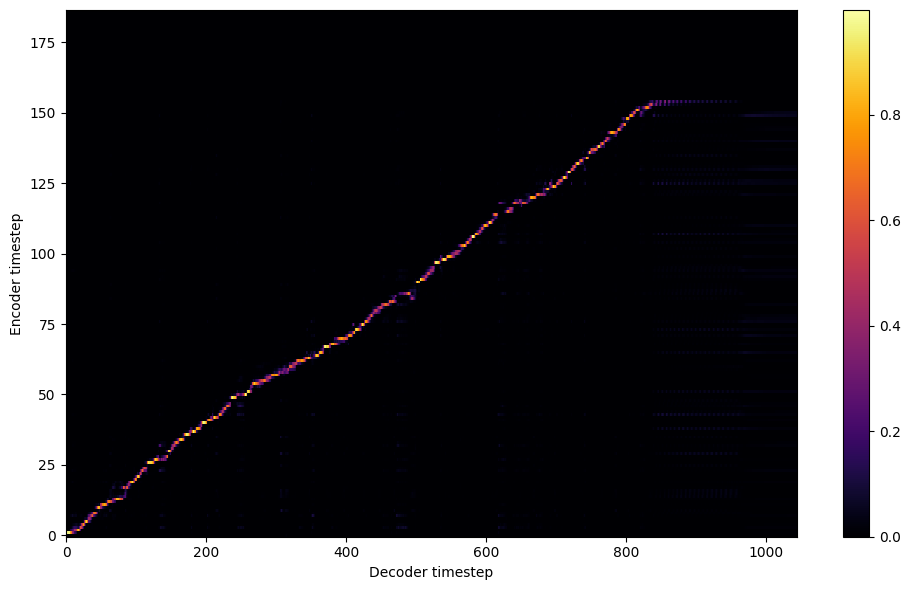


Starting Epoch: 226 Iteration: 904


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 226 Validation loss 908:  0.126618  Time: 0.4m LR: 0.000300


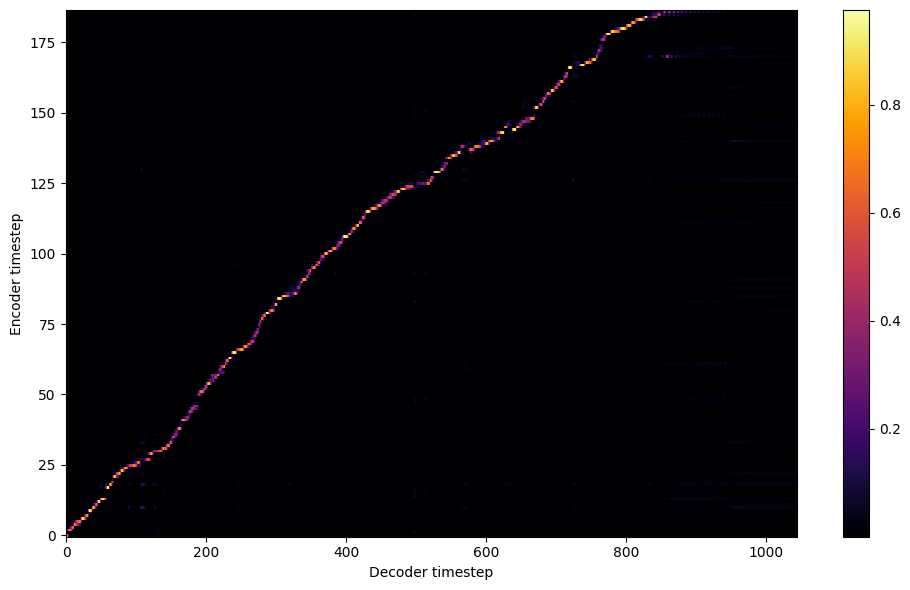


Starting Epoch: 227 Iteration: 908


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 227 Validation loss 912:  0.126377  Time: 0.4m LR: 0.000300


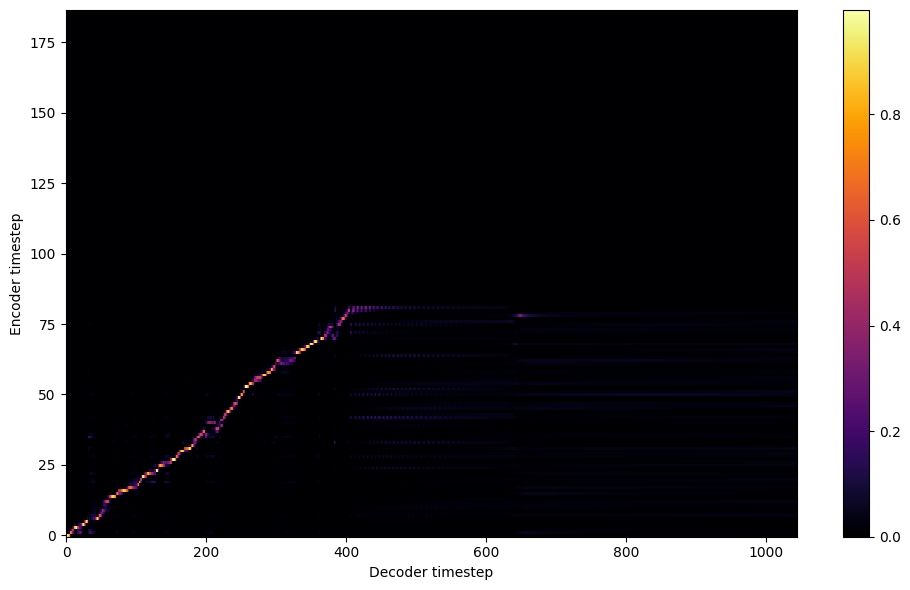


Starting Epoch: 228 Iteration: 912


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 228 Validation loss 916:  0.126004  Time: 0.4m LR: 0.000300


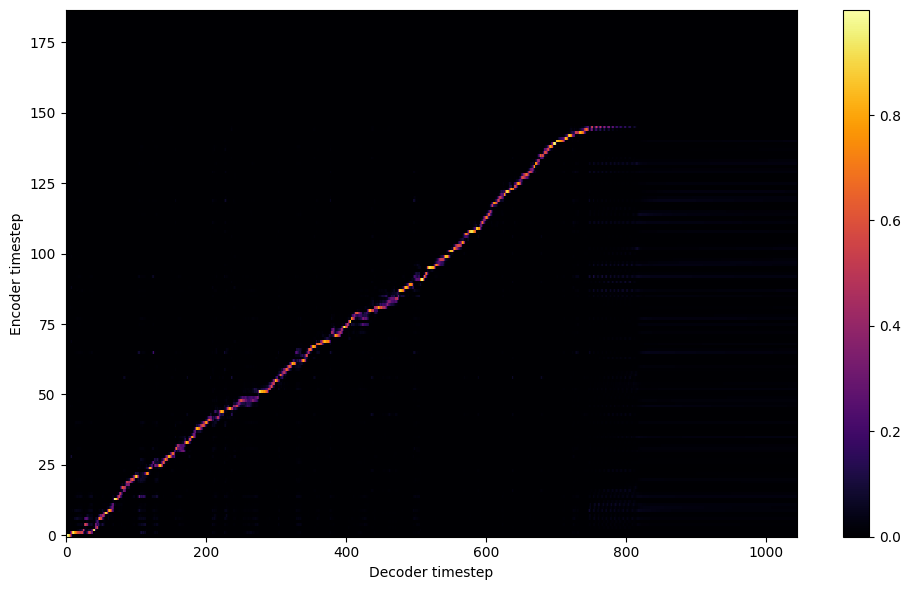


Starting Epoch: 229 Iteration: 916


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 229 Validation loss 920:  0.125657  Time: 0.4m LR: 0.000300


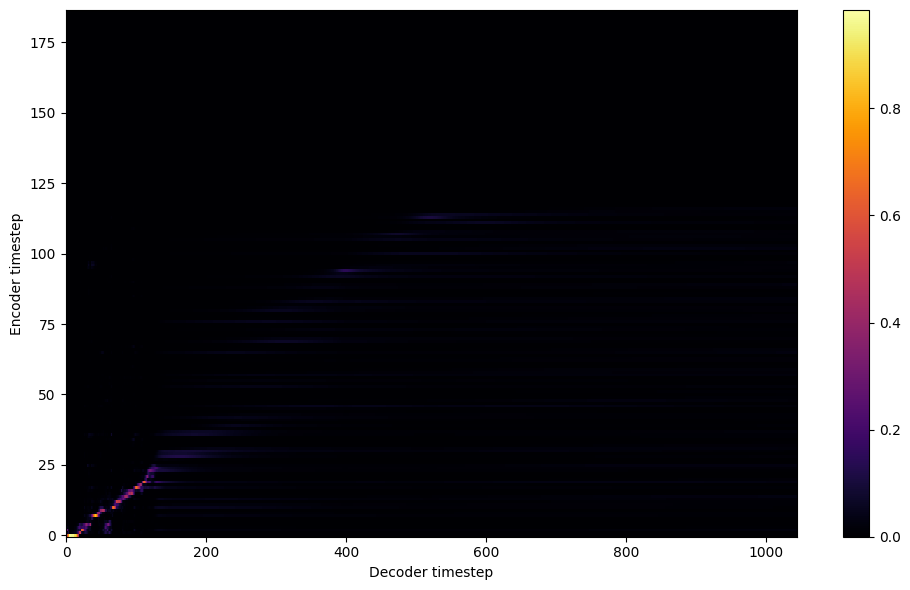

Saving model and optimizer state at iteration 920 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 230 Iteration: 920


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 230 Validation loss 924:  0.125580  Time: 0.4m LR: 0.000300


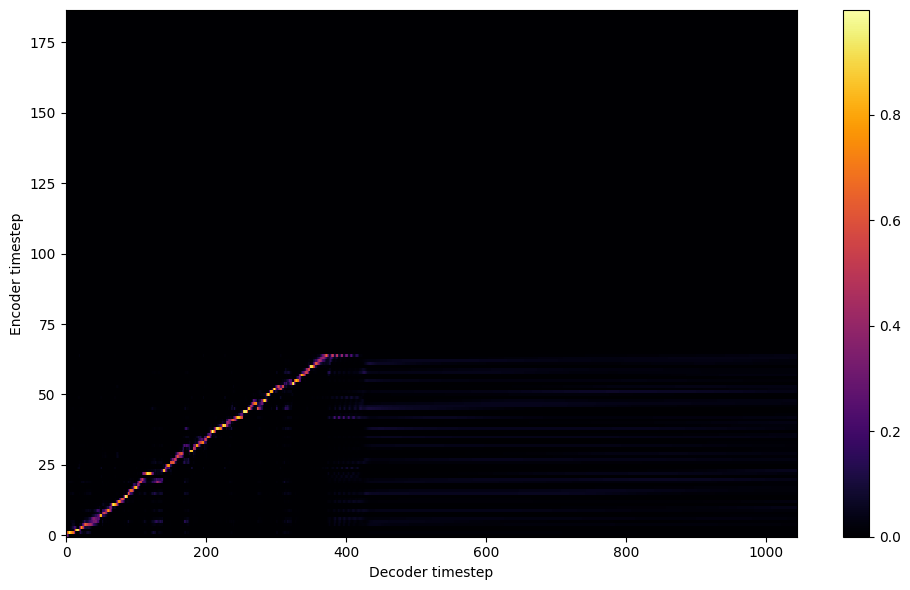


Starting Epoch: 231 Iteration: 924


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 231 Validation loss 928:  0.125056  Time: 0.4m LR: 0.000300


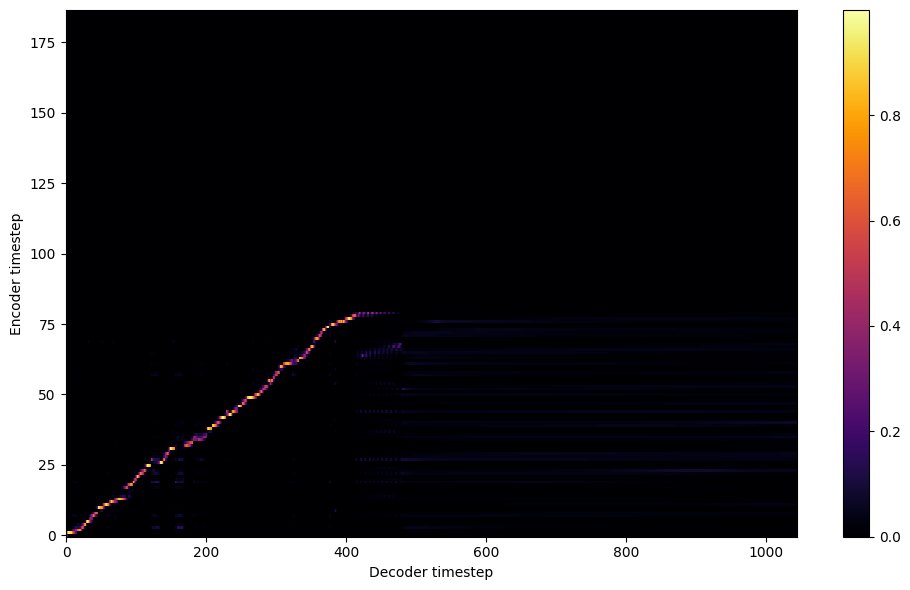


Starting Epoch: 232 Iteration: 928


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 232 Validation loss 932:  0.124778  Time: 0.4m LR: 0.000300


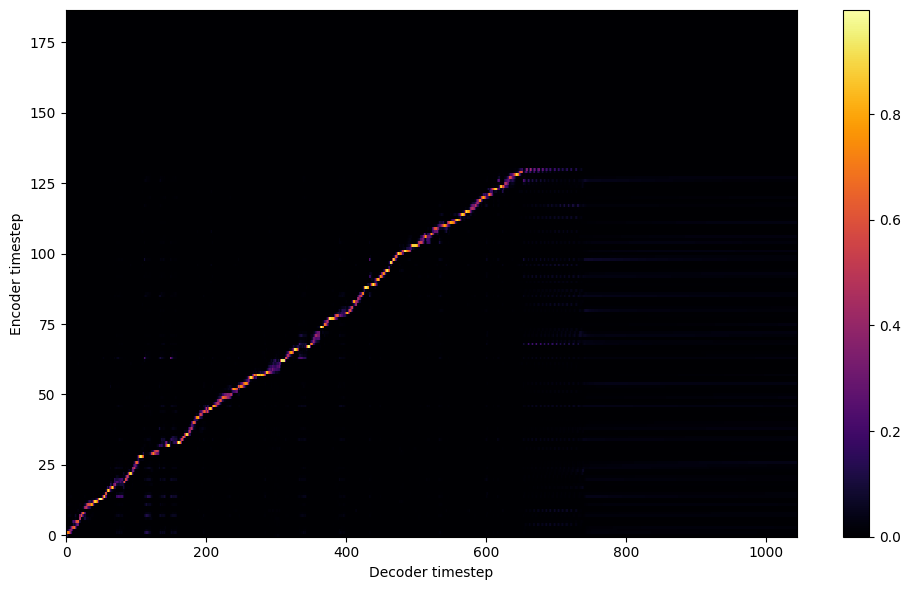


Starting Epoch: 233 Iteration: 932


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 233 Validation loss 936:  0.125079  Time: 0.4m LR: 0.000300


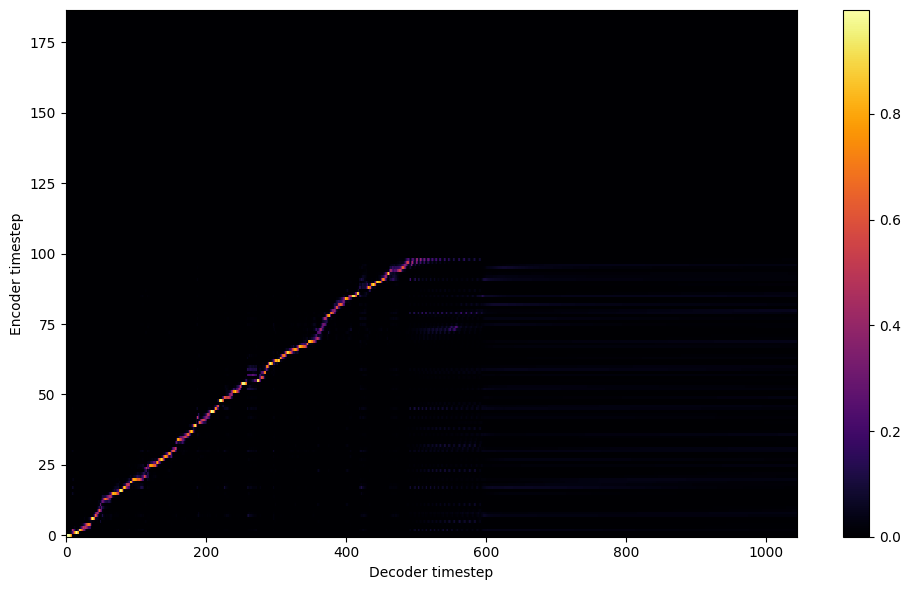


Starting Epoch: 234 Iteration: 936


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 234 Validation loss 940:  0.125635  Time: 0.4m LR: 0.000300


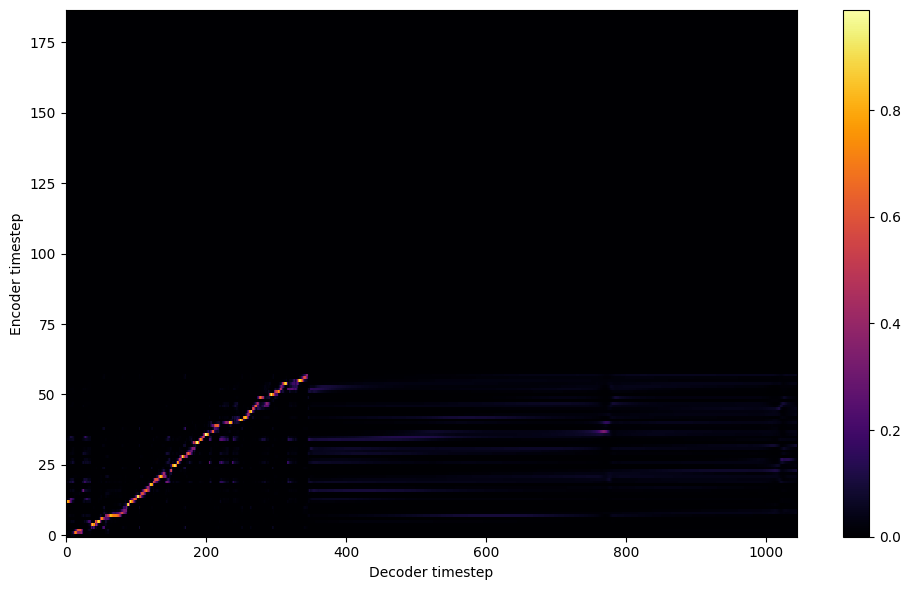


Starting Epoch: 235 Iteration: 940


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 235 Validation loss 944:  0.125509  Time: 0.4m LR: 0.000300


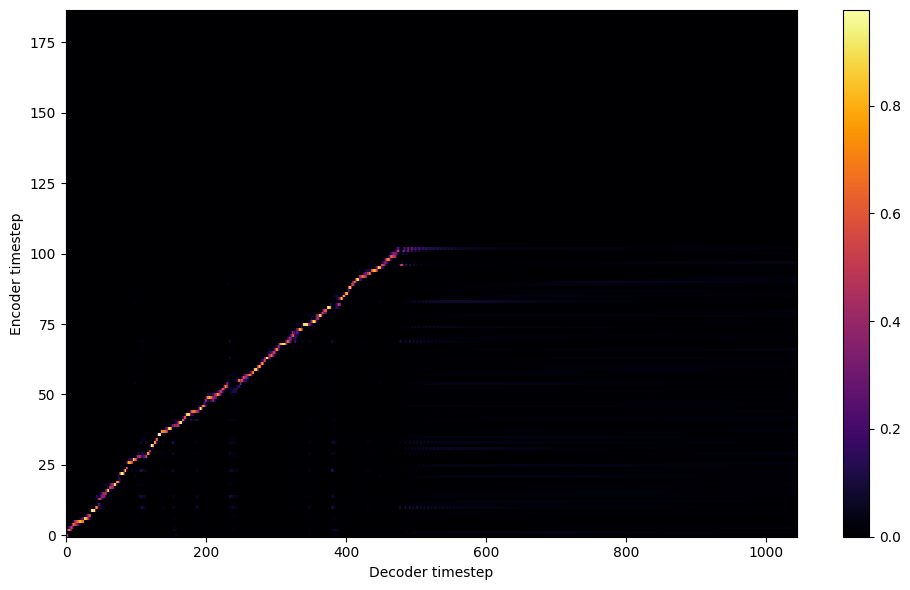


Starting Epoch: 236 Iteration: 944


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 236 Validation loss 948:  0.124466  Time: 0.4m LR: 0.000300


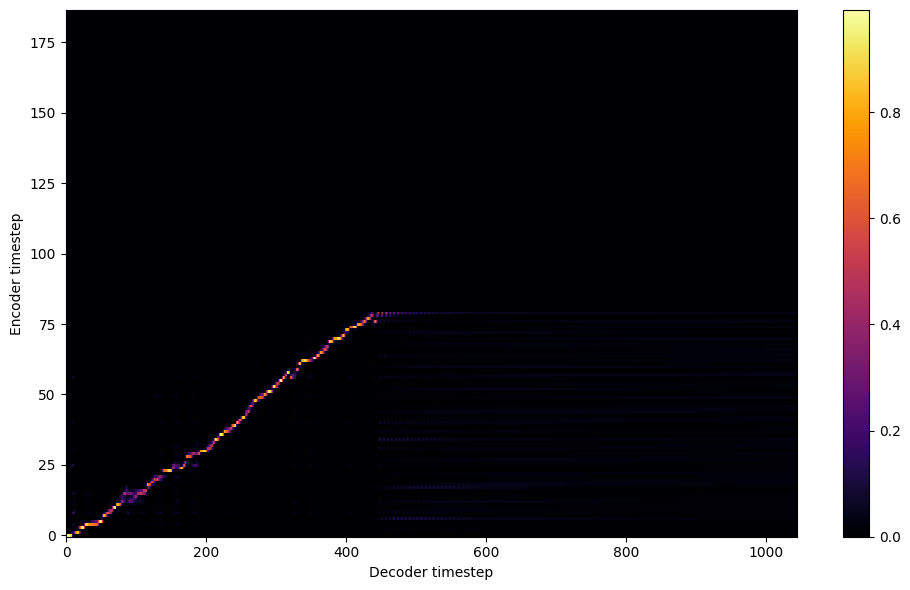


Starting Epoch: 237 Iteration: 948


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 237 Validation loss 952:  0.124241  Time: 0.4m LR: 0.000300


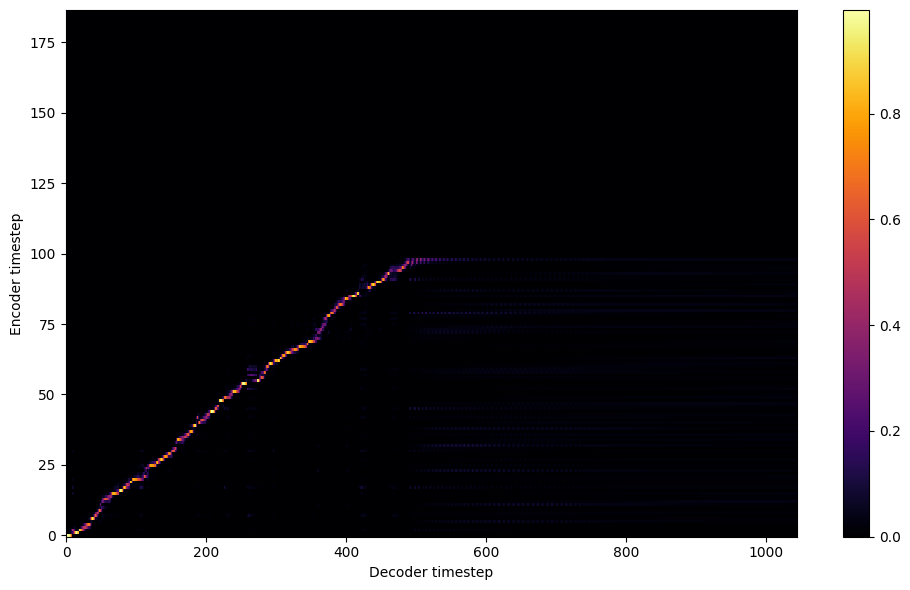


Starting Epoch: 238 Iteration: 952


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 238 Validation loss 956:  0.124231  Time: 0.4m LR: 0.000300


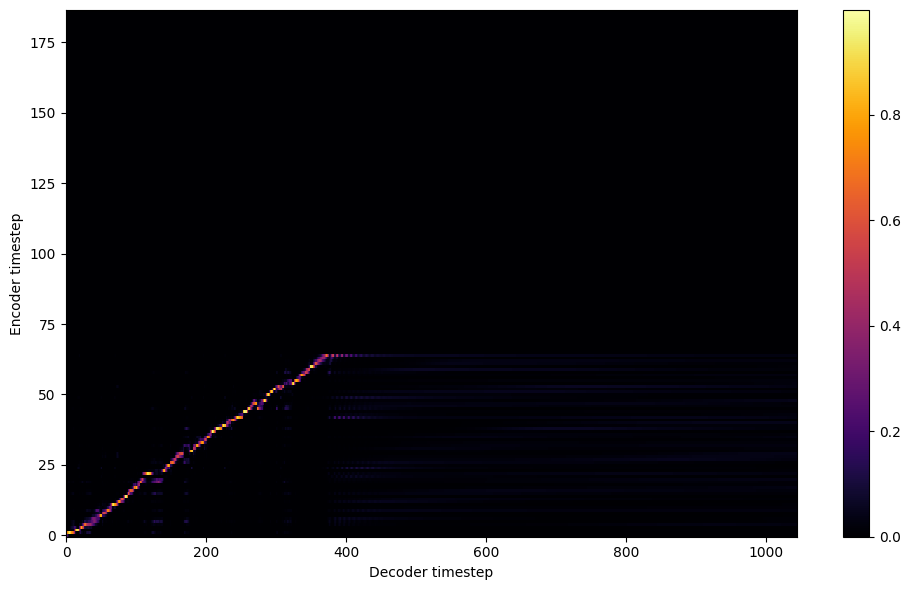


Starting Epoch: 239 Iteration: 956


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 239 Validation loss 960:  0.124465  Time: 0.4m LR: 0.000300


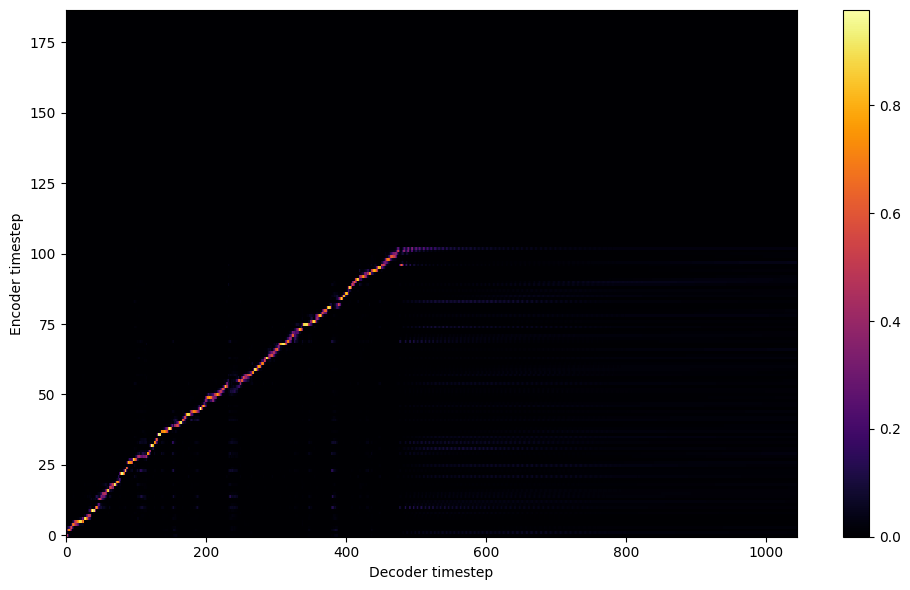

Saving model and optimizer state at iteration 960 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved

Starting Epoch: 240 Iteration: 960


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 240 Validation loss 964:  0.128792  Time: 0.4m LR: 0.000300


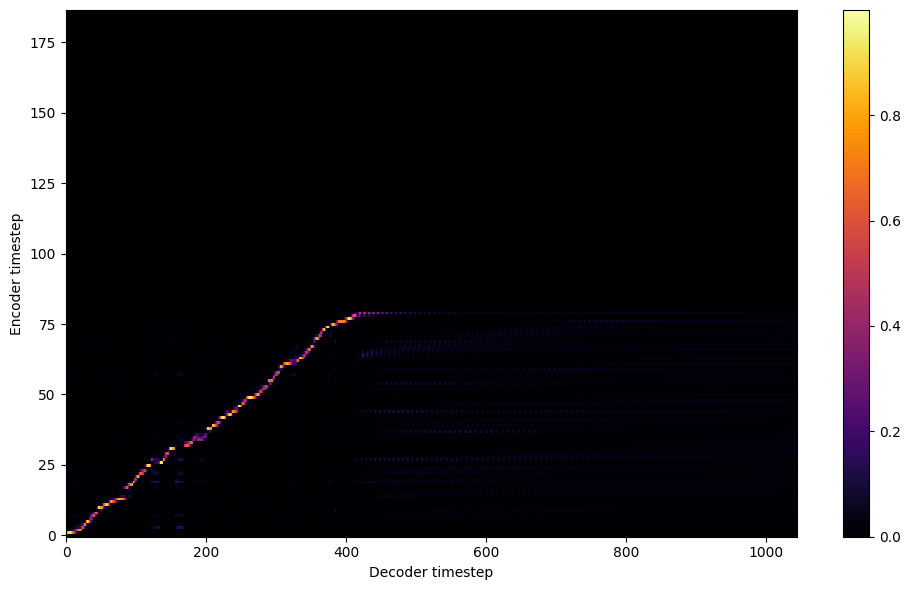


Starting Epoch: 241 Iteration: 964


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 241 Validation loss 968:  0.135942  Time: 0.4m LR: 0.000300


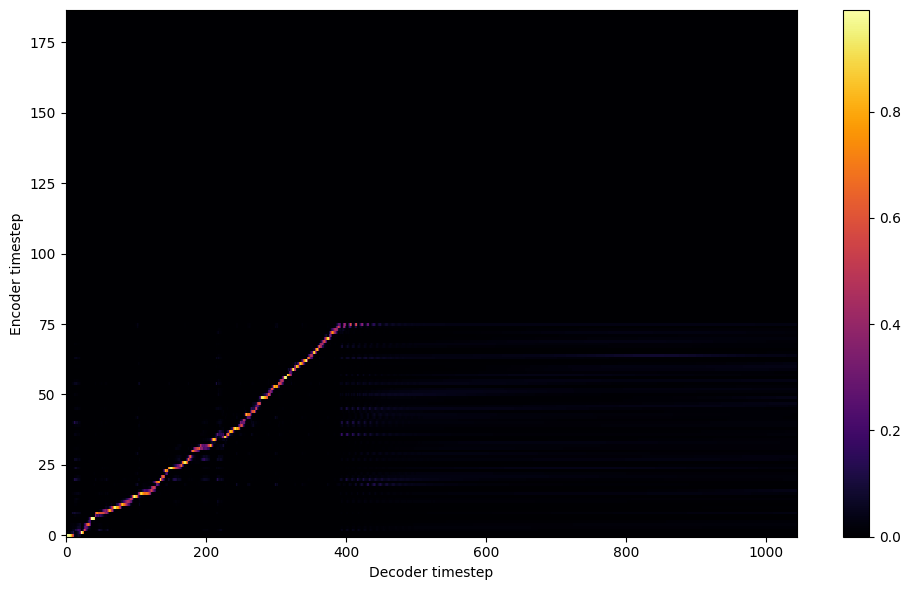


Starting Epoch: 242 Iteration: 968


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 242 Validation loss 972:  0.134078  Time: 0.4m LR: 0.000300


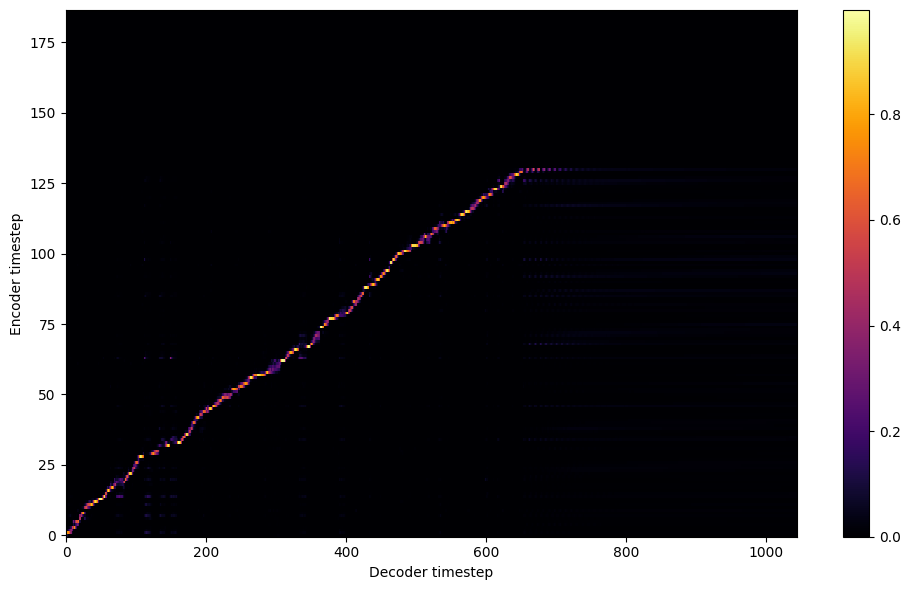


Starting Epoch: 243 Iteration: 972


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 243 Validation loss 976:  0.130903  Time: 0.4m LR: 0.000300


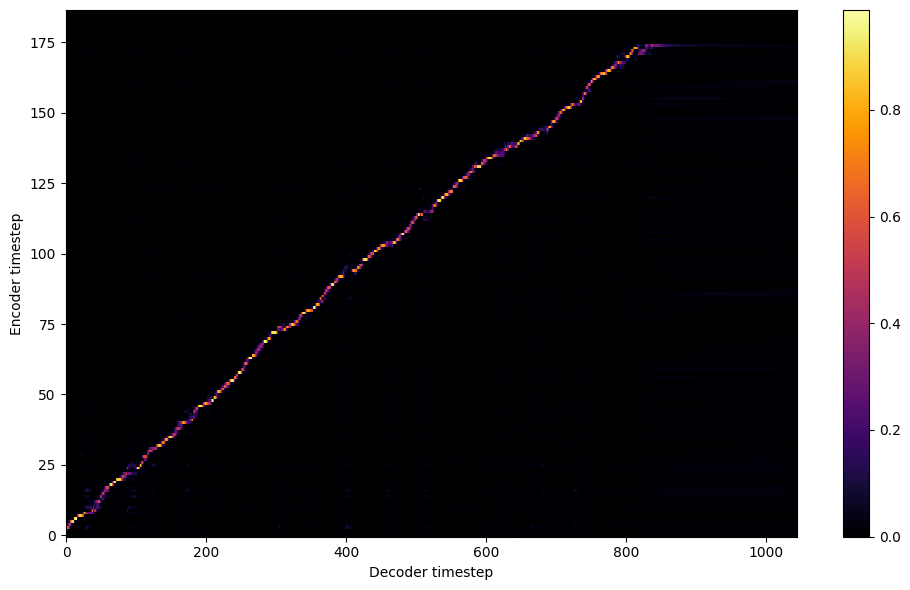


Starting Epoch: 244 Iteration: 976


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 244 Validation loss 980:  0.128880  Time: 0.4m LR: 0.000300


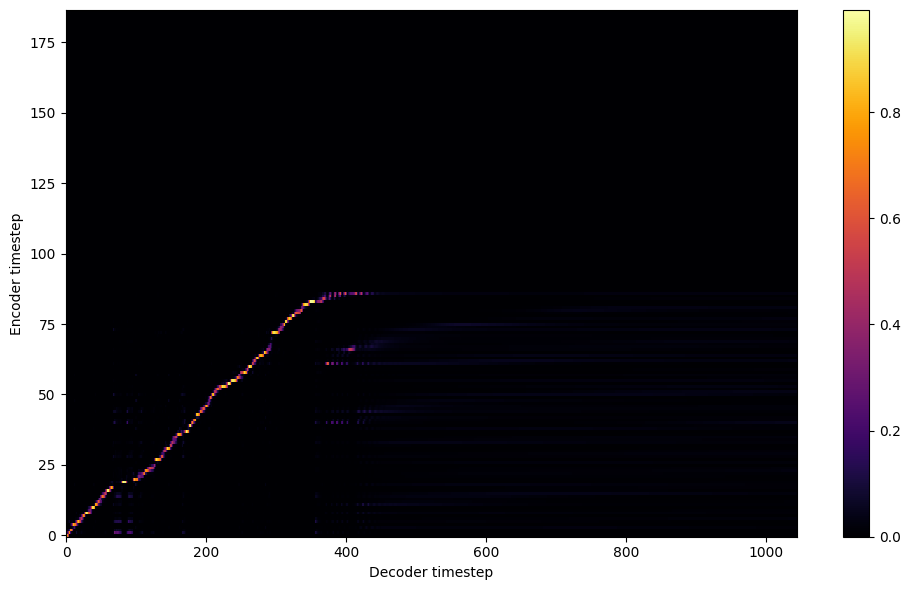


Starting Epoch: 245 Iteration: 980


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 245 Validation loss 984:  0.127720  Time: 0.4m LR: 0.000300


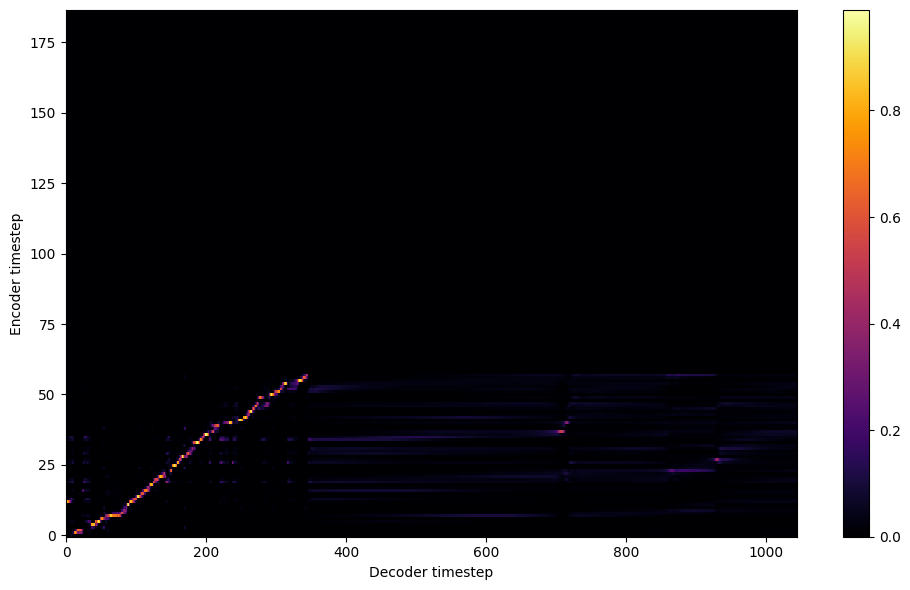


Starting Epoch: 246 Iteration: 984


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 246 Validation loss 988:  0.127267  Time: 0.4m LR: 0.000300


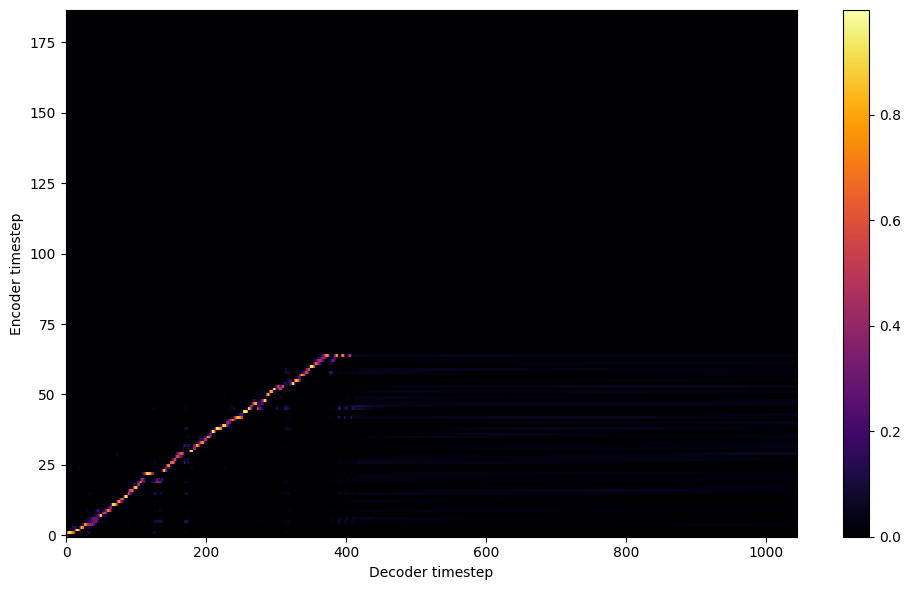


Starting Epoch: 247 Iteration: 988


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 247 Validation loss 992:  0.126412  Time: 0.4m LR: 0.000300


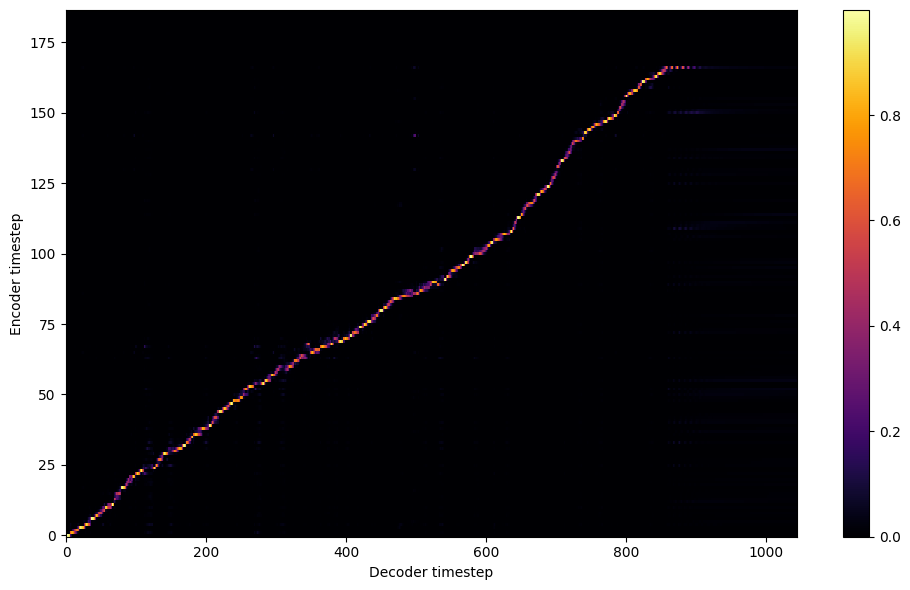


Starting Epoch: 248 Iteration: 992


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 248 Validation loss 996:  0.125930  Time: 0.4m LR: 0.000300


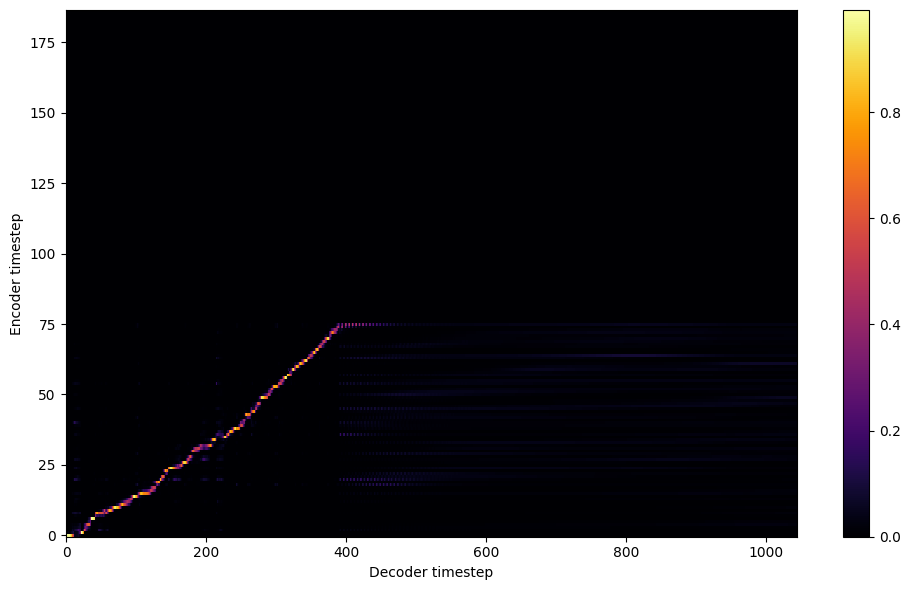


Starting Epoch: 249 Iteration: 996


  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 249 Validation loss 1000:  0.125690  Time: 0.4m LR: 0.000300


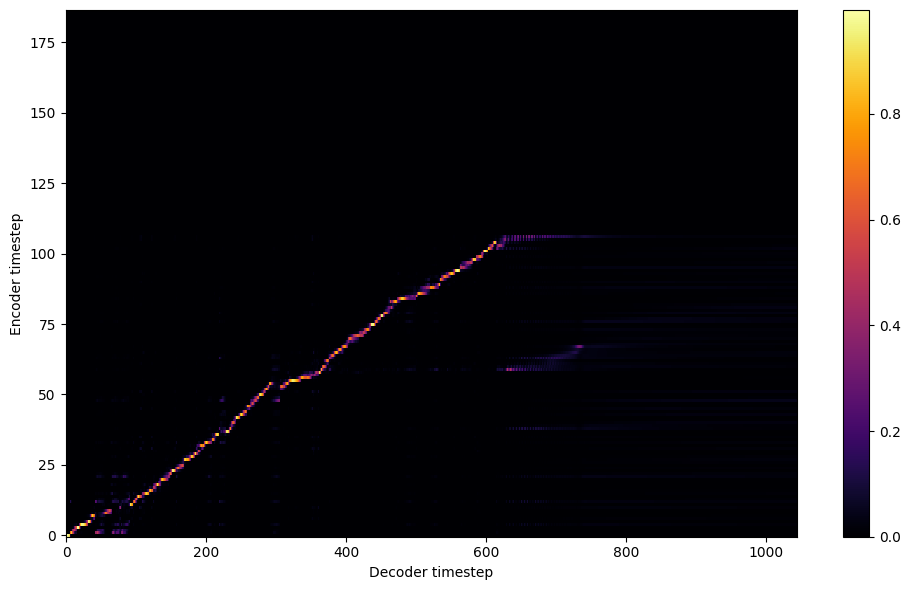

Saving model and optimizer state at iteration 1000 to /content/drive/MyDrive/colab/outdir/musab119
Model Saved


In [15]:
#@markdown # <font color="pink"> **8. Begin training.** 🏋️
#@markdown ___
#@markdown ### How often to save (number of epochs)
#@markdown `10` by default. Raise this if you're hitting a rate limit. If you're using a particularly large dataset, you might want to set this to `1` to prevent loss of progress.
save_interval =  10#@param {type: "integer"}
#
#@markdown ### How often to backup (number of epochs)
#@markdown `-1` (disabled) by default. This will save extra copies of your model every so often, so you always have something to revert to if you train the model for too long. This *will* chew through your Google Drive storage.
backup_interval =  -1#@param {type: "integer"}
#

print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)

# **Final notes**

## A good training looks like this:
![img.png](https://media.discordapp.net/attachments/835971020569051216/851469553355587614/download_2.png)
